# Traverse latent space between two points

In [1]:
import os
import numpy as np
from specvae.model import BaseModel
import specvae.dataset as dt
import specvae.utils as utils

In [2]:
# Parameters
dataset = "MoNA"
model_dirs = [
    "D:\\Workspace\\SpecVAE\\.model\\MoNA\\jointvae\\jointvae_20-800-200-50-3-50-200-800-20_01 (11-01-2022_23-10-10)",
    # "D:\\Workspace\\SpecVAE\\.model\\MoNA\\jointvae\\jointvae_20-800-200-50-3-50-200-800-20_01 (11-01-2022_23-10-10)",
    # "d:\\Workspace\\SpecVAE\\.model\\MoNA\\betavae_capacity_nextron\\betavae_capacity_20-400-100-3-400-20_02 (24-12-2021_03-34-34)",
    # "d:\\Workspace\\SpecVAE\\.model\\MoNA\\betavae_capacity_nextron\\betavae_capacity_20-1600-3-1600-20_03 (24-12-2021_00-17-31)",
    # "d:\\Workspace\\SpecVAE\\.model\\MoNA\\betavae_capacity_nextron\\betavae_capacity_20-800-3-800-20_04 (24-12-2021_00-25-10)",
    # "d:\\Workspace\\SpecVAE\\.model\\MoNA\\betavae_capacity_nextron\\betavae_capacity_20-100-3-90-100-20_05 (24-12-2021_03-01-19)",
    # "d:\\Workspace\\SpecVAE\\.model\\MoNA\\betavae_capacity_nextron\\betavae_capacity_50-400-3-100-400-50_06 (24-12-2021_06-19-49)"
]

## Load model

In [3]:
device, cpu = utils.device(use_cuda=False)

Device in use:  cpu


In [4]:
def load_model(path):
    model_path = os.path.join(path, 'model.pth')
    model = BaseModel.load(model_path, device)
    model.eval()
    return model

## Load and transform data

In [5]:
if dataset == 'MoNA':
    labels = ['ionization_mode_id', 'collision_energy', 'total_exact_mass', 'precursor_mz', 'instrument_id', 'instrument_type_id', 'precursor_type_id', 'superclass_id', 'class_id']
    base_path = utils.get_project_path() / '.data' / 'MoNA'
    metadata_path = base_path / 'MoNA_meta.npy'
elif dataset == 'HMDB':
    labels = ['ionization_mode_id', 'collision_energy', 'superclass_id', 'class_id']
    base_path = utils.get_project_path() / '.data' / 'HMDB'
    metadata_path = base_path / 'HMDB_meta.npy'

metadata = None
if os.path.exists(metadata_path):
    metadata = np.load(metadata_path, allow_pickle=True).item()

df_all = dt.Spectra.open(base_path / 'MoNA_full.csv')

In [6]:
def load_vis_data(target_column):
    data_path = base_path / ('visualization_%s.csv' % target_column)
    df = dt.Spectra.open(data_path)
    return df

In [7]:
def preload_data_as_tensor(model, df):
    columns = model.config['input_columns']
    types = model.config['types']
    data = dt.Spectra.preload_tensor(
        device=device, data_frame=df[columns + ['id']], transform=model.transform, limit=-1, types=types, do_print=False)
    return data

In [8]:
def evaluate_model(model, df, data):
    print("Encode N=%d instances from %s dataset..." % (data['id'].shape[0], dataset))
    X, ids = data['spectrum'], data['id'] # TODO: handle the case for concatanated input
    Xrecon, z, latent_dist = model.forward_(X)
    print(z.shape)
    data_np = {}
    data_np['X'] = X.data.cpu().numpy()
    data_np['Xrecon'] = Xrecon.data.cpu().numpy()
    data_np['z'] = z.data.cpu().numpy()
    data_np['ids'] = ids
    data_np['ionization_mode_id'] = df['ionization_mode_id'].to_numpy()
    data_np['collision_energy'] = df['collision_energy'].to_numpy()
    if 'instrument_type' in df:
        data_np['instrument_type'] = df['instrument_type'].to_numpy()
    # data_np['images'] = df['images'].to_numpy()
    return data_np


## Prepare data for vizualization

In [9]:
import torch
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(style='white', context='notebook', rc={'figure.figsize':(24,20)})

import torchvision as tv
import specvae.vae as vae, specvae.utils as utils
import plotly.io as pio
pio.renderers.default='notebook'
import plotly.express as px
import pandas as pd

In [10]:
def get_colors(df, data_np):
    colors = {}
    colors['ionization_mode_id'] = np.array(list(map(lambda x: 'negative' if x==0 else 'positive', data_np['ionization_mode_id'].tolist())))
    colors['collision_energy'] = data_np['collision_energy']
    colors['superclass_id'] = df['superclass'].to_numpy()
    df['class'] = df['class'].fillna('Undefined')
    colors['class_id'] = df['class'].to_numpy()
    if dataset == 'MoNA':
        df['precursor_type'] = df['precursor_type'].fillna('Undefined')
        colors['precursor_type_id'] = df['precursor_type'].to_numpy()
        df['instrument_type'] = df['instrument_type'].fillna('Undefined')
        colors['instrument_type_id'] = df['instrument_type'].to_numpy()
        df['instrument'] = df['instrument'].fillna('Undefined')
        colors['instrument_id'] = df['instrument'].to_numpy()
        colors['total_exact_mass'] = df['total_exact_mass'].to_numpy()
        colors['precursor_mz'] = df['precursor_mz'].to_numpy()
    return colors

In [11]:
def compute_pca(data, n=2):
    print("Compute PCA for n_components=%d" % n)
    red = PCA(n)
    rdata = red.fit_transform(data)
    print("\t      explained_variance:", red.explained_variance_)
    print("\texplained_variance_ratio:", red.explained_variance_ratio_)
    return rdata, red

def compute_tsne(data, n=2):
    print("Compute tSNE for n_components=%d" % n)
    r = TSNE(n)
    rdata = r.fit_transform(data)
    print("TSNE:")
    print("\t      kl_divergence:", r.kl_divergence_)
    return rdata

def plot_data(data, labels=None, label_name=None, plot_components=2, 
        hover_data=None, width=1000, height=1000, title='Visualization of dataset'):
    if plot_components == 2:
        fig = px.scatter(data, x=0, y=1, color=labels, 
            template='plotly_white', hover_data=hover_data,
            title=title, width=width, height=height)
        fig.show()
    elif plot_components == 3:
        fig = px.scatter_3d(data, x=0, y=1, z=2, color=labels, 
            template='plotly_white', hover_data=hover_data, 
            title=title, width=width, height=height)
        fig.update_traces(
            marker=dict(size=3),
            selector=dict(mode='markers'))
        fig.show()

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def plot_latent(x, y, color, scale_size=1., cmap='BrBG_r', alpha=0.8, 
    figsize=(10, 10), dpi=100, xlabel='X', ylabel='Y', xlim=None, ylim=None):
    fig = plt.figure(figsize=figsize, dpi=dpi)
    gs = fig.add_gridspec(2, 3,  width_ratios=(2, 14, 1), height_ratios=(14, 2),
        left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.05, hspace=0.05)
    ax_main = plt.subplot(gs[0, 1])
    ax_xDist = plt.subplot(gs[1, 1], sharex=ax_main)
    ax_yDist = plt.subplot(gs[0, 0], sharey=ax_main)
    ax_cbar = plt.subplot(gs[0, 2])

    sc = ax_main.scatter(x, y, s=scale_size, marker='.', c=color, cmap=cmap, alpha=alpha, edgecolors='black', linewidth=0.1)
    ax_main.xaxis.set_major_locator(plt.MaxNLocator(10))
    ax_main.yaxis.set_major_locator(plt.MaxNLocator(10))
    ax_main.set_xlim(xlim)
    ax_main.set_ylim(ylim)

    cbar = fig.colorbar(sc, cax=ax_cbar)
    cbar.ax.tick_params(labelsize=14)
    cbar.ax.yaxis.set_major_locator(plt.MaxNLocator(10))
    cbar.set_alpha(1.0)
    cbar.draw_all()

    ax_xDist.hist(x, bins=100, align='mid', density=True, lw=0.2)
    ax_xDist.set(xlabel=xlabel)
    ax_xCumDist = ax_xDist.twinx()
    ax_xCumDist.hist(x, bins=100, cumulative=True, histtype='step', density=True, color='r', align='mid')
    ax_xCumDist.tick_params('y', colors='r')
    ax_xCumDist.set_ylabel('cumulative',color='r')

    ax_yDist.hist(y, bins=100, orientation='horizontal', align='mid', density=True, lw=0.2)
    ax_yDist.set(ylabel=ylabel)
    ax_yCumDist = ax_yDist.twiny()
    ax_yCumDist.hist(y,bins=100,cumulative=True,histtype='step',density=True,color='r',align='mid',orientation='horizontal')
    ax_yCumDist.tick_params('x', colors='r')
    ax_yCumDist.set_xlabel('cumulative',color='r')

    plt.setp(ax_main.get_xticklabels(), visible=False)
    plt.setp(ax_main.get_yticklabels(), visible=False)
    return fig, ax_main

In [13]:
from specvae import visualize as vis
def vis_spectra(data, label, color='red', config=None):
    mode_pos = data.copy().sort_values(by=[label])
    print(mode_pos.shape)
    fig = None
    if mode_pos.shape[0] > 0:
        height, width = 1, mode_pos.shape[0]
        fig, axs = plt.subplots(1, width, figsize=(width * 7, 5))
        for i, ((inx, row), ax) in enumerate(zip(mode_pos.iterrows(), axs.flat)):
            vis.plot_spectrum(row['spectrum'], name='', meta={
                'idvis': row['idvis'],
                'ionization mode': row['ionization_mode_id'], 
                'collision energy': row['collision_energy']
            }, ax=ax, config=config, color=color)
        plt.show()
    return fig


In [14]:
from specvae import visualize as vis
def vis_spectra_mode(data, label, config=None):
    mode_pos = data[data['ionization_mode_id'] == 1].copy().sort_values(by=[label])
    mode_neg = data[data['ionization_mode_id'] == 0].copy().sort_values(by=[label])
    print(mode_pos.shape)
    print(mode_neg.shape)

    if mode_pos.shape[0] > 0:
        height, width = 1, mode_pos.shape[0]
        fig, axs = plt.subplots(1, width, figsize=(width * 7, 5))
        for i, ((inx, row), ax) in enumerate(zip(mode_pos.iterrows(), axs.flat)):
            vis.plot_spectrum(row['spectrum'], name='', meta={
                'ionization mode': row['ionization_mode_id'], 
                'collision energy': row['collision_energy']
            }, ax=ax, config=config)
        plt.show()

    if mode_neg.shape[0] > 0:
        height, width = 1, mode_neg.shape[0]
        fig, axs = plt.subplots(1, width, figsize=(width * 7, 5))
        for i, ((inx, row), ax) in enumerate(zip(mode_neg.iterrows(), axs.flat)):
            vis.plot_spectrum(row['spectrum'], name='', meta={
                'ionization mode': row['ionization_mode_id'], 
                'collision energy': row['collision_energy']
            }, ax=ax, config=config)
        plt.show()

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as pch
import matplotlib.ticker as tck
from matplotlib.lines import Line2D
from itertools import cycle, product
import itertools as it
from functools import reduce

def dicrete_plot(
    X, ys, color=None, 
    X_sel=None, ys_sel=None, color_sel=None, meta_sel=None, 
    labels=None, kind='hist', index_prefix='Var ',
    sunith=1.0, unith=1.0, unitv=0.5, scale=1.0, border=2.0, legend_offset=1.0, 
    enable_minor_grid=True, set_ylim=True, xlim=(-10, 10), ylim=(0, 1.5)):
    # Initial assertions:
    # ...
    # Extract labels:
    mx_, mn_ = 0., 0.
    if color is not None:
        mx_, mn_ = np.max(color), np.min(color)
        print('min, max:', mn_, mx_)

    _labels = {i: list(range(1, y.shape[1] + 1)) for i, y in enumerate(ys)}
    height = np.prod([len(l) for k, l in _labels.items()])
    # Specify GridSpec:
    widths = np.array([sunith] * len(_labels) + [6*unith])
    heights = np.array([unitv] * height + [legend_offset*unitv])
    gs_kw = dict(width_ratios=widths, height_ratios=heights)
    fig, axs = plt.subplots(
        ncols=len(widths), nrows=len(heights), subplot_kw=dict(frameon=False),
        constrained_layout=False, gridspec_kw=gs_kw, 
        figsize=(scale * widths.sum(), scale * heights.sum()))
    # Define color mappings:
    from matplotlib.cm import get_cmap
    cmaps = cycle(['Purples', 'Reds', 'Blues', 'Oranges', 'Greens', ])
    def map_disc_(items, cmap_name):
        cmap_ = get_cmap(cmap_name)
        inter_ = 0.3
        slope_ = (1. - inter_) / len(items)
        return {value: cmap_(inter_ + items.index(value) * slope_) for value in items}
    colors = {label: map_disc_(items, cmap_name) \
        for (label, items), cmap_name in zip(_labels.items(), cmaps)}
    labels_ = list(product(*list(_labels.values())))
    for r, row in enumerate(axs):
        for c, ax in enumerate(row):
            for _, spine in ax.spines.items():
                spine.set_visible(False)
            if r == len(axs) - 1:
                ax.set(xticks=[], yticks=[])
                ax.patch.set_alpha(0.)
                continue
            if c < len(_labels):
                ax.set(xticks=[], yticks=[])
                var_name = c
                var_value = labels_[r][c]
                # print(var_name)
                ax.add_patch(pch.Rectangle((0., 0.), unith, unitv, 
                    facecolor=colors[var_name][var_value], edgecolor='black', label=var_value, zorder=500))
                for _, spine in ax.spines.items():
                    spine.set_linewidth(border)
            else:
                ax.set_xlim(xlim)
                if set_ylim:
                    ax.set_ylim(ylim)
                ax.set(yticks=[])
                # ax.tick_params(grid_linestyle='solid', color='grey', zorder=0)
                if enable_minor_grid:
                    ax.tick_params(which='minor', grid_linestyle='dashed', grid_dashes=(3, 6), color='grey', zorder=0)
                    ax.xaxis.set_minor_locator(tck.AutoMinorLocator())
                # ax.grid(which='both')
                if r < len(axs) - 2:
                    ax.tick_params(labelbottom=False, length=10)
                if r == len(axs) - 2:
                    ax.tick_params(labelbottom=True)
                    ax.spines['bottom'].set_visible(True)
                cmap = get_cmap('cubehelix')
                # ax.patch.set_alpha(0.)
                var_value = labels_[r]
                ixs = []
                for i, y_ohe in enumerate(ys):
                    y = np.argmax(y_ohe, axis=1)
                    ixs.append(np.where(y == var_value[i] - 1)[0])
                inx = reduce(np.intersect1d, ixs)

                if ys is not None:
                    ixs_sel = []
                    for i, y_ohe in enumerate(ys_sel):
                        y = np.argmax(y_ohe, axis=1)
                        ixs_sel.append(np.where(y == var_value[i] - 1)[0])
                    inx_sel = reduce(np.intersect1d, ixs_sel)

                if kind == 'hist':
                    sns.histplot(data=X[inx], ax=ax, stat='density', kde=True, palette='Dark2', alpha=1.0, legend=False)
                elif kind == 'box':
                    sns.boxplot(x=X[inx], ax=ax, palette='Dark2')
                elif kind == 'kde':
                    sns.kdeplot(data=X[inx].squeeze(), clip_on=False, bw_adjust=0.5, fill=True, clip=xlim,
                        alpha=0.8, lw=0, color=cmap((r % 6)/(len(labels_)+3)), ax=ax, legend=False)
                    sns.kdeplot(data=X[inx].squeeze(), clip_on=False, clip=xlim, bw_adjust=0.5, lw=2., color='w', ax=ax, legend=False)
                    ax.axhline(0.0, lw=2.0, color=cmap((r % 6)/(len(labels_)+3)))
                elif kind == 'strip' and inx.shape[0] > 1:
                    c = color[inx].squeeze()
                    c[0], c[-1] = mn_, mx_
                    d = pd.DataFrame({'x': X[inx].squeeze(), 'y': np.random.uniform(-0.1, 0.1, X[inx].shape[0]), 'color': c})
                    ax = sns.violinplot(data=d, x='x', inner=None, color=".8", width=0.5, ax=ax, legend=False)
                    ax = sns.scatterplot(data=d, x="x", y='y', hue="color", palette="viridis", legend=False, ax=ax, alpha=0.7, lw=0., s=20)

                    if X_sel is not None:
                        c = color_sel[inx_sel].squeeze()
                        d = pd.DataFrame({
                            'x': X_sel[inx_sel].squeeze(),
                            'y': np.random.uniform(-0.1, 0.1, X_sel[inx_sel].shape[0]), 
                            'color': c,
                            'idvis': meta_sel['idvis'][inx_sel],
                            'ionization_mode_id': meta_sel['ionization_mode_id'][inx_sel]
                        })
                        ax = sns.scatterplot(data=d, x="x", y='y', hue='color', palette="viridis", legend=False, ax=ax, alpha=0.9, lw=0., s=200)
                        for index, row_ in d.iterrows():
                            x_, y_, id, im = row_['x'], row_['y'], row_['idvis'], row_['ionization_mode_id']
                            ax.annotate('%d%s' % (id, '+' if im == 1 else '-'), (x_, y_), 
                                fontsize=13, ha='center', va='bottom', xytext=(x_, y_ + 0.05))

                    ax.set(xlabel='', ylabel='')
                    if set_ylim:
                        ax.set_ylim(ylim)
                handles, lbs = ax.get_legend_handles_labels()

    # Build the legend:
    sizes = [len(ll) for ln, ll in _labels.items()]
    largest_label_inx = np.argmax(sizes)
    ## Categorical variables:
    hndl = []
    for i, (lbl, colors_) in enumerate(colors.items()):
        size, empty = len(colors_), []
        if i >= 1:
            m = sizes[largest_label_inx] - sizes[i - 1]
            if m > 0:
                empty = [Line2D([], [], label='', alpha=0.)] * m
        hndl += empty + [Line2D([], [], label=(index_prefix + str(lbl + 1)) if labels is None else list(labels.keys())[i], alpha=0.)] + [
            pch.Patch(facecolor=color, edgecolor="k", label=label if labels is None else labels[list(labels.keys())[i]][j], alpha=1.0)
            for j, (label, color) in enumerate(colors_.items())
        ]

    legend = fig.legend(handles=hndl, loc='lower center', handlelength=scale*1.4, handleheight=scale*1.6, ncol=len(_labels), labelspacing=.0)
    legend.get_frame().set_alpha(0.)
    plt.subplots_adjust(top=1.0, bottom=0.0, hspace=-0.25, wspace=0.)
    return fig

## Select compound for vizualization

In [26]:
pd.set_option('display.max_rows', 500)
df_ = df_all[df_all['total_exact_mass'] >= 500.].copy()
dfgr = df_.groupby(['id', 'instrument_type']).size().reset_index(name='count')
dfgr = dfgr.groupby(['id']).size().reset_index(name='count')
dfgr[dfgr['count'] >= 5]

,id,count
370,DFPMSGMNTNDNHN-ZPHOTFPESA-N,8
445,DVGGLGXQSFURLP-VWMSDXGPSA-N,5
579,FYGDTMLNYKFZSV-DZOUCCHMSA-N,5
688,GXLQUHPXGLZNGE-BJBZVNFPSA-N,5
703,GZYPWOGIYAIIPV-JBDTYSNRSA-N,5
883,IKGXIBQEEMLURG-NVPNHPEKSA-N,10
1850,PUPKKEQDLNREIM-QNSQPKOQSA-N,5
1942,QJYNZEYHSMRWBK-NIKIMHBISA-N,5
1993,QUQPHWDTPGMPEX-QJBIFVCTSA-N,6
2005,QWIZNVHXZXRPDR-WSCXOGSTSA-N,6


In [27]:
# smiles = 'O=C1N=C(O)C2=NC3=CC(=C(C=C3N(C2=N1)CC(O)C(O)C(O)CO)C)C' # B2: Riboflavin
# smiles = 'CC(C)CCCC(C)C1CCC2C(=CC=C3CC(CCC3=C)O)CCCC12C' # D3: Cholecalciferol
# smiles = 'CCC1C(C)(C(C(C)C(=O)C(C)CC(C)(C(C(C)C(C(C)C(=O)O1)OC2CC(C)(C(C(C)O2)O)OC)OC3C(C(CC(C)O3)N(C)C)O)O)O)O' # Erythromycin
# BACITRACIN
# smiles = 'O=C(O)CCC(N=C(O)C(N=C(O)C1N=C(SC1)C(N)C(C)CC)CC(C)C)C(O)=NC(C(O)=NC2C(O)=NC(C(O)=NC(C(O)=NC(C(O)=NC(C(O)=NC(C(O)=NC(C(O)=NCCCC2)CC(=N)O)CC(=O)O)CC3=CN=CN3)CC=4C=CC=CC4)C(C)CC)CCCN)C(C)CC'
# Methylcobalamin
# smiles = 'CC1=CC2=C(C=C1C)[N+](=CN2)[C@@H]3[C@@H]([C@@H]([C@@H](CO)O3)OP(=O)(O)O[C@H](C)CN=C(CC[C@]4(C)[C@@H](CC(=N)O)[C@@H]5[C@@]6(C)[C@@](C)(CC(=N)O)[C@H](CCC(=N)[O-])C(=C(C)C7=NC(=CC8=NC(=C(C)C4=N5)[C@@H](CCC(=N)[O-])C8(C)C)[C@@H](CCC(=N)[O-])[C@]7(C)CC(=N)O)N6)O)O.[CH3].[Co+2]'

# smiles = 'O=C(O)C1OC(OC2CCC3(C)C4CC=C5C6CC(C)(C)CCC6(C(=O)OC7OC(CO)C(O)C(O)C7O)CCC5(C)C4(C)CCC3C2(C)C)C(OC8OC(CO)C(O)C(O)C8O)C(O)C1O'
# smiles = 'O=C1C=C(OC2=CC(OC3OC(CO)C(O)C(O)C3OC4OC(C)C(O)C(O)C4O)=CC(O)=C12)C=5C=CC(OC)=CC5'
# smiles = 'OC=1C=CC=CC1N=C(O)C'
# smiles = 'O=C1N(C)C(C(O)=NC(C(=O)N(C)C(C(O)=NC(C(O)=NC(C(=O)N(C)C(C(=O)N(C)C(C(=O)N(C)C(C(=O)N(C)C(C(O)=NC(C(=O)N(C)C1)CC)C(O)C(C)CC=CC)C(C)C)CC(C)C)CC(C)C)C)C)CC(C)C)C(C)C)CC(C)C'
# smiles = 'OC(C=C)(C)CCC1C(O)(C)CCC2C(C)(C)CCCC12C'

# inchikey = 'JEWJRMKHSMTXPP-WZHZPDAFSA-L' # Methylcobalamin, B12 (not included here)
# inchikey = 'AUNGANRZJHBGPY-SCRDCRAPSA-N' # Riboflavin, B2
# inchikey = 'QYSXJUFSXHHAJI-UHFFFAOYSA-N' # D3: Cholecalciferol, D3 (not included) 
# inchikey = 'GPLRAVKSCUXZTP-UHFFFAOYSA-N' # Diglycerol (not included)
# inchikey = 'DUUGKQCEGZLZNO-UHFFFAOYSA-N' # 5-Hydroxyindole-3-acetate
# inchikey = 'WHUUTDBJXJRKMK-VKHMYHEASA-N' # L-Glutamic acid
# inchikey = 'XFTRTWQBIOMVPK-YFKPBYRVSA-N' # S-Citramalic acid
# inchikey = 'JTJJJLSLKZFEPJ-ZAYCRUKZSA-N' # Meleagrin
# inchikey = 'TVZHDVCTOCZDNE-WVJYZQHISA-N' # Neosolaniol
# inchikey = 'RWQKHEORZBHNRI-BMIGLBTASA-N' # Ochratoxin A
# inchikey = 'SPWSUFUPTSJWNG-JJUKSXGLSA-N' # Roquefortine C
# inchikey = 'GXCGYHWSYNQVHU-UGAPSZEOSA-N' # Verrucarin J
# inchikey = 'ZSRVBNXAPSQDFY-OJVARPOJSA-N' # Verrucarol
# inchikey = 'MFYSYFVPBJMHGN-ZPOLXVRWSA-N' # Cortisone
# inchikey = 'FEBLZLNTKCEFIT-VSXGLTOVSA-N' # Fluocinolone acetonide
# inchikey = 'OJMMVQQUTAEWLP-KIDUDLJLSA-N' # Lincomycin
# inchikey = 'VWKBHQGCNGULAZ-UHFFFAOYSA-N' # Soyasapogenol B base + O-HexA-Pen-dHex, O-C6H7O3(DDMP)
# inchikey = 'XZZNDPSIHUTMOC-UHFFFAOYSA-N' # Triphenylphosphate
# inchikey = 'SECKRCOLJRRGGV-UHFFFAOYSA-N' # Vardenafil

# inchikey = 'KXGVEGMKQFWNSR-LLQZFEROSA-N' # 3alpha,12alpha-Dihydroxy-5beta-cholan-24-oic acid

# inchikey = 'QJYNZEYHSMRWBK-NIKIMHBISA-N' # beta-penta-O-galloyl-glucose
# inchikey = 'GZYPWOGIYAIIPV-JBDTYSNRSA-N' # Ginsenoside Rb1
inchikey = 'IKGXIBQEEMLURG-NVPNHPEKSA-N' # Rutin
# inchikey = 'DVGGLGXQSFURLP-VWMSDXGPSA-N' # Tiliroside
# inchikey = 'GXLQUHPXGLZNGE-BJBZVNFPSA-N' # 2-(3,4-dihydroxyphenyl)-5-hydroxy-3,7-bis[[(2S,3R,4R,5R,6S)-3,4,5-trihydroxy-6-methyloxan-2-yl]oxy]chromen-4-one
# inchikey = 'PUPKKEQDLNREIM-QNSQPKOQSA-N' # Kaempferitrin
# inchikey = 'QUQPHWDTPGMPEX-QJBIFVCTSA-N' # Hesperedin
# inchikey = 'QWIZNVHXZXRPDR-WSCXOGSTSA-N' # D(+)-Melezitose
# inchikey = 'RCNSAJSGRJSBKK-NSQVQWHSSA-N' # BILIVERDIN
# inchikey = 'RTATXGUCZHCSNG-QHWHWDPRSA-N' # kaempferol-3-O-rutinoside
# inchikey = 'ZEJXENDZTYVXDP-CSJHBIPPSA-N' # kaempferol-7-O-neohesperidoside



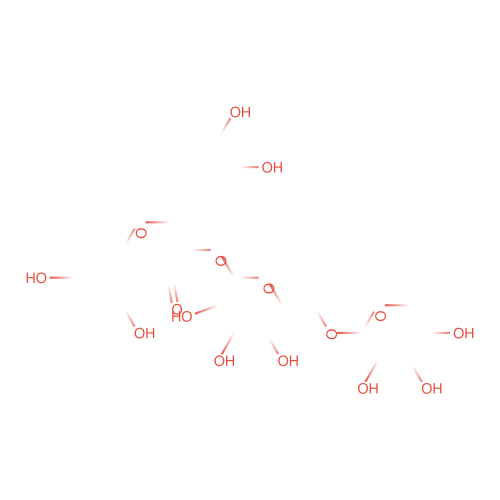

In [28]:
from IPython.display import display_svg, SVG
imgfile = utils.get_project_path() / '.img' / ('%s.svg' % inchikey)
if os.path.exists(imgfile):
    display_svg(SVG(filename=imgfile))

In [29]:
label = 'collision_energy'
path = model_dirs[0]
pd.set_option("display.max_colwidth", 200)

In [30]:
# Select compound with given SMILES, filter datapoints:
# sel = df_all[df_all['SMILES'] == smiles].copy()
sel = df_all[df_all['id'] == inchikey].copy()
sel.dropna(subset=[label], inplace=True)
sel = sel.groupby([label]).head(3)
sel = sel.sort_values(by=[label])
sel['idvis'] = np.arange(1, len(sel) + 1, dtype=int)
sel[['idvis', label, 'instrument_type', 'ionization_mode_id']]

,idvis,collision_energy,instrument_type,ionization_mode_id
11232,1,10.0,LC-ESI-QTOF,1
11229,2,10.0,LC-ESI-QTOF,0
11226,3,10.0,LC-ESI-QTOF,1
11304,4,15.0,QqQ,1
11299,5,15.0,LC-ESI-QTOF,1
11233,6,20.0,LC-ESI-QTOF,1
11230,7,20.0,LC-ESI-QTOF,0
11227,8,20.0,LC-ESI-QTOF,1
11214,9,25.0,ESI-QFT,0
11220,10,25.0,ESI-QFT,1


## Plot 2D PCA for different labels

Path: D:\Workspace\SpecVAE\.model\MoNA\jointvae\jointvae_20-800-200-50-3-50-200-800-20_01 (11-01-2022_23-10-10)
Encode N=4751 instances from MoNA dataset...
torch.Size([4751, 9])
Encode N=27 instances from MoNA dataset...
torch.Size([27, 9])
Convert subset of datapoints
(4751, 1)
(4751, 2) [0 1]
(4751, 6) [0 1 2 3]
Convert datapoints for selected compound
(27, 1)
(27, 2) [0 1]
(27, 6) [0 1 2]
(4751, 2) [0 1]
(4751, 6) [0 1 2 3 4 5]
Latent space per combination of ground truth labels
min, max: 15.0 100.0


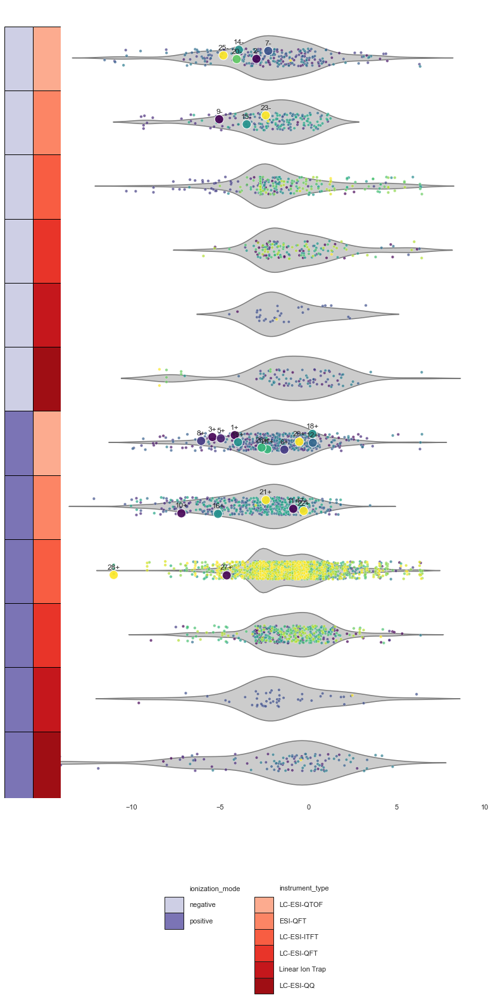

In [31]:
# Obtain latent representations:
print('Path:', path)
select_subset = False
subset = []
cmap = 'viridis'
pca = True
dim1, dim2 = 2,1 # applies only when pca is False
xlim=(-10, 8)
ylim=(0., 1.)
it_subset = [1, 0, 7, 2, 10, 17]

model = load_model(path)
df = load_vis_data(label)

if select_subset:
    df = df[df[label].isin(subset)]
df = df[df['instrument_type_id'].isin(it_subset)]
df['instrument_type_id_map'] = df.apply(lambda row: it_subset.index(row['instrument_type_id']), axis=1)

sel = sel[sel['instrument_type_id'].isin(it_subset)]
sel['instrument_type_id_map'] = sel.apply(lambda row: it_subset.index(row['instrument_type_id']), axis=1)

data = preload_data_as_tensor(model, df)
data_sel = preload_data_as_tensor(model, sel)
data_np = evaluate_model(model, df, data)
data_np_sel = evaluate_model(model, sel, data_sel)

color = df[label].to_numpy()
n_dim = data_np['z'].shape[1]
sel_count = data_np_sel['z'].shape[0]
std_ = np.std(data_np['z'], axis=0)

# Datapoints:
print('Convert subset of datapoints')
Z = data_np['z']
latent_spec = model.config['latent_spec']
cont_dim = latent_spec['cont']
disc_dims = latent_spec['disc']
cont_Z = Z[:,:cont_dim]
disc_Zs = [Z[:,cont_dim + dim1:cont_dim + dim1 + dim2] for dim1, dim2 in zip([0] + disc_dims, disc_dims)]
assert(np.array_equal(Z, np.hstack((cont_Z, *disc_Zs))))
print(cont_Z.shape)
for disc_Z in disc_Zs:
    y = np.argmax(disc_Z, axis=1)
    print(disc_Z.shape, np.unique(y))

# Selected:
print('Convert datapoints for selected compound')
Z_sel = data_np_sel['z']
cont_Z_sel = Z_sel[:,:cont_dim]
disc_Zs_sel = [Z_sel[:,cont_dim + dim1:cont_dim + dim1 + dim2] for dim1, dim2 in zip([0] + disc_dims, disc_dims)]
assert(np.array_equal(Z_sel, np.hstack((cont_Z_sel, *disc_Zs_sel))))
print(cont_Z_sel.shape)
for disc_Z_sel in disc_Zs_sel:
    y = np.argmax(disc_Z_sel, axis=1)
    print(disc_Z_sel.shape, np.unique(y))

# print('Latent space per combination of labels obtained from JointVAE')
# # fig = dicrete_plot(cont_Z, disc_Zs, kind='kde', scale=1., unitv=0.75, sunith=0.4, unith=1., 
# #     legend_offset=2.5, enable_minor_grid=False, xlim=xlim, ylim=ylim, set_ylim=True)
# fig = dicrete_plot(cont_Z, disc_Zs, color=data_np[label], kind='strip', scale=1., unitv=0.75, sunith=0.4, unith=1., 
#     legend_offset=2.5, enable_minor_grid=False, xlim=(-14, 10), ylim=(-0.4,0.6), set_ylim=True)
# plt.show()

y_trues = [np.eye(2)[data_np['ionization_mode_id']], 
    np.eye(6)[df['instrument_type_id_map'].to_numpy()]]
y_trues_sel = [np.eye(2)[data_np_sel['ionization_mode_id']], 
    np.eye(6)[sel['instrument_type_id_map'].to_numpy()]]
for yt in y_trues:
    y = np.argmax(yt, axis=1)
    print(yt.shape, np.unique(y))

print('Latent space per combination of ground truth labels')
fig1 = dicrete_plot(
    cont_Z, y_trues, color=data_np[label], 
    X_sel=cont_Z_sel, ys_sel=y_trues_sel, color_sel=data_np_sel[label], 
    meta_sel={'idvis': sel['idvis'].to_numpy(), 'ionization_mode_id': sel['ionization_mode_id'].to_numpy()},
    labels={
        'ionization_mode': ['negative', 'positive'], 
        'instrument_type': [df['instrument_type'][df['instrument_type_id'] == itid].unique()[0] for itid in it_subset]
    }, kind='strip', scale=2, unitv=0.75, sunith=0.4, unith=1., 
    legend_offset=2.5, enable_minor_grid=False, xlim=(-14, 10), ylim=(-0.4,0.6), set_ylim=True)
plt.show()
z = cont_Z

# fig.savefig('../.img/latent-single-compound.svg')

(27, 33)


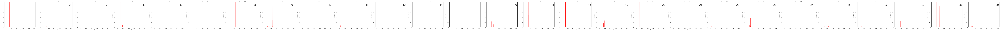

In [32]:
fig = vis_spectra(sel, label, config=model.config)
fig.savefig('../.img/spectra-single-compound.svg')

In [33]:
# Define transformation for vizualization:
revtrans = tv.transforms.Compose([
    dt.ToMZIntDeConcatAlt(max_num_peaks=model.config['max_num_peaks']),
    dt.Denormalize(intensity=model.config['normalize_intensity'], mass=model.config['normalize_mass'], max_mz=model.config['max_mz']),
    dt.ToDenseSpectrum(resolution=0.05, max_mz=model.config['max_mz'])
])

## Plot reconstruction

(<Figure size 5000x5000 with 25 Axes>,
 array([[<AxesSubplot:ylabel='Intensity [%]'>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:ylabel='Intensity [%]'>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:ylabel='Intensity [%]'>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:ylabel='Intensity [%]'>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:xlabel='m/z', ylabel='Intensity [%]'>,
         <AxesSubplot:xlabel='m/z'>, <AxesSubplot:xlabel='m/z'>,
         <AxesSubplot:xlabel='m/z'>, <AxesSubplot:xlabel='m/z'>]],
       dtype=object))

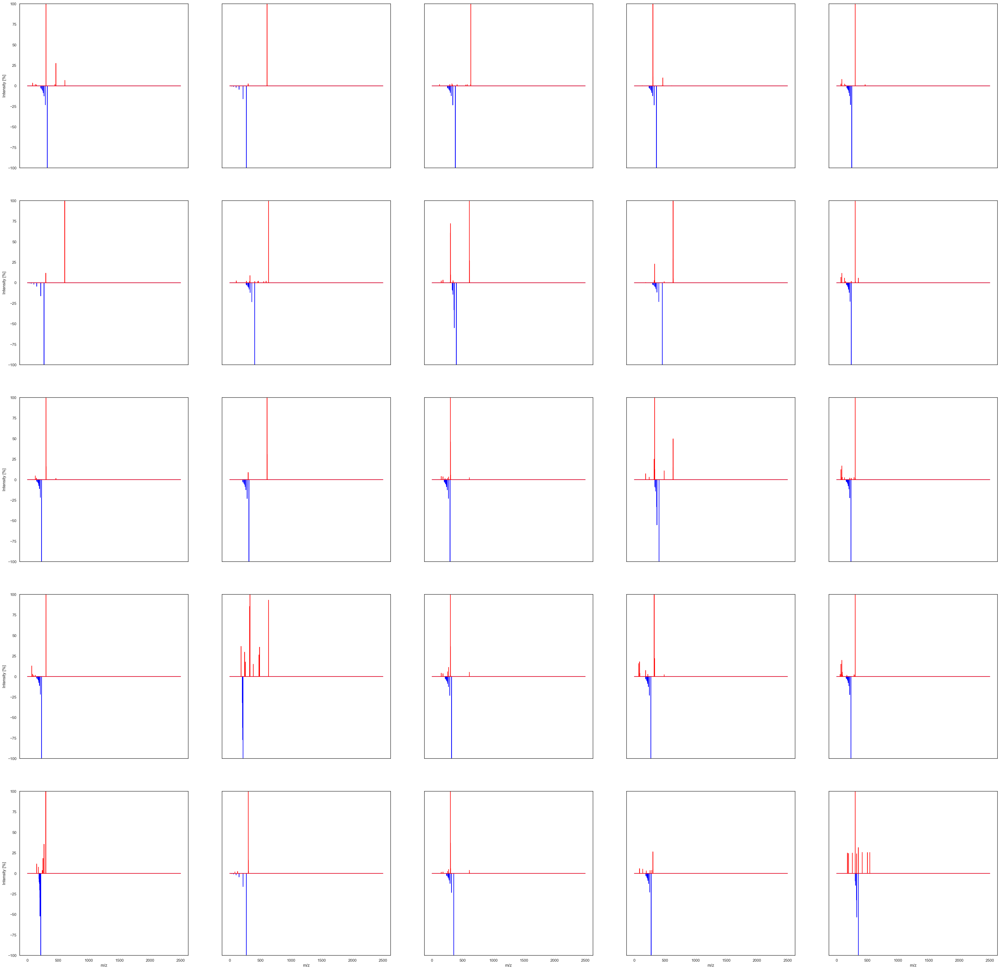

In [34]:
vis.plot_spectra_grid(
    model, [data_sel['spectrum']], transform=revtrans, 
    dpi=300, dirpath='../.img', name='spec-recon-%s.svg' % inchikey,
    grid=(5, 5), figsize=(50, 50))

In [70]:
import matplotlib.pyplot as plt
import matplotlib.patches as pch
import matplotlib.ticker as tck
from matplotlib.lines import Line2D
from itertools import cycle, product
import itertools as it
import seaborn as sns
from functools import reduce

def discrete_plot(X, ys, transform, index_prefix='Var ',
        sunith=1.0, unith=1.0, unitv=1.0, scale=1.0, border=2.0, legend_offset=1.0, dpi=100):
    # Extract labels:
    labels = {i: list(range(1, y.shape[1] + 1)) for i, y in enumerate(ys)}
    height = np.prod([len(l) for k, l in labels.items()])
    # Specify GridSpec:
    widths = np.array([sunith] * len(labels) + [unith] * X.shape[1])
    heights = np.array([unitv] * height + [legend_offset*unitv])
    gs_kw = dict(width_ratios=widths, height_ratios=heights)
    fig, axs = plt.subplots(
        ncols=len(widths), nrows=len(heights), subplot_kw=dict(frameon=True),
        constrained_layout=False, gridspec_kw=gs_kw, 
        figsize=(scale * widths.sum(), scale * heights.sum()), dpi=dpi)
    # Define color mappings:
    from matplotlib.cm import get_cmap
    cmaps = cycle(['Purples', 'Reds', 'Blues', 'Oranges', 'Greens', ])
    def map_disc_(items, cmap_name):
        cmap_ = get_cmap(cmap_name)
        inter_ = 0.3
        slope_ = (1. - inter_) / len(items)
        return {value: cmap_(inter_ + items.index(value) * slope_) for value in items}
    colors = {label: map_disc_(items, cmap_name) \
        for (label, items), cmap_name in zip(labels.items(), cmaps)}
    labels_ = list(product(*list(labels.values())))
    for r, row in enumerate(axs):
        for c, ax in enumerate(row):
            for _, spine in ax.spines.items():
                spine.set_visible(False)
            if r == len(axs) - 1:
                ax.set(xticks=[], yticks=[])
                ax.patch.set_alpha(0.)
                continue
            if c < len(labels):
                ax.set(xticks=[], yticks=[])
                var_name = c
                var_value = labels_[r][c]
                ax.add_patch(pch.Rectangle((0., 0.), unith, unitv, 
                    facecolor=colors[var_name][var_value], edgecolor='black', label=var_value, zorder=500))
                for _, spine in ax.spines.items():
                    spine.set_linewidth(border)
            else:
                ax.set(yticks=[], xticks=[])
                for _, spine in ax.spines.items():
                    spine.set_visible(True)
                    spine.set_linewidth(0.5)
                var_value = labels_[r]
                spectrum = X[r][c - len(labels)]
                if transform:
                    import torch
                    if torch.is_tensor(spectrum):
                        spectrum = transform(spectrum.detach().numpy())
                    else:
                        spectrum = transform(spectrum)
                mz = np.arange(0, 2500., step=0.5)
                ax.plot(mz, spectrum.tolist(), color='blue', linewidth=0.5)
                ax.set_ylim([0, 100])
                grid = (X.shape[0], X.shape[1])
                if grid[0] - 1 == r:
                    ax.set_xticks([500, 1500, 2500])
                    ax.set_xlabel('m/z')
                handles, lbs = ax.get_legend_handles_labels()

    # Build the legend:
    sizes = [len(ll) for ln, ll in labels.items()]
    largest_label_inx = np.argmax(sizes)
    ## Categorical variables:
    hndl = []
    for i, (lbl, colors_) in enumerate(colors.items()):
        size, empty = len(colors_), []
        if i >= 1:
            m = sizes[largest_label_inx] - sizes[i - 1]
            if m > 0:
                empty = [Line2D([], [], label='', alpha=0.)] * m
        hndl += empty + [Line2D([], [], label=index_prefix + str(lbl + 1), alpha=0.)] + [
            pch.Patch(facecolor=color, edgecolor="k", label=label, alpha=0.7) 
            for label, color in colors_.items()
        ]

    legend = fig.legend(handles=hndl, loc='lower center', handlelength=scale*1.4, handleheight=scale*1.6, ncol=len(labels), labelspacing=.0)
    legend.get_frame().set_alpha(0.)
    plt.subplots_adjust(hspace=0, wspace=0.)
    return fig

## Interpolate between two compounds

In [87]:
def lerp(x, y, step):
    """Linear interpolation"""
    if not np.isscalar(step):
        return np.array([lerp(x, y, step_) for step_ in step])
    return (1. - step) * x + step * y

def slerp(x, y, step):
    """
    Spherical Linear Interpolation. 
    Read more: https://splines.readthedocs.io/en/latest/rotation/slerp.html
    """
    if not np.isscalar(step):
        return np.array([slerp(x, y, step_) for step_ in step])
    # return (y * x.inverse())**step * x
    cos_th = np.dot(x, y) / (np.linalg.norm(x) * np.linalg.norm(y))
    th = np.arccos(cos_th)
    return (np.sin((1. - step) * th) / np.sin(th)) * x + (np.sin(step * th) / np.sin(th)) * y


In [71]:
def full_representation(model, z):
    latent_spec = model.config['latent_spec']
    cont_dim = latent_spec['cont']
    disc_dims = latent_spec['disc']
    dv = np.array(list(it.product(*[list(range(d)) for d in disc_dims])))
    dv_ohe = np.hstack([np.eye(d)[dv[:,i]] for i, d in enumerate(disc_dims)])
    if cont_dim == 1:
        z_ = torch.from_numpy(np.hstack((
            np.tile(z, (dv_ohe.shape[0], 1)),
            np.repeat(dv_ohe, z.shape[0], axis=0)
        )))
    z_ = z_.to(torch.float32).to(model.device)
    spectra = model.decode(z_)
    spectra_ = spectra.reshape(dv_ohe.shape[0], z.shape[0], spectra.shape[1])
    z_ = z_.reshape(dv_ohe.shape[0], z.shape[0], z_.shape[1])
    return dv, dv_ohe, z_, spectra_

In [93]:
# Select data points:
A, B = 28, 18
points = sel[sel['idvis'].isin([A, B])]
# Find latent representation:
latent_spec = model.config['latent_spec']
cont_dim = latent_spec['cont']
dp = preload_data_as_tensor(model, points)
dp_np = evaluate_model(model, points, dp)
z = dp_np['z'][:,:cont_dim]
# How many points: between + 2 (actual points)
n = 10 + 2
z.shape

Encode N=2 instances from MoNA dataset...
torch.Size([2, 9])


(2, 1)

In [94]:
def plot_(model, p):
    revtrans = tv.transforms.Compose([
        dt.ToMZIntDeConcatAlt(max_num_peaks=model.config['max_num_peaks']),
        dt.Denormalize(
            intensity=model.config['normalize_intensity'], 
            mass=model.config['normalize_mass'], max_mz=model.config['max_mz']),
        dt.ToDenseSpectrum(resolution=0.5, max_mz=model.config['max_mz'])
    ])
    latent_spec = model.config['latent_spec']
    cont_dim = latent_spec['cont']
    disc_dims = latent_spec['disc']

    disc_vals, disc_vals_ohe, z, spectra = full_representation(model, p)
    disc_Zs = [disc_vals_ohe[:,dim1:dim1 + dim2] for dim1, dim2 in zip([0] + disc_dims, disc_dims)]
    fig = discrete_plot(spectra, disc_Zs, revtrans, sunith=0.5, unith=2.5, scale=1., legend_offset=0.5, dpi=300)
    return fig, spectra

### Linear interpolation

Original datapoints: start and end datapoint respectively


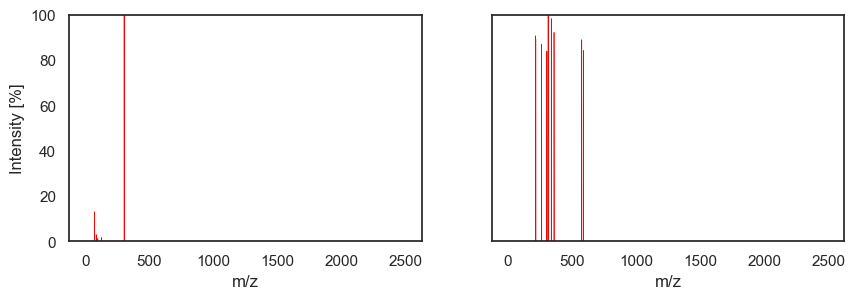

(<Figure size 1000x300 with 2 Axes>,
 array([<AxesSubplot:xlabel='m/z', ylabel='Intensity [%]'>,
        <AxesSubplot:xlabel='m/z'>], dtype=object))

In [95]:
print('Original datapoints: start and end datapoint respectively')
vis.plot_spectra_(dp_np['X'], grid=(1, 2), figsize=(5*2, 3), resolution=0.05, max_mz=model.config['max_mz'], transform=revtrans, color='red')

Before first selected datapoint


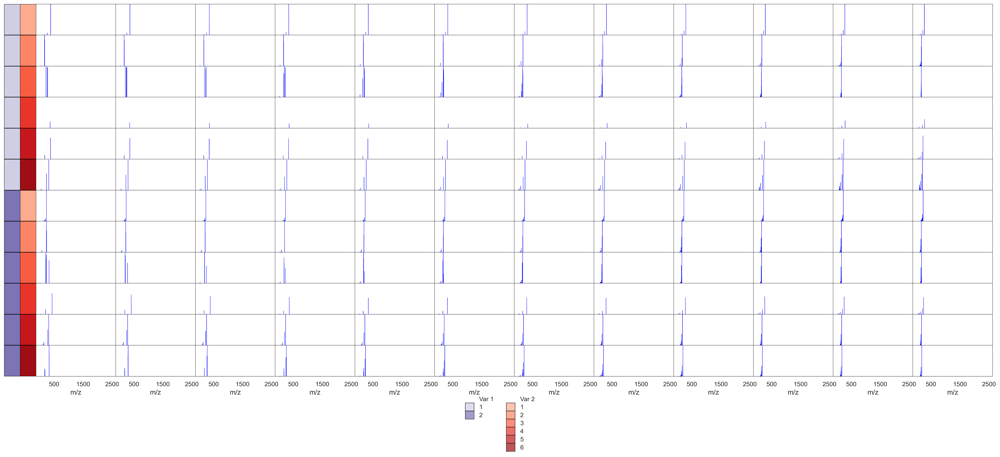

In [96]:
# Before:
print('Before first selected datapoint')
p = lerp(2*z[0] - z[1], z[0], np.linspace(0, 1, n))
fig, lerp_spectrab = plot_(model, p)
fig.savefig('../.img/jointvae-lerp-before-%s.svg' % inchikey)

Between first and second selected datapoint


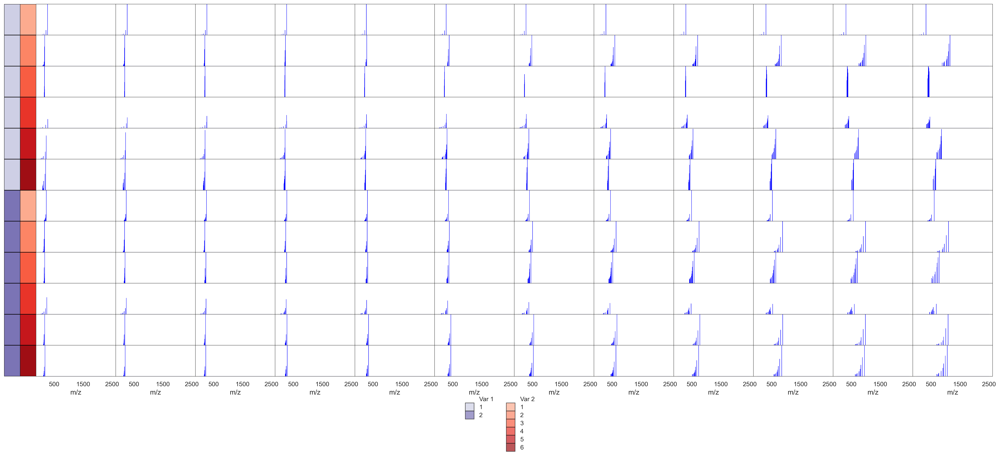

In [97]:
# Between:
print('Between first and second selected datapoint')
p = lerp(z[0], z[1], np.linspace(0, 1, n))
fig, lerp_spectra = plot_(model, p)
fig.savefig('../.img/jointvae-lerp-between-%s.svg' % inchikey)

After second selected datapoint


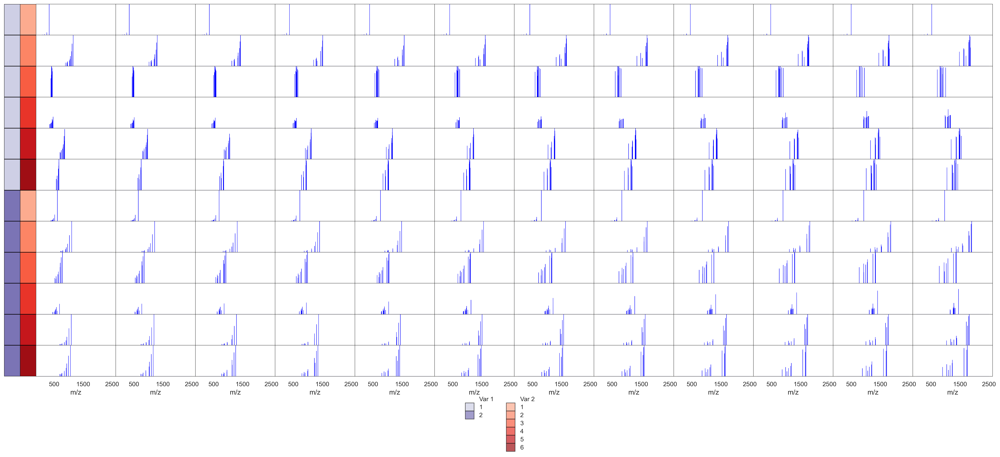

In [99]:
# After
print('After second selected datapoint')
p = lerp(z[1], 2 * z[1] - z[0], np.linspace(0, 1, n))
fig, lerp_spectraa = plot_(model, p)
fig.savefig('../.img/jointvae-lerp-after-%s.svg' % inchikey)

## Find matching compounds in the dataset

In [90]:
# Transform entire dataset:
columns = ['spectrum', 'collision_energy', 'ionization_mode_id']
types = [torch.float32] * len(columns)
data = dt.Spectra.preload_tensor(
    device=device, data_frame=df_all[columns + ['id']], transform=model.transform, limit=-1, types=types, do_print=True)

Load and transform...
Progress: 5%
Progress: 10%
Progress: 15%
Progress: 20%
Progress: 25%
Progress: 30%
Progress: 35%
Progress: 40%
Progress: 45%
Progress: 50%
Progress: 55%
Progress: 60%
Progress: 65%
Progress: 70%
Progress: 75%
Progress: 80%
Progress: 85%
Progress: 90%
Progress: 95%
Convert data to pytorch tensors...


In [91]:
from specvae.metrics import cos_sim, eu_dist, per_diff
from IPython.display import display

def visualize_matching_spectra(df, spectra, n=5, data=None):
    # Transform entire dataset:
    df1 = df.copy()
    columns = ['spectrum', 'collision_energy', 'ionization_mode_id']
    if data is None:
        types = [torch.float32] * len(columns)
        data = dt.Spectra.preload_tensor(
            device=device, data_frame=df1[columns + ['id']], transform=model.transform, limit=-1, types=types, do_print=True)
    # Compare intermediate spectra against the entire dataset using metrics:
    cs = cos_sim(data['spectrum'], spectra, matrix=True)
    eu = eu_dist(data['spectrum'], spectra, matrix=True)
    pf = per_diff(data['spectrum'], spectra, matrix=True)
    # Construct new dataframe:
    df_cs = pd.DataFrame(cs.detach().numpy(), columns=['cos_sim_%d' % i for i in range(cs.shape[1])])
    df_eu = pd.DataFrame(eu.detach().numpy(), columns=['eu_dist_%d' % i for i in range(eu.shape[1])])
    df_pf = pd.DataFrame(pf.detach().numpy(), columns=['per_diff_%d' % i for i in range(pf.shape[1])])
    df_cs.index = df1.index
    df_eu.index = df1.index
    df_pf.index = df1.index
    df1 = pd.concat((df1, df_cs), axis=1)
    df1 = pd.concat((df1, df_eu), axis=1)
    df1 = pd.concat((df1, df_pf), axis=1)
    # Visualize best n matches per each intermediate spectrum:
    for i in range(cs.shape[1]):
        print('Match by scores')
        df_n_cs = df1.sort_values(by=['%s_%d' % ('cos_sim', i)], ascending=False ).head(n)[['id'] + columns + ['%s_%d' % ('cos_sim', i)]]
        df_n_eu = df1.sort_values(by=['%s_%d' % ('eu_dist', i)], ascending=True).head(n)[['id'] + columns + ['%s_%d' % ('eu_dist', i)]]
        df_n_pf = df1.sort_values(by=['%s_%d' % ('per_diff', i)], ascending=True).head(n)[['id'] + columns + ['%s_%d' % ('per_diff', i)]]
        display(df_n_cs)
        display(df_n_eu)
        display(df_n_pf)
        print('Intermediate spectrum')
        vis.plot_spectrum(spectra[i].detach().numpy(), 
            resolution=0.05, max_mz=model.config['max_mz'], config=model.config, transformed=True, figsize=(7, 5))
        plt.show()
        print('Matching spectra using cos_sim')
        vis.plot_spectra_(df_n_cs['spectrum'].to_numpy(), grid=(1, n), figsize=(5*(n), 3), 
            resolution=0.05, max_mz=model.config['max_mz'], transform=lambda x: revtrans(model.transform(x)), color='red')
        print('Matching spectra using eu_dist')
        vis.plot_spectra_(df_n_eu['spectrum'].to_numpy(), grid=(1, n), figsize=(5*(n), 3), 
            resolution=0.05, max_mz=model.config['max_mz'], transform=lambda x: revtrans(model.transform(x)), color='red')
        print('Matching spectra using per_diff')
        vis.plot_spectra_(df_n_pf['spectrum'].to_numpy(), grid=(1, n), figsize=(5*(n), 3), 
            resolution=0.05, max_mz=model.config['max_mz'], transform=lambda x: revtrans(model.transform(x)), color='red')

### Matching spectra for LERP interpolants

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.999034
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998887
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998806
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998754
8663,IAFBOKYTDSDNHV-UHFFFAOYSA-N,111.1204:1.406406 152.9417:1.698699 230.9572:3.856857 267.0597:17.974975 307.0927:100.000000,10.0,1,0.998631


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.043943
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047172
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048863
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.049919
8663,IAFBOKYTDSDNHV-UHFFFAOYSA-N,111.1204:1.406406 152.9417:1.698699 230.9572:3.856857 267.0597:17.974975 307.0927:100.000000,10.0,1,0.052328


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.693837
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.736861
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.742810
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.743782
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.744734


Intermediate spectrum


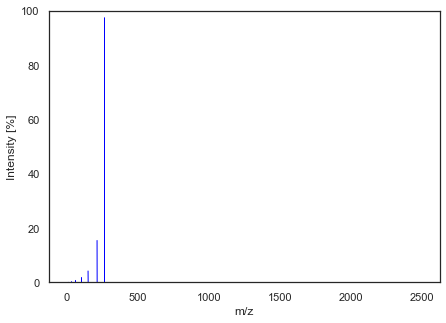

Matching spectra using cos_sim


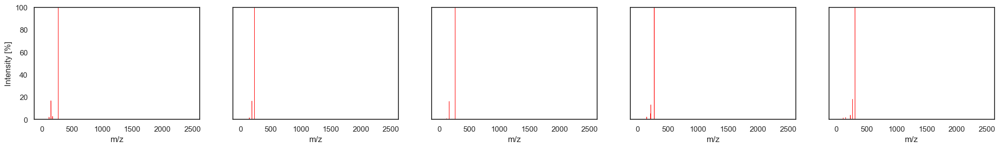

Matching spectra using eu_dist


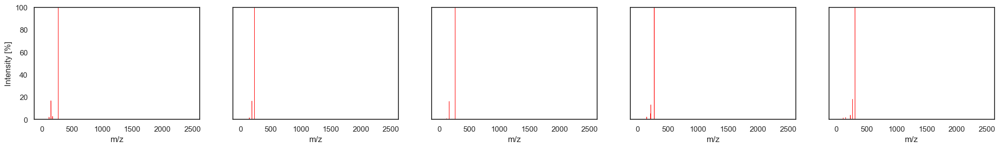

Matching spectra using per_diff


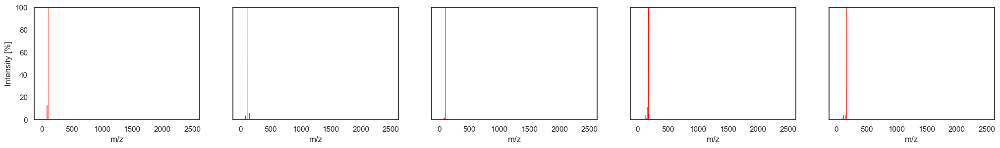

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.999029
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998886
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998807
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998771
8663,IAFBOKYTDSDNHV-UHFFFAOYSA-N,111.1204:1.406406 152.9417:1.698699 230.9572:3.856857 267.0597:17.974975 307.0927:100.000000,10.0,1,0.998620


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.044070
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047207
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048853
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.049574
8663,IAFBOKYTDSDNHV-UHFFFAOYSA-N,111.1204:1.406406 152.9417:1.698699 230.9572:3.856857 267.0597:17.974975 307.0927:100.000000,10.0,1,0.052536


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.694155
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.737256
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.743288
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.744255
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.745338


Intermediate spectrum


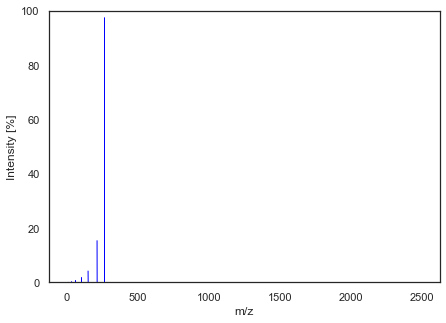

Matching spectra using cos_sim


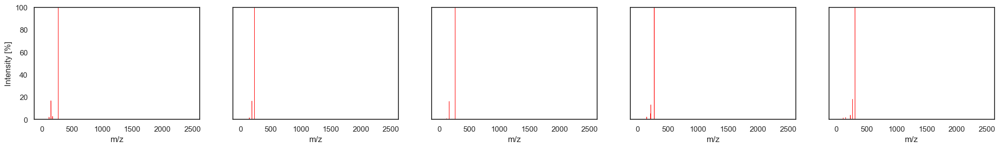

Matching spectra using eu_dist


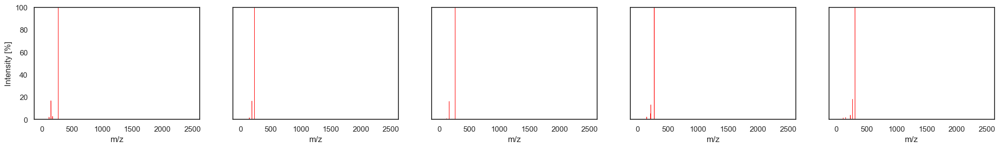

Matching spectra using per_diff


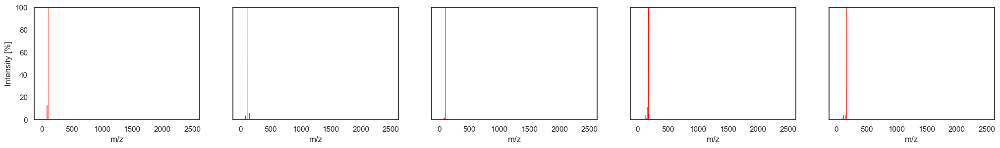

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.999022
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998884
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998807
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998791
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998613


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.044239
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047239
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048843
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.049174
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.052668


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.694059
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.736944
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.743026
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.744390
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.745179


Intermediate spectrum


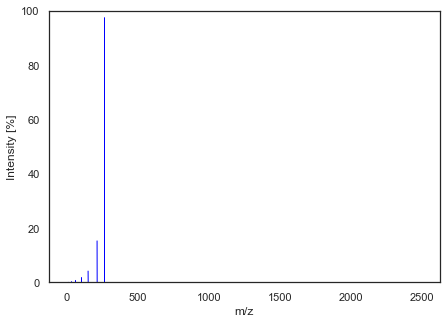

Matching spectra using cos_sim


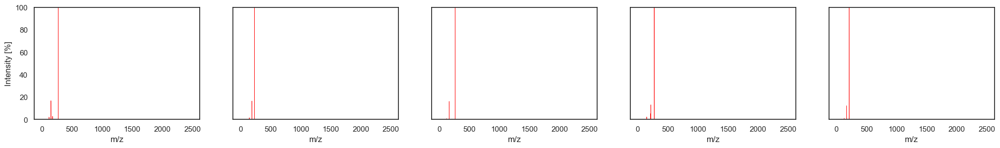

Matching spectra using eu_dist


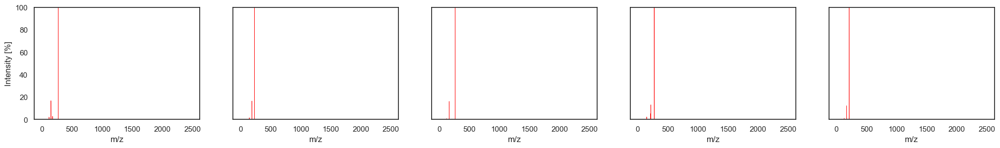

Matching spectra using per_diff


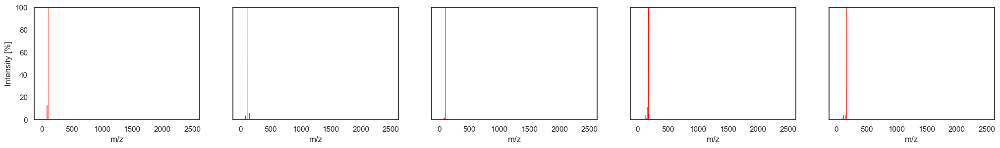

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.999013
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998885
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998810
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998809
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998648


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.044422
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047215
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048791
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.048811
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.052002


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.692418
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.733953
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.740058
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.742147
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.743044


Intermediate spectrum


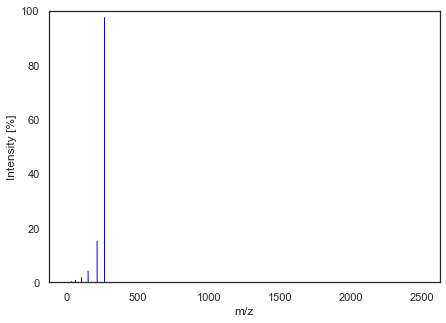

Matching spectra using cos_sim


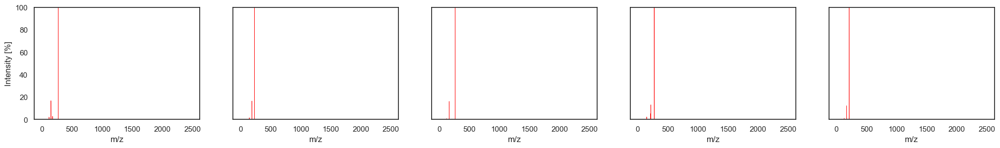

Matching spectra using eu_dist


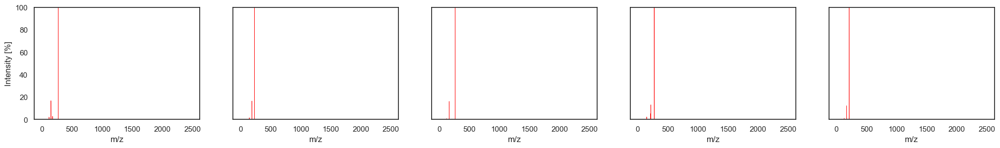

Matching spectra using per_diff


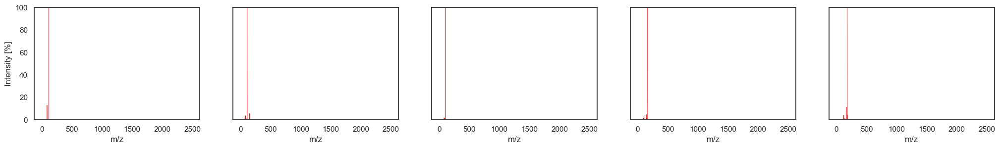

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.999004
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998886
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998827
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998812
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998685


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.044634
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047199
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.048435
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048752
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.051276


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.690602
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.730770
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.736818
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.738850
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.741609


Intermediate spectrum


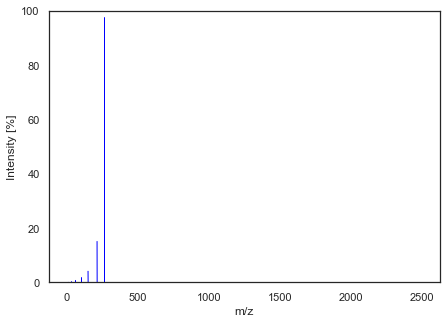

Matching spectra using cos_sim


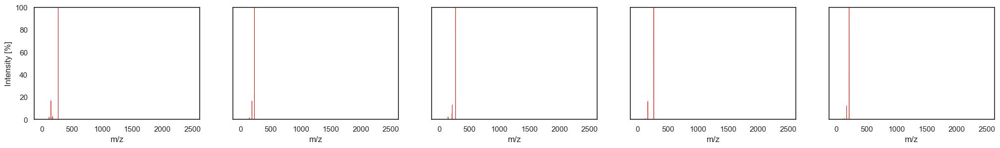

Matching spectra using eu_dist


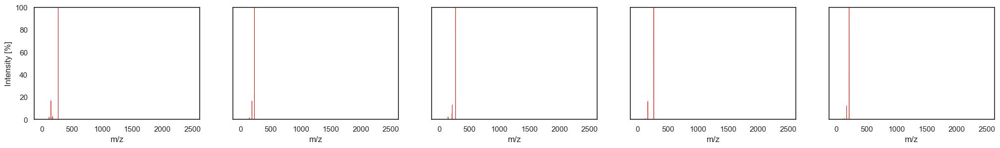

Matching spectra using per_diff


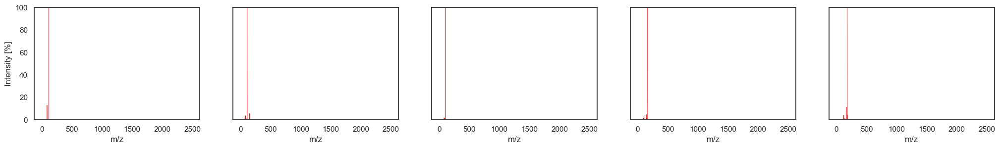

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998993
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998886
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998844
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998812
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998721


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.044871
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047213
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.048081
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048740
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.050565


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.688747
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.727547
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.733527
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.735503
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.740101


Intermediate spectrum


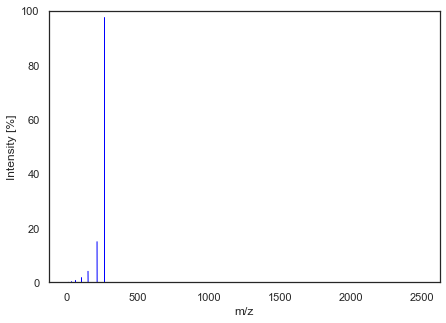

Matching spectra using cos_sim


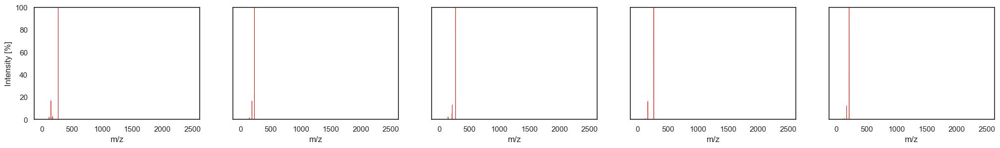

Matching spectra using eu_dist


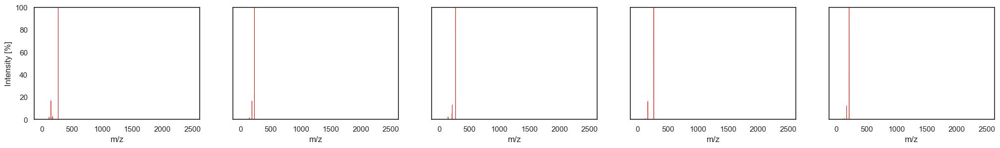

Matching spectra using per_diff


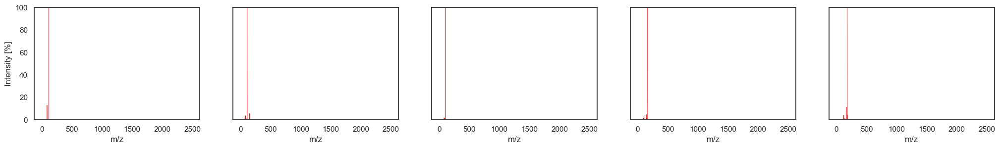

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998981
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998884
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998860
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998811
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998756


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.045135
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047252
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.047756
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048754
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.049875


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.686900
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.724348
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.730255
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.732180
50803,ZFXYFBGIUFBOJW-UHFFFAOYSA-N,55.028900:0.046382 65.997261:0.095808 71.366402:0.038266 79.016281:0.062303 94.039619:0.088764 122.034714:3.671152 123.038055:0.075272 133.724579:0.038524 140.045242:0.828446 164.033051:11.166872 ...,NaN,0,0.738592


Intermediate spectrum


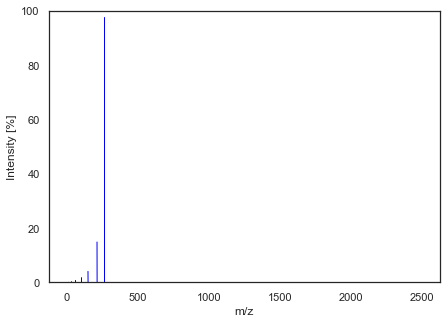

Matching spectra using cos_sim


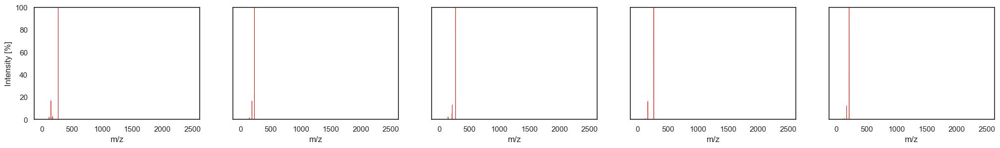

Matching spectra using eu_dist


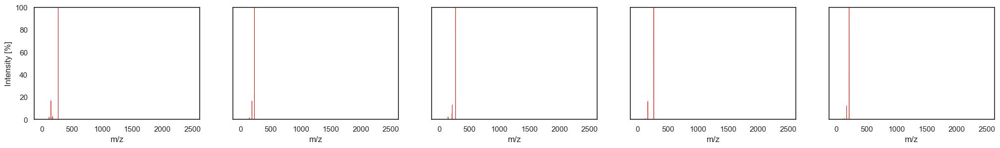

Matching spectra using per_diff


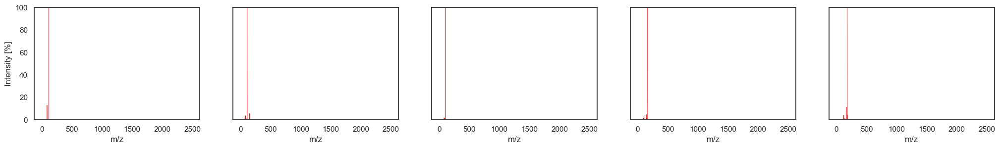

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998964
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998881
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998877
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998808
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998797


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.045529
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.047315
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047399
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048825
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.049056


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.685664
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.721196
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.727058
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.728973
64393,JFCQEDHGNNZCLN-UHFFFAOYSA-N,69.100:0.085511 71.100:0.044466 87.300:7.049528 88.900:0.027364 92.600:0.017102 97.100:0.037625 99.100:0.236010 113.000:2.219866 130.400:4.118210 130.900:100.000000,10.0,0,0.736099


Intermediate spectrum


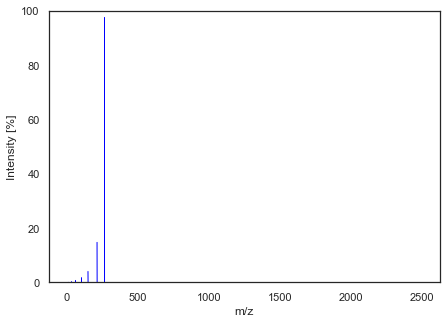

Matching spectra using cos_sim


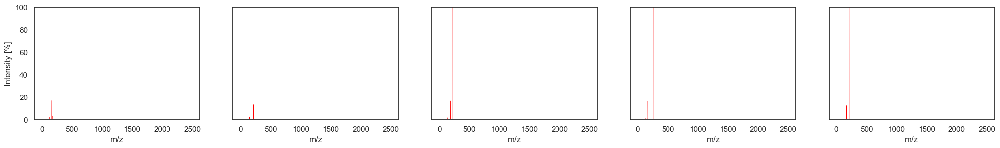

Matching spectra using eu_dist


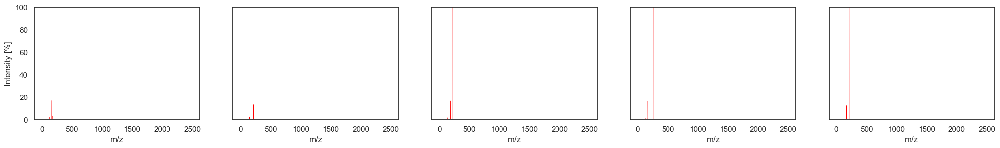

Matching spectra using per_diff


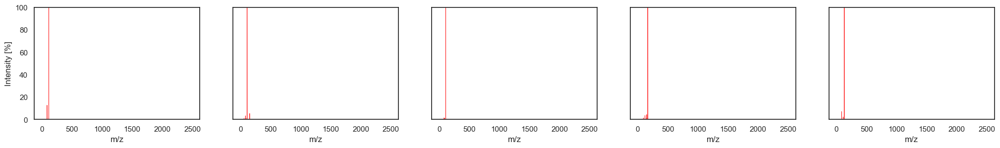

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998939
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998905
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998862
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998836
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998800


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.046073
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.046799
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.047704
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.048244
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.048990


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.685303
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.718139
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.723949
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.725873
64393,JFCQEDHGNNZCLN-UHFFFAOYSA-N,69.100:0.085511 71.100:0.044466 87.300:7.049528 88.900:0.027364 92.600:0.017102 97.100:0.037625 99.100:0.236010 113.000:2.219866 130.400:4.118210 130.900:100.000000,10.0,0,0.734265


Intermediate spectrum


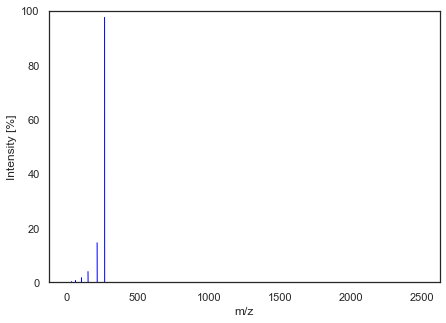

Matching spectra using cos_sim


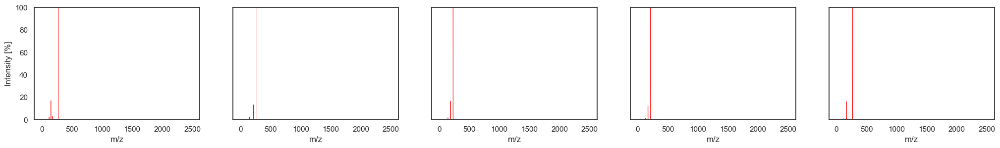

Matching spectra using eu_dist


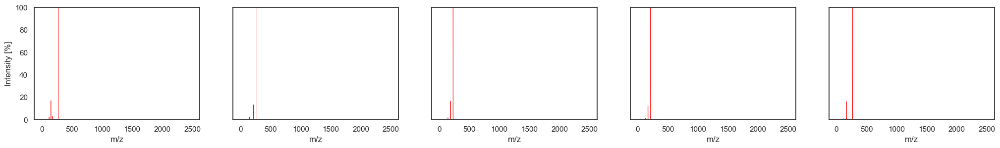

Matching spectra using per_diff


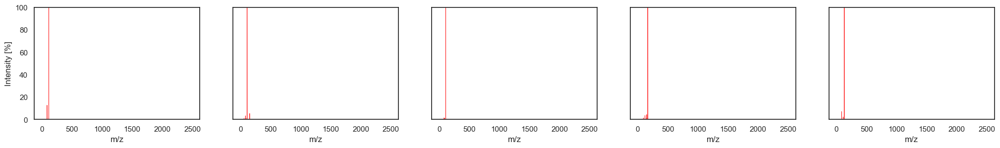

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998929
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998913
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998873
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998845
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.998791


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.046285
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.046626
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.047470
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.048070
60340,DKMFBWQBDIGMHM-UHFFFAOYSA-N,123.0231:0.728857 165.07:16.093509 166.0733:1.260640 264.1768:100.000000,10.0,1,0.049181


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.685233
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.716261
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.722009
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.723932
64393,JFCQEDHGNNZCLN-UHFFFAOYSA-N,69.100:0.085511 71.100:0.044466 87.300:7.049528 88.900:0.027364 92.600:0.017102 97.100:0.037625 99.100:0.236010 113.000:2.219866 130.400:4.118210 130.900:100.000000,10.0,0,0.733340


Intermediate spectrum


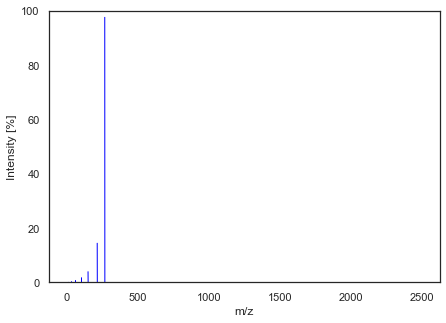

Matching spectra using cos_sim


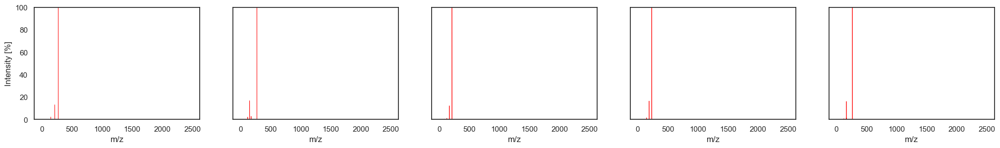

Matching spectra using eu_dist


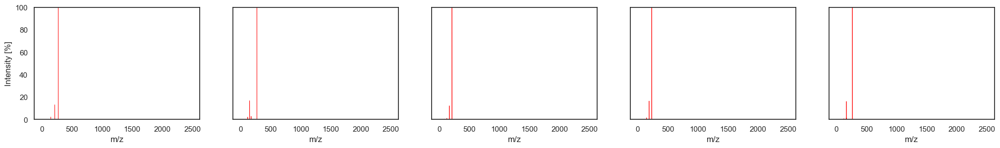

Matching spectra using per_diff


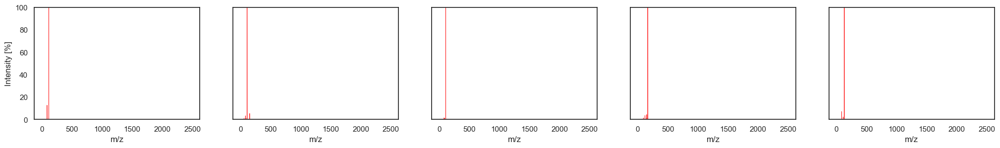

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998951
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998910
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998882
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.998822
51736,HSTZMXCBWJGKHG-OWOJBTEDSA-N,101.02079:0.600000 185.06236:2.000000 227.06998:100.000000 228.07288:12.500000,30.0,0,0.998820


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.045794
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.046693
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.047291
88037,WJNRPILHGGKWCK-UHFFFAOYSA-N,68.0242:0.146961 104.0007:0.113856 146.0226:1.507135 188.0699:16.444252 230.1168:100.000000,30.0,1,0.048529
51736,HSTZMXCBWJGKHG-OWOJBTEDSA-N,101.02079:0.600000 185.06236:2.000000 227.06998:100.000000 228.07288:12.500000,30.0,0,0.048583


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.685237
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.714433
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.720132
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.722063
89379,ZTUKZKYDJMGJDC-UHFFFAOYSA-N,59.000:0.017425 68.600:0.029041 140.800:0.563397 141.400:0.145205 152.900:1.649532 196.700:2.660161 197.200:44.188883 223.200:0.098740 245.600:0.151014 247.200:0.011616 305.500:100.000000,10.0,0,0.732363


Intermediate spectrum


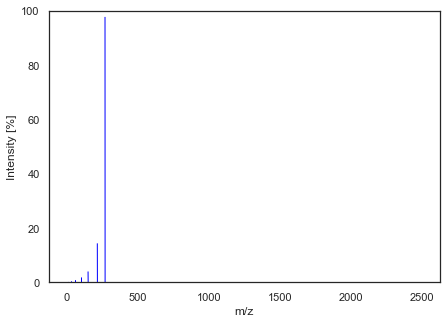

Matching spectra using cos_sim


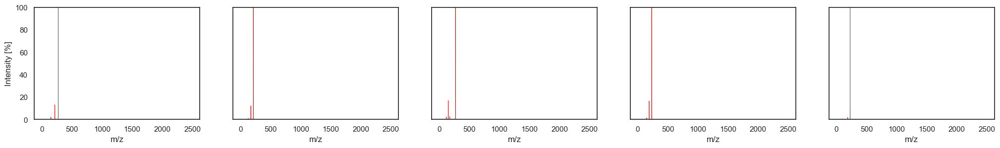

Matching spectra using eu_dist


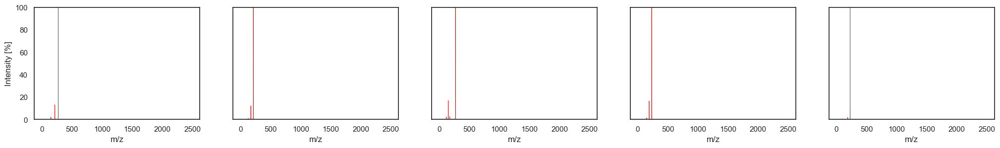

Matching spectra using per_diff


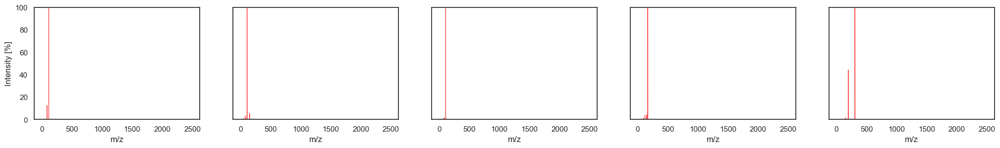

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.998972
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.998943
51736,HSTZMXCBWJGKHG-OWOJBTEDSA-N,101.02079:0.600000 185.06236:2.000000 227.06998:100.000000 228.07288:12.500000,30.0,0,0.998861
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.998845
15637,HKQYGTCOTHHOMP-UHFFFAOYSA-N,122.96:1.333695 199.07:3.064811 236.99:100.000000 241.06:11.726004,35.0,1,0.998814


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
118370,MKXZASYAUGDDCJ-UHFFFAOYSA-N,147.0817:2.223640 213.1287:5.226370 215.1442:13.056820 272.2013:100.000000,20.0,1,0.045351
83836,RUOTUMSRCIMLJK-UHFFFAOYSA-N,86.0347:0.335688 128.0567:2.881281 128.0819:1.042875 170.1037:12.193918 212.1506:100.000000,30.0,1,0.045977
51736,HSTZMXCBWJGKHG-OWOJBTEDSA-N,101.02079:0.600000 185.06236:2.000000 227.06998:100.000000 228.07288:12.500000,30.0,0,0.047727
120412,YQHMWTPYORBCMF-ZZXKWVIFSA-N,119.051:2.099240 151.005:16.704090 177.016:2.784010 271.055:100.000000,15.0,0,0.048053
15637,HKQYGTCOTHHOMP-UHFFFAOYSA-N,122.96:1.333695 199.07:3.064811 236.99:100.000000 241.06:11.726004,35.0,1,0.048692


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
58116,DDRJAANPRJIHGJ-UHFFFAOYSA-N,50.137918:0.013934 50.215375:0.013509 50.405397:0.013595 50.441585:0.013986 50.469226:0.014680 50.671885:0.015910 50.810760:0.013890 51.014966:0.015029 51.194708:0.015048 51.264093:0.017786 51.300...,45.0,1,0.685309
65042,XJWPISBUKWZALE-UHFFFAOYSA-N,58.200:1.050109 60.200:0.014825 66.900:0.007413 79.900:0.484285 81.300:3.256572 93.300:0.812908 94.200:0.009883 107.300:0.007413 108.000:0.014825 109.200:0.091421 110.100:100.000000 122.300:0.0321...,20.0,0,0.712442
65779,YCIMNLLNPGFGHC-UHFFFAOYSA-N,60.293964:0.050218 62.034233:0.049783 65.038200:0.303056 65.590813:0.055820 71.978302:0.053560 73.007637:0.105896 74.571922:0.051598 81.033157:1.494870 91.017418:0.887114 91.489334:0.052301 104.05...,NaN,0,0.718098
61887,COLNVLDHVKWLRT-QMMMGPOBSA-N,58.600:0.011252 72.000:0.271933 78.700:0.005626 90.900:0.043134 91.900:1.402798 95.200:0.035633 96.900:0.016879 103.000:0.161284 118.100:0.011252 120.000:3.463861 136.400:0.018754 145.900:0.941450...,10.0,0,0.720032
89379,ZTUKZKYDJMGJDC-UHFFFAOYSA-N,59.000:0.017425 68.600:0.029041 140.800:0.563397 141.400:0.145205 152.900:1.649532 196.700:2.660161 197.200:44.188883 223.200:0.098740 245.600:0.151014 247.200:0.011616 305.500:100.000000,10.0,0,0.730271


Intermediate spectrum


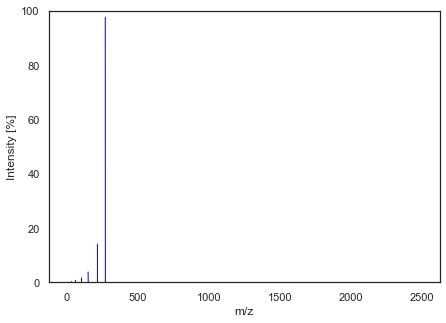

Matching spectra using cos_sim


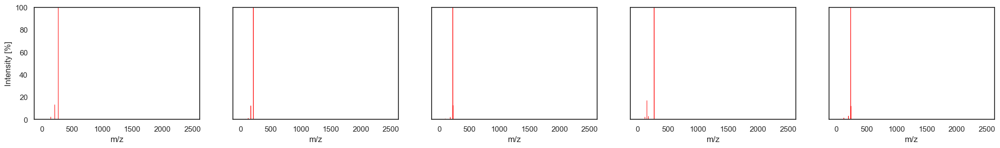

Matching spectra using eu_dist


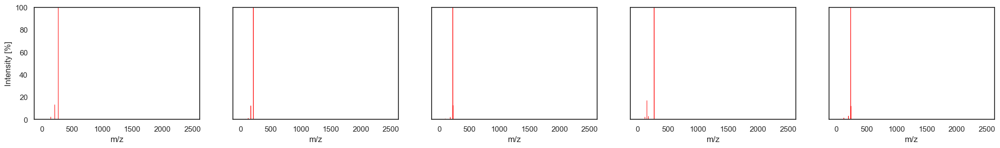

Matching spectra using per_diff


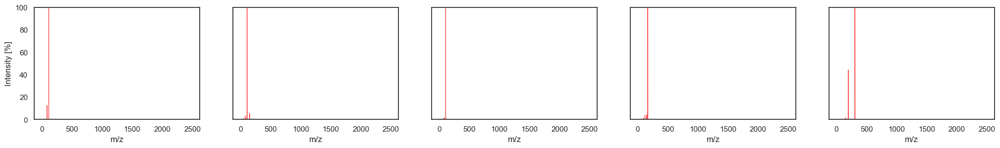

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
22685,BMLZFLQMBMYVHG-UHFFFAOYSA-N,71.310097:0.219680 73.517181:0.155873 75.014366:0.214211 76.596077:0.039196 77.001320:0.146757 77.038620:0.411103 78.046371:2.951552 79.012886:0.162253 80.021187:0.144023 81.333405:0.183219 82.001...,NaN,1,0.998322
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.998243
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.998229
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998151
50556,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,119.0487:1.091443 121.0281:1.054756 128.0619:2.549757 129.0702:2.173714 131.0465:0.742915 131.0859:0.715399 133.0278:2.476383 137.0222:20.187104 138.0244:1.669265 141.0689:1.366596 143.0847:1.8985...,30.0,1,0.998107


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
22685,BMLZFLQMBMYVHG-UHFFFAOYSA-N,71.310097:0.219680 73.517181:0.155873 75.014366:0.214211 76.596077:0.039196 77.001320:0.146757 77.038620:0.411103 78.046371:2.951552 79.012886:0.162253 80.021187:0.144023 81.333405:0.183219 82.001...,NaN,1,0.057940
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.059287
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.059520
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.060807
50556,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,119.0487:1.091443 121.0281:1.054756 128.0619:2.549757 129.0702:2.173714 131.0465:0.742915 131.0859:0.715399 133.0278:2.476383 137.0222:20.187104 138.0244:1.669265 141.0689:1.366596 143.0847:1.8985...,30.0,1,0.061531


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
119846,WVVSZNPYNCNODU-PLQHRBFRSA-N,168.0808:6.192418 180.0808:17.925447 182.0839:3.269420 191.073:8.427195 192.0808:9.754860 193.076:4.051347 194.0964:4.278688 197.1073:12.041548 207.0679:13.460361 207.0917:13.105879 208.0757:100.0...,55.0,1,0.076310
29382,ZRJBHWIHUMBLCN-YQEJDHNASA-N,41.03761:0.298260 91.0526:0.198840 92.04895:0.395313 93.05614:0.198840 105.0557:0.198840 106.06213:0.494733 108.08207:0.198840 110.05922:2.416854 112.86987:0.085217 115.04964:0.494733 117.05432:0....,35.0,1,0.078223
93703,HYXITZLLTYIPOF-UHFFFAOYSA-N,50.094848:0.014466 51.223331:0.019302 51.497811:0.013351 51.615887:0.017699 51.693233:0.005917 51.727354:0.007794 53.088501:0.015265 53.232345:0.005721 53.720805:0.006206 53.810033:0.013576 53.991...,35.0,1,0.085067
17293,RWQKHEORZBHNRI-UHFFFAOYSA-N,120.0795:1.517547 137.0148:4.331331 165.0099:4.110022 193.0046:15.791970 194.0074:2.197281 195.0016:4.030983 211.0153:11.713563 212.0195:2.244704 213.0141:4.046791 220.9992:20.818843 222.0037:2.33...,40.0,1,0.086539
37252,OXGUCUVFOIWWQJ-UHFFFAOYSA-N,151.0054:4.404404 179.0013:2.002002 227.0380:2.102102 241.0170:11.811812 242.0241:15.915916 243.0317:8.508509 245.0157:15.015015 255.0320:19.019019 270.0198:39.339339 271.0273:74.374374 272.0315:7...,40.0,0,0.090569


Intermediate spectrum


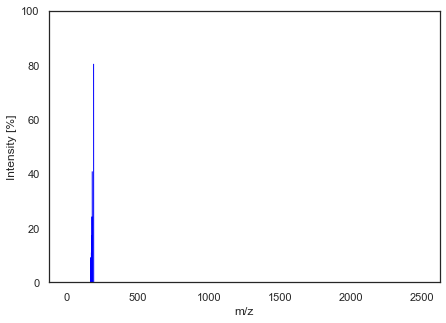

Matching spectra using cos_sim


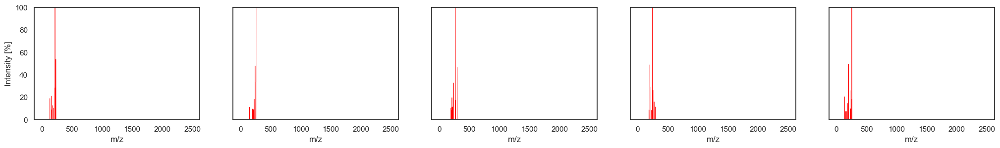

Matching spectra using eu_dist


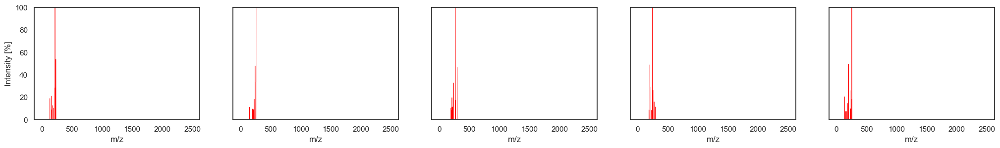

Matching spectra using per_diff


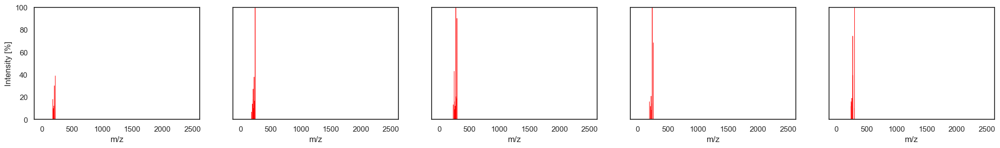

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998425
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.998389
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.998243
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.998068
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998027


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.056132
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.056760
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.059278
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.062167
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.062821


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
119846,WVVSZNPYNCNODU-PLQHRBFRSA-N,168.0808:6.192418 180.0808:17.925447 182.0839:3.269420 191.073:8.427195 192.0808:9.754860 193.076:4.051347 194.0964:4.278688 197.1073:12.041548 207.0679:13.460361 207.0917:13.105879 208.0757:100.0...,55.0,1,0.079898
29382,ZRJBHWIHUMBLCN-YQEJDHNASA-N,41.03761:0.298260 91.0526:0.198840 92.04895:0.395313 93.05614:0.198840 105.0557:0.198840 106.06213:0.494733 108.08207:0.198840 110.05922:2.416854 112.86987:0.085217 115.04964:0.494733 117.05432:0....,35.0,1,0.080823
37252,OXGUCUVFOIWWQJ-UHFFFAOYSA-N,151.0054:4.404404 179.0013:2.002002 227.0380:2.102102 241.0170:11.811812 242.0241:15.915916 243.0317:8.508509 245.0157:15.015015 255.0320:19.019019 270.0198:39.339339 271.0273:74.374374 272.0315:7...,40.0,0,0.085592
97395,WGTCMJBJRPKENJ-UHFFFAOYSA-N,94.960136:0.093938 94.973717:0.074276 94.995049:0.076461 95.107597:0.093938 95.167084:0.098307 95.195946:0.078646 95.212433:0.034954 95.259048:0.028400 95.354179:0.111415 95.400909:0.050246 95.447...,NaN,1,0.087623
82314,ZPEIMTDSQAKGNT-UHFFFAOYSA-N,211.0455:6.340852 214.0417:20.776942 215.0473:3.734336 216.0398:5.062657 233.0066:11.203008 234.01:2.556391 235.0043:3.784461 238.0694:2.907268 239.0766:57.092732 240.0803:7.418546 241.0673:7.1177...,30.0,1,0.087654


Intermediate spectrum


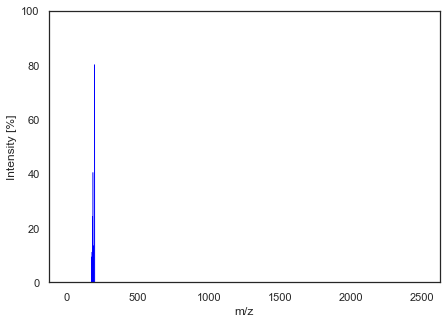

Matching spectra using cos_sim


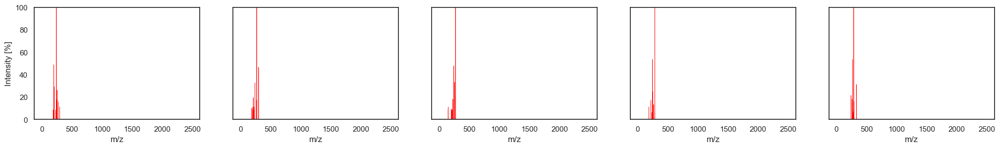

Matching spectra using eu_dist


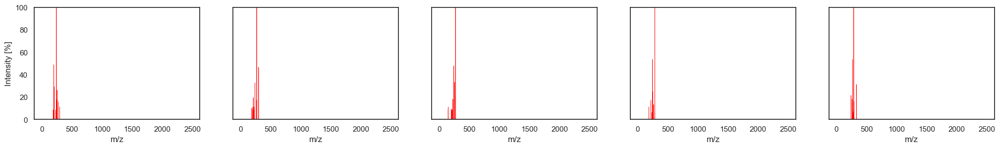

Matching spectra using per_diff


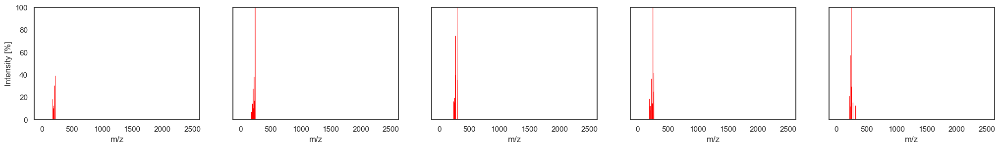

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998570
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.998451
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998361
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.998152
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.998094


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.053483
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.055667
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.057253
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.060804
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.061749


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
82314,ZPEIMTDSQAKGNT-UHFFFAOYSA-N,211.0455:6.340852 214.0417:20.776942 215.0473:3.734336 216.0398:5.062657 233.0066:11.203008 234.01:2.556391 235.0043:3.784461 238.0694:2.907268 239.0766:57.092732 240.0803:7.418546 241.0673:7.1177...,30.0,1,0.082704
97395,WGTCMJBJRPKENJ-UHFFFAOYSA-N,94.960136:0.093938 94.973717:0.074276 94.995049:0.076461 95.107597:0.093938 95.167084:0.098307 95.195946:0.078646 95.212433:0.034954 95.259048:0.028400 95.354179:0.111415 95.400909:0.050246 95.447...,NaN,1,0.084284
29382,ZRJBHWIHUMBLCN-YQEJDHNASA-N,41.03761:0.298260 91.0526:0.198840 92.04895:0.395313 93.05614:0.198840 105.0557:0.198840 106.06213:0.494733 108.08207:0.198840 110.05922:2.416854 112.86987:0.085217 115.04964:0.494733 117.05432:0....,35.0,1,0.084344
37252,OXGUCUVFOIWWQJ-UHFFFAOYSA-N,151.0054:4.404404 179.0013:2.002002 227.0380:2.102102 241.0170:11.811812 242.0241:15.915916 243.0317:8.508509 245.0157:15.015015 255.0320:19.019019 270.0198:39.339339 271.0273:74.374374 272.0315:7...,40.0,0,0.086284
114653,ZZWPMFROUHHAKY-UHFFFAOYSA-N,115.24103:1.600000 135.06708:1.900000 140.74843:1.400000 147.00644:6.200000 151.01059:2.300000 167.14136:1.800000 184.0473:4.000000 191.03391:1.600000 195.04582:1.400000 211.03777:6.200000 212.045...,30.0,0,0.086671


Intermediate spectrum


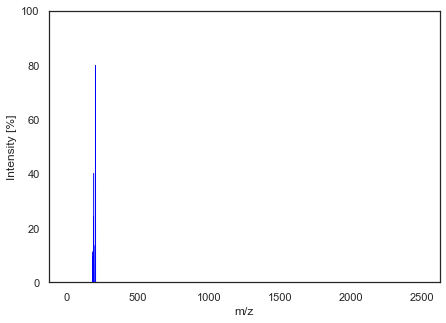

Matching spectra using cos_sim


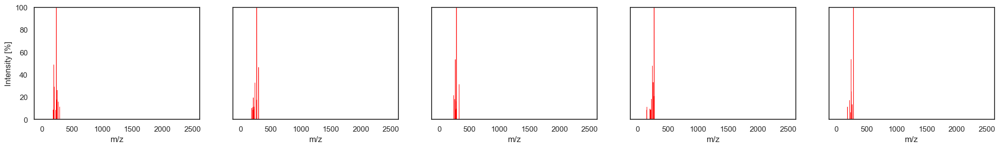

Matching spectra using eu_dist


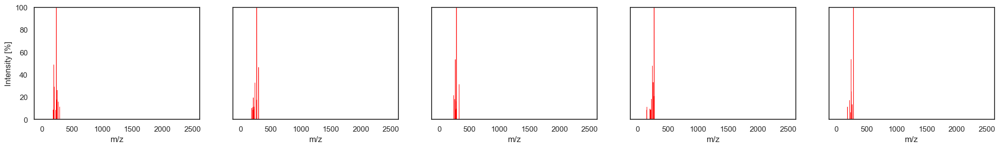

Matching spectra using per_diff


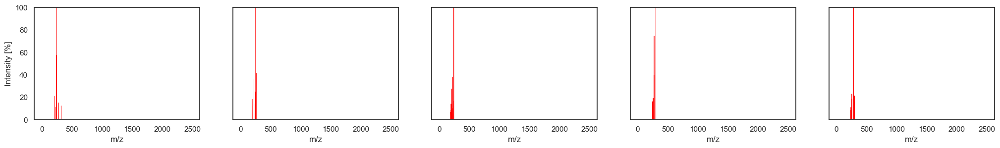

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998651
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998605
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.998404
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.998052
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.997976


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.051935
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.052813
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.056490
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.062419
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.063633


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
79729,XUKUURHRXDUEBC-KAYWLYCHSA-N,77.0386:5.585616 79.0543:3.470448 83.0491:4.413458 92.0495:6.645713 95.0487:1.702650 104.0499:3.763266 105.045:1.273625 109.045:2.245315 115.0543:5.813484 117.0577:1.411853 120.0444:2.820897 122.0...,75.0,1,0.080148
58338,JAUOIFJMECXRGI-UHFFFAOYSA-N,130.0641:0.507867 165.0685:0.629717 192.08:0.750139 193.0873:1.516460 204.0799:0.800354 214.0407:2.781605 215.0443:0.516910 216.0385:0.847952 216.0799:1.716370 217.0877:4.671707 218.0953:4.705026 ...,50.0,1,0.080508
82314,ZPEIMTDSQAKGNT-UHFFFAOYSA-N,211.0455:6.340852 214.0417:20.776942 215.0473:3.734336 216.0398:5.062657 233.0066:11.203008 234.01:2.556391 235.0043:3.784461 238.0694:2.907268 239.0766:57.092732 240.0803:7.418546 241.0673:7.1177...,30.0,1,0.083064
77253,CCQDWIRWKWIUKK-UHFFFAOYSA-O,107.01409:2.600000 175.00522:2.300000 200.05508:2.700000 202.01991:2.600000 229.02156:2.000000 242.01682:2.500000 242.04819:2.500000 243.02531:23.300000 243.03529:6.600000 244.03102:2.900000 244.2...,30.0,0,0.084003
80905,LGHZJDKSVUTELU-UHFFFAOYSA-N,132.9572:2.227265 170.0092:5.022481 182.0095:1.676017 183.0171:11.173908 184.0193:0.832440 198.0014:0.606930 217.9849:4.448961 218.009:17.026045 219.0113:1.471387 219.9816:1.194371 227.0163:1.3238...,40.0,0,0.085920


Intermediate spectrum


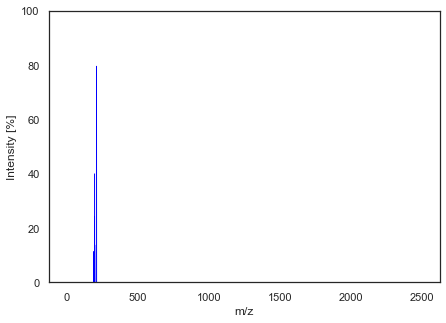

Matching spectra using cos_sim


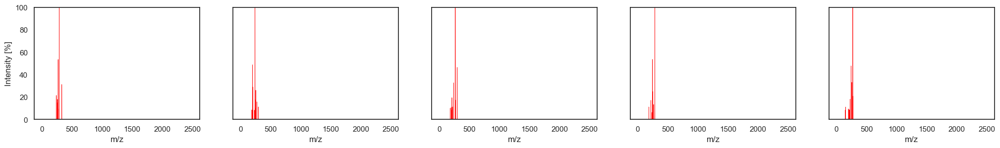

Matching spectra using eu_dist


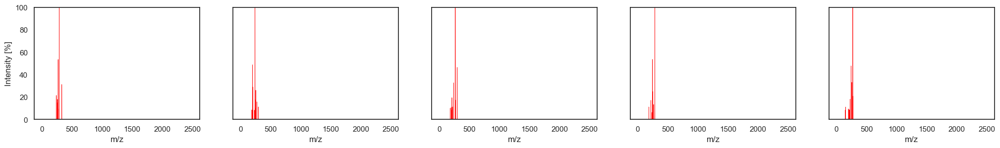

Matching spectra using per_diff


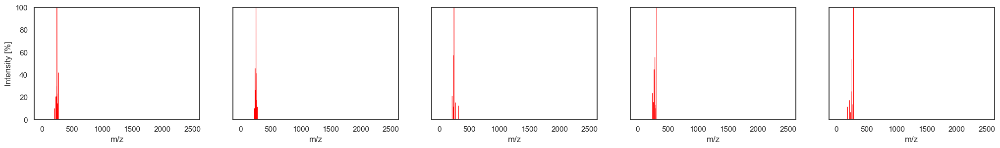

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998900
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998533
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.998208
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.998033
37567,GFDOSVZSTRYXMK-UHFFFAOYSA-N,188.91:3.142117 195.03:9.216458 205.0:6.575128 209.04:10.153948 217.08:6.374647 233.02:6.498953 237.06:10.403469 249.06:11.813569 257.1:6.781542 263.09:17.505297 275.13:18.121153 285.02:100.000000...,35.0,0,0.997979


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.046897
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.054168
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.059867
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.062727
37567,GFDOSVZSTRYXMK-UHFFFAOYSA-N,188.91:3.142117 195.03:9.216458 205.0:6.575128 209.04:10.153948 217.08:6.374647 233.02:6.498953 237.06:10.403469 249.06:11.813569 257.1:6.781542 263.09:17.505297 275.13:18.121153 285.02:100.000000...,35.0,0,0.063580


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
77253,CCQDWIRWKWIUKK-UHFFFAOYSA-O,107.01409:2.600000 175.00522:2.300000 200.05508:2.700000 202.01991:2.600000 229.02156:2.000000 242.01682:2.500000 242.04819:2.500000 243.02531:23.300000 243.03529:6.600000 244.03102:2.900000 244.2...,30.0,0,0.072735
58338,JAUOIFJMECXRGI-UHFFFAOYSA-N,130.0641:0.507867 165.0685:0.629717 192.08:0.750139 193.0873:1.516460 204.0799:0.800354 214.0407:2.781605 215.0443:0.516910 216.0385:0.847952 216.0799:1.716370 217.0877:4.671707 218.0953:4.705026 ...,50.0,1,0.074167
79729,XUKUURHRXDUEBC-KAYWLYCHSA-N,77.0386:5.585616 79.0543:3.470448 83.0491:4.413458 92.0495:6.645713 95.0487:1.702650 104.0499:3.763266 105.045:1.273625 109.045:2.245315 115.0543:5.813484 117.0577:1.411853 120.0444:2.820897 122.0...,75.0,1,0.078682
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.086004
114653,ZZWPMFROUHHAKY-UHFFFAOYSA-N,115.24103:1.600000 135.06708:1.900000 140.74843:1.400000 147.00644:6.200000 151.01059:2.300000 167.14136:1.800000 184.0473:4.000000 191.03391:1.600000 195.04582:1.400000 211.03777:6.200000 212.045...,30.0,0,0.088695


Intermediate spectrum


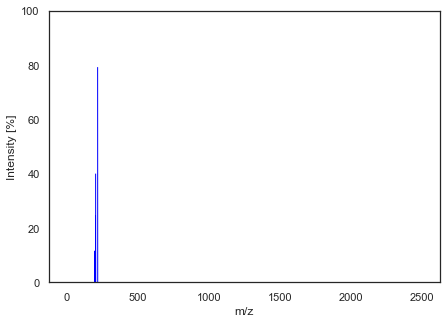

Matching spectra using cos_sim


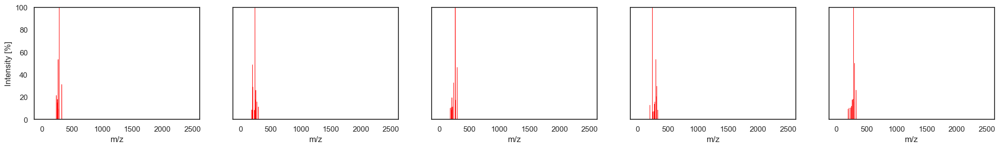

Matching spectra using eu_dist


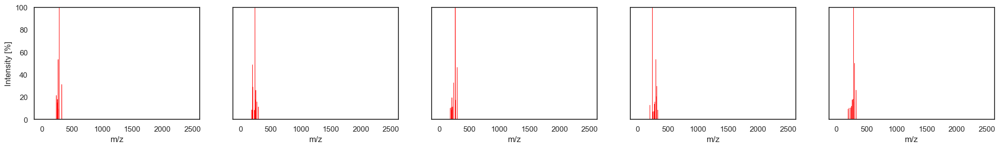

Matching spectra using per_diff


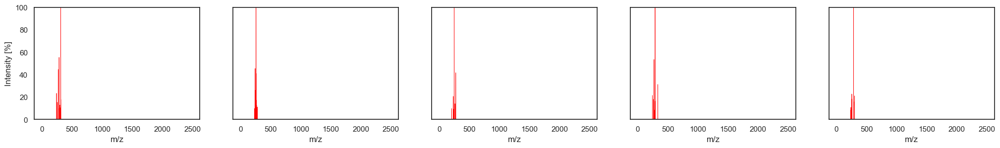

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.999094
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.998280
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.998224
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.998197
37567,GFDOSVZSTRYXMK-UHFFFAOYSA-N,188.91:3.142117 195.03:9.216458 205.0:6.575128 209.04:10.153948 217.08:6.374647 233.02:6.498953 237.06:10.403469 249.06:11.813569 257.1:6.781542 263.09:17.505297 275.13:18.121153 285.02:100.000000...,35.0,0,0.997969


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.042576
41739,AOUZZRQCLQLQIF-UHFFFAOYSA-N,50.000588:0.008720 50.271572:0.009682 50.431241:0.008861 50.961796:0.010720 52.135422:0.008739 52.657860:0.009817 52.683675:0.006298 52.858087:0.011275 52.910530:0.006003 53.002555:0.014260 53.578...,35.0,1,0.058644
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.059606
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.060044
37567,GFDOSVZSTRYXMK-UHFFFAOYSA-N,188.91:3.142117 195.03:9.216458 205.0:6.575128 209.04:10.153948 217.08:6.374647 233.02:6.498953 237.06:10.403469 249.06:11.813569 257.1:6.781542 263.09:17.505297 275.13:18.121153 285.02:100.000000...,35.0,0,0.063733


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
77253,CCQDWIRWKWIUKK-UHFFFAOYSA-O,107.01409:2.600000 175.00522:2.300000 200.05508:2.700000 202.01991:2.600000 229.02156:2.000000 242.01682:2.500000 242.04819:2.500000 243.02531:23.300000 243.03529:6.600000 244.03102:2.900000 244.2...,30.0,0,0.064761
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.077275
58338,JAUOIFJMECXRGI-UHFFFAOYSA-N,130.0641:0.507867 165.0685:0.629717 192.08:0.750139 193.0873:1.516460 204.0799:0.800354 214.0407:2.781605 215.0443:0.516910 216.0385:0.847952 216.0799:1.716370 217.0877:4.671707 218.0953:4.705026 ...,50.0,1,0.078634
89165,PLAPMLGJVGLZOV-VPRICQMDSA-N,161.0226:8.908909 225.0583:6.906907 241.0517:7.707708 253.0523:9.309309 255.0357:9.009009 269.0464:43.943944 270.0514:13.713714 284.0354:16.316316 285.0428:12.412412 297.0403:100.000000 298.0472:2...,40.0,0,0.088633
37567,GFDOSVZSTRYXMK-UHFFFAOYSA-N,188.91:3.142117 195.03:9.216458 205.0:6.575128 209.04:10.153948 217.08:6.374647 233.02:6.498953 237.06:10.403469 249.06:11.813569 257.1:6.781542 263.09:17.505297 275.13:18.121153 285.02:100.000000...,35.0,0,0.089287


Intermediate spectrum


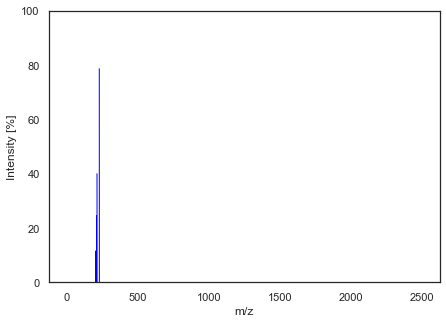

Matching spectra using cos_sim


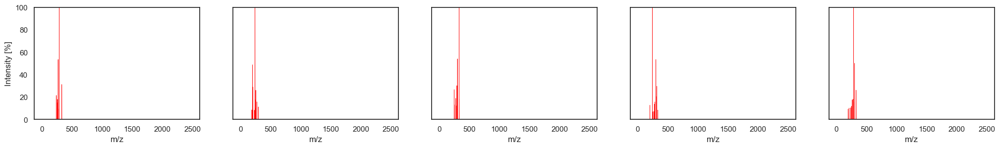

Matching spectra using eu_dist


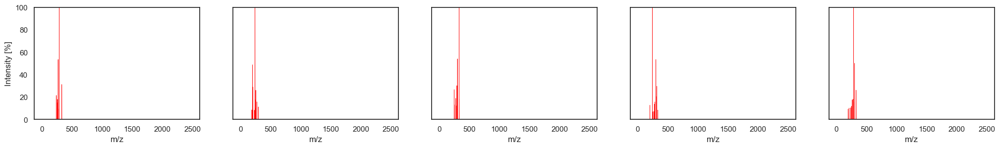

Matching spectra using per_diff


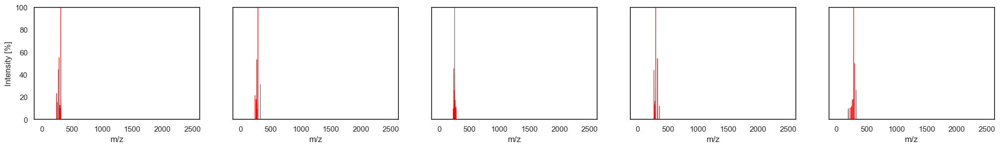

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.999177
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.998471
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.998322
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.998092
21360,DQBXBQIOPVLJEV-SLTMLOGKSA-N,116.9291:1.506507 205.1942:2.944945 207.1767:20.752753 217.1989:2.978979 231.1742:1.379379 233.1501:2.127127 235.2046:3.530531 241.6728:1.116116 249.1858:28.236236 251.1651:51.506507 253.1771:1.58...,40.0,0,0.997896


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.040579
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.055292
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.057933
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.061769
21360,DQBXBQIOPVLJEV-SLTMLOGKSA-N,116.9291:1.506507 205.1942:2.944945 207.1767:20.752753 217.1989:2.978979 231.1742:1.379379 233.1501:2.127127 235.2046:3.530531 241.6728:1.116116 249.1858:28.236236 251.1651:51.506507 253.1771:1.58...,40.0,0,0.064867


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
77253,CCQDWIRWKWIUKK-UHFFFAOYSA-O,107.01409:2.600000 175.00522:2.300000 200.05508:2.700000 202.01991:2.600000 229.02156:2.000000 242.01682:2.500000 242.04819:2.500000 243.02531:23.300000 243.03529:6.600000 244.03102:2.900000 244.2...,30.0,0,0.060463
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.077057
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.077320
89165,PLAPMLGJVGLZOV-VPRICQMDSA-N,161.0226:8.908909 225.0583:6.906907 241.0517:7.707708 253.0523:9.309309 255.0357:9.009009 269.0464:43.943944 270.0514:13.713714 284.0354:16.316316 285.0428:12.412412 297.0403:100.000000 298.0472:2...,40.0,0,0.083235
72035,QUCQEUCGKKTEBI-UHFFFAOYSA-N,264.10193:1.500000 275.09921:0.800000 278.08014:1.200000 279.09009:0.700000 279.12198:0.700000 291.1012:0.700000 291.12692:7.100000 292.0979:7.900000 292.13385:0.900000 293.10342:5.900000 294.0782...,30.0,1,0.085498


Intermediate spectrum


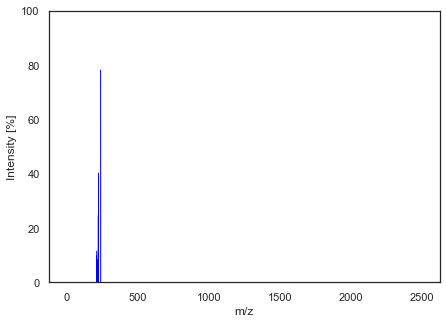

Matching spectra using cos_sim


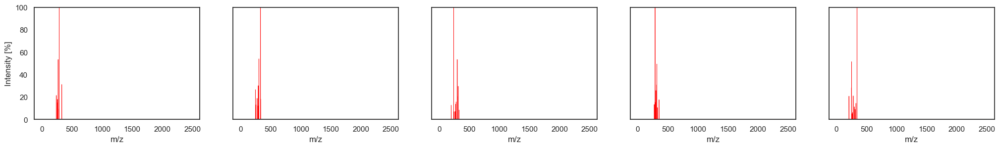

Matching spectra using eu_dist


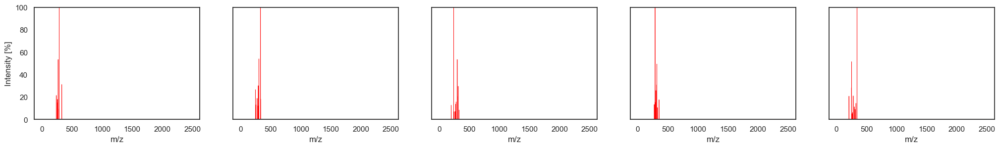

Matching spectra using per_diff


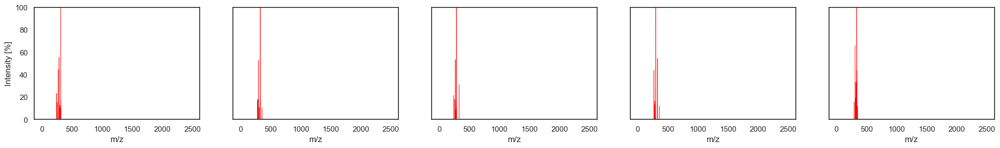

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.999064
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.998532
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.998263
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.998211
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.998115


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.043271
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.054180
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.058945
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.059818
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.061408


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
77253,CCQDWIRWKWIUKK-UHFFFAOYSA-O,107.01409:2.600000 175.00522:2.300000 200.05508:2.700000 202.01991:2.600000 229.02156:2.000000 242.01682:2.500000 242.04819:2.500000 243.02531:23.300000 243.03529:6.600000 244.03102:2.900000 244.2...,30.0,0,0.065265
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.073332
24490,ODBRNZZJSYPIDI-UHFFFAOYSA-N,50.317611:0.024154 50.394581:0.025566 51.212217:0.033040 51.440161:0.028329 51.570219:0.028209 51.595955:0.022713 51.859465:0.035907 52.454383:0.034170 52.621215:0.039795 52.841998:0.019150 52.930...,45.0,1,0.077955
243,MYFFDMMUGIQJQM-UHFFFAOYSA-N,70.071472:0.164519 92.413628:0.267501 95.049973:0.403135 99.999359:0.139402 106.005264:0.173310 119.048035:0.141913 120.853966:0.378017 122.034203:0.189637 122.608017:0.182101 124.052437:0.224801 ...,NaN,1,0.079652
72035,QUCQEUCGKKTEBI-UHFFFAOYSA-N,264.10193:1.500000 275.09921:0.800000 278.08014:1.200000 279.09009:0.700000 279.12198:0.700000 291.1012:0.700000 291.12692:7.100000 292.0979:7.900000 292.13385:0.900000 293.10342:5.900000 294.0782...,30.0,1,0.080686


Intermediate spectrum


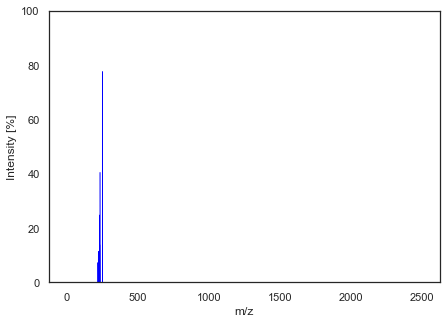

Matching spectra using cos_sim


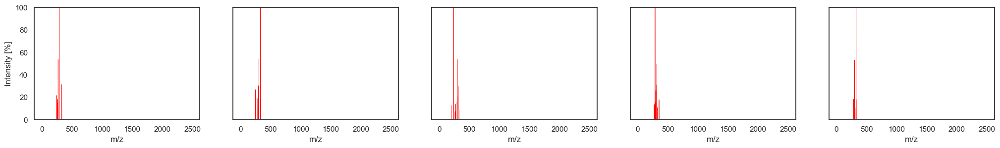

Matching spectra using eu_dist


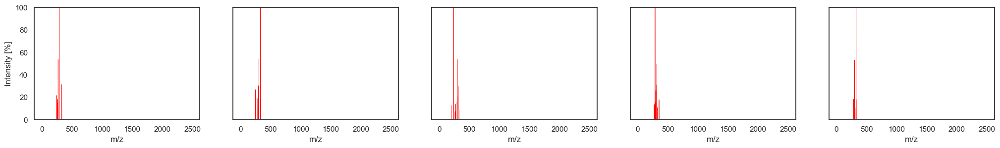

Matching spectra using per_diff


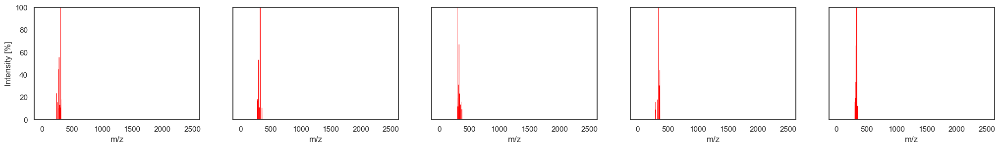

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998763
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.998369
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.998131
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.998061
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.998050


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.049739
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.057112
103106,PLAPMLGJVGLZOV-UHFFFAOYSA-N,83.01039:0.800000 105.03298:0.700000 109.02959:1.100000 125.20998:1.000000 133.02583:5.200000 133.03461:2.800000 134.02969:1.300000 135.04169:0.900000 143.08342:1.200000 145.02902:0.500000 147.041...,30.0,0,0.061146
24063,MTQVPZUZBBTLNO-HSLVGEKZSA-N,50.006381:0.055964 50.516055:0.061974 50.740422:0.037592 51.329031:0.045572 51.597484:0.048092 51.882122:0.047237 52.845295:0.032705 53.240413:0.045350 53.297364:0.040563 53.442276:0.024088 53.478...,45.0,1,0.062277
3031,DDHXERAMOVJOAJ-UHFFFAOYSA-N,181.12:2.008673 201.08:12.666328 223.13:1.828778 233.44:2.610344 240.99:100.000000 249.09:6.862092 257.05:5.076373 266.08:7.131174 273.13:13.693162 283.12:15.653828 289.09:3.658603 301.06:53.47431...,35.0,1,0.062443


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
243,MYFFDMMUGIQJQM-UHFFFAOYSA-N,70.071472:0.164519 92.413628:0.267501 95.049973:0.403135 99.999359:0.139402 106.005264:0.173310 119.048035:0.141913 120.853966:0.378017 122.034203:0.189637 122.608017:0.182101 124.052437:0.224801 ...,NaN,1,0.072374
24490,ODBRNZZJSYPIDI-UHFFFAOYSA-N,50.317611:0.024154 50.394581:0.025566 51.212217:0.033040 51.440161:0.028329 51.570219:0.028209 51.595955:0.022713 51.859465:0.035907 52.454383:0.034170 52.621215:0.039795 52.841998:0.019150 52.930...,45.0,1,0.072554
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.075116
43435,ZRZQXSGEIJXJEO-RBBKRZOGSA-N,70.068886:0.009864 70.131050:0.011549 70.427803:0.007880 70.520721:0.005955 70.591446:0.006616 70.686142:0.009684 70.698067:0.009504 71.180359:0.010707 72.241013:0.014857 72.340073:0.005534 73.078...,NaN,1,0.076748
23678,FIAAVMJLAGNUKW-UHFFFAOYSA-N,50.834187:0.048758 50.927705:0.047555 51.941630:0.068055 52.319525:0.035401 52.922021:0.035194 53.610315:0.051062 54.054487:0.045226 54.093273:0.037987 55.292223:0.065901 55.871856:0.051554 56.961...,45.0,0,0.079364


Intermediate spectrum


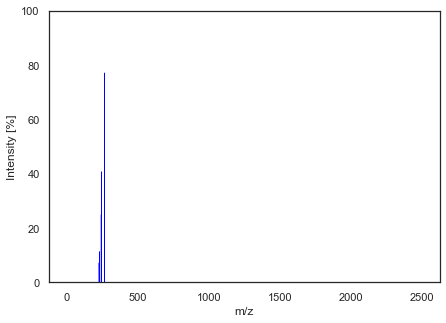

Matching spectra using cos_sim


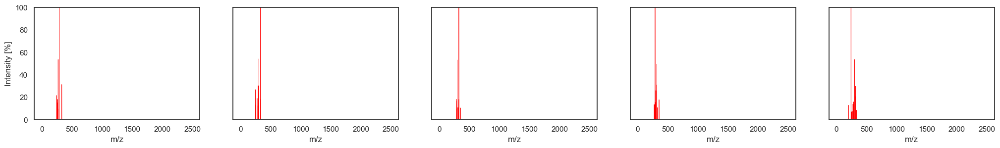

Matching spectra using eu_dist


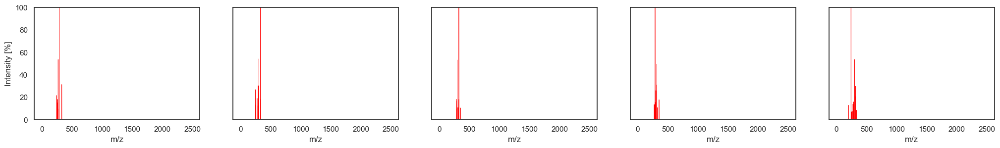

Matching spectra using per_diff


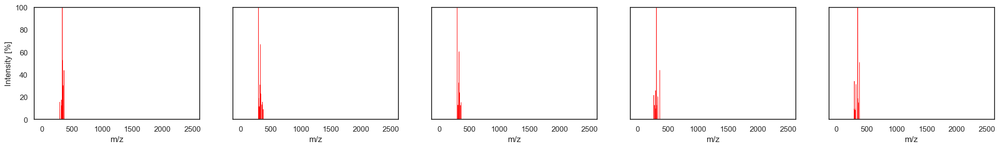

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.998251
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.998168
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.997986
120658,BZXULYMZYPRZOG-UHFFFAOYSA-N,76.892479:0.049922 76.996712:0.040134 77.050545:0.068765 77.340988:0.068521 77.467377:0.034994 77.507881:0.043560 78.105774:0.037931 79.550644:0.027653 79.644119:0.029611 79.988831:0.015172 80.055...,NaN,1,0.997966
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.997962


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
18352,BMKQPAJRQUUYGC-UHFFFAOYSA-N,50.103153:0.012101 50.733988:0.010690 52.232371:0.014624 55.055064:0.038830 55.306454:0.027890 56.883499:0.015188 57.034284:0.179006 57.070659:0.021170 57.166774:0.011603 57.455091:0.013054 58.065...,35.0,1,0.059151
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.060530
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.063473
120658,BZXULYMZYPRZOG-UHFFFAOYSA-N,76.892479:0.049922 76.996712:0.040134 77.050545:0.068765 77.340988:0.068521 77.467377:0.034994 77.507881:0.043560 78.105774:0.037931 79.550644:0.027653 79.644119:0.029611 79.988831:0.015172 80.055...,NaN,1,0.063786
19656,PONPPNYZKHNPKZ-BAHCCNBTSA-N,50.083400:0.026926 50.472099:0.025429 50.708587:0.050559 51.182374:0.045691 51.599559:0.043332 51.658869:0.024844 51.665314:0.048768 52.162536:0.053541 52.358561:0.054259 52.447667:0.030050 52.675...,65.0,0,0.063837


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
243,MYFFDMMUGIQJQM-UHFFFAOYSA-N,70.071472:0.164519 92.413628:0.267501 95.049973:0.403135 99.999359:0.139402 106.005264:0.173310 119.048035:0.141913 120.853966:0.378017 122.034203:0.189637 122.608017:0.182101 124.052437:0.224801 ...,NaN,1,0.071447
23678,FIAAVMJLAGNUKW-UHFFFAOYSA-N,50.834187:0.048758 50.927705:0.047555 51.941630:0.068055 52.319525:0.035401 52.922021:0.035194 53.610315:0.051062 54.054487:0.045226 54.093273:0.037987 55.292223:0.065901 55.871856:0.051554 56.961...,45.0,0,0.074453
43435,ZRZQXSGEIJXJEO-RBBKRZOGSA-N,70.068886:0.009864 70.131050:0.011549 70.427803:0.007880 70.520721:0.005955 70.591446:0.006616 70.686142:0.009684 70.698067:0.009504 71.180359:0.010707 72.241013:0.014857 72.340073:0.005534 73.078...,NaN,1,0.076299
94853,SOFSXTKPGSIDCI-UHFFFAOYSA-N,108.01902:2.500000 109.0257:2.100000 142.06317:2.100000 217.05859:1.700000 220.10416:2.300000 220.11815:1.800000 225.05968:2.300000 230.9919:1.900000 231.0887:2.000000 240.08061:2.200000 253.05664...,30.0,0,0.076359
24490,ODBRNZZJSYPIDI-UHFFFAOYSA-N,50.317611:0.024154 50.394581:0.025566 51.212217:0.033040 51.440161:0.028329 51.570219:0.028209 51.595955:0.022713 51.859465:0.035907 52.454383:0.034170 52.621215:0.039795 52.841998:0.019150 52.930...,45.0,1,0.079947


Intermediate spectrum


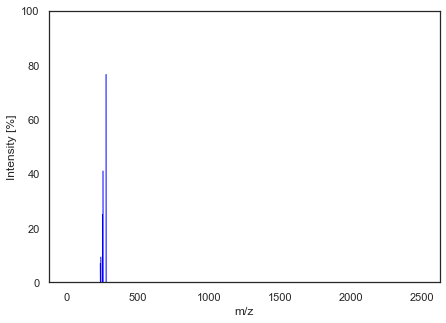

Matching spectra using cos_sim


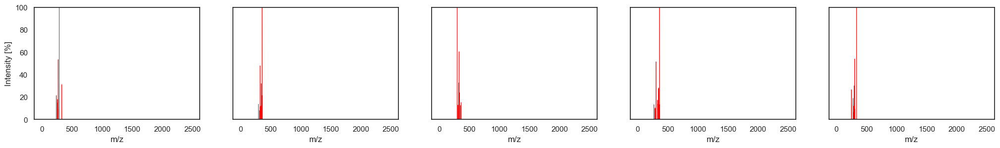

Matching spectra using eu_dist


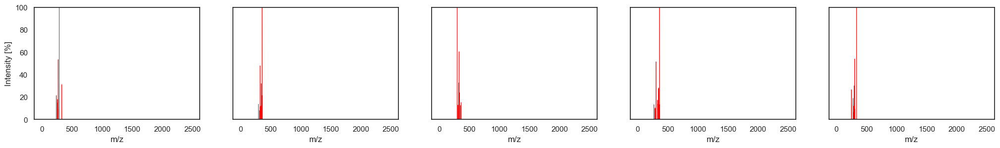

Matching spectra using per_diff


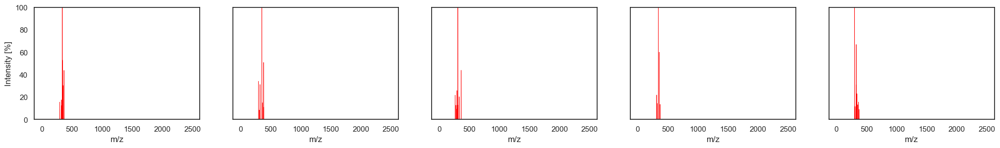

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.998257
44633,PZYZNVLXKYMURF-UHFFFAOYSA-N,50.321789:0.125127 50.749366:0.084716 50.755349:0.090879 50.970280:0.058963 51.713743:0.145861 51.940342:0.098456 52.252815:0.095397 52.979052:0.139160 53.579840:0.130577 53.823605:0.150504 55.644...,65.0,1,0.998041
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.997863
94849,SOFSXTKPGSIDCI-UHFFFAOYSA-N,132.02505:1.500000 256.0929:2.300000 280.08679:1.600000 280.09979:4.900000 281.1087:4.300000 284.07275:1.500000 285.88217:1.400000 286.12497:1.400000 293.0762:1.400000 294.11411:1.700000 294.20535...,30.0,0,0.997757
120658,BZXULYMZYPRZOG-UHFFFAOYSA-N,76.892479:0.049922 76.996712:0.040134 77.050545:0.068765 77.340988:0.068521 77.467377:0.034994 77.507881:0.043560 78.105774:0.037931 79.550644:0.027653 79.644119:0.029611 79.988831:0.015172 80.055...,NaN,1,0.997661


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.059037
44633,PZYZNVLXKYMURF-UHFFFAOYSA-N,50.321789:0.125127 50.749366:0.084716 50.755349:0.090879 50.970280:0.058963 51.713743:0.145861 51.940342:0.098456 52.252815:0.095397 52.979052:0.139160 53.579840:0.130577 53.823605:0.150504 55.644...,65.0,1,0.062594
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.065381
94849,SOFSXTKPGSIDCI-UHFFFAOYSA-N,132.02505:1.500000 256.0929:2.300000 280.08679:1.600000 280.09979:4.900000 281.1087:4.300000 284.07275:1.500000 285.88217:1.400000 286.12497:1.400000 293.0762:1.400000 294.11411:1.700000 294.20535...,30.0,0,0.066980
120658,BZXULYMZYPRZOG-UHFFFAOYSA-N,76.892479:0.049922 76.996712:0.040134 77.050545:0.068765 77.340988:0.068521 77.467377:0.034994 77.507881:0.043560 78.105774:0.037931 79.550644:0.027653 79.644119:0.029611 79.988831:0.015172 80.055...,NaN,1,0.068395


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.068531
94853,SOFSXTKPGSIDCI-UHFFFAOYSA-N,108.01902:2.500000 109.0257:2.100000 142.06317:2.100000 217.05859:1.700000 220.10416:2.300000 220.11815:1.800000 225.05968:2.300000 230.9919:1.900000 231.0887:2.000000 240.08061:2.200000 253.05664...,30.0,0,0.074593
243,MYFFDMMUGIQJQM-UHFFFAOYSA-N,70.071472:0.164519 92.413628:0.267501 95.049973:0.403135 99.999359:0.139402 106.005264:0.173310 119.048035:0.141913 120.853966:0.378017 122.034203:0.189637 122.608017:0.182101 124.052437:0.224801 ...,NaN,1,0.076548
23678,FIAAVMJLAGNUKW-UHFFFAOYSA-N,50.834187:0.048758 50.927705:0.047555 51.941630:0.068055 52.319525:0.035401 52.922021:0.035194 53.610315:0.051062 54.054487:0.045226 54.093273:0.037987 55.292223:0.065901 55.871856:0.051554 56.961...,45.0,0,0.078712
43435,ZRZQXSGEIJXJEO-RBBKRZOGSA-N,70.068886:0.009864 70.131050:0.011549 70.427803:0.007880 70.520721:0.005955 70.591446:0.006616 70.686142:0.009684 70.698067:0.009504 71.180359:0.010707 72.241013:0.014857 72.340073:0.005534 73.078...,NaN,1,0.083377


Intermediate spectrum


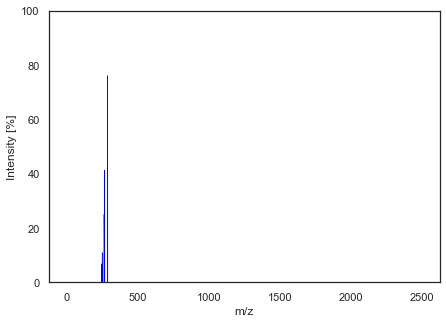

Matching spectra using cos_sim


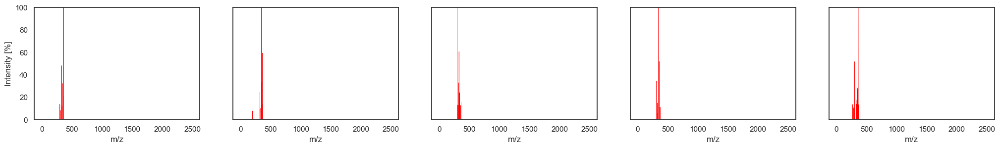

Matching spectra using eu_dist


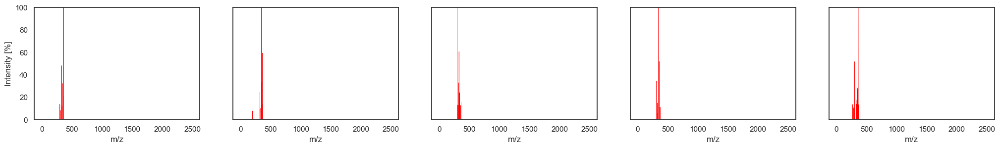

Matching spectra using per_diff


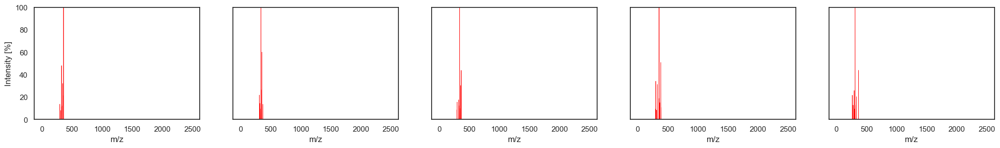

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.998147
44633,PZYZNVLXKYMURF-UHFFFAOYSA-N,50.321789:0.125127 50.749366:0.084716 50.755349:0.090879 50.970280:0.058963 51.713743:0.145861 51.940342:0.098456 52.252815:0.095397 52.979052:0.139160 53.579840:0.130577 53.823605:0.150504 55.644...,65.0,1,0.998016
94849,SOFSXTKPGSIDCI-UHFFFAOYSA-N,132.02505:1.500000 256.0929:2.300000 280.08679:1.600000 280.09979:4.900000 281.1087:4.300000 284.07275:1.500000 285.88217:1.400000 286.12497:1.400000 293.0762:1.400000 294.11411:1.700000 294.20535...,30.0,0,0.997801
10702,BWRBGHBJBQFFAW-UHFFFAOYSA-N,67.663986:0.737927 69.126747:0.081468 72.605507:0.029228 72.670219:0.584158 72.957123:0.611406 75.295677:0.223496 78.483131:0.235168 83.049660:0.748474 85.065353:6.232471 85.961937:0.085310 91.846...,NaN,1,0.997549
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.997509


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.060882
44633,PZYZNVLXKYMURF-UHFFFAOYSA-N,50.321789:0.125127 50.749366:0.084716 50.755349:0.090879 50.970280:0.058963 51.713743:0.145861 51.940342:0.098456 52.252815:0.095397 52.979052:0.139160 53.579840:0.130577 53.823605:0.150504 55.644...,65.0,1,0.062985
94849,SOFSXTKPGSIDCI-UHFFFAOYSA-N,132.02505:1.500000 256.0929:2.300000 280.08679:1.600000 280.09979:4.900000 281.1087:4.300000 284.07275:1.500000 285.88217:1.400000 286.12497:1.400000 293.0762:1.400000 294.11411:1.700000 294.20535...,30.0,0,0.066314
10702,BWRBGHBJBQFFAW-UHFFFAOYSA-N,67.663986:0.737927 69.126747:0.081468 72.605507:0.029228 72.670219:0.584158 72.957123:0.611406 75.295677:0.223496 78.483131:0.235168 83.049660:0.748474 85.065353:6.232471 85.961937:0.085310 91.846...,NaN,1,0.070011
76706,ODBRNZZJSYPIDI-VJXVFPJBSA-N,137.0230:2.421754 165.0199:4.978947 283.0631:9.263158 286.0511:3.312982 287.0579:6.389474 297.0790:9.305263 299.0582:100.000000 299.1482:18.252632 300.0640:13.466667 300.1537:3.104561 311.0588:12....,30.0,1,0.070586


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
39499,AHUAGKUYEMQHTH-UHFFFAOYSA-N,50.462653:0.021826 50.798771:0.015799 51.858204:0.020931 52.530646:0.021830 53.279346:0.015282 53.993954:0.019885 54.511615:0.021200 54.607769:0.020993 55.411382:0.023180 55.718513:0.013706 56.658...,35.0,1,0.060245
8146,UWTOESDPWKUNBD-UHFFFAOYSA-N,50.468224:0.019410 50.572450:0.009263 50.587869:0.012439 50.728168:0.018465 50.743646:0.011595 51.338547:0.008072 51.820041:0.009565 52.178873:0.009252 52.296220:0.009226 52.363832:0.022240 52.410...,35.0,1,0.075327
94853,SOFSXTKPGSIDCI-UHFFFAOYSA-N,108.01902:2.500000 109.0257:2.100000 142.06317:2.100000 217.05859:1.700000 220.10416:2.300000 220.11815:1.800000 225.05968:2.300000 230.9919:1.900000 231.0887:2.000000 240.08061:2.200000 253.05664...,30.0,0,0.083114
33856,VDZBWCCJLPCEQQ-UHFFFAOYSA-M,50.282975:0.036758 50.756028:0.038870 51.036189:0.043112 51.148031:0.043022 51.524580:0.048687 51.940277:0.151773 51.973292:0.038322 52.963176:0.040464 54.014780:0.046166 54.045167:0.039397 54.150...,65.0,1,0.083863
98787,IJSJXKCVRHBPSG-UHFFFAOYSA-N,100.000465:0.408539 100.075394:0.828119 105.033287:0.640412 108.021545:1.118881 109.431450:0.316526 114.692955:0.839161 124.050156:0.511594 132.623093:0.426941 132.958466:0.728745 135.040955:0.379...,NaN,1,0.084051


Intermediate spectrum


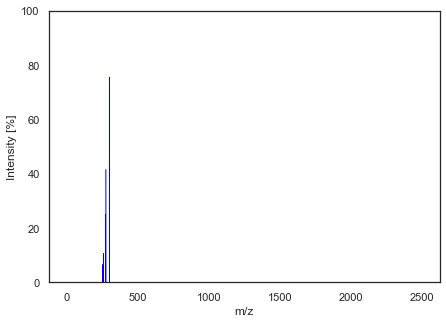

Matching spectra using cos_sim


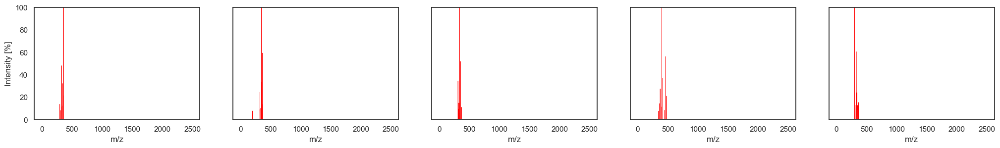

Matching spectra using eu_dist


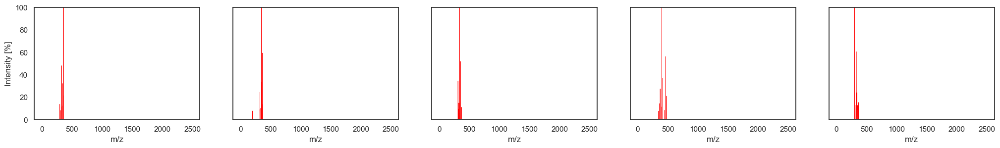

Matching spectra using per_diff


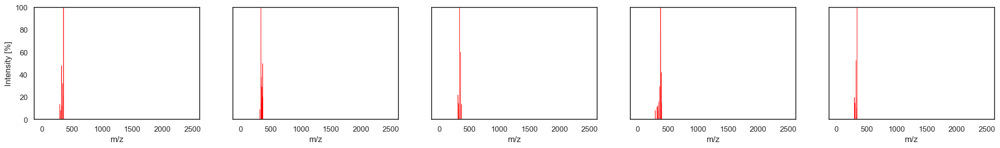

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.998914
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.998540
94999,CJDRUOGAGYHKKD-UORGRDHFSA-N,55.05479:1.000000 56.04803:0.600000 57.03426:0.700000 67.04464:0.500000 67.05092:1.000000 68.05476:0.600000 70.07207:0.800000 71.01311:0.500000 77.02931:0.900000 77.03999:3.000000 79.0553:5.600000...,50.0,1,0.998407
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.998331
99946,DUQSSEQKLJQACA-QPQUHBLXSA-N,71.932076:5.731571 72.053719:2.181181 79.020729:1.751313 79.053696:4.792231 81.029350:5.206177 82.062988:1.592103 91.057404:5.142493 93.070259:1.814998 95.014687:2.977233 95.047768:10.571565 95.08...,NaN,1,0.998321


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.046605
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.054040
94999,CJDRUOGAGYHKKD-UORGRDHFSA-N,55.05479:1.000000 56.04803:0.600000 57.03426:0.700000 67.04464:0.500000 67.05092:1.000000 68.05476:0.600000 70.07207:0.800000 71.01311:0.500000 77.02931:0.900000 77.03999:3.000000 79.0553:5.600000...,50.0,1,0.056449
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.057772
99946,DUQSSEQKLJQACA-QPQUHBLXSA-N,71.932076:5.731571 72.053719:2.181181 79.020729:1.751313 79.053696:4.792231 81.029350:5.206177 82.062988:1.592103 91.057404:5.142493 93.070259:1.814998 95.014687:2.977233 95.047768:10.571565 95.08...,NaN,1,0.057957


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.054658
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.060868
832,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.137064:3.259354 50.206702:3.648025 50.364076:3.459316 50.401366:3.931560 50.659396:4.277983 50.743787:3.969491 50.786763:3.244447 50.796894:3.400451 50.886424:3.365056 50.913883:3.200533 50.994...,65.0,0,0.070250
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.073537
79788,SEQDDYPDSLOBDC-UHFFFAOYSA-N,42.32975:0.034389 43.01548:0.034389 43.29482:0.040120 43.29759:0.040120 44.44088:0.034389 45.01529:0.034389 50.02083:0.034389 51.02232:0.040120 51.02834:0.040120 52.93861:0.034389 63.02095:0.03438...,35.0,1,0.076810


Intermediate spectrum


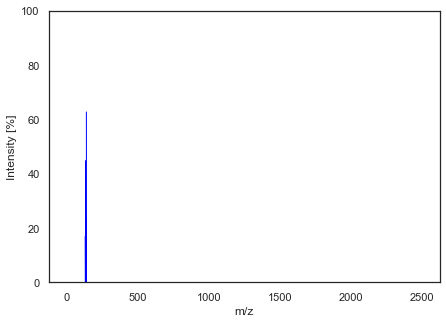

Matching spectra using cos_sim


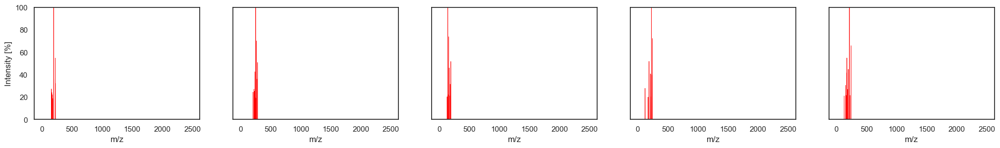

Matching spectra using eu_dist


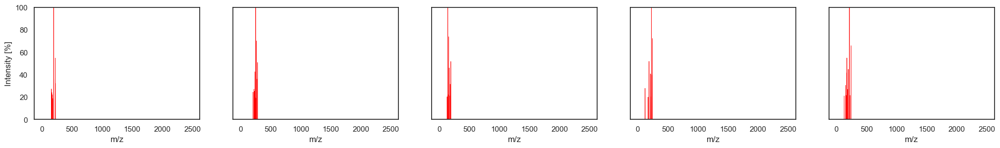

Matching spectra using per_diff


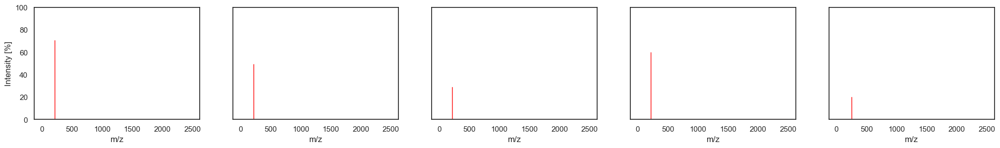

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.998951
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.998331
99946,DUQSSEQKLJQACA-QPQUHBLXSA-N,71.932076:5.731571 72.053719:2.181181 79.020729:1.751313 79.053696:4.792231 81.029350:5.206177 82.062988:1.592103 91.057404:5.142493 93.070259:1.814998 95.014687:2.977233 95.047768:10.571565 95.08...,NaN,1,0.998299
102478,UZLBTLIRYSYTRG-UHFFFAOYSA-N,53.7233:1.200000 69.03306:3.400000 71.01266:1.200000 73.03008:2.000000 89.02194:4.600000 95.00515:1.500000 95.01112:2.400000 95.74177:1.600000 101.02486:11.700000 102.0264:1.300000 107.04694:2.600...,30.0,0,0.998239
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.998239


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.045792
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.057769
99946,DUQSSEQKLJQACA-QPQUHBLXSA-N,71.932076:5.731571 72.053719:2.181181 79.020729:1.751313 79.053696:4.792231 81.029350:5.206177 82.062988:1.592103 91.057404:5.142493 93.070259:1.814998 95.014687:2.977233 95.047768:10.571565 95.08...,NaN,1,0.058333
102478,UZLBTLIRYSYTRG-UHFFFAOYSA-N,53.7233:1.200000 69.03306:3.400000 71.01266:1.200000 73.03008:2.000000 89.02194:4.600000 95.00515:1.500000 95.01112:2.400000 95.74177:1.600000 101.02486:11.700000 102.0264:1.300000 107.04694:2.600...,30.0,0,0.059346
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.059353


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.054048
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.058083
79788,SEQDDYPDSLOBDC-UHFFFAOYSA-N,42.32975:0.034389 43.01548:0.034389 43.29482:0.040120 43.29759:0.040120 44.44088:0.034389 45.01529:0.034389 50.02083:0.034389 51.02232:0.040120 51.02834:0.040120 52.93861:0.034389 63.02095:0.03438...,35.0,1,0.073736
832,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.137064:3.259354 50.206702:3.648025 50.364076:3.459316 50.401366:3.931560 50.659396:4.277983 50.743787:3.969491 50.786763:3.244447 50.796894:3.400451 50.886424:3.365056 50.913883:3.200533 50.994...,65.0,0,0.075555
39812,NWZYTZHMCGWGOF-HLIZFUEWSA-N,50.006881:0.079092 50.237931:0.076112 50.254789:0.051729 50.457145:0.121428 50.591851:0.026256 51.444431:0.064099 51.860490:0.105573 52.162581:0.114648 52.327464:0.056289 52.630478:0.019613 52.724...,35.0,1,0.077155


Intermediate spectrum


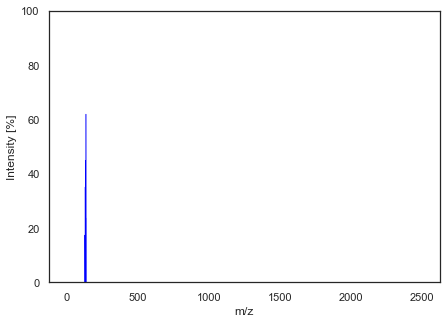

Matching spectra using cos_sim


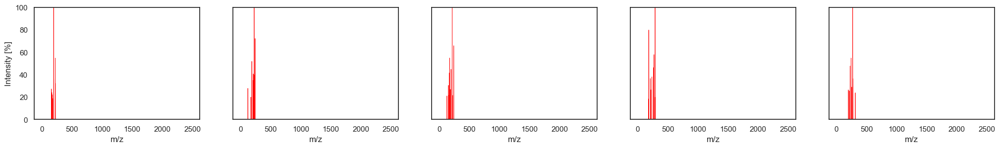

Matching spectra using eu_dist


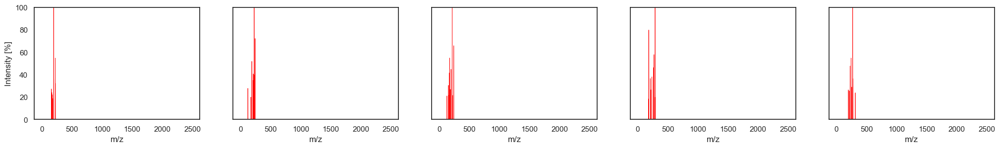

Matching spectra using per_diff


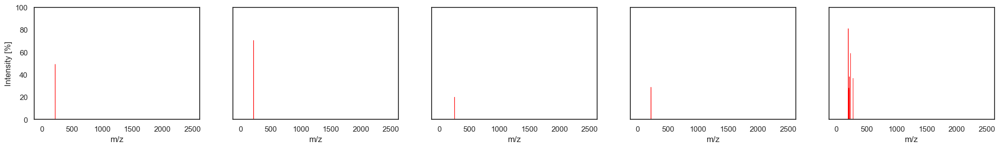

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.998836
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.998433
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.998272
102478,UZLBTLIRYSYTRG-UHFFFAOYSA-N,53.7233:1.200000 69.03306:3.400000 71.01266:1.200000 73.03008:2.000000 89.02194:4.600000 95.00515:1.500000 95.01112:2.400000 95.74177:1.600000 101.02486:11.700000 102.0264:1.300000 107.04694:2.600...,30.0,0,0.998269
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.998180


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.048257
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.055988
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.058785
102478,UZLBTLIRYSYTRG-UHFFFAOYSA-N,53.7233:1.200000 69.03306:3.400000 71.01266:1.200000 73.03008:2.000000 89.02194:4.600000 95.00515:1.500000 95.01112:2.400000 95.74177:1.600000 101.02486:11.700000 102.0264:1.300000 107.04694:2.600...,30.0,0,0.058842
10505,IEVVSJFLBYOUCJ-UHFFFAOYSA-N,105.0311:4.912913 106.0400:2.567568 107.0092:2.856857 121.0300:27.765766 123.0420:9.694695 128.7300:5.023023 129.0314:2.777778 129.0661:2.803804 131.0473:11.135135 133.0264:2.831832 135.0415:12.31...,40.0,0,0.060340


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.047777
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.064779
79788,SEQDDYPDSLOBDC-UHFFFAOYSA-N,42.32975:0.034389 43.01548:0.034389 43.29482:0.040120 43.29759:0.040120 44.44088:0.034389 45.01529:0.034389 50.02083:0.034389 51.02232:0.040120 51.02834:0.040120 52.93861:0.034389 63.02095:0.03438...,35.0,1,0.072757
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.074446
39812,NWZYTZHMCGWGOF-HLIZFUEWSA-N,50.006881:0.079092 50.237931:0.076112 50.254789:0.051729 50.457145:0.121428 50.591851:0.026256 51.444431:0.064099 51.860490:0.105573 52.162581:0.114648 52.327464:0.056289 52.630478:0.019613 52.724...,35.0,1,0.075250


Intermediate spectrum


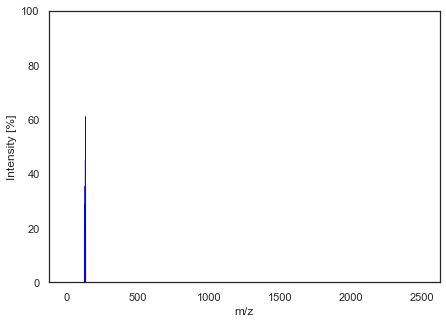

Matching spectra using cos_sim


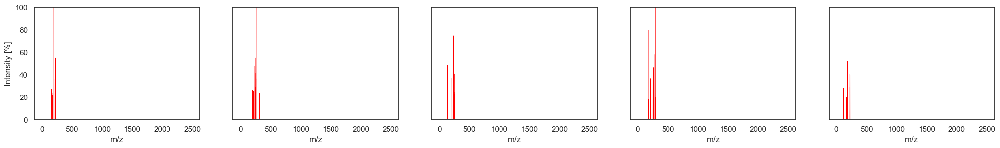

Matching spectra using eu_dist


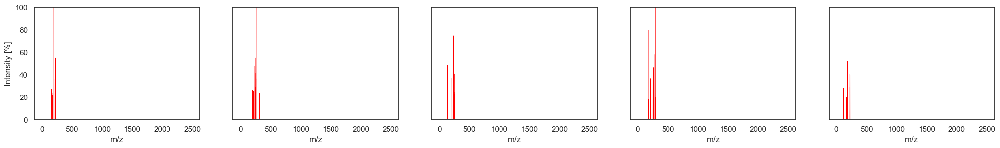

Matching spectra using per_diff


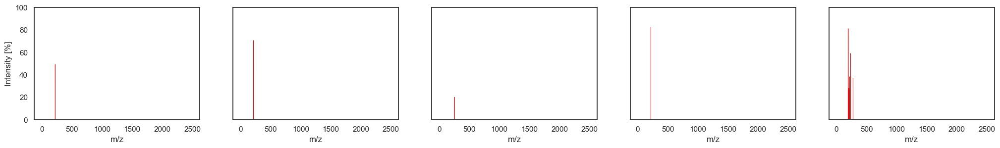

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.998572
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.998486
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.998476
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.998362
15075,ILEDWLMCKZNDJK-UHFFFAOYSA-N,50.154784:0.026153 50.184808:0.023278 50.235388:0.022611 51.149019:0.024352 51.345111:0.025768 52.712214:0.024037 53.002934:0.026851 53.039312:0.032768 53.482063:0.025483 53.850026:0.023042 55.008...,35.0,1,0.998259


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
81737,RHDVQZWCBQXOJW-UHFFFAOYSA-N,129.1019:3.758325 132.9585:6.470029 158.9747:27.212179 159.9814:16.508088 160.9529:10.561370 160.9724:10.513796 161.9624:16.936251 161.9793:5.375833 163.9581:12.178877 166.004:9.467174 166.9205:23...,40.0,1,0.053446
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.055027
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.055202
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.057231
15075,ILEDWLMCKZNDJK-UHFFFAOYSA-N,50.154784:0.026153 50.184808:0.023278 50.235388:0.022611 51.149019:0.024352 51.345111:0.025768 52.712214:0.024037 53.002934:0.026851 53.039312:0.032768 53.482063:0.025483 53.850026:0.023042 55.008...,35.0,1,0.059011


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.043165
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.063422
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.071943
63892,UQVUEULZDJRMJR-UHFFFAOYSA-N,77.04031:0.600000 89.03748:1.000000 103.05216:2.000000 105.05845:0.600000 115.05328:5.000000 116.04069:0.600000 116.049:1.700000 117.05806:0.800000 125.03515:0.700000 126.04653:0.700000 127.05131:...,50.0,1,0.073889
79788,SEQDDYPDSLOBDC-UHFFFAOYSA-N,42.32975:0.034389 43.01548:0.034389 43.29482:0.040120 43.29759:0.040120 44.44088:0.034389 45.01529:0.034389 50.02083:0.034389 51.02232:0.040120 51.02834:0.040120 52.93861:0.034389 63.02095:0.03438...,35.0,1,0.074270


Intermediate spectrum


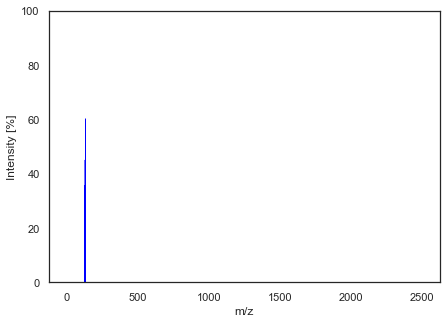

Matching spectra using cos_sim


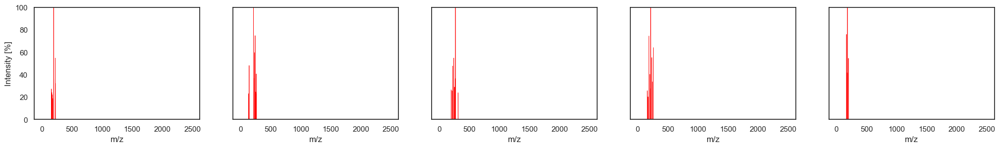

Matching spectra using eu_dist


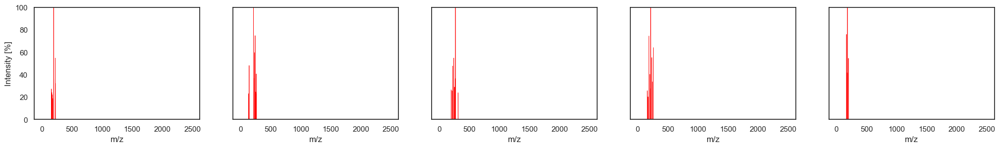

Matching spectra using per_diff


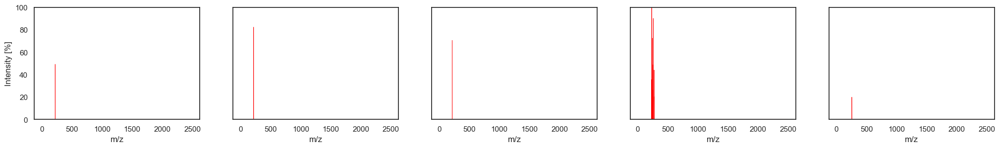

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.998558
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.998447
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.998379
15075,ILEDWLMCKZNDJK-UHFFFAOYSA-N,50.154784:0.026153 50.184808:0.023278 50.235388:0.022611 51.149019:0.024352 51.345111:0.025768 52.712214:0.024037 53.002934:0.026851 53.039312:0.032768 53.482063:0.025483 53.850026:0.023042 55.008...,35.0,1,0.998353
51170,XYYAFLHHHZVPRN-GXTWGEPZSA-N,103.0376:4.985986 105.0696:26.318318 105.3871:2.712713 107.0520:7.188188 107.0809:6.935936 115.0790:3.092092 116.0528:6.042042 116.8865:4.603604 117.0708:17.961962 118.8884:2.945946 119.0854:21.76...,20.0,1,0.998336


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.053705
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.055736
105041,PXUQTDZNOHRWLI-UHFFFAOYSA-O,115.0283:7.500000 119.01432:11.300000 154.03473:8.400000 154.04509:9.200000 175.04456:7.500000 185.02211:11.300000 186.02882:19.200000 198.03128:26.400000 214.01974:25.500000 214.03206:18.000000 2...,50.0,0,0.056942
15075,ILEDWLMCKZNDJK-UHFFFAOYSA-N,50.154784:0.026153 50.184808:0.023278 50.235388:0.022611 51.149019:0.024352 51.345111:0.025768 52.712214:0.024037 53.002934:0.026851 53.039312:0.032768 53.482063:0.025483 53.850026:0.023042 55.008...,35.0,1,0.057388
51170,XYYAFLHHHZVPRN-GXTWGEPZSA-N,103.0376:4.985986 105.0696:26.318318 105.3871:2.712713 107.0520:7.188188 107.0809:6.935936 115.0790:3.092092 116.0528:6.042042 116.8865:4.603604 117.0708:17.961962 118.8884:2.945946 119.0854:21.76...,20.0,1,0.057693


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.042030
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.054376
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.065262
63892,UQVUEULZDJRMJR-UHFFFAOYSA-N,77.04031:0.600000 89.03748:1.000000 103.05216:2.000000 105.05845:0.600000 115.05328:5.000000 116.04069:0.600000 116.049:1.700000 117.05806:0.800000 125.03515:0.700000 126.04653:0.700000 127.05131:...,50.0,1,0.072211
79690,KRMDCWKBEZIMAB-UHFFFAOYSA-N,115.0538:16.552883 116.0584:1.881964 117.0695:17.900144 118.0729:2.091071 127.0533:1.490485 128.0612:11.078859 129.0689:18.324087 130.0726:1.796985 131.0847:0.530884 141.0689:9.399318 142.0747:2.1...,40.0,1,0.074706


Intermediate spectrum


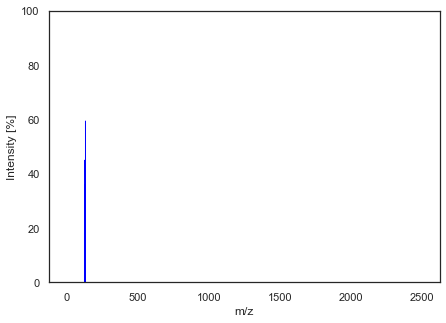

Matching spectra using cos_sim


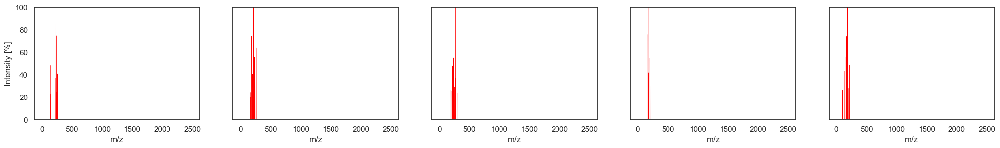

Matching spectra using eu_dist


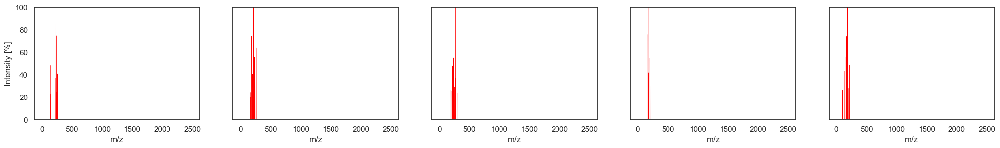

Matching spectra using per_diff


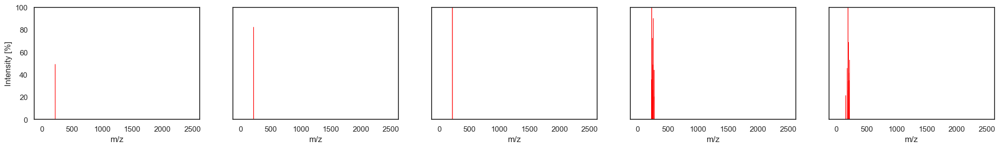

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.998498
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.998491
68230,VHRSUDSXCMQTMA-PJHHCJLFSA-N,115.0536:6.108898 116.0605:1.082848 117.0697:5.465318 119.0847:6.956788 121.0643:29.053019 121.1007:1.460823 122.0678:3.177035 123.0437:0.939830 123.0793:1.808152 125.0595:1.307590 127.0527:1.0828...,40.0,1,0.998403
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.998393
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.998347


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
74947,OVBAGMZLGLXSBN-UOVKNHIHSA-N,69.927856:0.035491 69.953484:0.045997 69.993065:0.106190 70.028709:0.058490 70.224617:0.064736 70.455811:0.050256 70.527977:0.029245 70.666428:0.047416 70.784126:0.034923 71.001762:0.067859 71.035...,NaN,1,0.054809
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.054938
68230,VHRSUDSXCMQTMA-PJHHCJLFSA-N,115.0536:6.108898 116.0605:1.082848 117.0697:5.465318 119.0847:6.956788 121.0643:29.053019 121.1007:1.460823 122.0678:3.177035 123.0437:0.939830 123.0793:1.808152 125.0595:1.307590 127.0527:1.0828...,40.0,1,0.056512
123432,HOMCMRVLJZABGH-IRUQYQAUSA-N,70.982109:0.148548 71.048103:0.471079 72.051697:0.148548 72.423073:0.092588 72.753448:0.175001 73.060387:0.108867 73.675293:0.072239 74.281700:0.153635 74.612389:0.218752 75.039536:0.120059 75.659...,NaN,1,0.056689
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.057505


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.044591
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.046236
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.059046
79690,KRMDCWKBEZIMAB-UHFFFAOYSA-N,115.0538:16.552883 116.0584:1.881964 117.0695:17.900144 118.0729:2.091071 127.0533:1.490485 128.0612:11.078859 129.0689:18.324087 130.0726:1.796985 131.0847:0.530884 141.0689:9.399318 142.0747:2.1...,40.0,1,0.070749
63892,UQVUEULZDJRMJR-UHFFFAOYSA-N,77.04031:0.600000 89.03748:1.000000 103.05216:2.000000 105.05845:0.600000 115.05328:5.000000 116.04069:0.600000 116.049:1.700000 117.05806:0.800000 125.03515:0.700000 126.04653:0.700000 127.05131:...,50.0,1,0.071798


Intermediate spectrum


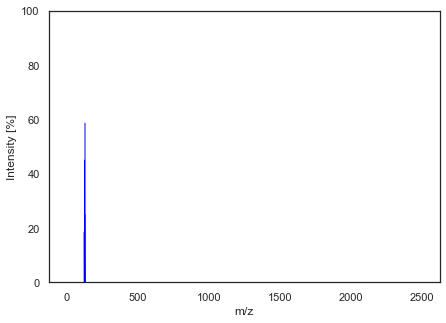

Matching spectra using cos_sim


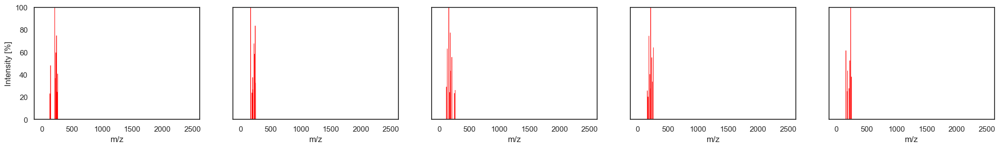

Matching spectra using eu_dist


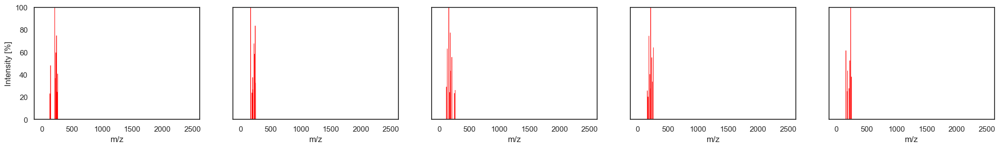

Matching spectra using per_diff


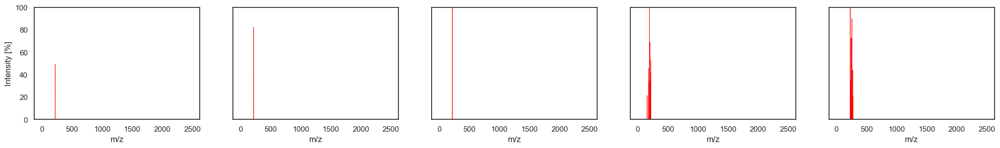

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.998715
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.998677
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.998616
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.998544
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.998465


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.050701
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.051438
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.052617
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.053964
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.055414


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.038642
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.049590
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.055699
79690,KRMDCWKBEZIMAB-UHFFFAOYSA-N,115.0538:16.552883 116.0584:1.881964 117.0695:17.900144 118.0729:2.091071 127.0533:1.490485 128.0612:11.078859 129.0689:18.324087 130.0726:1.796985 131.0847:0.530884 141.0689:9.399318 142.0747:2.1...,40.0,1,0.069679
63892,UQVUEULZDJRMJR-UHFFFAOYSA-N,77.04031:0.600000 89.03748:1.000000 103.05216:2.000000 105.05845:0.600000 115.05328:5.000000 116.04069:0.600000 116.049:1.700000 117.05806:0.800000 125.03515:0.700000 126.04653:0.700000 127.05131:...,50.0,1,0.074880


Intermediate spectrum


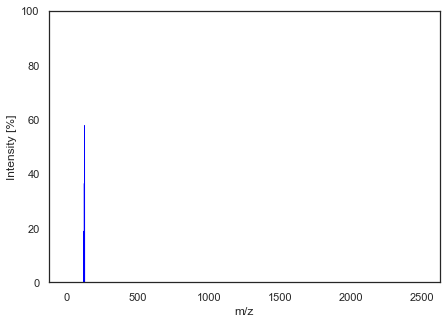

Matching spectra using cos_sim


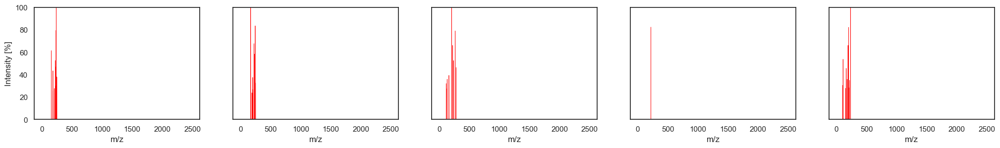

Matching spectra using eu_dist


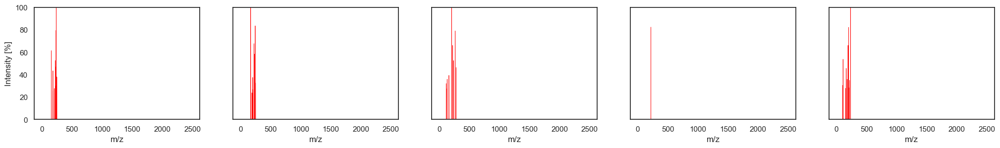

Matching spectra using per_diff


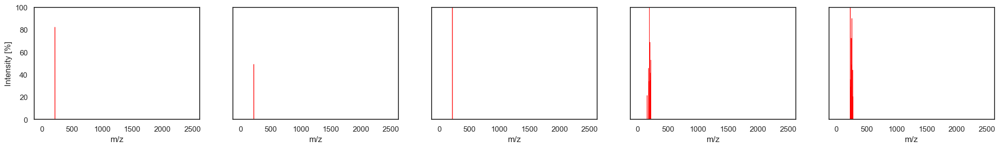

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.998943
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.998857
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.998798
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.998718
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.998653


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.045978
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.047819
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.049028
86777,XPOQHMRABVBWPR-UHFFFAOYSA-N,167.0726:20.989918 168.0797:100.000000 169.0837:14.757104 188.0243:23.739688 189.0328:10.632447 197.0613:7.699358 201.0337:26.764436 202.0407:37.488543 203.0473:23.281393 205.0489:7.882676 212.006...,30.0,1,0.050641
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.051912


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.033374
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.057112
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.059203
7581,INVGWHRKADIJHF-UHFFFAOYSA-N,110.7716:0.600000 115.05936:0.900000 116.05242:0.900000 141.05894:1.100000 144.03563:1.500000 148.40523:0.700000 149.02345:0.700000 151.04611:1.000000 151.05396:2.500000 151.06497:0.800000 152.055...,50.0,1,0.066019
79690,KRMDCWKBEZIMAB-UHFFFAOYSA-N,115.0538:16.552883 116.0584:1.881964 117.0695:17.900144 118.0729:2.091071 127.0533:1.490485 128.0612:11.078859 129.0689:18.324087 130.0726:1.796985 131.0847:0.530884 141.0689:9.399318 142.0747:2.1...,40.0,1,0.070161


Intermediate spectrum


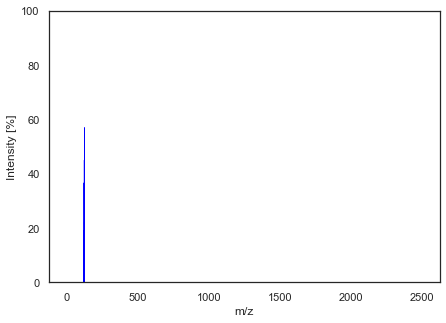

Matching spectra using cos_sim


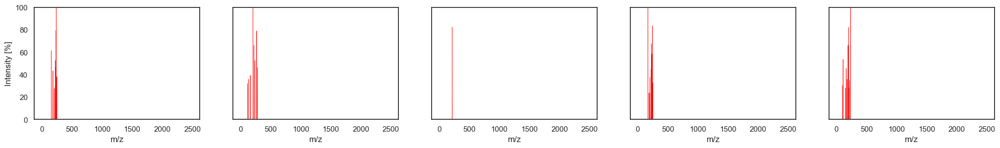

Matching spectra using eu_dist


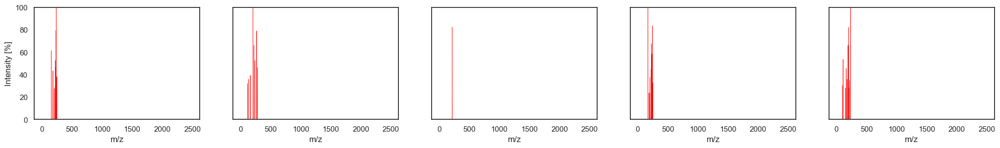

Matching spectra using per_diff


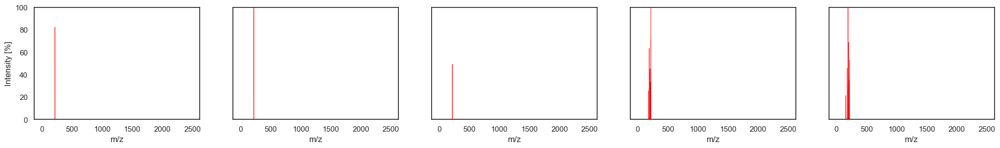

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.999059
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.998967
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.998921
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.998688
59581,HYFHYPWGAURHIV-JFIAXGOJSA-N,55.0177:1.611954 55.0542:0.778639 59.049:4.769922 69.0697:1.817271 70.0651:3.679559 79.0543:1.436959 81.0697:0.847152 83.0856:0.976683 85.0647:3.351798 91.0542:3.872121 93.0698:9.637262 94.0651:1....,65.0,1,0.998662


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.043377
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.045442
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.046448
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.051221
59581,HYFHYPWGAURHIV-JFIAXGOJSA-N,55.0177:1.611954 55.0542:0.778639 59.049:4.769922 69.0697:1.817271 70.0651:3.679559 79.0543:1.436959 81.0697:0.847152 83.0856:0.976683 85.0647:3.351798 91.0542:3.872121 93.0698:9.637262 94.0651:1....,65.0,1,0.051728


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.032089
7581,INVGWHRKADIJHF-UHFFFAOYSA-N,110.7716:0.600000 115.05936:0.900000 116.05242:0.900000 141.05894:1.100000 144.03563:1.500000 148.40523:0.700000 149.02345:0.700000 151.04611:1.000000 151.05396:2.500000 151.06497:0.800000 152.055...,50.0,1,0.058152
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.061777
105676,FUBVFOMIYZMXCB-DWHCWPPGSA-N,50.059698:4.433432 50.097445:3.419539 50.106583:4.222611 50.368354:4.264261 50.463394:3.928394 50.482202:3.971466 50.574809:3.635673 50.627937:4.141843 50.991235:4.459267 51.018392:3.538017 51.158...,65.0,0,0.069523
106326,KLUTZDJBVDPOFE-UHFFFAOYSA-N,226.4:3.63 226.5:5.64 226.6:9.41 226.7:16.96 226.8:28.01 226.9:38.29 227.0:41.83 227.1:36.67 227.2:26.2 227.3:15.37 227.4:6.71 227.5:2.18 244.1:2.14 244.2:4.42 244.3:7.34 244.4:9.0 244.5:10.04 244...,NaN,1,0.070248


Intermediate spectrum


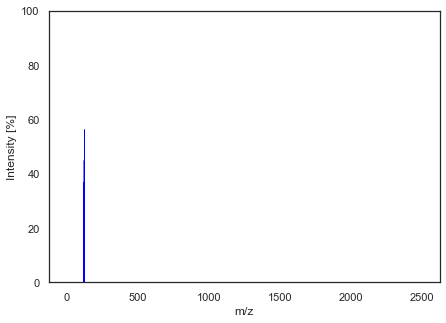

Matching spectra using cos_sim


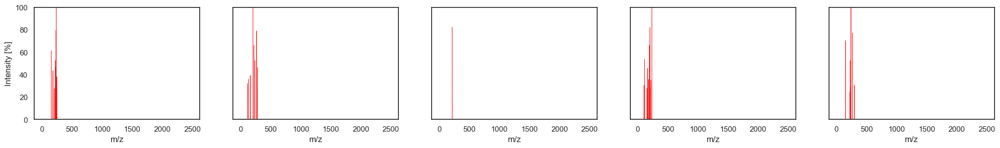

Matching spectra using eu_dist


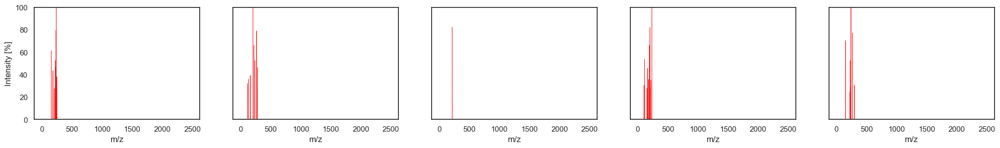

Matching spectra using per_diff


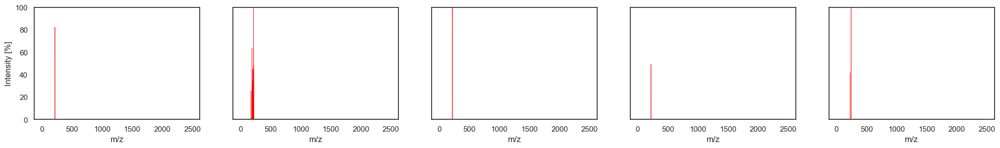

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.999052
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.998950
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.998915
59581,HYFHYPWGAURHIV-JFIAXGOJSA-N,55.0177:1.611954 55.0542:0.778639 59.049:4.769922 69.0697:1.817271 70.0651:3.679559 79.0543:1.436959 81.0697:0.847152 83.0856:0.976683 85.0647:3.351798 91.0542:3.872121 93.0698:9.637262 94.0651:1....,65.0,1,0.998640
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.998591


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.043543
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.045830
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.046571
59581,HYFHYPWGAURHIV-JFIAXGOJSA-N,55.0177:1.611954 55.0542:0.778639 59.049:4.769922 69.0697:1.817271 70.0651:3.679559 79.0543:1.436959 81.0697:0.847152 83.0856:0.976683 85.0647:3.351798 91.0542:3.872121 93.0698:9.637262 94.0651:1....,65.0,1,0.052149
26586,NGRRXMZEVSBATO-UHFFFAOYSA-N,103.0528:30.427427 105.0324:3.569570 105.0671:7.022022 107.0473:8.973974 109.0633:53.669670 113.0233:2.062062 115.0523:5.291291 116.0618:3.125125 117.0681:9.046046 119.0482:2.382382 119.0756:2.145...,40.0,1,0.053080


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.033312
7581,INVGWHRKADIJHF-UHFFFAOYSA-N,110.7716:0.600000 115.05936:0.900000 116.05242:0.900000 141.05894:1.100000 144.03563:1.500000 148.40523:0.700000 149.02345:0.700000 151.04611:1.000000 151.05396:2.500000 151.06497:0.800000 152.055...,50.0,1,0.053135
106326,KLUTZDJBVDPOFE-UHFFFAOYSA-N,226.4:3.63 226.5:5.64 226.6:9.41 226.7:16.96 226.8:28.01 226.9:38.29 227.0:41.83 227.1:36.67 227.2:26.2 227.3:15.37 227.4:6.71 227.5:2.18 244.1:2.14 244.2:4.42 244.3:7.34 244.4:9.0 244.5:10.04 244...,NaN,1,0.061660
935,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.145847:5.563488 50.293588:5.426552 50.404630:5.894992 50.417478:5.795380 50.423811:5.888770 50.464993:5.281125 50.508640:5.963427 50.550474:5.688056 50.613558:5.281836 50.657333:6.030976 50.680...,65.0,1,0.068435
7577,INVGWHRKADIJHF-UHFFFAOYSA-N,116.05368:1.600000 148.05847:1.400000 150.04004:1.000000 151.04909:1.100000 151.05884:4.800000 152.05835:1.400000 153.05501:1.700000 155.07191:1.200000 158.15816:0.900000 162.05009:1.200000 163.04...,50.0,1,0.069915


Intermediate spectrum


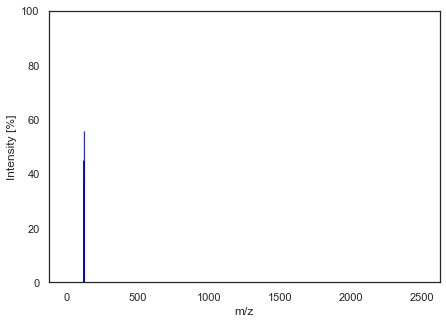

Matching spectra using cos_sim


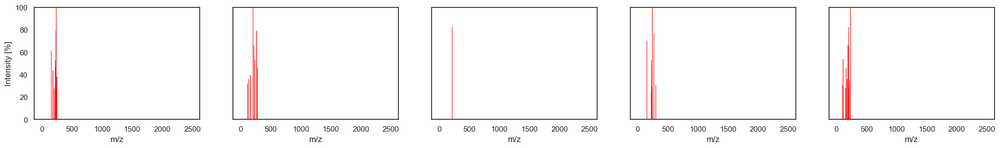

Matching spectra using eu_dist


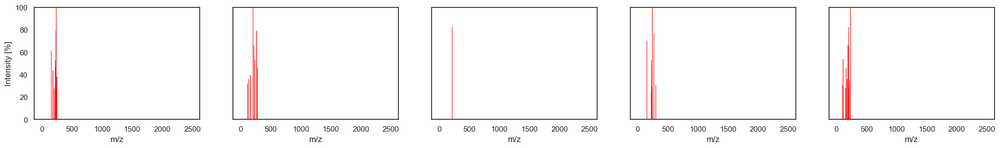

Matching spectra using per_diff


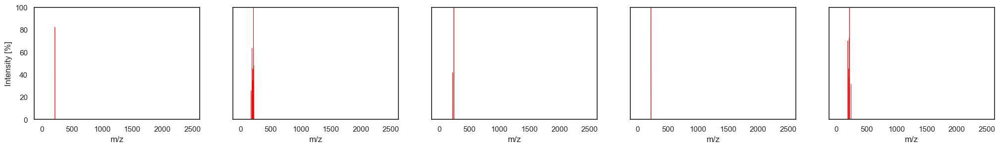

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.998923
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.998807
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.998785
22284,PBAZKMWQUBDDLZ-UHFFFAOYSA-N,50.208734:0.114501 50.257635:0.149769 51.313673:0.128079 51.329475:0.051351 52.838373:0.162050 52.866767:0.056994 52.906480:0.121756 53.039287:0.603947 53.093728:0.061016 53.150465:0.067032 53.364...,45.0,1,0.998733
42451,QPRODDKTRBCFPV-DHZHZOJOSA-N,100.0843:6.428428 100.9386:4.559560 105.0719:8.778779 107.0492:13.259259 110.5409:4.290290 115.7617:6.423423 119.0473:14.100100 122.1492:3.416416 131.0056:7.567568 132.0607:5.024024 133.0281:4.756...,40.0,0,0.998694


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
100178,JBFBTBFJYNNYPW-ZXWRBSQSSA-N,50.935149:0.757035 51.459822:0.614127 51.777280:0.800462 52.005285:0.704136 52.182012:0.781784 53.555565:0.585630 53.778839:0.475919 53.912224:0.754453 54.083332:0.845414 55.243276:0.522559 56.066...,65.0,0,0.046402
88196,ZOTBXTZVPHCKPN-ZPHPHTNESA-N,116.0486:32.006139 117.0521:3.361105 118.0637:1.368121 119.0486:0.712563 121.0638:1.153256 130.0642:1.319886 131.0718:27.456698 132.0796:35.921947 133.0826:3.689980 135.0434:0.673098 146.0586:6.07...,10.0,1,0.048848
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.049287
22284,PBAZKMWQUBDDLZ-UHFFFAOYSA-N,50.208734:0.114501 50.257635:0.149769 51.313673:0.128079 51.329475:0.051351 52.838373:0.162050 52.866767:0.056994 52.906480:0.121756 53.039287:0.603947 53.093728:0.061016 53.150465:0.067032 53.364...,45.0,1,0.050347
42451,QPRODDKTRBCFPV-DHZHZOJOSA-N,100.0843:6.428428 100.9386:4.559560 105.0719:8.778779 107.0492:13.259259 110.5409:4.290290 115.7617:6.423423 119.0473:14.100100 122.1492:3.416416 131.0056:7.567568 132.0607:5.024024 133.0281:4.756...,40.0,0,0.051109


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.037630
7581,INVGWHRKADIJHF-UHFFFAOYSA-N,110.7716:0.600000 115.05936:0.900000 116.05242:0.900000 141.05894:1.100000 144.03563:1.500000 148.40523:0.700000 149.02345:0.700000 151.04611:1.000000 151.05396:2.500000 151.06497:0.800000 152.055...,50.0,1,0.050802
106326,KLUTZDJBVDPOFE-UHFFFAOYSA-N,226.4:3.63 226.5:5.64 226.6:9.41 226.7:16.96 226.8:28.01 226.9:38.29 227.0:41.83 227.1:36.67 227.2:26.2 227.3:15.37 227.4:6.71 227.5:2.18 244.1:2.14 244.2:4.42 244.3:7.34 244.4:9.0 244.5:10.04 244...,NaN,1,0.054084
7577,INVGWHRKADIJHF-UHFFFAOYSA-N,116.05368:1.600000 148.05847:1.400000 150.04004:1.000000 151.04909:1.100000 151.05884:4.800000 152.05835:1.400000 153.05501:1.700000 155.07191:1.200000 158.15816:0.900000 162.05009:1.200000 163.04...,50.0,1,0.067879
106372,MFLKAHOBCOBBJX-UHFFFAOYSA-N,143.7:2.15 143.8:3.53 143.9:5.0 144.0:6.09 144.1:6.58 144.2:6.51 144.3:5.93 144.4:4.68 144.5:2.84 156.7:1.81 156.8:3.13 156.9:4.59 157.0:5.64 157.1:5.99 157.2:5.73 157.3:4.99 157.4:3.75 270.3:1.48...,NaN,1,0.068970


Intermediate spectrum


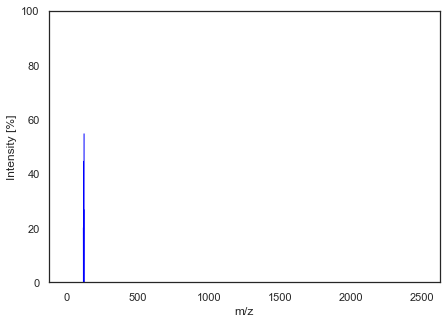

Matching spectra using cos_sim


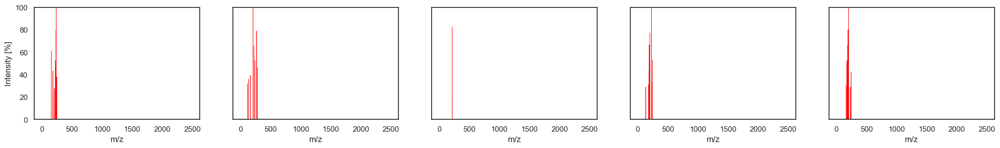

Matching spectra using eu_dist


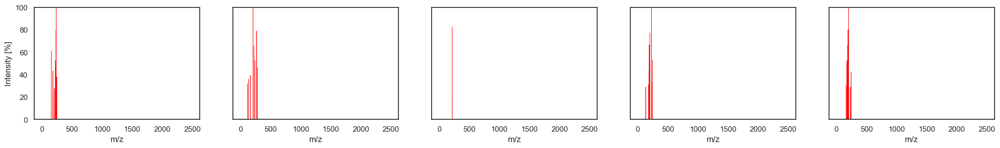

Matching spectra using per_diff


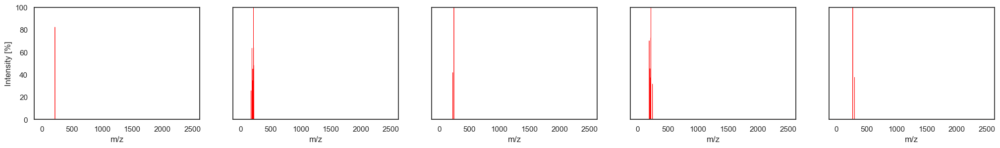

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
32872,ROWKODQLOIEBHL-MXHWVDEXSA-N,70.089180:0.159398 70.324898:0.159398 71.050377:0.054135 71.233429:0.174436 71.482033:0.123308 72.993469:0.203509 74.605087:0.167419 75.801216:0.063158 75.950958:0.110276 76.272667:0.221554 76.880...,NaN,1,0.998921
22284,PBAZKMWQUBDDLZ-UHFFFAOYSA-N,50.208734:0.114501 50.257635:0.149769 51.313673:0.128079 51.329475:0.051351 52.838373:0.162050 52.866767:0.056994 52.906480:0.121756 53.039287:0.603947 53.093728:0.061016 53.150465:0.067032 53.364...,45.0,1,0.998865
81026,VPZIYMMSJFWLSP-UHFFFAOYSA-N,117.0569:2.138022 139.0531:1.191367 140.0482:0.716430 141.0686:0.833152 152.0611:5.569643 153.0686:5.848970 154.0659:0.928945 154.0711:1.011052 155.0844:1.163998 163.0529:0.688256 164.0601:0.67779...,40.0,1,0.998704
42451,QPRODDKTRBCFPV-DHZHZOJOSA-N,100.0843:6.428428 100.9386:4.559560 105.0719:8.778779 107.0492:13.259259 110.5409:4.290290 115.7617:6.423423 119.0473:14.100100 122.1492:3.416416 131.0056:7.567568 132.0607:5.024024 133.0281:4.756...,40.0,0,0.998695
74891,RBFIISQAYNLQQY-ZROIWOOFSA-N,50.417573:0.056215 50.874455:0.093451 50.927403:0.070275 51.082967:0.113930 51.131537:0.110372 51.582744:0.068108 51.883642:0.093435 51.985734:0.097845 52.464103:0.068887 52.594927:0.073550 53.038...,45.0,1,0.998688


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
32872,ROWKODQLOIEBHL-MXHWVDEXSA-N,70.089180:0.159398 70.324898:0.159398 71.050377:0.054135 71.233429:0.174436 71.482033:0.123308 72.993469:0.203509 74.605087:0.167419 75.801216:0.063158 75.950958:0.110276 76.272667:0.221554 76.880...,NaN,1,0.046457
22284,PBAZKMWQUBDDLZ-UHFFFAOYSA-N,50.208734:0.114501 50.257635:0.149769 51.313673:0.128079 51.329475:0.051351 52.838373:0.162050 52.866767:0.056994 52.906480:0.121756 53.039287:0.603947 53.093728:0.061016 53.150465:0.067032 53.364...,45.0,1,0.047657
81026,VPZIYMMSJFWLSP-UHFFFAOYSA-N,117.0569:2.138022 139.0531:1.191367 140.0482:0.716430 141.0686:0.833152 152.0611:5.569643 153.0686:5.848970 154.0659:0.928945 154.0711:1.011052 155.0844:1.163998 163.0529:0.688256 164.0601:0.67779...,40.0,1,0.050916
42451,QPRODDKTRBCFPV-DHZHZOJOSA-N,100.0843:6.428428 100.9386:4.559560 105.0719:8.778779 107.0492:13.259259 110.5409:4.290290 115.7617:6.423423 119.0473:14.100100 122.1492:3.416416 131.0056:7.567568 132.0607:5.024024 133.0281:4.756...,40.0,0,0.051084
74891,RBFIISQAYNLQQY-ZROIWOOFSA-N,50.417573:0.056215 50.874455:0.093451 50.927403:0.070275 51.082967:0.113930 51.131537:0.110372 51.582744:0.068108 51.883642:0.093435 51.985734:0.097845 52.464103:0.068887 52.594927:0.073550 53.038...,45.0,1,0.051226


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
843,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.049756:2.689521 50.448814:2.882721 50.607947:2.621582 50.663279:2.932134 50.671154:2.681901 50.932461:2.659173 50.946160:2.423030 51.072485:2.778485 51.186173:2.520259 51.296847:2.481799 51.370...,45.0,1,0.043516
106326,KLUTZDJBVDPOFE-UHFFFAOYSA-N,226.4:3.63 226.5:5.64 226.6:9.41 226.7:16.96 226.8:28.01 226.9:38.29 227.0:41.83 227.1:36.67 227.2:26.2 227.3:15.37 227.4:6.71 227.5:2.18 244.1:2.14 244.2:4.42 244.3:7.34 244.4:9.0 244.5:10.04 244...,NaN,1,0.049239
7581,INVGWHRKADIJHF-UHFFFAOYSA-N,110.7716:0.600000 115.05936:0.900000 116.05242:0.900000 141.05894:1.100000 144.03563:1.500000 148.40523:0.700000 149.02345:0.700000 151.04611:1.000000 151.05396:2.500000 151.06497:0.800000 152.055...,50.0,1,0.050385
106372,MFLKAHOBCOBBJX-UHFFFAOYSA-N,143.7:2.15 143.8:3.53 143.9:5.0 144.0:6.09 144.1:6.58 144.2:6.51 144.3:5.93 144.4:4.68 144.5:2.84 156.7:1.81 156.8:3.13 156.9:4.59 157.0:5.64 157.1:5.99 157.2:5.73 157.3:4.99 157.4:3.75 270.3:1.48...,NaN,1,0.066295
7577,INVGWHRKADIJHF-UHFFFAOYSA-N,116.05368:1.600000 148.05847:1.400000 150.04004:1.000000 151.04909:1.100000 151.05884:4.800000 152.05835:1.400000 153.05501:1.700000 155.07191:1.200000 158.15816:0.900000 162.05009:1.200000 163.04...,50.0,1,0.066918


Intermediate spectrum


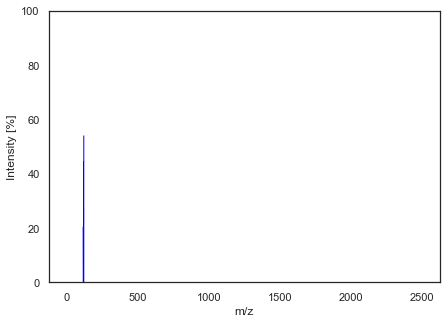

Matching spectra using cos_sim


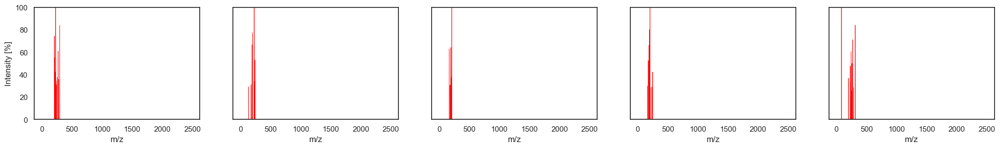

Matching spectra using eu_dist


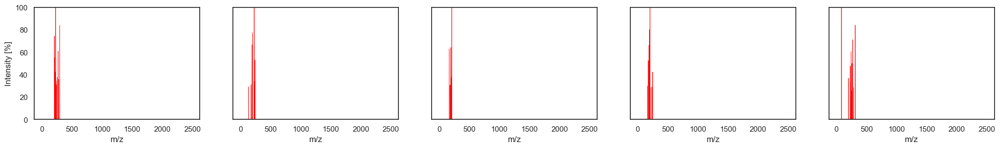

Matching spectra using per_diff


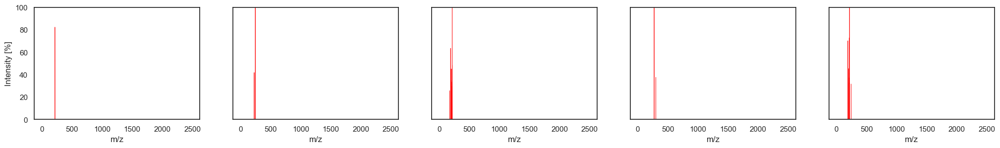

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.994089
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.994089
123218,FNIRVWPHRMMRQI-PGOMJGFXSA-N,639.4401:54 609.4347:100 477.3912:22 457.7413:8,NaN,1,0.993025
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.992767
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.992374


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.108725
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.108725
123218,FNIRVWPHRMMRQI-PGOMJGFXSA-N,639.4401:54 609.4347:100 477.3912:22 457.7413:8,NaN,1,0.118113
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.120276
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.123502


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
38043,VYELCIXMHUBNAL-UHFFFAOYSA-N,62.441799:0.139474 68.067802:0.121053 68.607803:0.134211 71.930298:0.155263 81.033997:0.250000 109.028702:0.342105 135.043900:0.947368 160.033707:0.131579 177.018204:3.421053 184.767899:0.150000 1...,NaN,1,0.515953
41856,LTVCFOSNIVVOBK-RSGHPYSYSA-N,50.206305:0.001323 50.517417:0.005759 50.532839:0.001410 50.989965:0.006266 51.006889:0.001376 51.304094:0.001335 51.402312:0.008998 51.594567:0.010003 51.998069:0.001411 52.044798:0.005054 52.105...,35.0,1,0.538691
42724,KYDNOVLBVBYOSW-UHFFFAOYSA-N,50.094880:0.093748 50.211588:0.325452 50.670152:0.072099 50.940777:0.206310 51.395915:0.162417 51.544421:0.311174 51.547564:0.289006 51.549000:0.276726 51.574663:0.197691 51.659228:0.062230 51.822...,45.0,1,0.539468
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.540727
94224,ZLHZLMOSPGACSZ-NSHDSACASA-N,95.8093:0.17 103.3927:0.18 109.0449:0.44 115.0548:0.31 133.0647:1.73 135.0606:0.4 143.0602:0.31 167.4032:0.18 168.0403:0.3 175.0367:100 189.052:0.84 201.0523:35.73 203.0687:0.2 213.0521:4.7 216.06...,NaN,1,0.545603


Intermediate spectrum


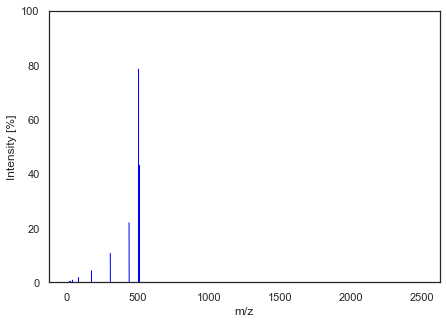

Matching spectra using cos_sim


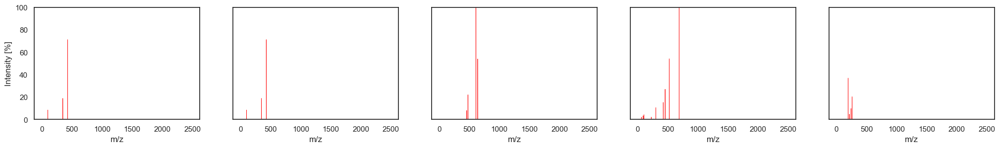

Matching spectra using eu_dist


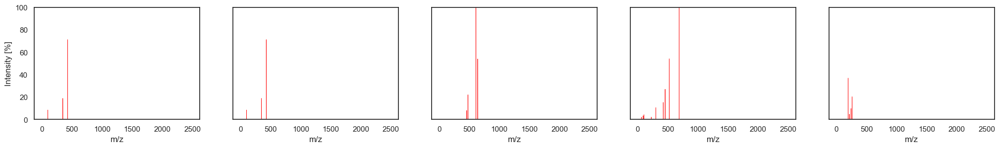

Matching spectra using per_diff


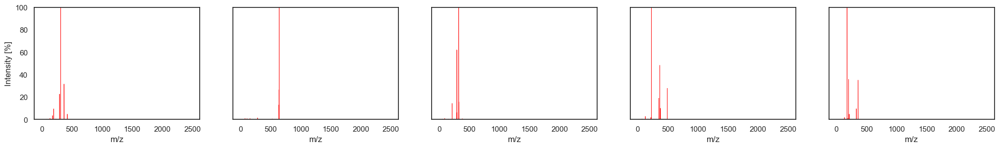

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993983
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993983
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993235
123218,FNIRVWPHRMMRQI-PGOMJGFXSA-N,639.4401:54 609.4347:100 477.3912:22 457.7413:8,NaN,1,0.991855
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.991847


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.109703
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.109703
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.116323
123218,FNIRVWPHRMMRQI-PGOMJGFXSA-N,639.4401:54 609.4347:100 477.3912:22 457.7413:8,NaN,1,0.127637
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.127698


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.494032
41856,LTVCFOSNIVVOBK-RSGHPYSYSA-N,50.206305:0.001323 50.517417:0.005759 50.532839:0.001410 50.989965:0.006266 51.006889:0.001376 51.304094:0.001335 51.402312:0.008998 51.594567:0.010003 51.998069:0.001411 52.044798:0.005054 52.105...,35.0,1,0.512498
38043,VYELCIXMHUBNAL-UHFFFAOYSA-N,62.441799:0.139474 68.067802:0.121053 68.607803:0.134211 71.930298:0.155263 81.033997:0.250000 109.028702:0.342105 135.043900:0.947368 160.033707:0.131579 177.018204:3.421053 184.767899:0.150000 1...,NaN,1,0.523240
63012,CABMTIJINOIHOD-UHFFFAOYSA-N,65.9985:0.630503 153.0459:1.247994 155.062:0.276724 168.0565:0.384814 183.0563:6.128127 195.0565:1.533189 208.0517:21.536772 222.0674:100.000000 223.0753:19.428901 236.0829:13.402529,90.0,0,0.526610
42724,KYDNOVLBVBYOSW-UHFFFAOYSA-N,50.094880:0.093748 50.211588:0.325452 50.670152:0.072099 50.940777:0.206310 51.395915:0.162417 51.544421:0.311174 51.547564:0.289006 51.549000:0.276726 51.574663:0.197691 51.659228:0.062230 51.822...,45.0,1,0.528049


Intermediate spectrum


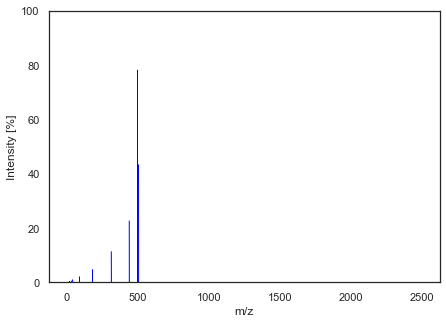

Matching spectra using cos_sim


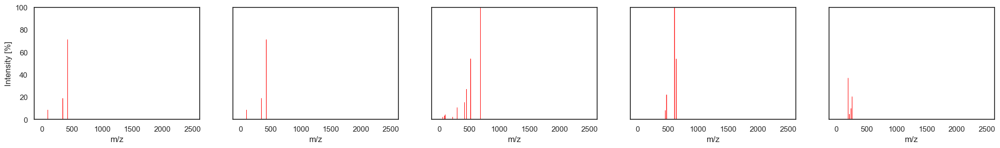

Matching spectra using eu_dist


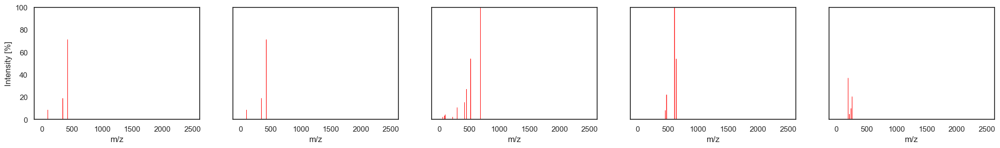

Matching spectra using per_diff


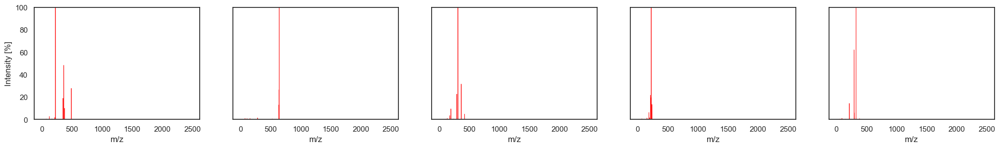

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993719
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993719
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993573
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.991899
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.991136


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.112081
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.112081
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.113374
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.127290
54245,QTSQCCVLTMKKDP-SFDCQRBFSA-N,193.03:36.8538896771235 215.04:4.7647257406557495 241.05:9.699146451558653 261.04:20.220384696850104,35.0,1,0.133143


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.461775
41856,LTVCFOSNIVVOBK-RSGHPYSYSA-N,50.206305:0.001323 50.517417:0.005759 50.532839:0.001410 50.989965:0.006266 51.006889:0.001376 51.304094:0.001335 51.402312:0.008998 51.594567:0.010003 51.998069:0.001411 52.044798:0.005054 52.105...,35.0,1,0.489737
101687,PSYJEEMZZIZTSR-ZDUSSCGKSA-N,51.52292251586914:0.084979 52.040184020996094:0.101311 52.94425582885742:0.089477 57.07081604003906:0.765872 62.081520080566406:0.091127 79.79141998291016:0.115232 83.84292602539062:0.128164 90.72...,NaN,1,0.506456
114251,YKRGDOXKVOZESV-UHFFFAOYSA-N,121.02911:0.900000 327.10056:1.500000 327.11331:1.200000 431.13309:0.500000 449.14441:100.000000 450.1481:15.500000 451.15091:4.100000 479.15582:27.800000 480.15652:6.500000 525.1615:62.300000,10.0,0,0.515458
83779,VSZGPKBBMSAYNT-RRFJBIMHSA-N,60.200001:0.006687 86.000000:0.053497 87.000000:0.046810 87.239999:0.066872 90.500000:0.006687 92.099998:0.013374 93.500000:0.006687 94.059999:0.033436 94.400002:0.020062 96.099998:0.006687 105.90...,10.0,1,0.516252


Intermediate spectrum


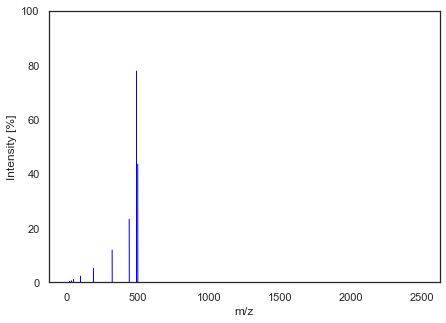

Matching spectra using cos_sim


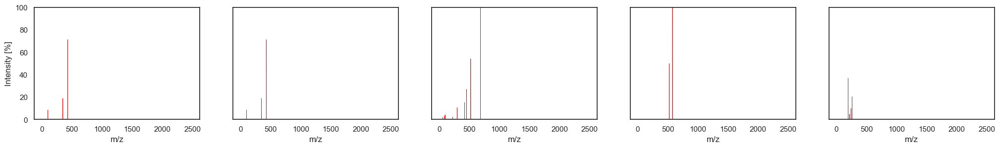

Matching spectra using eu_dist


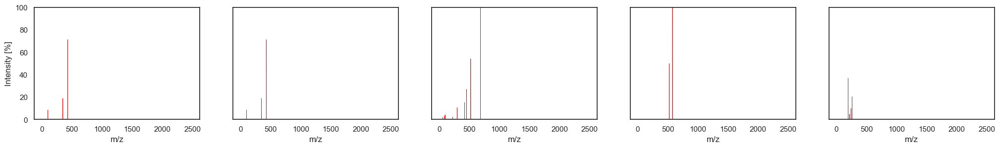

Matching spectra using per_diff


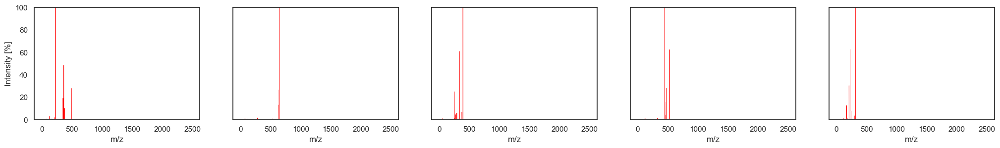

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993770
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993268
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.993268
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.991944
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.990719


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.111629
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.116036
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.116036
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.126933
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.136246


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.434492
41856,LTVCFOSNIVVOBK-RSGHPYSYSA-N,50.206305:0.001323 50.517417:0.005759 50.532839:0.001410 50.989965:0.006266 51.006889:0.001376 51.304094:0.001335 51.402312:0.008998 51.594567:0.010003 51.998069:0.001411 52.044798:0.005054 52.105...,35.0,1,0.477157
120913,RWTNPBWLLIMQHL-UHFFFAOYSA-N,87.0441:0.339655 91.0542:0.392158 129.0696:0.470099 131.0856:2.601180 143.0859:0.120807 171.1168:11.731747 189.1271:0.639036 199.1117:0.126675 217.1224:0.449634 233.1174:2.060835 246.1484:0.535897...,30.0,1,0.487686
114251,YKRGDOXKVOZESV-UHFFFAOYSA-N,121.02911:0.900000 327.10056:1.500000 327.11331:1.200000 431.13309:0.500000 449.14441:100.000000 450.1481:15.500000 451.15091:4.100000 479.15582:27.800000 480.15652:6.500000 525.1615:62.300000,10.0,0,0.489361
101687,PSYJEEMZZIZTSR-ZDUSSCGKSA-N,51.52292251586914:0.084979 52.040184020996094:0.101311 52.94425582885742:0.089477 57.07081604003906:0.765872 62.081520080566406:0.091127 79.79141998291016:0.115232 83.84292602539062:0.128164 90.72...,NaN,1,0.492254


Intermediate spectrum


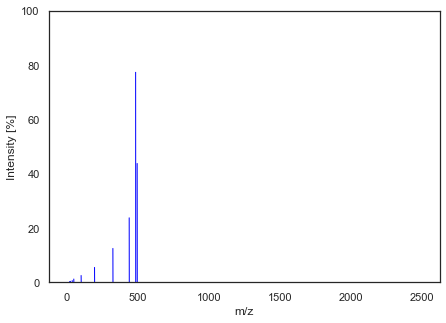

Matching spectra using cos_sim


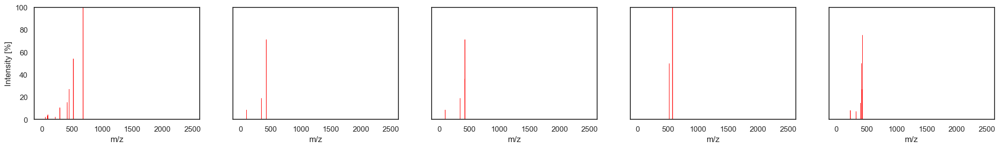

Matching spectra using eu_dist


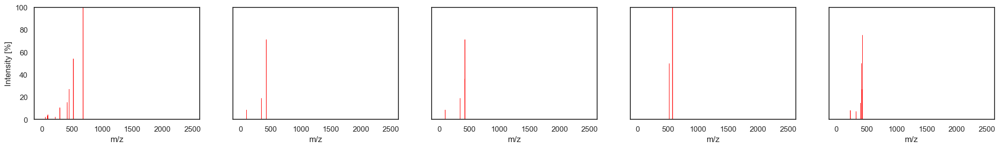

Matching spectra using per_diff


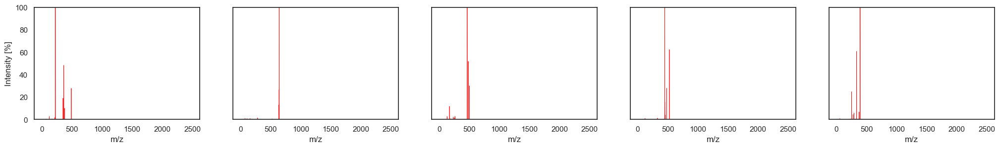

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993871
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.992652
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.992652
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.991855
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.991726


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.110715
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.121227
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.121227
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.127634
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.128643


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.421520
65979,GIIZNNXWQWCKIB-UHFFFAOYSA-N,50.0955:0.302993 50.38225:0.288014 56.60528:0.273112 91.05319:0.287285 93.03193:0.415484 106.04015:0.441411 119.04765:1.218845 121.13476:0.274078 133.05055:1.186142 133.06166:0.331974 145.05127:0....,NaN,0,0.453552
120913,RWTNPBWLLIMQHL-UHFFFAOYSA-N,87.0441:0.339655 91.0542:0.392158 129.0696:0.470099 131.0856:2.601180 143.0859:0.120807 171.1168:11.731747 189.1271:0.639036 199.1117:0.126675 217.1224:0.449634 233.1174:2.060835 246.1484:0.535897...,30.0,1,0.459391
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.459639
114251,YKRGDOXKVOZESV-UHFFFAOYSA-N,121.02911:0.900000 327.10056:1.500000 327.11331:1.200000 431.13309:0.500000 449.14441:100.000000 450.1481:15.500000 451.15091:4.100000 479.15582:27.800000 480.15652:6.500000 525.1615:62.300000,10.0,0,0.460834


Intermediate spectrum


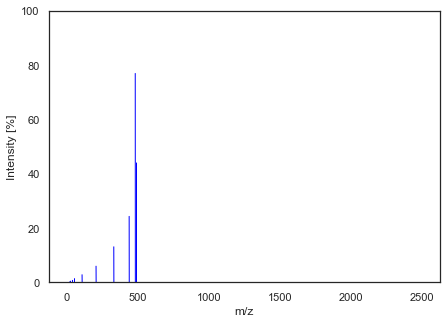

Matching spectra using cos_sim


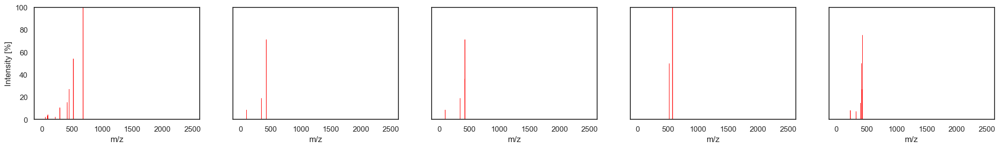

Matching spectra using eu_dist


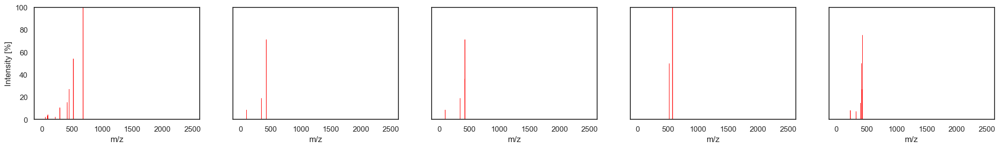

Matching spectra using per_diff


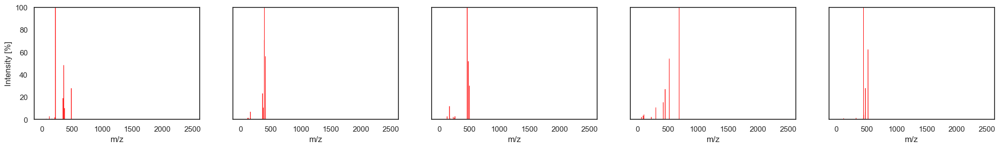

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993889
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.992606
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.991813
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.991813
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.991623


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.110554
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.121610
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.127961
116265,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.127961
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.129437


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.416073
65979,GIIZNNXWQWCKIB-UHFFFAOYSA-N,50.0955:0.302993 50.38225:0.288014 56.60528:0.273112 91.05319:0.287285 93.03193:0.415484 106.04015:0.441411 119.04765:1.218845 121.13476:0.274078 133.05055:1.186142 133.06166:0.331974 145.05127:0....,NaN,0,0.416738
59091,WIGIZIANZCJQQY-UHFFFAOYSA-N,64.89942:0.449999 67.72111:0.442014 71.06019:0.513862 89.08823:0.410140 105.72233:0.480183 124.07568:2.660534 167.08179:0.547972 210.0222:0.617371 217.41962:1.865481 225.03336:100.000000 350.11792...,NaN,0,0.417052
10463,CADNMISJDLVPCK-UHFFFAOYSA-N,69.845428:0.704957 83.048851:0.958233 91.977814:2.994818 112.015564:0.791719 237.222733:5.626672 255.233383:100.000000 281.212799:6.002532 299.223541:89.840556 299.257904:2.299515 321.205292:10.08...,NaN,0,0.426204
15399,VVRNYAJXAUQHEN-BNFZFUHLSA-N,50.079245:0.007195 50.204526:0.021100 50.211623:0.030101 50.263152:0.027808 50.296885:0.017502 51.277409:0.009417 51.691133:0.001663 51.798486:0.002127 51.877793:0.009549 51.958124:0.001856 52.017...,35.0,1,0.429924


Intermediate spectrum


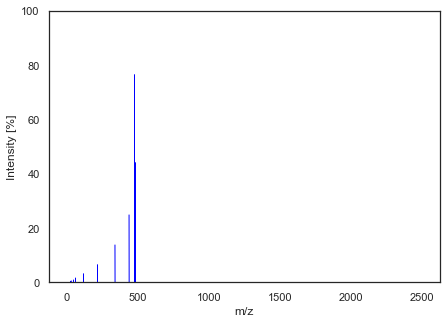

Matching spectra using cos_sim


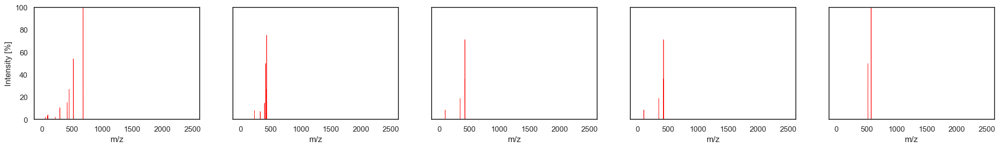

Matching spectra using eu_dist


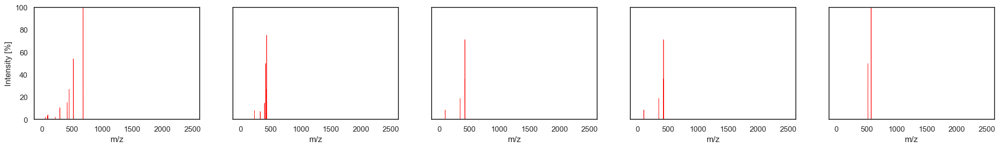

Matching spectra using per_diff


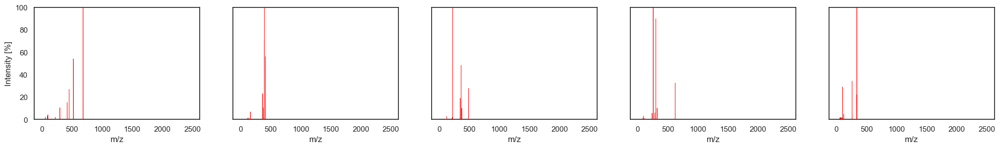

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993689
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.993368
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.991218
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.991060
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.990573


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.112347
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.115166
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.132530
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.133719
116263,MYHSVHWQEVDFQT-QSKOKFRPSA-N,98.9603:8.474 347.9962:18.8 427.0673:71.23 428.0087:8.823 428.0697:36.08,NaN,1,0.137307


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.377767
10463,CADNMISJDLVPCK-UHFFFAOYSA-N,69.845428:0.704957 83.048851:0.958233 91.977814:2.994818 112.015564:0.791719 237.222733:5.626672 255.233383:100.000000 281.212799:6.002532 299.223541:89.840556 299.257904:2.299515 321.205292:10.08...,NaN,0,0.386066
65979,GIIZNNXWQWCKIB-UHFFFAOYSA-N,50.0955:0.302993 50.38225:0.288014 56.60528:0.273112 91.05319:0.287285 93.03193:0.415484 106.04015:0.441411 119.04765:1.218845 121.13476:0.274078 133.05055:1.186142 133.06166:0.331974 145.05127:0....,NaN,0,0.391311
15399,VVRNYAJXAUQHEN-BNFZFUHLSA-N,50.079245:0.007195 50.204526:0.021100 50.211623:0.030101 50.263152:0.027808 50.296885:0.017502 51.277409:0.009417 51.691133:0.001663 51.798486:0.002127 51.877793:0.009549 51.958124:0.001856 52.017...,35.0,1,0.401847
94228,RKXASYGJLKILOC-KRWDZBQOSA-N,70.5038:0.24 91.0543:1.4 94.065:0.88 95.1879:0.23 107.9896:0.22 120.0444:2.66 121.0284:0.56 137.0713:1.98 138.0548:0.51 145.1012:16.72 163.0495:0.33 172.2079:0.34 218.72:0.27 266.154:6.58 291.1506...,NaN,1,0.402349


Intermediate spectrum


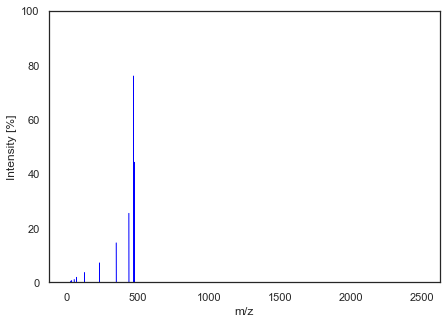

Matching spectra using cos_sim


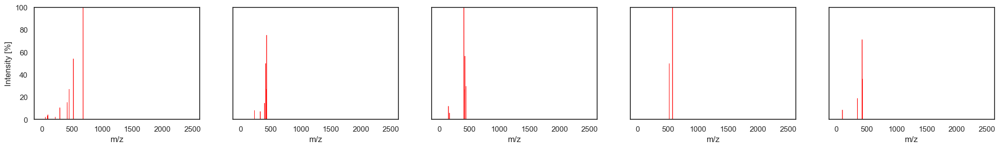

Matching spectra using eu_dist


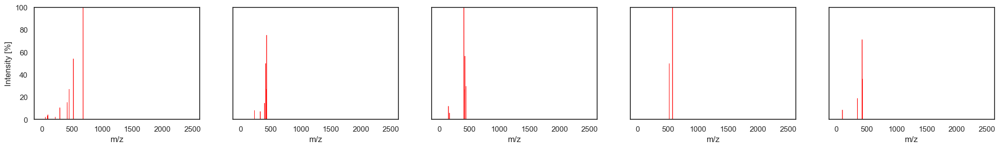

Matching spectra using per_diff


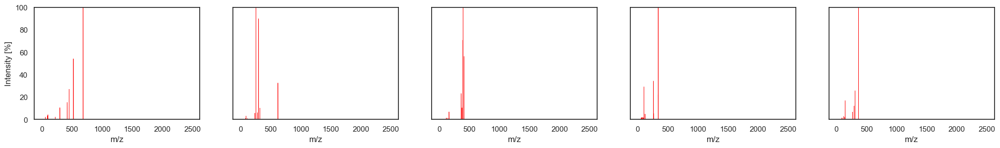

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.993878
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.993274
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.991217
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.990066
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.989603


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.110654
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.115982
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.132535
106476,ULGZDMOVFRHVEP-UHFFFAOYSA-N,522.3716:14.230106 522.5022:9.014194 522.9574:49.761125 523.0395:29.309866 576.3753:100.000000,35.0,1,0.140956
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.144203


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.345282
15014,RCCBGOMNZWYBTJ-UHFFFAOYSA-N,147.1086:1.154154 159.6968:1.000000 172.9299:1.396396 175.0105:1.043043 177.0834:1.587588 185.0408:6.206206 188.1489:1.759760 201.9797:1.000000 203.0531:1.722723 204.6527:1.117117 216.9767:1.07907...,40.0,1,0.376599
15399,VVRNYAJXAUQHEN-BNFZFUHLSA-N,50.079245:0.007195 50.204526:0.021100 50.211623:0.030101 50.263152:0.027808 50.296885:0.017502 51.277409:0.009417 51.691133:0.001663 51.798486:0.002127 51.877793:0.009549 51.958124:0.001856 52.017...,35.0,1,0.376640
981,QJVVGCSWIOLQDG-PROUKMOUSA-N,50.004396:0.199769 50.763965:0.291673 50.780738:0.120112 50.798931:0.302160 51.055768:0.099330 51.233371:0.341682 51.454162:0.091518 51.454517:0.096739 51.454988:0.112717 51.577198:0.271349 51.581...,45.0,1,0.378459
10463,CADNMISJDLVPCK-UHFFFAOYSA-N,69.845428:0.704957 83.048851:0.958233 91.977814:2.994818 112.015564:0.791719 237.222733:5.626672 255.233383:100.000000 281.212799:6.002532 299.223541:89.840556 299.257904:2.299515 321.205292:10.08...,NaN,0,0.378940


Intermediate spectrum


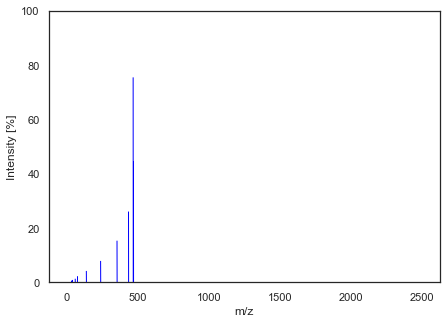

Matching spectra using cos_sim


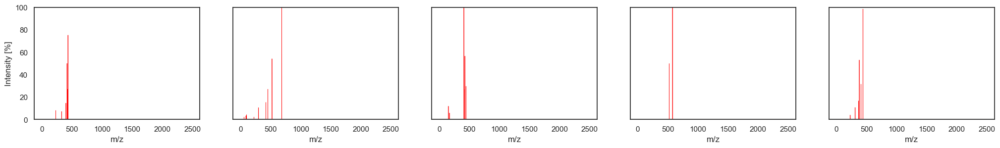

Matching spectra using eu_dist


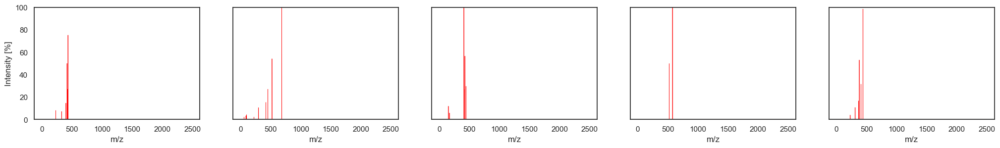

Matching spectra using per_diff


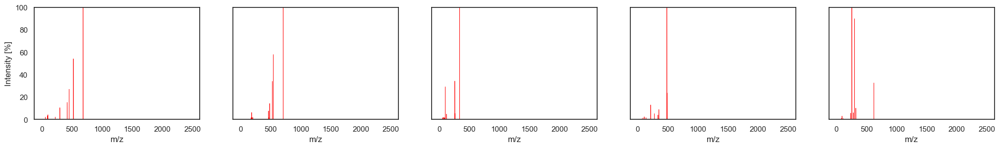

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.994073
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.992596
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.990931
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.989498
10934,UIDGLYUNOUKLBM-ACHADDEXSA-N,346.88:32.818473 495.26:10.059492 516.93:30.078062 590.21:60.702537 607.17:100.000000,35.0,1,0.989429


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.108876
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.121692
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.134681
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.144928
10934,UIDGLYUNOUKLBM-ACHADDEXSA-N,346.88:32.818473 495.26:10.059492 516.93:30.078062 590.21:60.702537 607.17:100.000000,35.0,1,0.145404


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.321614
58790,DBEPLOCGEIEOCV-WSBQPABSSA-N,57.0695:1.358438 69.0332:1.398676 72.0441:1.563617 81.0695:0.747557 95.0857:1.684663 98.0603:0.537389 121.1014:0.594919 175.1471:1.164898 189.1634:0.542710 220.1694:0.630834 255.1744:0.698673 272....,NaN,1,0.339390
29095,WLKCSMCLEKGITB-XWJJKCKWSA-N,59.013534182593936:0.803975 111.08168029785156:1.330508 121.10239882696243:3.230453 147.11808631533668:2.611926 175.14934285481772:11.816070 219.1391369047619:48.331023 248.1418689546131:10.416107...,10.0,0,0.351343
15014,RCCBGOMNZWYBTJ-UHFFFAOYSA-N,147.1086:1.154154 159.6968:1.000000 172.9299:1.396396 175.0105:1.043043 177.0834:1.587588 185.0408:6.206206 188.1489:1.759760 201.9797:1.000000 203.0531:1.722723 204.6527:1.117117 216.9767:1.07907...,40.0,1,0.357258
15399,VVRNYAJXAUQHEN-BNFZFUHLSA-N,50.079245:0.007195 50.204526:0.021100 50.211623:0.030101 50.263152:0.027808 50.296885:0.017502 51.277409:0.009417 51.691133:0.001663 51.798486:0.002127 51.877793:0.009549 51.958124:0.001856 52.017...,35.0,1,0.362566


Intermediate spectrum


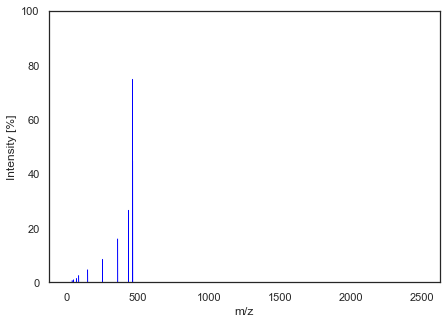

Matching spectra using cos_sim


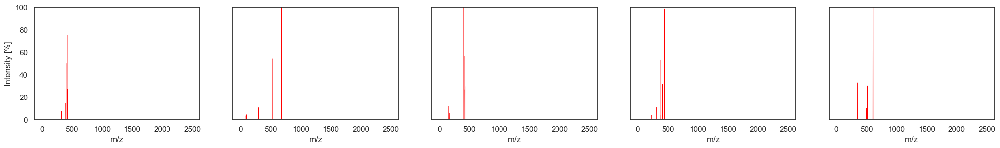

Matching spectra using eu_dist


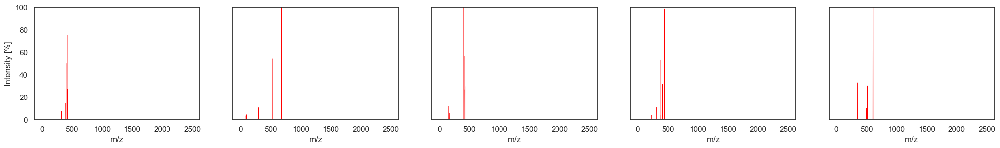

Matching spectra using per_diff


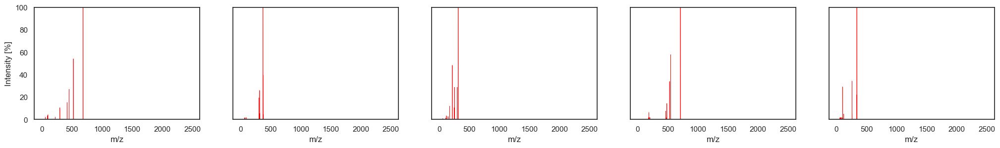

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.993888
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.991545
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.990160
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.989579
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.988984


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.110565
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.130038
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.140286
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.144365
93557,WJHQHAFOOMOTBJ-MSHADUKESA-N,229.09:3.881458818912506 311.14:10.665485501232302 365.25:16.533589339214746 367.24:3.8367588362336256 379.18:53.003530777977275 407.26:31.45876431192902 439.24:98.49682632769805,35.0,0,0.148434


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
58790,DBEPLOCGEIEOCV-WSBQPABSSA-N,57.0695:1.358438 69.0332:1.398676 72.0441:1.563617 81.0695:0.747557 95.0857:1.684663 98.0603:0.537389 121.1014:0.594919 175.1471:1.164898 189.1634:0.542710 220.1694:0.630834 255.1744:0.698673 272....,NaN,1,0.304384
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.313373
29095,WLKCSMCLEKGITB-XWJJKCKWSA-N,59.013534182593936:0.803975 111.08168029785156:1.330508 121.10239882696243:3.230453 147.11808631533668:2.611926 175.14934285481772:11.816070 219.1391369047619:48.331023 248.1418689546131:10.416107...,10.0,0,0.315968
11239,IKGXIBQEEMLURG-NVPNHPEKSA-N,56.0:0.671 59.0:0.668 70.0:1.515 71.0:1.251 84.0:3.329 85.0:2.294 128.0:1.143 129.0:1.535 130.0:0.7 145.0:0.734 146.0:0.979 147.0:1.092 148.0:0.648 283.0:0.763 284.0:0.707 302.0:12.505 303.0:17.17...,NaN,1,0.336796
90993,ACTOXUHEUCPTEW-JMRHEKERSA-N,155.85:1.205290 173.88:4.944131 263.08:0.529299 281.08:2.706038 318.07:11.254444 336.16:0.709983 490.18:10.735851 508.28:1.495493 522.22:42.743955 540.19:100.000000 572.3:0.709602 666.24:12.738912...,35.0,1,0.338715


Intermediate spectrum


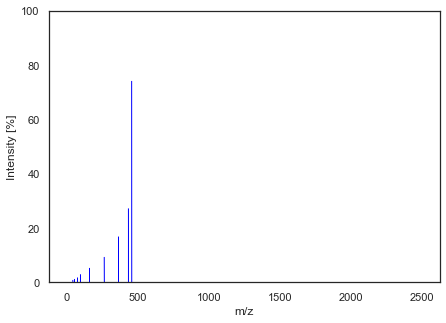

Matching spectra using cos_sim


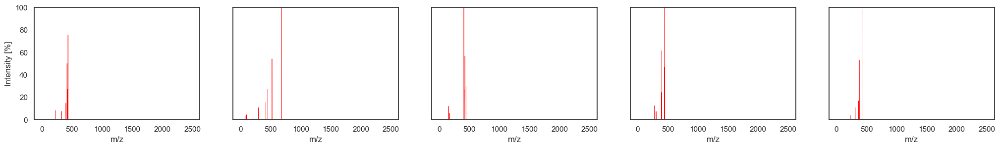

Matching spectra using eu_dist


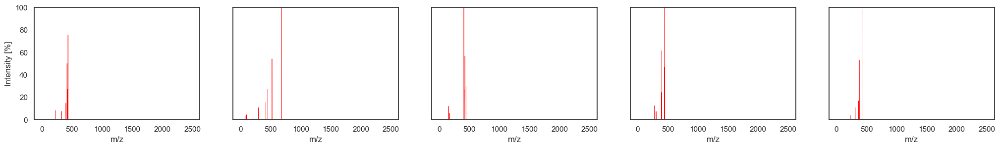

Matching spectra using per_diff


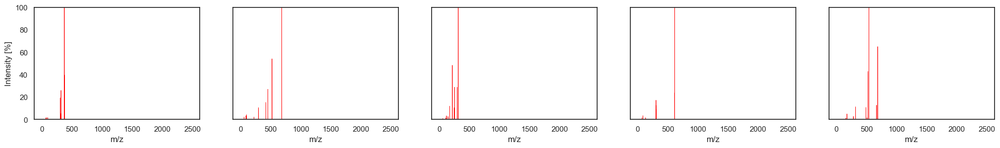

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.993219
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.990032
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.989407
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.988803
47779,IKFXPERBVFYFMS-DPILJLKXSA-N,161.05:3.635005 171.12:1.120775 173.12:3.092667 186.98:5.091699 205.03:3.091117 217.08:9.449442 231.14:5.787941 243.16:4.297811 251.14:2.250368 253.21:5.318334 263.2:2.005630 283.14:2.838793 287.1...,35.0,1,0.988507


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.116451
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.141197
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.145554
109052,JYHCQVWYCGHXGP-ZHZULCJRSA-N,154.0497:11.801492 171.0757:5.734374 410.1234:100.000000 427.15:56.498923 428.1335:26.709187 445.1603:29.493569,20.0,1,0.149646
47779,IKFXPERBVFYFMS-DPILJLKXSA-N,161.05:3.635005 171.12:1.120775 173.12:3.092667 186.98:5.091699 205.03:3.091117 217.08:9.449442 231.14:5.787941 243.16:4.297811 251.14:2.250368 253.21:5.318334 263.2:2.005630 283.14:2.838793 287.1...,35.0,1,0.151611


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
58790,DBEPLOCGEIEOCV-WSBQPABSSA-N,57.0695:1.358438 69.0332:1.398676 72.0441:1.563617 81.0695:0.747557 95.0857:1.684663 98.0603:0.537389 121.1014:0.594919 175.1471:1.164898 189.1634:0.542710 220.1694:0.630834 255.1744:0.698673 272....,NaN,1,0.295024
29095,WLKCSMCLEKGITB-XWJJKCKWSA-N,59.013534182593936:0.803975 111.08168029785156:1.330508 121.10239882696243:3.230453 147.11808631533668:2.611926 175.14934285481772:11.816070 219.1391369047619:48.331023 248.1418689546131:10.416107...,10.0,0,0.305402
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.309919
90993,ACTOXUHEUCPTEW-JMRHEKERSA-N,155.85:1.205290 173.88:4.944131 263.08:0.529299 281.08:2.706038 318.07:11.254444 336.16:0.709983 490.18:10.735851 508.28:1.495493 522.22:42.743955 540.19:100.000000 572.3:0.709602 666.24:12.738912...,35.0,1,0.319829
11239,IKGXIBQEEMLURG-NVPNHPEKSA-N,56.0:0.671 59.0:0.668 70.0:1.515 71.0:1.251 84.0:3.329 85.0:2.294 128.0:1.143 129.0:1.535 130.0:0.7 145.0:0.734 146.0:0.979 147.0:1.092 148.0:0.648 283.0:0.763 284.0:0.707 302.0:12.505 303.0:17.17...,NaN,1,0.322908


Intermediate spectrum


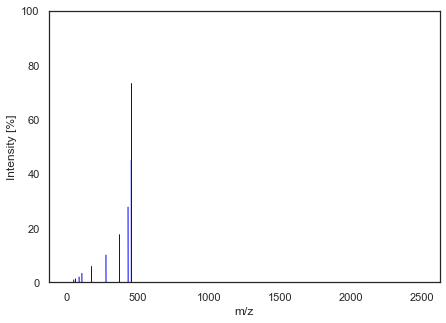

Matching spectra using cos_sim


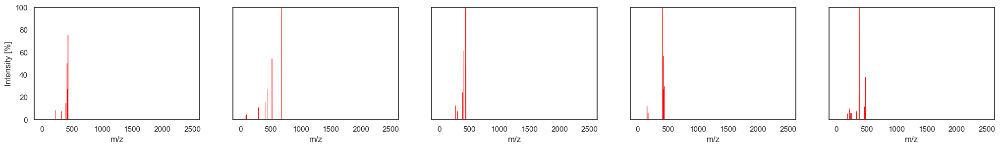

Matching spectra using eu_dist


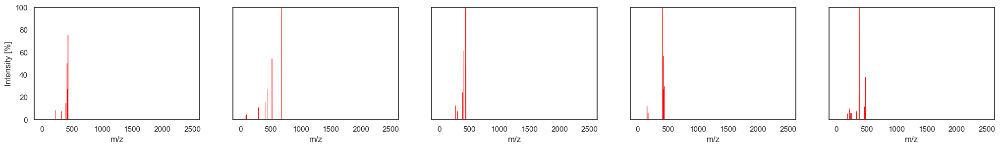

Matching spectra using per_diff


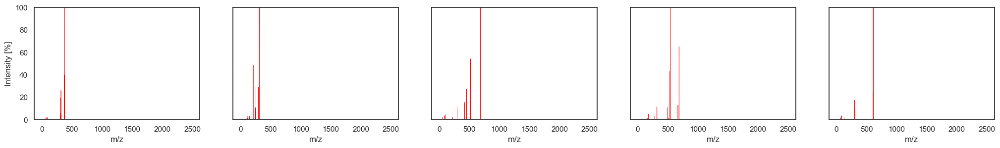

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.992187
47779,IKFXPERBVFYFMS-DPILJLKXSA-N,161.05:3.635005 171.12:1.120775 173.12:3.092667 186.98:5.091699 205.03:3.091117 217.08:9.449442 231.14:5.787941 243.16:4.297811 251.14:2.250368 253.21:5.318334 263.2:2.005630 283.14:2.838793 287.1...,35.0,1,0.989365
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.988777
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.988244
103485,MLRDPISQDDYRHC-BSTKLLGTSA-N,113.6142:5.949950 125.7097:4.778779 138.0311:1.365365 185.0486:4.341341 185.6433:4.236236 213.5500:2.573574 311.0568:61.157157 311.9588:1.278278 312.7762:3.128128 337.9494:4.907908 384.2524:26.051...,10.0,0,0.988192


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
91048,OQMUOVSEPOBWMK-FDGFJIMDSA-N,230.99:8.026314420614952 327.08:7.081650092314107 399.1:14.551880174379574 417.12:49.91975931703463 429.13:26.845362739104118 433.16:75.17338744768809,35.0,1,0.125006
47779,IKFXPERBVFYFMS-DPILJLKXSA-N,161.05:3.635005 171.12:1.120775 173.12:3.092667 186.98:5.091699 205.03:3.091117 217.08:9.449442 231.14:5.787941 243.16:4.297811 251.14:2.250368 253.21:5.318334 263.2:2.005630 283.14:2.838793 287.1...,35.0,1,0.145845
51311,GDAAEAXMNLVRCZ-SFHVURJKSA-N,275.17:12.176452 304.22:7.101533 389.15:24.032809 399.31:61.241527 441.24:100.000000 445.26:46.647779,35.0,1,0.149817
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.153336
103485,MLRDPISQDDYRHC-BSTKLLGTSA-N,113.6142:5.949950 125.7097:4.778779 138.0311:1.365365 185.0486:4.341341 185.6433:4.236236 213.5500:2.573574 311.0568:61.157157 311.9588:1.278278 312.7762:3.128128 337.9494:4.907908 384.2524:26.051...,10.0,0,0.153675


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
18562,CMUOOPXNBJLJQK-XIYZJAHSSA-N,111.0454:2.225225 115.0756:2.091091 129.0530:2.980981 143.0688:11.903904 161.0797:8.497497 175.1474:8.994995 309.2118:1.032032 337.2150:16.098098 355.2251:100.000000 373.2360:61.072072 391.2454:19...,20.0,1,0.296739
97028,KXNPVXPOPUZYGB-YZYLHUITSA-N,44.956558:0.068801 45.270729:0.076445 47.653618:0.066890 48.809891:0.078356 49.695492:0.070712 49.736191:0.072623 51.320763:0.086001 51.479160:0.074534 54.454235:0.078356 56.056530:0.084090 57.674...,NaN,1,0.302489
119053,TVZGACDUOSZQKY-UHFFFAOYSA-N,119.0:4.791 174.0:5.734 175.0:2.37 176.0:1.497 293.0:47.406 294.0:25.722 295.0:7.949 311.0:1.721 312.0:3.592 440.0:100.0 441.0:73.854 442.0:21.527,NaN,1,0.310691
33369,STKUCSFEBXPTAY-GSUVRYNNSA-N,59.0132:2.045045 71.0123:1.372372 89.0238:3.283283 101.0223:4.204204 101.027:1.124124 113.0211:1.314314 119.0385:1.664665 179.0514:1.021021 223.0568:3.013013 223.0649:2.078078 299.1128:10.487487 4...,10.0,0,0.312407
98990,RPVIQWDFJPYNJM-DEFKTLOSSA-N,97.03352:2.100000 127.03398:3.700000 146.05272:1.000000 214.86368:2.300000 257.04636:0.700000 302.99371:1.700000 303.00363:1.400000 303.04913:100.000000 303.96268:0.900000 304.04364:7.800000 304.0...,10.0,1,0.312791


Intermediate spectrum


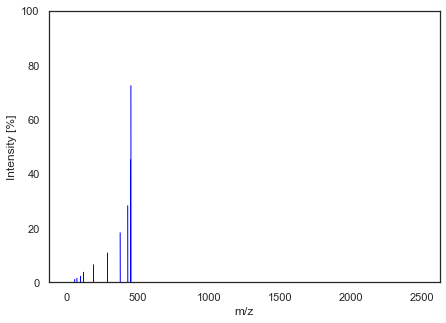

Matching spectra using cos_sim


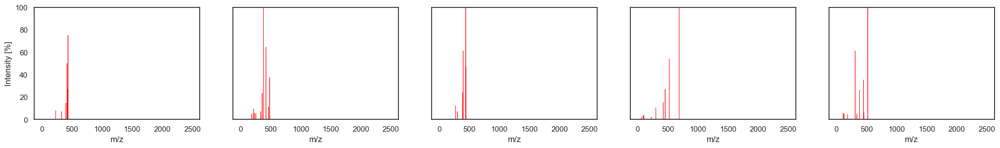

Matching spectra using eu_dist


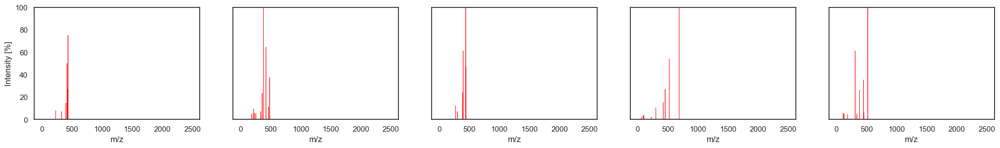

Matching spectra using per_diff


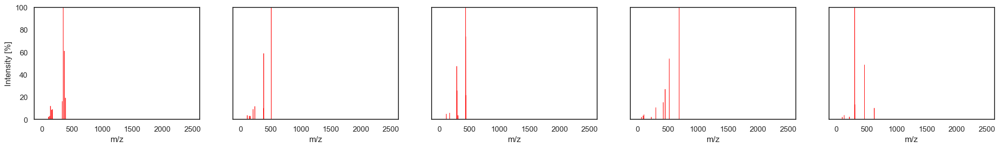

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.997867
121912,UWKQJZCTQGMHKD-UHFFFAOYSA-N,55.0179:0.118838 55.0542:0.926560 57.0697:0.165292 59.0491:0.284272 69.0698:0.682397 83.0854:2.580565 93.0698:0.154747 105.0699:0.629987 111.0803:0.384512 114.0913:0.246460 119.0492:0.366716 121.0...,60.0,1,0.997683
63697,QAIPRVGONGVQAS-RQOWECAXSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.997502
57667,QAIPRVGONGVQAS-DUXPYHPUSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.997502
118176,DJOJDHGQRNZXQQ-AWEZNQCLSA-N,67.01736:2.400000 91.05392:6.400000 92.05921:0.500000 93.03349:0.700000 95.04974:1.800000 107.04691:1.300000 111.03547:0.500000 111.04494:3.300000 119.04915:21.100000 120.04706:0.800000 120.0535:2...,30.0,1,0.997186


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.065318
121912,UWKQJZCTQGMHKD-UHFFFAOYSA-N,55.0179:0.118838 55.0542:0.926560 57.0697:0.165292 59.0491:0.284272 69.0698:0.682397 83.0854:2.580565 93.0698:0.154747 105.0699:0.629987 111.0803:0.384512 114.0913:0.246460 119.0492:0.366716 121.0...,60.0,1,0.068071
63697,QAIPRVGONGVQAS-RQOWECAXSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.070686
57667,QAIPRVGONGVQAS-DUXPYHPUSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.070686
118176,DJOJDHGQRNZXQQ-AWEZNQCLSA-N,67.01736:2.400000 91.05392:6.400000 92.05921:0.500000 93.03349:0.700000 95.04974:1.800000 107.04691:1.300000 111.03547:0.500000 111.04494:3.300000 119.04915:21.100000 120.04706:0.800000 120.0535:2...,30.0,1,0.075026


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
100929,ZJMZZNVGNSWOOM-UHFFFAOYSA-N,69.303230:0.000000 69.303368:0.000000 69.303505:0.000000 70.518982:0.000000 70.519127:0.000000 70.519264:0.000000 70.519829:0.054699 70.520348:0.000000 70.520493:0.000000 70.520630:0.000000 71.059...,NaN,1,0.199708
69786,PSFDQSOCUJVVGF-UHFFFAOYSA-N,63.000:1.612903 67.000:1.152074 77.400:4.838710 81.100:1.382488 87.800:1.382488 94.700:0.921659 106.100:1.382488 113.900:0.921659 115.100:100.000000 116.200:1.152074 119.300:0.691244 128.700:3.456...,40.0,1,0.247381
25793,AXOJRQLKMVSHHZ-UHFFFAOYSA-N,50.001918:0.010492 50.470180:0.063154 50.875689:0.018186 51.135240:0.056585 51.819685:0.001168 51.872165:0.002220 51.940290:0.106171 52.131072:0.001312 52.353153:0.001009 52.683813:0.011000 53.082...,45.0,1,0.247780
49409,UZKQTCBAMSWPJD-FARCUNLSSA-N,55.0289:0.644566 65.0134:2.605001 67.0291:4.706107 67.0542:1.780943 77.0135:0.963460 82.04:1.406534 92.0243:20.326699 94.04:8.499860 105.0448:0.821522 109.0508:8.278173 119.0352:100.000000 121.050...,120.0,1,0.248452
55971,OVYNGSFVYRPRCG-KQYNXXCUSA-N,54.0552:0.399654 55.0166:1.188162 55.0286:0.507669 57.0324:2.009073 59.0481:1.695831 61.0279:1.976669 69.0328:16.623461 71.0123:0.842515 71.0488:1.177360 73.0273:0.496868 73.0635:1.490603 74.015:0...,40.0,1,0.250628


Intermediate spectrum


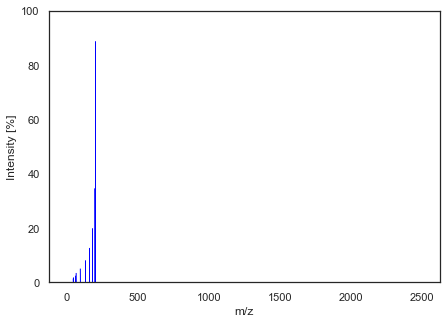

Matching spectra using cos_sim


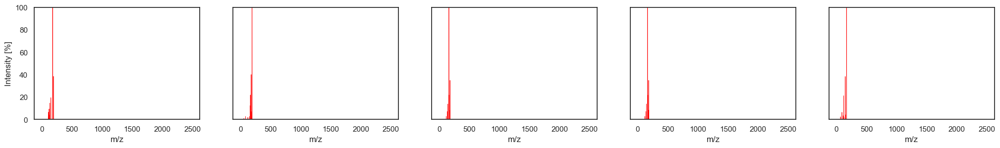

Matching spectra using eu_dist


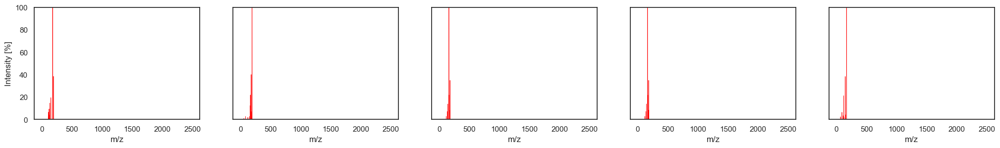

Matching spectra using per_diff


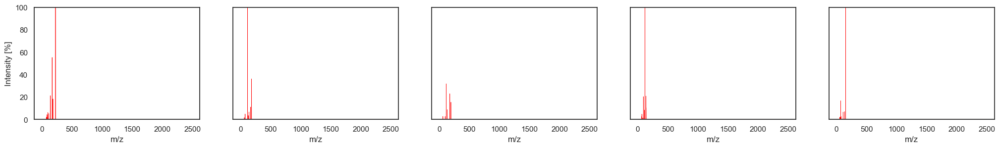

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.997695
121912,UWKQJZCTQGMHKD-UHFFFAOYSA-N,55.0179:0.118838 55.0542:0.926560 57.0697:0.165292 59.0491:0.284272 69.0698:0.682397 83.0854:2.580565 93.0698:0.154747 105.0699:0.629987 111.0803:0.384512 114.0913:0.246460 119.0492:0.366716 121.0...,60.0,1,0.997245
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.997238
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.997197
57667,QAIPRVGONGVQAS-DUXPYHPUSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.997120


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.067903
121912,UWKQJZCTQGMHKD-UHFFFAOYSA-N,55.0179:0.118838 55.0542:0.926560 57.0697:0.165292 59.0491:0.284272 69.0698:0.682397 83.0854:2.580565 93.0698:0.154747 105.0699:0.629987 111.0803:0.384512 114.0913:0.246460 119.0492:0.366716 121.0...,60.0,1,0.074228
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.074329
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.074876
57667,QAIPRVGONGVQAS-DUXPYHPUSA-N,116.0:2.731 134.0:7.099 135.0:3.391 138.0:2.769 144.0:13.83 162.0:100.0 163.0:21.729 180.0:34.88 181.0:8.166,NaN,1,0.075892


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
100929,ZJMZZNVGNSWOOM-UHFFFAOYSA-N,69.303230:0.000000 69.303368:0.000000 69.303505:0.000000 70.518982:0.000000 70.519127:0.000000 70.519264:0.000000 70.519829:0.054699 70.520348:0.000000 70.520493:0.000000 70.520630:0.000000 71.059...,NaN,1,0.211432
25793,AXOJRQLKMVSHHZ-UHFFFAOYSA-N,50.001918:0.010492 50.470180:0.063154 50.875689:0.018186 51.135240:0.056585 51.819685:0.001168 51.872165:0.002220 51.940290:0.106171 52.131072:0.001312 52.353153:0.001009 52.683813:0.011000 53.082...,45.0,1,0.213564
25102,BEDSGEULUAVXQH-YGCGHWCOSA-N,82.519661:1.297961 85.111076:0.816766 89.261284:1.127010 93.034782:2.336330 93.446350:1.285298 100.788147:0.804103 111.047455:3.134102 125.306671:0.557174 132.027802:1.899455 137.026123:1.373939 1...,NaN,0,0.227249
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.230854
70360,VLCHQFXSBHIBRV-NJPMDSMTSA-N,59.0103:1.226226 59.0141:3.107107 71.0105:2.385385 89.0183:1.912913 89.0226:3.445445 101.022:3.290290 107.0469:5.093093 113.0226:1.327327 119.031:2.255255 125.0576:8.738739 125.0641:1.023023 151.0...,10.0,0,0.235519


Intermediate spectrum


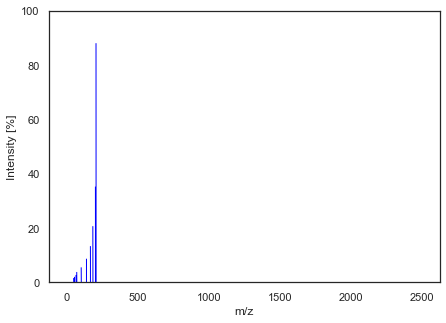

Matching spectra using cos_sim


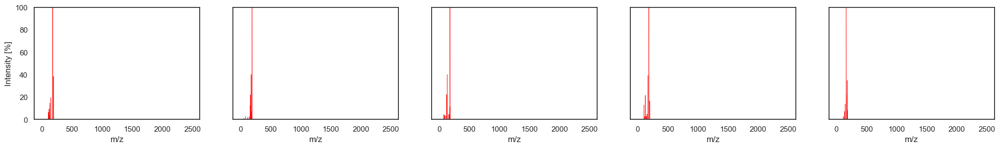

Matching spectra using eu_dist


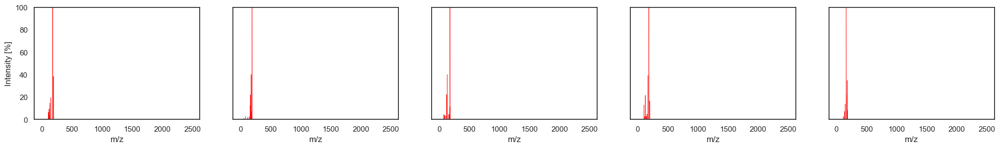

Matching spectra using per_diff


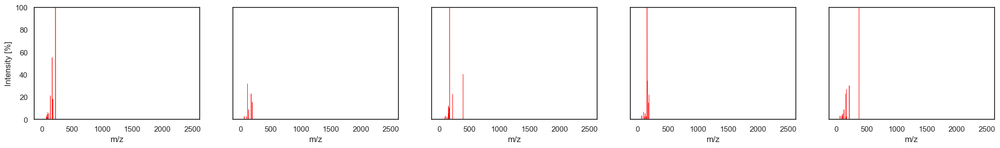

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.997301
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.997239
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.997204
41342,MOLPUWBMSBJXER-YSXCXNLVSA-N,50.395672:0.054502 50.397265:0.052198 52.709941:0.055523 53.975784:0.058280 54.093321:0.060470 54.366495:0.057140 54.442797:0.058117 54.789958:0.054981 54.988155:0.042039 55.451688:0.042755 55.666...,65.0,0,0.997052
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.996815


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
1710,QUKDLMFYXITHBM-XYOKQWHBSA-N,103.0513:1.702703 105.0327:1.453453 105.0688:2.447447 109.1005:6.519520 117.0321:1.243243 117.0704:4.238238 119.0846:9.373373 122.0362:3.346346 132.0193:2.151151 133.0269:14.672673 137.0577:1.4754...,40.0,1,0.073475
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.074308
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.074777
41342,MOLPUWBMSBJXER-YSXCXNLVSA-N,50.395672:0.054502 50.397265:0.052198 52.709941:0.055523 53.975784:0.058280 54.093321:0.060470 54.366495:0.057140 54.442797:0.058117 54.789958:0.054981 54.988155:0.042039 55.451688:0.042755 55.666...,65.0,0,0.076784
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.079810


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
25793,AXOJRQLKMVSHHZ-UHFFFAOYSA-N,50.001918:0.010492 50.470180:0.063154 50.875689:0.018186 51.135240:0.056585 51.819685:0.001168 51.872165:0.002220 51.940290:0.106171 52.131072:0.001312 52.353153:0.001009 52.683813:0.011000 53.082...,45.0,1,0.201409
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.208039
44768,QJOZJXNKVMFAET-UHFFFAOYSA-N,41.900:0.772201 64.100:2.702703 64.900:1.158301 77.100:2.316602 78.600:1.930502 154.100:3.861004 155.200:3.088803 167.300:1.544402 168.000:10.038610 169.000:10.424710 170.200:27.027027 182.100:22....,50.0,0,0.208923
25102,BEDSGEULUAVXQH-YGCGHWCOSA-N,82.519661:1.297961 85.111076:0.816766 89.261284:1.127010 93.034782:2.336330 93.446350:1.285298 100.788147:0.804103 111.047455:3.134102 125.306671:0.557174 132.027802:1.899455 137.026123:1.373939 1...,NaN,0,0.220010
3212,PUFQVTATUTYEAL-UHFFFAOYSA-N,57.0696:7.477422 72.0806:2.957782 74.0963:2.415861 86.0964:0.439723 100.112:4.710473 116.0494:100.000000 118.0651:0.403949 128.0494:1.235936 130.065:1.456536 132.044:0.408979 134.06:0.325156 142.0...,85.0,1,0.222539


Intermediate spectrum


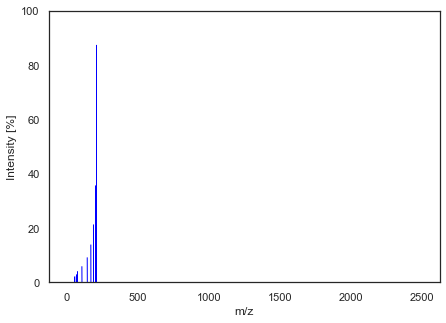

Matching spectra using cos_sim


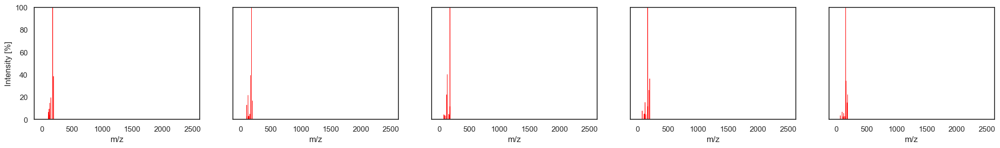

Matching spectra using eu_dist


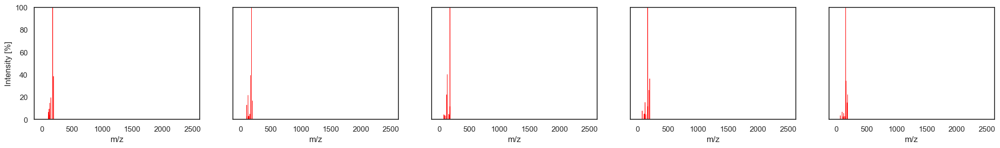

Matching spectra using per_diff


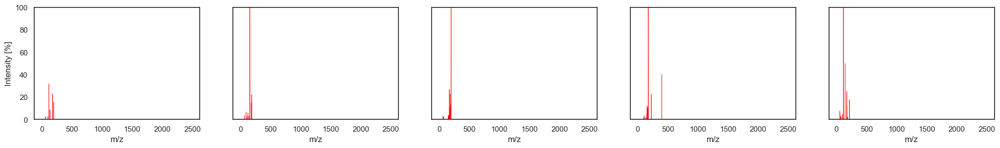

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.997039
41342,MOLPUWBMSBJXER-YSXCXNLVSA-N,50.395672:0.054502 50.397265:0.052198 52.709941:0.055523 53.975784:0.058280 54.093321:0.060470 54.366495:0.057140 54.442797:0.058117 54.789958:0.054981 54.988155:0.042039 55.451688:0.042755 55.666...,65.0,0,0.996981
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.996915
72632,MWZPENIJLUWBSY-VIFPVBQESA-N,44.600:0.193673 58.800:0.516462 72.900:0.839251 77.800:0.387347 80.800:0.129116 83.100:0.387347 88.900:0.322789 90.900:2.711427 95.200:0.258231 99.800:3.163331 100.500:0.645578 103.000:1.097482 10...,20.0,1,0.996706
32860,UKFAWRZYFYOXEG-UHFFFAOYSA-N,50.107922:0.004646 50.419005:0.014434 50.625656:0.015131 51.132710:0.013450 51.354634:0.008224 51.425857:0.004501 51.707967:0.004439 51.835571:0.005610 52.122753:0.016445 52.384320:0.004634 52.548...,65.0,1,0.996653


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
25530,VMTHPSSNJFUGBF-CMDGGOBGSA-N,103.0541:12.880881 109.0281:2.624625 124.0150:21.496496 126.0307:6.174174 131.0488:2.889890 139.0028:2.837838 151.0390:1.269269 154.0256:4.876877 166.9970:39.208208 182.0207:100.000000 197.0438:16...,40.0,1,0.076953
41342,MOLPUWBMSBJXER-YSXCXNLVSA-N,50.395672:0.054502 50.397265:0.052198 52.709941:0.055523 53.975784:0.058280 54.093321:0.060470 54.366495:0.057140 54.442797:0.058117 54.789958:0.054981 54.988155:0.042039 55.451688:0.042755 55.666...,65.0,0,0.077702
103341,MMPBHSBVPREJQC-GCJOFGIHSA-N,79.051971:4.302789 89.040413:3.585657 91.042419:2.231076 105.030922:3.107570 109.029160:3.282869 112.919266:2.884462 118.032784:2.693227 123.046295:22.071713 124.044456:2.741036 133.027679:40.0318...,NaN,1,0.078545
72632,MWZPENIJLUWBSY-VIFPVBQESA-N,44.600:0.193673 58.800:0.516462 72.900:0.839251 77.800:0.387347 80.800:0.129116 83.100:0.387347 88.900:0.322789 90.900:2.711427 95.200:0.258231 99.800:3.163331 100.500:0.645578 103.000:1.097482 10...,20.0,1,0.081170
32860,UKFAWRZYFYOXEG-UHFFFAOYSA-N,50.107922:0.004646 50.419005:0.014434 50.625656:0.015131 51.132710:0.013450 51.354634:0.008224 51.425857:0.004501 51.707967:0.004439 51.835571:0.005610 52.122753:0.016445 52.384320:0.004634 52.548...,65.0,1,0.081818


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
44768,QJOZJXNKVMFAET-UHFFFAOYSA-N,41.900:0.772201 64.100:2.702703 64.900:1.158301 77.100:2.316602 78.600:1.930502 154.100:3.861004 155.200:3.088803 167.300:1.544402 168.000:10.038610 169.000:10.424710 170.200:27.027027 182.100:22....,50.0,0,0.192502
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.197241
25793,AXOJRQLKMVSHHZ-UHFFFAOYSA-N,50.001918:0.010492 50.470180:0.063154 50.875689:0.018186 51.135240:0.056585 51.819685:0.001168 51.872165:0.002220 51.940290:0.106171 52.131072:0.001312 52.353153:0.001009 52.683813:0.011000 53.082...,45.0,1,0.200828
60303,QSLMDECMDJKHMQ-UHFFFAOYSA-N,115.0552:0.856010 117.0709:6.344527 118.0741:0.653689 129.0708:0.757098 131.0865:2.710618 141.0708:1.265148 143.0864:1.934894 155.0863:0.522823 169.1025:10.700849 170.1056:1.254711 178.0789:1.2437...,20.0,1,0.214214
2703,CVPYYBCSHSCXJQ-DXKBKAGUSA-N,50.142808:0.901146 50.227594:1.184097 51.110944:1.296972 51.169598:1.320194 51.744040:0.817391 51.952645:0.215847 52.368077:1.241889 52.396191:0.293918 54.455868:0.191334 54.754391:1.285993 54.823...,45.0,1,0.215215


Intermediate spectrum


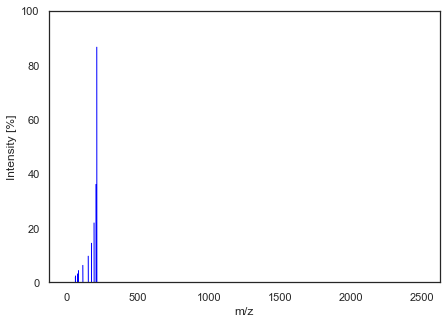

Matching spectra using cos_sim


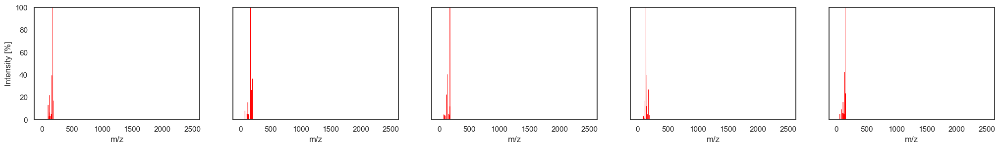

Matching spectra using eu_dist


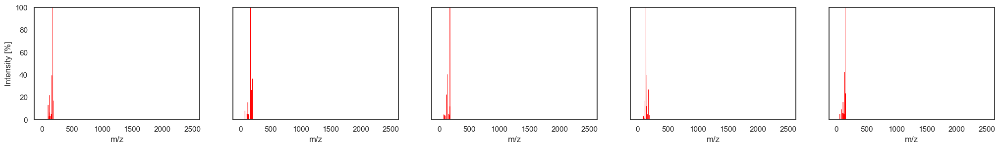

Matching spectra using per_diff


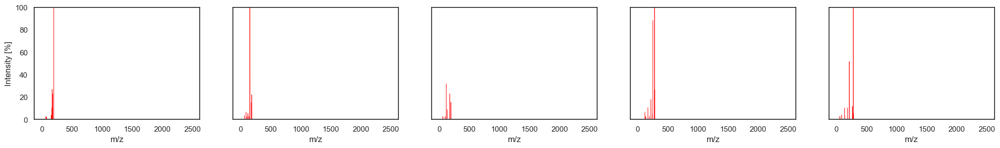

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.997200
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.996899
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.996831
15478,OMZRMXULWNMRAE-BMRADRMJSA-N,50.040377:0.003790 50.249948:0.000524 50.254646:0.003419 50.305804:0.003579 50.517357:0.004042 50.613728:0.003195 50.638235:0.004776 51.001802:0.004035 51.101920:0.004175 51.232615:0.004101 51.395...,65.0,1,0.996761
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.996739


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.074827
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.078752
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.079608
15478,OMZRMXULWNMRAE-BMRADRMJSA-N,50.040377:0.003790 50.249948:0.000524 50.254646:0.003419 50.305804:0.003579 50.517357:0.004042 50.613728:0.003195 50.638235:0.004776 51.001802:0.004035 51.101920:0.004175 51.232615:0.004101 51.395...,65.0,1,0.080486
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.080760


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
44768,QJOZJXNKVMFAET-UHFFFAOYSA-N,41.900:0.772201 64.100:2.702703 64.900:1.158301 77.100:2.316602 78.600:1.930502 154.100:3.861004 155.200:3.088803 167.300:1.544402 168.000:10.038610 169.000:10.424710 170.200:27.027027 182.100:22....,50.0,0,0.200523
91692,NFJVELXCUBWAFL-UHFFFAOYSA-N,50.034530:0.019247 50.438652:0.016907 50.623950:0.011066 50.940448:0.016204 51.101305:0.016970 51.207999:0.021973 51.567079:0.018771 52.406797:0.013079 52.424804:0.017098 53.144959:0.017760 53.665...,45.0,0,0.202979
123063,MEFOUWRMVYJCQC-UHFFFAOYSA-N,65.0144:3.420313 65.9986:2.428616 93.0462:6.650394 109.0174:2.508230 122.0361:5.522563 139.0394:2.717437 154.0625:100.000000 157.008:34.366560 157.9923:12.334525 179.0578:14.890394 186.0236:22.116573,45.0,0,0.204657
8032,RSDDHGSKLOSQFK-RVDMUPIBSA-N,50.282115:0.015284 50.694713:0.014450 50.819584:0.003240 51.579045:0.016297 51.600649:0.011741 51.722890:0.012733 51.785427:0.009863 51.822291:0.002358 52.158597:0.009852 52.542108:0.009450 52.666...,35.0,1,0.205514
80158,CIGKZVUEZXGYSV-UHFFFAOYSA-N,73.0648:7.115190 136.1122:5.426325 144.0808:2.882190 146.0965:4.042908 160.1121:28.694485 174.1276:13.913434 175.1355:10.077111 176.1432:21.962777 202.1225:76.742395 298.1105:100.000000,45.0,1,0.211098


Intermediate spectrum


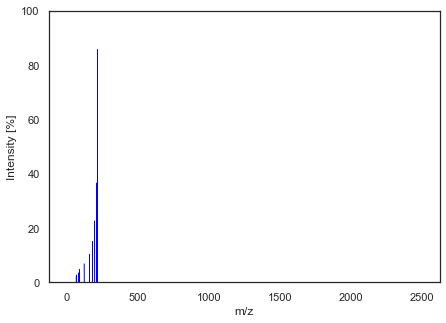

Matching spectra using cos_sim


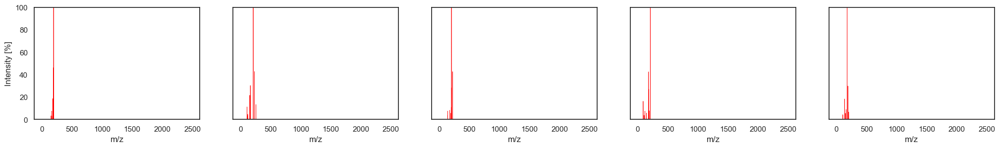

Matching spectra using eu_dist


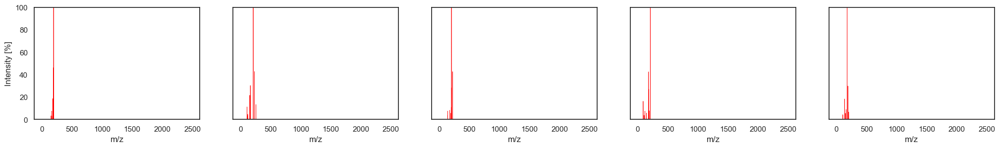

Matching spectra using per_diff


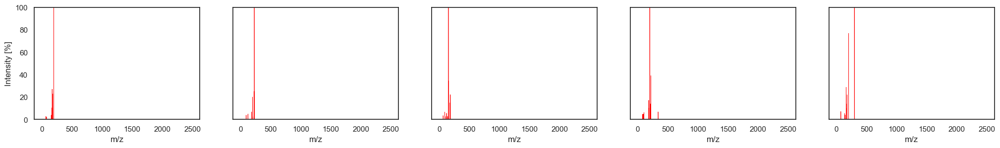

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.997394
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.997370
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.997300
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.997283
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.997171


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.072192
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.072534
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.073483
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.073718
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.075219


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
15657,HKQYGTCOTHHOMP-UHFFFAOYSA-N,107.0493:4.717983 118.0413:7.338164 136.0155:4.470853 137.0234:2.765799 197.0599:2.489032 213.0911:26.918697 226.0625:16.261435 237.0545:17.222767 253.0496:13.035448 254.0575:29.713549 269.081:100...,55.0,1,0.184825
13539,CCNKTMMNRPJQHV-SFHVURJKSA-N,50.187531:0.045266 50.476032:0.060654 50.757403:0.045849 51.497105:0.047259 51.846498:0.042832 52.363183:0.039558 52.529974:0.034153 53.549824:0.030416 53.937110:0.032711 54.444298:0.037351 54.450...,45.0,0,0.191018
91692,NFJVELXCUBWAFL-UHFFFAOYSA-N,50.034530:0.019247 50.438652:0.016907 50.623950:0.011066 50.940448:0.016204 51.101305:0.016970 51.207999:0.021973 51.567079:0.018771 52.406797:0.013079 52.424804:0.017098 53.144959:0.017760 53.665...,45.0,0,0.194128
80158,CIGKZVUEZXGYSV-UHFFFAOYSA-N,73.0648:7.115190 136.1122:5.426325 144.0808:2.882190 146.0965:4.042908 160.1121:28.694485 174.1276:13.913434 175.1355:10.077111 176.1432:21.962777 202.1225:76.742395 298.1105:100.000000,45.0,1,0.194376
8032,RSDDHGSKLOSQFK-RVDMUPIBSA-N,50.282115:0.015284 50.694713:0.014450 50.819584:0.003240 51.579045:0.016297 51.600649:0.011741 51.722890:0.012733 51.785427:0.009863 51.822291:0.002358 52.158597:0.009852 52.542108:0.009450 52.666...,35.0,1,0.194580


Intermediate spectrum


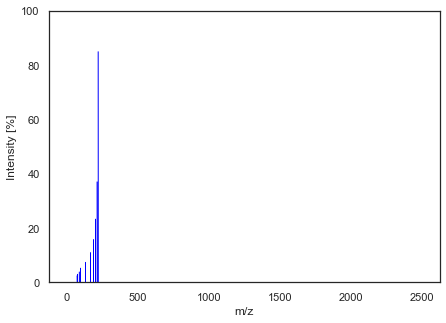

Matching spectra using cos_sim


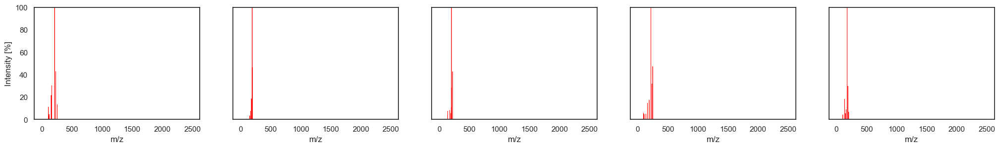

Matching spectra using eu_dist


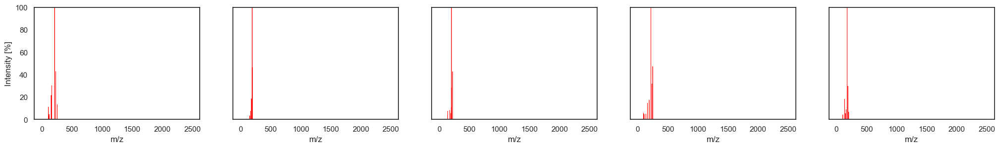

Matching spectra using per_diff


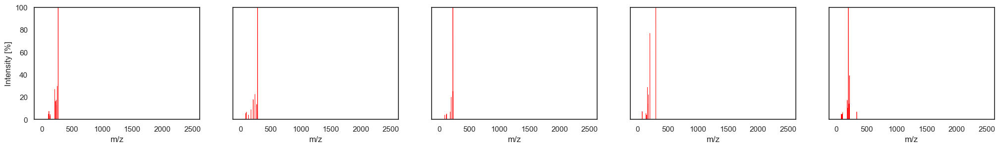

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.997643
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.997504
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.997406
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.997226
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.997197


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.068659
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.070646
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.072028
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.074483
96097,BMPDWHIDQYTSHX-UHFFFAOYSA-N,116.0486:0.530023 152.0608:3.287487 165.0687:7.468970 166.0728:1.596780 167.0719:3.017444 167.0838:2.938611 168.0795:0.738007 169.0638:0.553506 176.0605:1.013083 177.0679:1.699094 178.0645:1.72089...,40.0,1,0.074866


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
15657,HKQYGTCOTHHOMP-UHFFFAOYSA-N,107.0493:4.717983 118.0413:7.338164 136.0155:4.470853 137.0234:2.765799 197.0599:2.489032 213.0911:26.918697 226.0625:16.261435 237.0545:17.222767 253.0496:13.035448 254.0575:29.713549 269.081:100...,55.0,1,0.155269
13539,CCNKTMMNRPJQHV-SFHVURJKSA-N,50.187531:0.045266 50.476032:0.060654 50.757403:0.045849 51.497105:0.047259 51.846498:0.042832 52.363183:0.039558 52.529974:0.034153 53.549824:0.030416 53.937110:0.032711 54.444298:0.037351 54.450...,45.0,0,0.173427
96381,YHQWACJRIRKIAL-QYURMBASSA-N,55.0387:0.330935 57.033:0.647482 57.2446:0.374101 59.0477:0.258993 62.0934:0.287770 67.0538:2.705036 69.0317:0.374101 71.0475:0.374101 72.0438:0.374101 73.0274:0.776978 74.0344:0.316547 78.0215:0....,40.0,1,0.182486
62882,HAWJXYBZNNRMNO-UHFFFAOYSA-N,69.303230:0.000000 69.303360:0.000000 69.303497:0.000000 70.049355:0.000000 70.049492:0.000000 70.049637:0.000000 70.050186:0.059872 70.050735:0.000000 70.050873:0.000000 70.051010:0.000000 70.994...,NaN,1,0.182992
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.185905


Intermediate spectrum


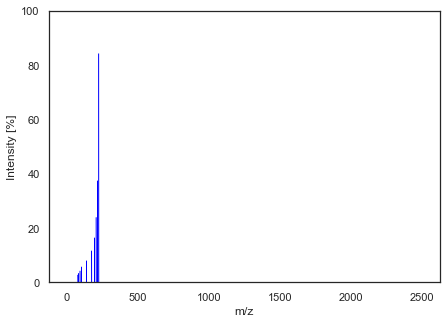

Matching spectra using cos_sim


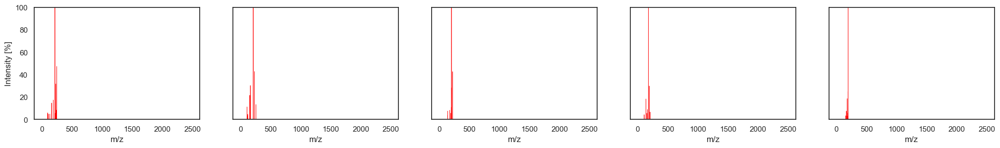

Matching spectra using eu_dist


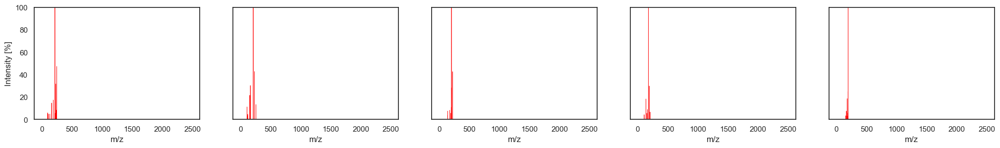

Matching spectra using per_diff


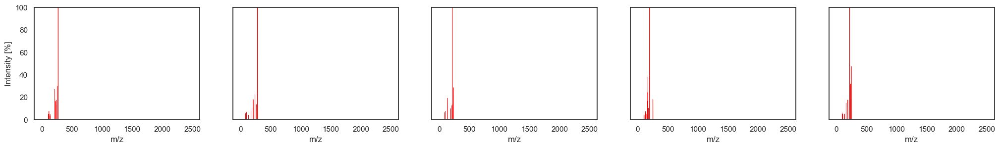

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.997767
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.997320
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.997305
58726,KSEBMYQBYZTDHS-HWKANZROSA-N,91.94984:3.600000 106.04522:5.900000 107.05019:5.300000 115.9678:4.800000 117.03487:8.900000 133.02625:6.400000 134.03783:8.400000 135.02985:6.100000 145.00044:3.900000 145.02652:44.600000 145.033...,10.0,1,0.997023
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.997019


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.066826
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.073211
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.073412
58726,KSEBMYQBYZTDHS-HWKANZROSA-N,91.94984:3.600000 106.04522:5.900000 107.05019:5.300000 115.9678:4.800000 117.03487:8.900000 133.02625:6.400000 134.03783:8.400000 135.02985:6.100000 145.00044:3.900000 145.02652:44.600000 145.033...,10.0,1,0.077166
120904,JOATXPAWOHTVSZ-UHFFFAOYSA-N,59.0138:0.976425 78.0349:1.503189 92.0506:0.345008 93.0346:0.915915 106.0299:4.267231 107.0376:0.252166 108.0455:0.196048 118.0298:1.028176 119.0503:0.993950 120.0455:0.493031 133.0533:0.172993 13...,75.0,0,0.077218


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
15657,HKQYGTCOTHHOMP-UHFFFAOYSA-N,107.0493:4.717983 118.0413:7.338164 136.0155:4.470853 137.0234:2.765799 197.0599:2.489032 213.0911:26.918697 226.0625:16.261435 237.0545:17.222767 253.0496:13.035448 254.0575:29.713549 269.081:100...,55.0,1,0.144684
62882,HAWJXYBZNNRMNO-UHFFFAOYSA-N,69.303230:0.000000 69.303360:0.000000 69.303497:0.000000 70.049355:0.000000 70.049492:0.000000 70.049637:0.000000 70.050186:0.059872 70.050735:0.000000 70.050873:0.000000 70.051010:0.000000 70.994...,NaN,1,0.156730
13539,CCNKTMMNRPJQHV-SFHVURJKSA-N,50.187531:0.045266 50.476032:0.060654 50.757403:0.045849 51.497105:0.047259 51.846498:0.042832 52.363183:0.039558 52.529974:0.034153 53.549824:0.030416 53.937110:0.032711 54.444298:0.037351 54.450...,45.0,0,0.163544
96381,YHQWACJRIRKIAL-QYURMBASSA-N,55.0387:0.330935 57.033:0.647482 57.2446:0.374101 59.0477:0.258993 62.0934:0.287770 67.0538:2.705036 69.0317:0.374101 71.0475:0.374101 72.0438:0.374101 73.0274:0.776978 74.0344:0.316547 78.0215:0....,40.0,1,0.169428
15627,HKQYGTCOTHHOMP-UHFFFAOYSA-N,91.00823:0.034583 91.01492:0.137509 98.96609:0.069166 104.02339:0.747651 121.01281:0.029643 131.62326:0.103749 132.01967:7.464985 132.3876:0.103749 132.60408:0.069166 135.00844:3.976220 152.07845:...,35.0,0,0.171732


Intermediate spectrum


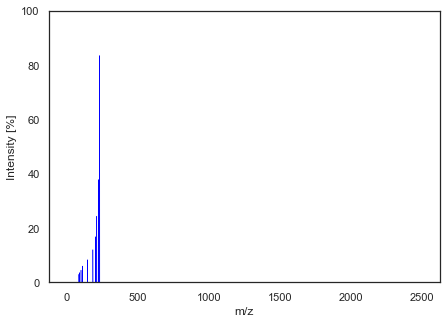

Matching spectra using cos_sim


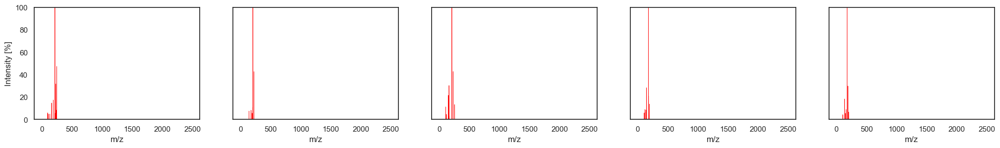

Matching spectra using eu_dist


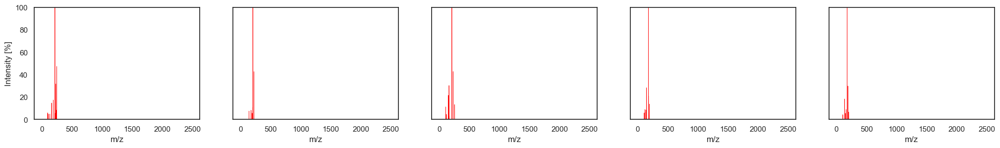

Matching spectra using per_diff


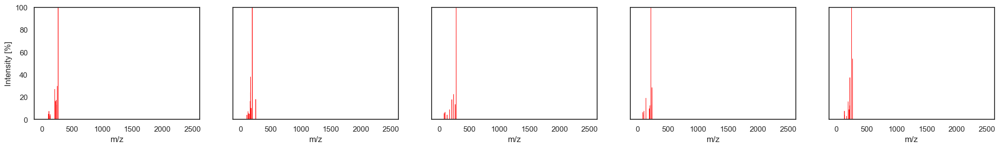

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.997687
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.997103
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.997060
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.997048
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.996890


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.068022
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.076119
78867,ALZOLUNSQWINIR-UHFFFAOYSA-N,140.0492:3.723832 141.0569:7.426719 142.0595:0.761743 149.0151:3.648871 151.0117:1.124425 176.0261:8.203896 177.0294:0.814657 178.0234:2.033887 194.0365:5.603387 196.0342:1.843176 204.0212:100.000...,NaN,1,0.076683
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.076842
43251,XYUFCXJZFZPEJD-XMSQKQJNSA-N,109.0294:11.205205 111.0065:2.968969 118.0268:2.417417 119.0135:2.518519 120.0417:4.607608 134.0589:1.230230 135.0055:1.054054 136.8835:1.216216 136.9842:1.328328 153.0173:21.549550 160.0625:3.058...,40.0,0,0.078861


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
15657,HKQYGTCOTHHOMP-UHFFFAOYSA-N,107.0493:4.717983 118.0413:7.338164 136.0155:4.470853 137.0234:2.765799 197.0599:2.489032 213.0911:26.918697 226.0625:16.261435 237.0545:17.222767 253.0496:13.035448 254.0575:29.713549 269.081:100...,55.0,1,0.139504
62882,HAWJXYBZNNRMNO-UHFFFAOYSA-N,69.303230:0.000000 69.303360:0.000000 69.303497:0.000000 70.049355:0.000000 70.049492:0.000000 70.049637:0.000000 70.050186:0.059872 70.050735:0.000000 70.050873:0.000000 70.051010:0.000000 70.994...,NaN,1,0.144930
13539,CCNKTMMNRPJQHV-SFHVURJKSA-N,50.187531:0.045266 50.476032:0.060654 50.757403:0.045849 51.497105:0.047259 51.846498:0.042832 52.363183:0.039558 52.529974:0.034153 53.549824:0.030416 53.937110:0.032711 54.444298:0.037351 54.450...,45.0,0,0.156858
105128,IGLUNMMNDNWZOA-UHFFFAOYSA-N,65.00651:0.800000 93.03191:0.900000 94.00827:0.600000 107.01261:3.900000 108.01898:5.300000 109.0237:0.800000 109.03072:1.600000 119.01191:1.000000 121.02993:2.000000 132.05954:0.500000 135.00624:...,50.0,0,0.160526
15627,HKQYGTCOTHHOMP-UHFFFAOYSA-N,91.00823:0.034583 91.01492:0.137509 98.96609:0.069166 104.02339:0.747651 121.01281:0.029643 131.62326:0.103749 132.01967:7.464985 132.3876:0.103749 132.60408:0.069166 135.00844:3.976220 152.07845:...,35.0,0,0.160641


Intermediate spectrum


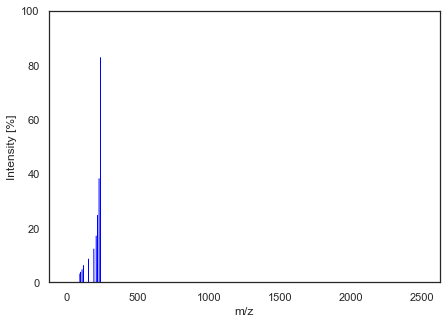

Matching spectra using cos_sim


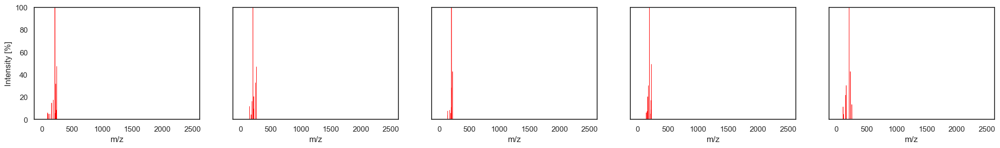

Matching spectra using eu_dist


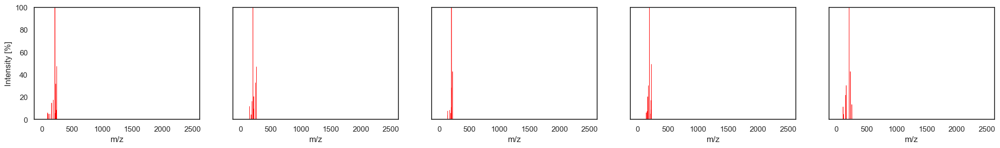

Matching spectra using per_diff


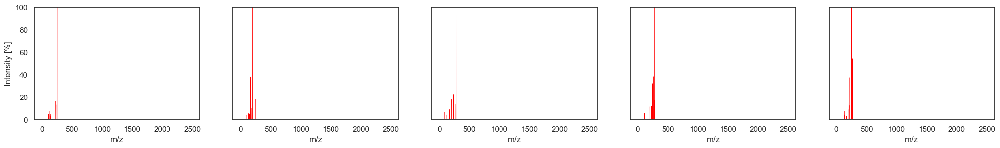

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.997387
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.997358
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.997307
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.997071
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.996680


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.072294
15136,DFMAXQKDIGCMTL-UHFFFAOYSA-N,77.001358:0.328267 77.036842:0.632270 81.033821:0.325412 89.032349:0.194105 95.012054:5.903090 96.013969:0.255477 100.105522:0.462428 103.053902:0.238350 103.995522:0.422465 105.033531:4.731321 10...,NaN,1,0.072686
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.073387
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.076539
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.081489


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
31976,LKPQNZRGGNOPPU-UHFFFAOYSA-N,70.136909:0.023984 70.162071:0.036228 70.226402:0.017695 71.177925:0.017443 72.031250:0.020881 72.446701:0.017862 72.982506:0.021217 74.322319:0.017611 75.019745:0.023817 75.320091:0.025829 75.920...,NaN,1,0.140939
105128,IGLUNMMNDNWZOA-UHFFFAOYSA-N,65.00651:0.800000 93.03191:0.900000 94.00827:0.600000 107.01261:3.900000 108.01898:5.300000 109.0237:0.800000 109.03072:1.600000 119.01191:1.000000 121.02993:2.000000 132.05954:0.500000 135.00624:...,50.0,0,0.143484
15657,HKQYGTCOTHHOMP-UHFFFAOYSA-N,107.0493:4.717983 118.0413:7.338164 136.0155:4.470853 137.0234:2.765799 197.0599:2.489032 213.0911:26.918697 226.0625:16.261435 237.0545:17.222767 253.0496:13.035448 254.0575:29.713549 269.081:100...,55.0,1,0.146123
62882,HAWJXYBZNNRMNO-UHFFFAOYSA-N,69.303230:0.000000 69.303360:0.000000 69.303497:0.000000 70.049355:0.000000 70.049492:0.000000 70.049637:0.000000 70.050186:0.059872 70.050735:0.000000 70.050873:0.000000 70.051010:0.000000 70.994...,NaN,1,0.151313
61295,ADIMAYPTOBDMTL-UHFFFAOYSA-N,128.0249:7.683477 129.029:0.664207 130.0226:1.812218 138.0093:0.910209 143.0834:0.803608 153.0202:5.289053 154.0249:0.697007 155.0165:2.082821 155.0843:2.337023 156.0207:0.943009 163.003:4.805248 ...,30.0,1,0.153384


Intermediate spectrum


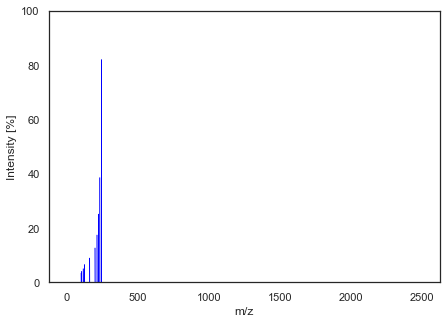

Matching spectra using cos_sim


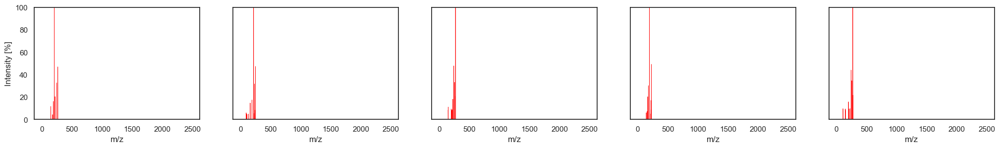

Matching spectra using eu_dist


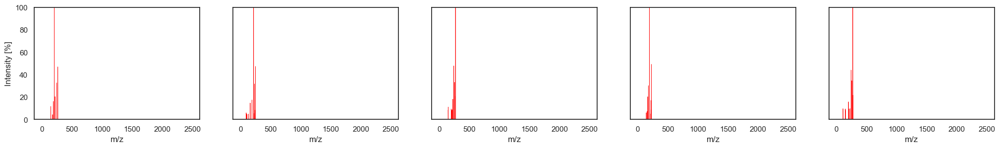

Matching spectra using per_diff


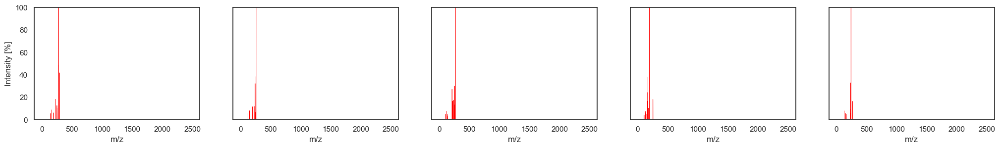

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.997749
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.997417
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.996958
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.996895
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.996813


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.067104
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.071878
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.078006
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.078808
21576,JRJBWKJICGFLDP-UHFFFAOYSA-N,94.91:1.722621 97.92:3.725696 139.98:5.998842 149.96:2.279635 156.01:7.253391 163.96:20.263354 176.97:30.167501 190.04:2.877590 192.06:6.200234 193.98:100.000000 214.1:5.025994 217.66:8.474878 220...,35.0,1,0.079837


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
31976,LKPQNZRGGNOPPU-UHFFFAOYSA-N,70.136909:0.023984 70.162071:0.036228 70.226402:0.017695 71.177925:0.017443 72.031250:0.020881 72.446701:0.017862 72.982506:0.021217 74.322319:0.017611 75.019745:0.023817 75.320091:0.025829 75.920...,NaN,1,0.134640
105128,IGLUNMMNDNWZOA-UHFFFAOYSA-N,65.00651:0.800000 93.03191:0.900000 94.00827:0.600000 107.01261:3.900000 108.01898:5.300000 109.0237:0.800000 109.03072:1.600000 119.01191:1.000000 121.02993:2.000000 132.05954:0.500000 135.00624:...,50.0,0,0.137650
61295,ADIMAYPTOBDMTL-UHFFFAOYSA-N,128.0249:7.683477 129.029:0.664207 130.0226:1.812218 138.0093:0.910209 143.0834:0.803608 153.0202:5.289053 154.0249:0.697007 155.0165:2.082821 155.0843:2.337023 156.0207:0.943009 163.003:4.805248 ...,30.0,1,0.146122
78040,IRCMYGHHKLLGHV-UHFFFAOYSA-N,121.0641:29.419322 122.0683:3.340185 149.0945:4.419322 161.0592:6.423433 163.0745:7.631038 179.0692:4.342240 241.0526:15.698869 242.0545:2.389517 259.0632:100.000000 260.0669:14.414183 261.0599:3....,10.0,1,0.152068
6017,UZOHDKGTYVTYDZ-UHFFFAOYSA-N,101.039658:0.026108 102.046913:0.007015 103.036240:0.041556 104.029930:0.006726 105.034409:1.640915 105.353340:0.003942 105.429962:0.003085 106.038727:0.161759 106.127686:0.004857 107.031601:0.040...,NaN,0,0.153123


Intermediate spectrum


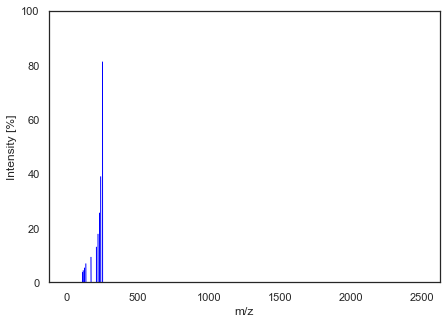

Matching spectra using cos_sim


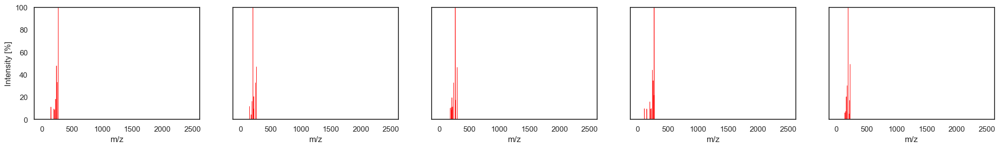

Matching spectra using eu_dist


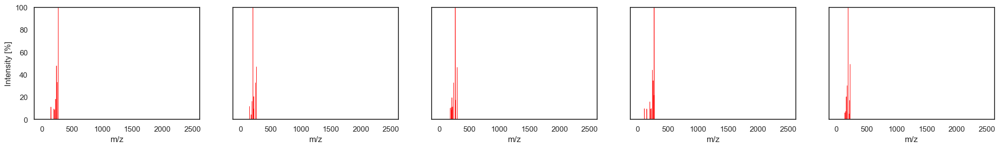

Matching spectra using per_diff


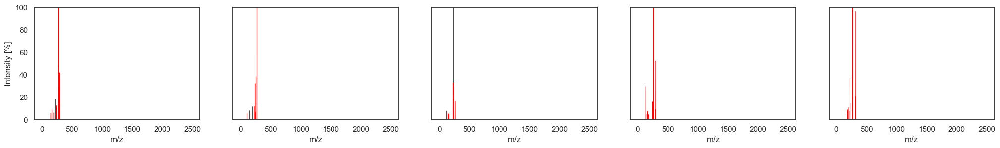

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.997859
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.997199
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.997192
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.996799
25392,AEKPZNDJHWFONI-UHFFFAOYSA-N,114.5960:1.041041 118.2061:4.531532 129.1861:7.291291 162.0321:2.789790 189.0152:15.612613 203.0136:2.783784 203.0460:3.524525 204.0375:2.904905 204.8406:2.081081 205.0092:13.348348 209.1772:5.940...,20.0,0,0.996532


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
104353,OVSQVDMCBVZWGM-UHFFFAOYSA-N,65.00397:2.500000 83.00962:0.500000 91.01865:0.700000 101.03674:0.600000 107.01121:6.100000 107.01949:0.500000 108.01834:7.000000 108.99536:1.100000 109.02735:2.000000 110.02565:0.900000 119.00954...,50.0,0,0.065447
58851,PPTYJKAXVCCBDU-UHFFFAOYSA-N,117.0579:0.630141 118.064:3.102602 119.0722:4.531242 123.0233:1.197749 131.0611:0.610900 132.0438:0.553177 134.0389:1.115975 143.0589:2.236760 144.0668:0.894704 145.0517:1.087113 145.0737:1.173698...,40.0,1,0.074850
14813,MXEZBPCVRNMVLQ-UHFFFAOYSA-N,58.047100:0.387755 110.057899:0.367347 149.059799:11.632653 160.088898:0.510204 166.083496:0.346939 167.088104:0.510204 175.074997:0.387755 176.084000:0.448980 177.054703:4.285714 177.090805:1.102...,NaN,1,0.074945
104361,OVSQVDMCBVZWGM-UHFFFAOYSA-N,63.02293:0.600000 74.82848:0.600000 83.01075:1.300000 83.01705:1.400000 91.01513:0.900000 91.05002:0.600000 93.03633:0.700000 96.02159:1.100000 97.64209:2.500000 107.01263:5.900000 108.01969:9.600...,50.0,0,0.080012
25392,AEKPZNDJHWFONI-UHFFFAOYSA-N,114.5960:1.041041 118.2061:4.531532 129.1861:7.291291 162.0321:2.789790 189.0152:15.612613 203.0136:2.783784 203.0460:3.524525 204.0375:2.904905 204.8406:2.081081 205.0092:13.348348 209.1772:5.940...,20.0,0,0.083278


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
61295,ADIMAYPTOBDMTL-UHFFFAOYSA-N,128.0249:7.683477 129.029:0.664207 130.0226:1.812218 138.0093:0.910209 143.0834:0.803608 153.0202:5.289053 154.0249:0.697007 155.0165:2.082821 155.0843:2.337023 156.0207:0.943009 163.003:4.805248 ...,30.0,1,0.142588
114608,DVGGLGXQSFURLP-XCVCLJGOSA-N,91.01636:1.500000 107.01196:1.800000 109.03142:0.600000 117.02766:0.700000 119.04737:2.900000 120.01637:0.800000 122.70726:0.500000 132.01799:0.600000 135.00487:1.300000 135.01108:1.900000 143.044...,50.0,0,0.143364
62042,RMMXLENWKUUMAY-UHFFFAOYSA-N,79.0544:0.331322 92.0495:0.237552 104.0494:0.147971 105.0336:0.276925 106.0652:2.209143 107.073:0.161934 115.0541:0.260431 119.0605:0.253527 120.0685:0.124805 128.0624:0.246194 129.0701:0.268143 1...,75.0,1,0.145029
105128,IGLUNMMNDNWZOA-UHFFFAOYSA-N,65.00651:0.800000 93.03191:0.900000 94.00827:0.600000 107.01261:3.900000 108.01898:5.300000 109.0237:0.800000 109.03072:1.600000 119.01191:1.000000 121.02993:2.000000 132.05954:0.500000 135.00624:...,50.0,0,0.147247
31976,LKPQNZRGGNOPPU-UHFFFAOYSA-N,70.136909:0.023984 70.162071:0.036228 70.226402:0.017695 71.177925:0.017443 72.031250:0.020881 72.446701:0.017862 72.982506:0.021217 74.322319:0.017611 75.019745:0.023817 75.320091:0.025829 75.920...,NaN,1,0.148512


Intermediate spectrum


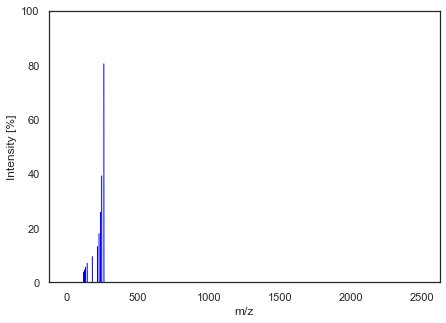

Matching spectra using cos_sim


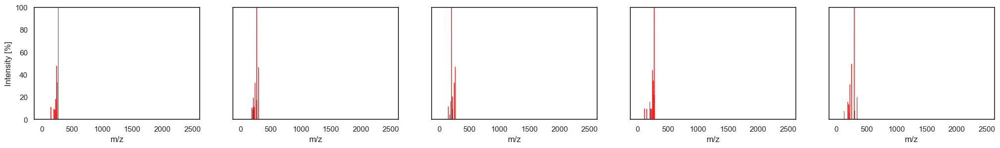

Matching spectra using eu_dist


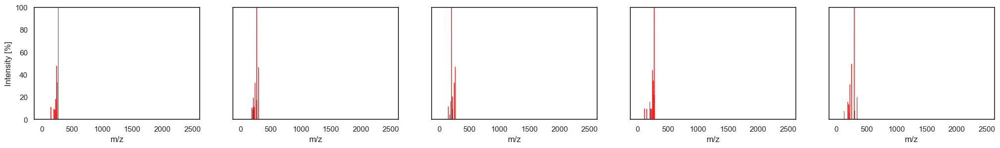

Matching spectra using per_diff


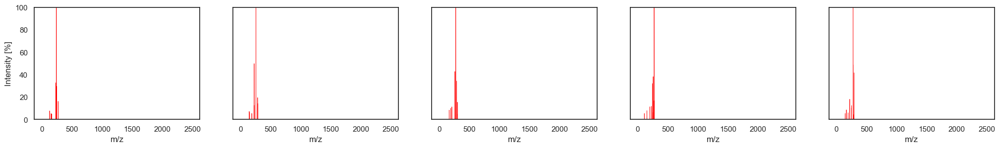

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
40978,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.140540:0.196492 50.344913:0.200675 50.504862:0.249092 50.524120:0.202320 51.552894:0.229320 53.016415:0.246749 53.862232:0.214472 54.716754:0.218197 55.917334:0.252688 56.060628:0.214087 56.382...,65.0,0,0.998548
32077,SMOFGXHPWCTYQD-UHFFFAOYSA-N,104.0242:2.734735 108.0205:6.341341 109.0341:2.182182 111.6238:1.292292 120.0183:4.803804 121.0353:3.532533 124.0174:3.374374 125.0159:1.515516 127.0508:1.300300 129.0309:3.579580 131.5977:1.45845...,40.0,0,0.998523
46372,GRBXNADBNJGZRK-GJEDHNSHSA-N,50.719858:0.029787 50.990899:0.033445 51.003247:0.028540 51.132797:0.032525 51.159261:0.033313 52.779581:0.035117 53.188798:0.034254 53.759530:0.038734 55.054570:0.625530 55.697830:0.025503 56.243...,35.0,1,0.998195
44195,PCMORTLOPMLEFB-ONEGZZNKSA-N,50.093157:0.027816 50.299033:0.036039 50.992415:0.032830 52.649524:0.029829 53.039332:0.074486 53.495005:0.030228 54.047510:0.023692 54.242004:0.023744 54.265594:0.035684 55.018526:0.623764 55.054...,35.0,1,0.998169
98752,JLJAVUZBHSLLJL-UHFFFAOYSA-N,70.888016:0.302202 73.727791:0.235247 78.722359:0.322108 79.018044:0.389063 80.061905:0.347442 81.035179:0.302202 83.662201:0.361919 86.902985:0.336585 90.046753:0.340204 90.582344:0.544688 91.056...,NaN,1,0.998138


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
40978,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.140540:0.196492 50.344913:0.200675 50.504862:0.249092 50.524120:0.202320 51.552894:0.229320 53.016415:0.246749 53.862232:0.214472 54.716754:0.218197 55.917334:0.252688 56.060628:0.214087 56.382...,65.0,0,0.053898
32077,SMOFGXHPWCTYQD-UHFFFAOYSA-N,104.0242:2.734735 108.0205:6.341341 109.0341:2.182182 111.6238:1.292292 120.0183:4.803804 121.0353:3.532533 124.0174:3.374374 125.0159:1.515516 127.0508:1.300300 129.0309:3.579580 131.5977:1.45845...,40.0,0,0.054345
46372,GRBXNADBNJGZRK-GJEDHNSHSA-N,50.719858:0.029787 50.990899:0.033445 51.003247:0.028540 51.132797:0.032525 51.159261:0.033313 52.779581:0.035117 53.188798:0.034254 53.759530:0.038734 55.054570:0.625530 55.697830:0.025503 56.243...,35.0,1,0.060083
44195,PCMORTLOPMLEFB-ONEGZZNKSA-N,50.093157:0.027816 50.299033:0.036039 50.992415:0.032830 52.649524:0.029829 53.039332:0.074486 53.495005:0.030228 54.047510:0.023692 54.242004:0.023744 54.265594:0.035684 55.018526:0.623764 55.054...,35.0,1,0.060512
98752,JLJAVUZBHSLLJL-UHFFFAOYSA-N,70.888016:0.302202 73.727791:0.235247 78.722359:0.322108 79.018044:0.389063 80.061905:0.347442 81.035179:0.302202 83.662201:0.361919 86.902985:0.336585 90.046753:0.340204 90.582344:0.544688 91.056...,NaN,1,0.061035


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
831,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.023508:2.385758 50.257153:2.614320 50.298912:2.244097 50.375956:2.202806 50.388155:2.398878 50.415351:2.438655 50.553776:2.363825 50.611935:2.117976 50.754191:2.507020 50.815528:2.701222 50.843...,45.0,0,0.079250
60141,PYZRQGJRPPTADH-UHFFFAOYSA-N,122.9997:2.448560 138.0108:1.912079 150.0104:3.355718 151.0184:7.615883 156.9607:1.663839 158.9763:19.798025 165.0214:18.989471 166.0293:31.622669 171.9715:10.075752 173.9872:15.440097 179.0246:3....,35.0,1,0.079491
9633,RHMXXJGYXNZAPX-UHFFFAOYSA-N,99.926834:0.785893 101.044418:0.523929 105.032784:4.165234 106.039589:2.279090 107.052147:0.733500 115.052513:0.890679 117.034851:1.545590 122.127037:0.471536 127.053589:0.890679 130.043503:0.6287...,NaN,0,0.083203
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.083945
21535,GRQAKVFPDMDUIF-UHFFFAOYSA-N,105.0720:5.237237 107.0831:2.592593 109.0617:3.620621 111.0822:1.416416 117.0660:1.658659 119.0849:2.575576 121.0673:2.244244 123.0464:12.150150 123.1114:1.659660 128.0622:2.010010 129.0687:1.7217...,20.0,1,0.084423


Intermediate spectrum


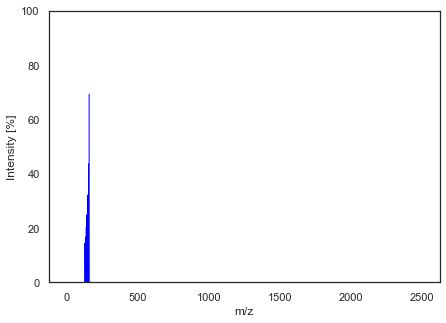

Matching spectra using cos_sim


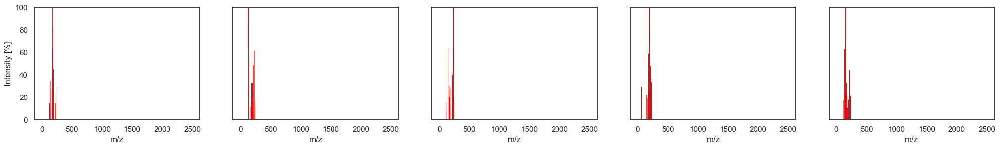

Matching spectra using eu_dist


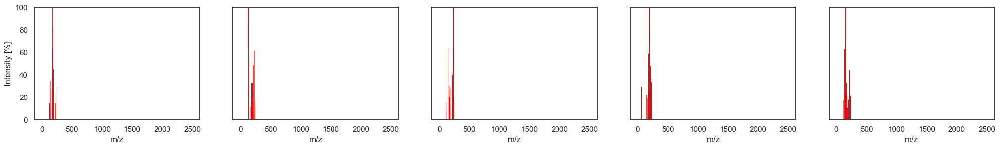

Matching spectra using per_diff


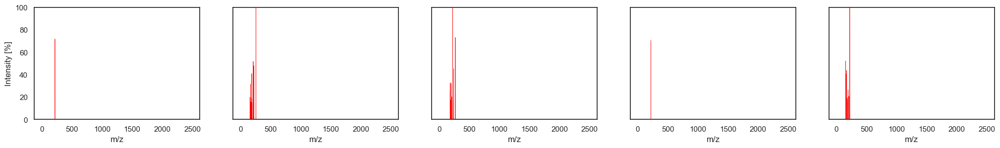

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.998284
32077,SMOFGXHPWCTYQD-UHFFFAOYSA-N,104.0242:2.734735 108.0205:6.341341 109.0341:2.182182 111.6238:1.292292 120.0183:4.803804 121.0353:3.532533 124.0174:3.374374 125.0159:1.515516 127.0508:1.300300 129.0309:3.579580 131.5977:1.45845...,40.0,0,0.998259
40978,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.140540:0.196492 50.344913:0.200675 50.504862:0.249092 50.524120:0.202320 51.552894:0.229320 53.016415:0.246749 53.862232:0.214472 54.716754:0.218197 55.917334:0.252688 56.060628:0.214087 56.382...,65.0,0,0.998209
44195,PCMORTLOPMLEFB-ONEGZZNKSA-N,50.093157:0.027816 50.299033:0.036039 50.992415:0.032830 52.649524:0.029829 53.039332:0.074486 53.495005:0.030228 54.047510:0.023692 54.242004:0.023744 54.265594:0.035684 55.018526:0.623764 55.054...,35.0,1,0.998125
46372,GRBXNADBNJGZRK-GJEDHNSHSA-N,50.719858:0.029787 50.990899:0.033445 51.003247:0.028540 51.132797:0.032525 51.159261:0.033313 52.779581:0.035117 53.188798:0.034254 53.759530:0.038734 55.054570:0.625530 55.697830:0.025503 56.243...,35.0,1,0.998100


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.058591
32077,SMOFGXHPWCTYQD-UHFFFAOYSA-N,104.0242:2.734735 108.0205:6.341341 109.0341:2.182182 111.6238:1.292292 120.0183:4.803804 121.0353:3.532533 124.0174:3.374374 125.0159:1.515516 127.0508:1.300300 129.0309:3.579580 131.5977:1.45845...,40.0,0,0.059008
40978,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.140540:0.196492 50.344913:0.200675 50.504862:0.249092 50.524120:0.202320 51.552894:0.229320 53.016415:0.246749 53.862232:0.214472 54.716754:0.218197 55.917334:0.252688 56.060628:0.214087 56.382...,65.0,0,0.059853
44195,PCMORTLOPMLEFB-ONEGZZNKSA-N,50.093157:0.027816 50.299033:0.036039 50.992415:0.032830 52.649524:0.029829 53.039332:0.074486 53.495005:0.030228 54.047510:0.023692 54.242004:0.023744 54.265594:0.035684 55.018526:0.623764 55.054...,35.0,1,0.061239
46372,GRBXNADBNJGZRK-GJEDHNSHSA-N,50.719858:0.029787 50.990899:0.033445 51.003247:0.028540 51.132797:0.032525 51.159261:0.033313 52.779581:0.035117 53.188798:0.034254 53.759530:0.038734 55.054570:0.625530 55.697830:0.025503 56.243...,35.0,1,0.061651


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.069879
831,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.023508:2.385758 50.257153:2.614320 50.298912:2.244097 50.375956:2.202806 50.388155:2.398878 50.415351:2.438655 50.553776:2.363825 50.611935:2.117976 50.754191:2.507020 50.815528:2.701222 50.843...,45.0,0,0.071710
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.075437
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.075868
842,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.055225:3.025684 50.158038:3.048553 50.195020:3.331104 50.197364:3.030758 50.247653:3.336000 50.272720:3.353356 50.284309:3.737428 50.349376:3.564472 50.489631:3.593662 50.496471:4.599560 50.503...,35.0,1,0.079851


Intermediate spectrum


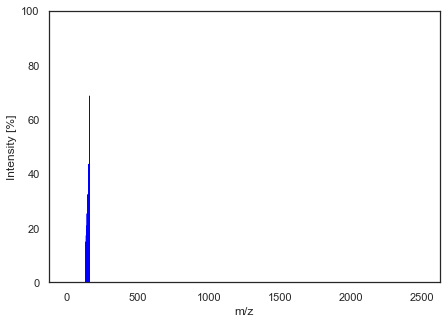

Matching spectra using cos_sim


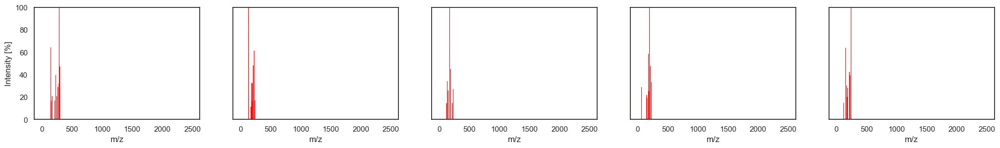

Matching spectra using eu_dist


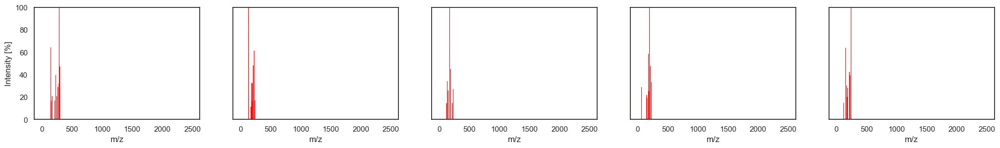

Matching spectra using per_diff


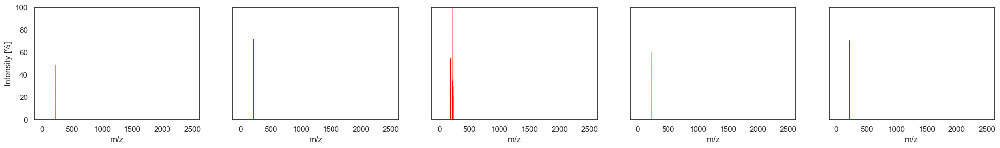

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.998483
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.998374
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998324
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998290
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.998259


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.055077
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.057027
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.057905
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.058489
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.059002


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.061114
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.069969
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.070068
831,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.023508:2.385758 50.257153:2.614320 50.298912:2.244097 50.375956:2.202806 50.388155:2.398878 50.415351:2.438655 50.553776:2.363825 50.611935:2.117976 50.754191:2.507020 50.815528:2.701222 50.843...,45.0,0,0.074524
9633,RHMXXJGYXNZAPX-UHFFFAOYSA-N,99.926834:0.785893 101.044418:0.523929 105.032784:4.165234 106.039589:2.279090 107.052147:0.733500 115.052513:0.890679 117.034851:1.545590 122.127037:0.471536 127.053589:0.890679 130.043503:0.6287...,NaN,0,0.078935


Intermediate spectrum


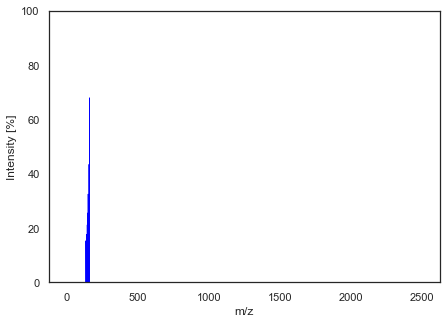

Matching spectra using cos_sim


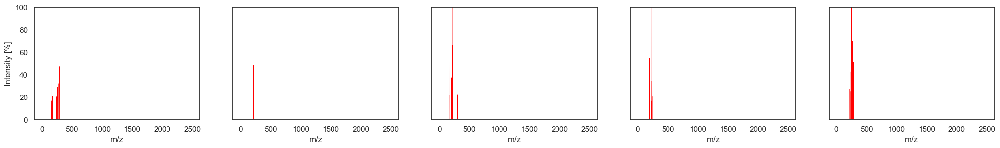

Matching spectra using eu_dist


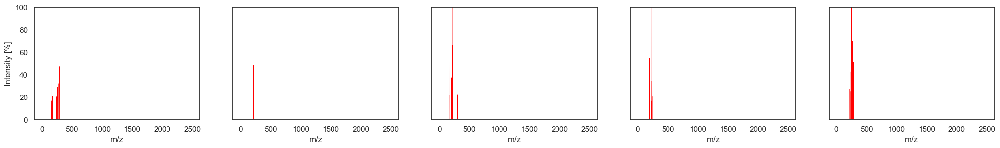

Matching spectra using per_diff


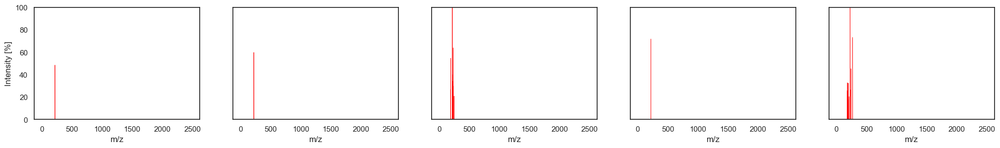

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.998681
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998630
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998599
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.998591
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.998536


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.051365
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.052341
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.052926
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.053085
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.054120


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.053077
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.068343
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.068432
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.068470
832,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.137064:3.259354 50.206702:3.648025 50.364076:3.459316 50.401366:3.931560 50.659396:4.277983 50.743787:3.969491 50.786763:3.244447 50.796894:3.400451 50.886424:3.365056 50.913883:3.200533 50.994...,65.0,0,0.079088


Intermediate spectrum


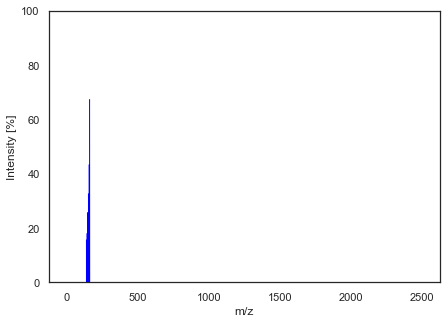

Matching spectra using cos_sim


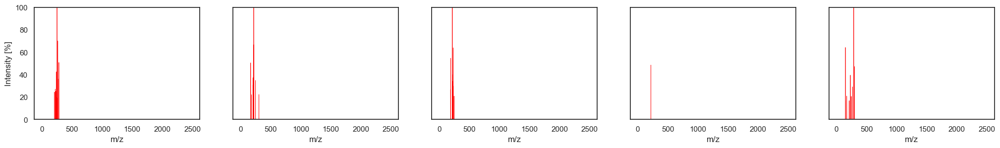

Matching spectra using eu_dist


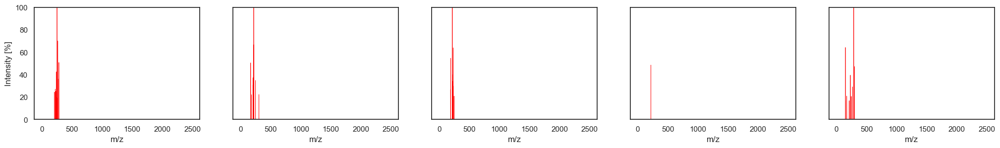

Matching spectra using per_diff


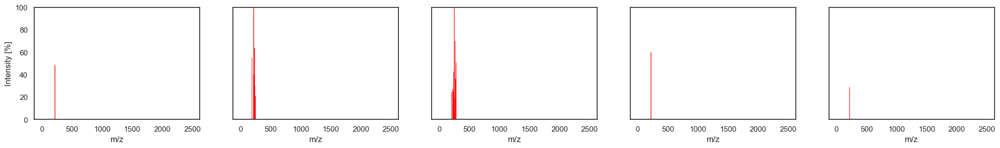

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.998993
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998813
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998807
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.998672
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.998490


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.044870
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.048729
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.048848
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.051527
46654,MIRFNZKXFFLSRY-UHFFFAOYSA-N,50.348831:0.007277 50.378040:0.006425 50.441429:0.004879 50.452171:0.008444 50.725709:0.005999 50.769998:0.009713 50.778937:0.007886 50.782829:0.006910 51.020314:0.009537 51.238413:0.005886 51.266...,35.0,1,0.054960


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.050821
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.062042
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.068197
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.072246
832,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.137064:3.259354 50.206702:3.648025 50.364076:3.459316 50.401366:3.931560 50.659396:4.277983 50.743787:3.969491 50.786763:3.244447 50.796894:3.400451 50.886424:3.365056 50.913883:3.200533 50.994...,65.0,0,0.079402


Intermediate spectrum


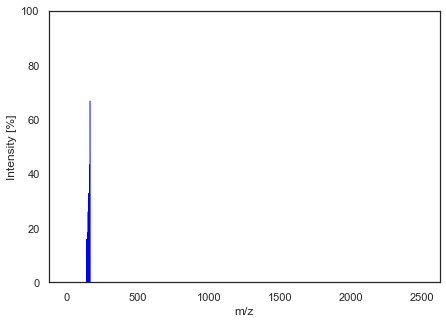

Matching spectra using cos_sim


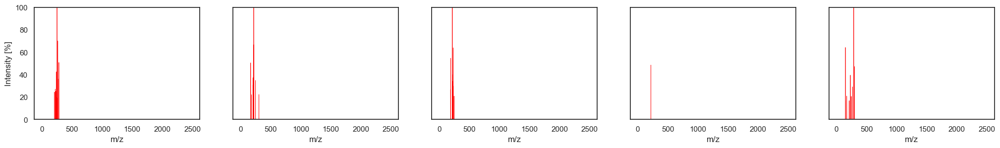

Matching spectra using eu_dist


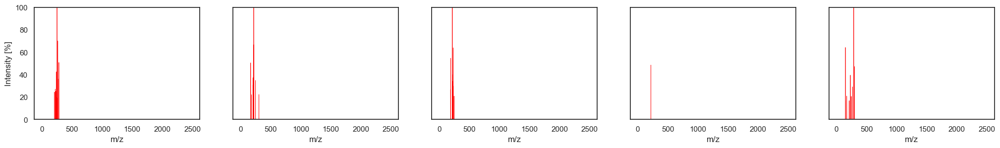

Matching spectra using per_diff


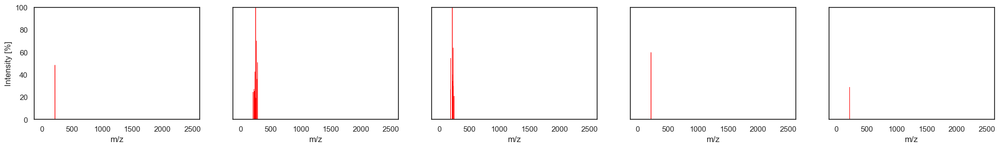

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999238
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998929
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998897
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.998639
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.998611


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.039040
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.046290
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.046961
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.052173
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.052700


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.052061
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.056861
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.069394
941,JMUOPRSXUVOHFE-SYAFJHLCSA-N,50.228707:3.970664 50.316097:4.527632 50.391506:3.863283 50.533345:4.317780 50.734255:4.429063 50.870482:3.936029 50.907660:4.462899 51.106850:4.095277 51.253456:4.017383 51.279679:3.875344 51.303...,65.0,1,0.077774
95014,ZRJBHWIHUMBLCN-HNWKQCISSA-N,79.06041:4.500000 92.05795:2.400000 106.05768:2.000000 108.08283:2.600000 110.05367:2.800000 110.05738:7.100000 110.76749:1.900000 115.05772:3.800000 115.11093:2.300000 116.06119:2.700000 117.0733...,30.0,1,0.079559


Intermediate spectrum


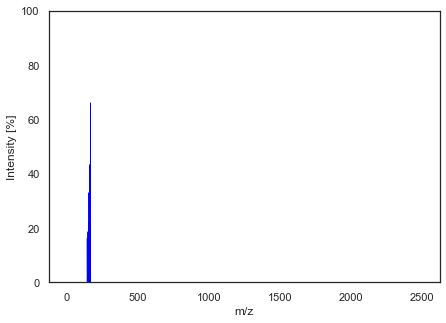

Matching spectra using cos_sim


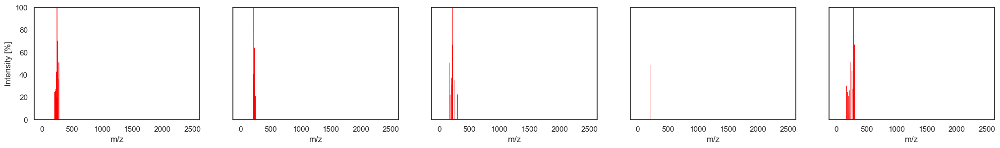

Matching spectra using eu_dist


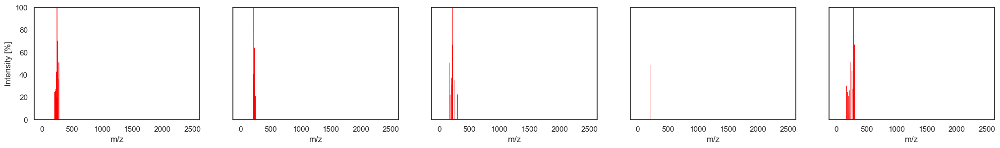

Matching spectra using per_diff


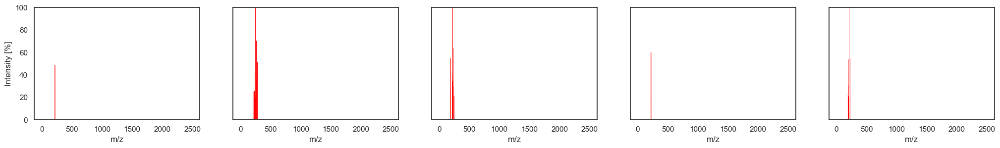

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999378
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998943
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998887
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.998648
118474,BRUQQQPBMZOVGD-UHFFFAOYSA-N,55.0181:1.059770 70.0678:1.610600 77.0401:1.308690 79.0546:1.518180 80.051:1.212570 82.0648:1.162660 91.055:5.055450 93.0624:1.243380 94.0667:5.780650 102.0477:2.147870 103.0564:5.807150 104.0625:...,50.0,1,0.998533


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.035288
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.045974
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.047186
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.052009
118474,BRUQQQPBMZOVGD-UHFFFAOYSA-N,55.0181:1.059770 70.0678:1.610600 77.0401:1.308690 79.0546:1.518180 80.051:1.212570 82.0648:1.162660 91.055:5.055450 93.0624:1.243380 94.0667:5.780650 102.0477:2.147870 103.0564:5.807150 104.0625:...,50.0,1,0.054173


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.053006
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.058167
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.072270
95010,ZRJBHWIHUMBLCN-HNWKQCISSA-N,79.05342:2.000000 80.05215:1.900000 92.04964:5.900000 103.059:2.200000 107.08871:3.400000 109.05976:3.600000 110.05888:3.400000 115.05264:2.400000 116.03826:2.600000 119.07751:2.600000 120.08239:1...,30.0,1,0.080263
27779,WRFQRUBJBPLPAM-UHFFFAOYSA-N,94.632523:0.000000 94.638710:0.059757 94.644897:0.082166 94.651093:0.052288 94.657280:0.000000 94.663475:0.000000 94.669662:0.000000 94.675850:0.000000 94.682045:0.000000 94.688232:0.000000 94.694...,NaN,1,0.080710


Intermediate spectrum


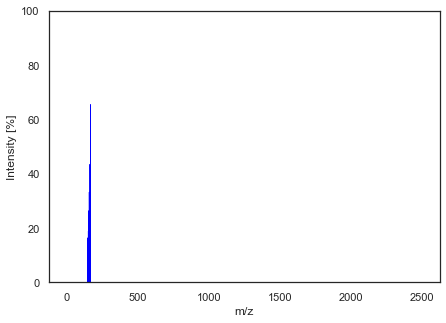

Matching spectra using cos_sim


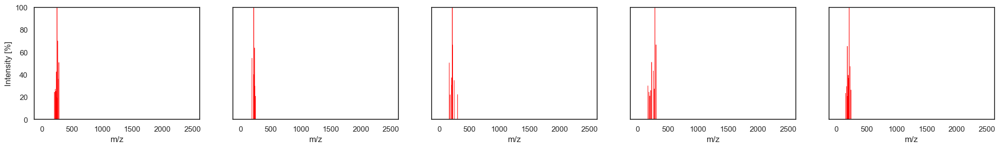

Matching spectra using eu_dist


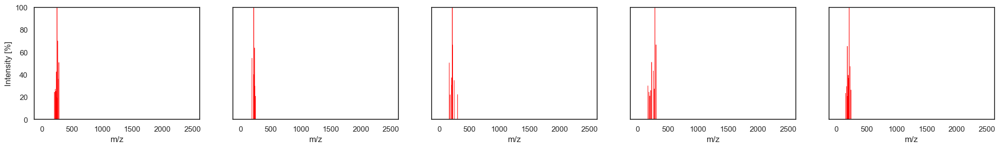

Matching spectra using per_diff


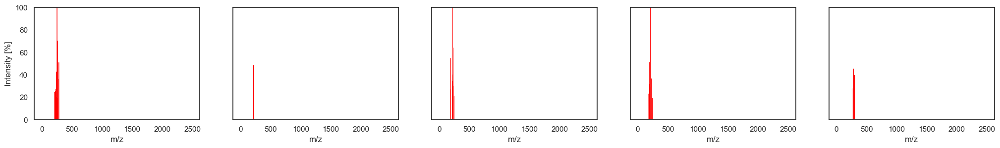

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999455
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998894
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998806
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.998709
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.998617


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.033003
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.047035
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.048870
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.050805
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.052589


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.050606
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.066623
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.075936
27779,WRFQRUBJBPLPAM-UHFFFAOYSA-N,94.632523:0.000000 94.638710:0.059757 94.644897:0.082166 94.651093:0.052288 94.657280:0.000000 94.663475:0.000000 94.669662:0.000000 94.675850:0.000000 94.682045:0.000000 94.688232:0.000000 94.694...,NaN,1,0.076559
61504,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.425156 195.1168:2.821017 197.1326:2.200943 199.1117:3.980421 209.132:4.191628 221.1323:5.009768 223.1117:4.538311 223.1486:2.299705 225.1273:3.825436 227.1435:3.457755 235.1479:3.346935...,115.0,1,0.082275


Intermediate spectrum


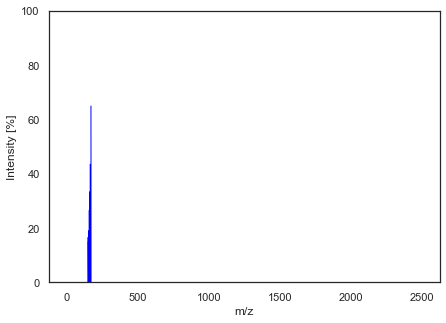

Matching spectra using cos_sim


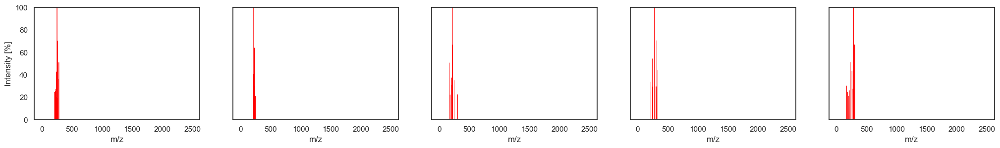

Matching spectra using eu_dist


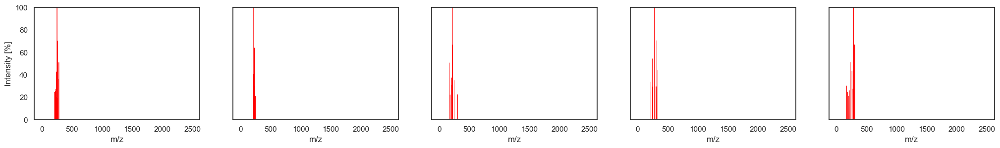

Matching spectra using per_diff


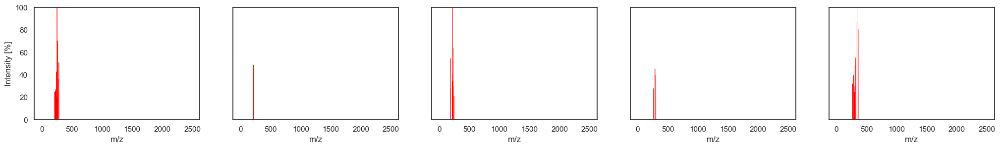

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999463
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.998856
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998780
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998659
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.998515


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.032773
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.047823
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.049407
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.051796
24891,ULPVIBVOKQAXJB-UHFFFAOYSA-N,79.143448:1.023326 80.013283:0.617005 80.124817:1.091046 85.004890:0.571859 85.026199:0.530474 85.162025:0.564334 91.057449:0.696012 93.154182:1.012039 95.050438:1.376975 96.053154:0.643341 99.042...,NaN,1,0.054501


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.050571
27779,WRFQRUBJBPLPAM-UHFFFAOYSA-N,94.632523:0.000000 94.638710:0.059757 94.644897:0.082166 94.651093:0.052288 94.657280:0.000000 94.663475:0.000000 94.669662:0.000000 94.675850:0.000000 94.682045:0.000000 94.688232:0.000000 94.694...,NaN,1,0.073895
830,OMQVQJDDMZUVNL-UHFFFAOYSA-N,50.028773:1.870039 50.038489:1.860952 50.241083:2.221195 50.280511:2.107858 50.354086:1.972640 50.355020:1.996305 50.431762:1.957313 50.463855:2.248611 50.479410:1.992818 50.776216:2.316184 50.823...,35.0,0,0.076486
61504,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.425156 195.1168:2.821017 197.1326:2.200943 199.1117:3.980421 209.132:4.191628 221.1323:5.009768 223.1117:4.538311 223.1486:2.299705 225.1273:3.825436 227.1435:3.457755 235.1479:3.346935...,115.0,1,0.076578
61506,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.946766 195.117:3.262306 197.1327:2.233616 199.1111:4.167459 209.1319:4.829855 221.1323:5.364393 223.1113:3.763801 223.1484:2.677445 225.1266:4.167675 227.1421:3.487352 235.1479:3.618881...,115.0,1,0.077555


Intermediate spectrum


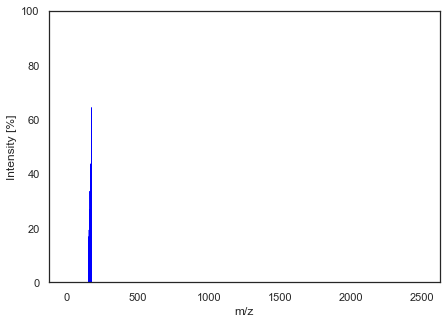

Matching spectra using cos_sim


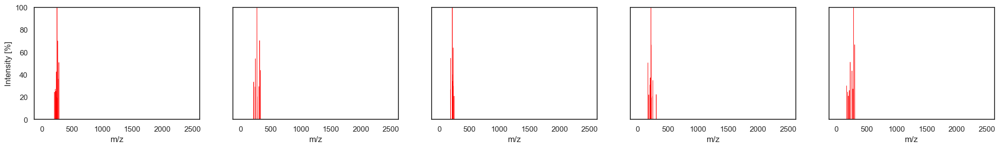

Matching spectra using eu_dist


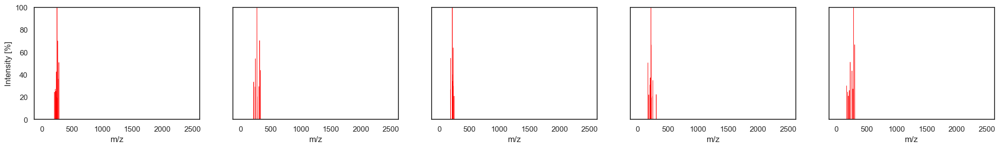

Matching spectra using per_diff


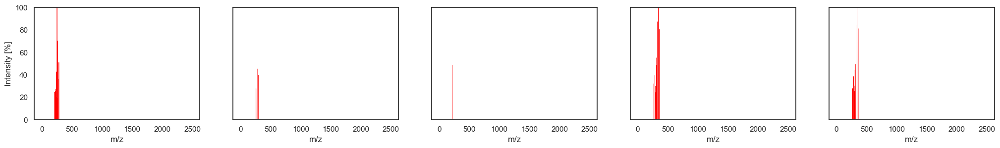

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999392
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.998934
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.998582
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.998424
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.998403


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.034875
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.046177
13322,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.187907:0.020541 50.242376:0.034360 50.481030:0.018788 50.980630:0.043596 51.635348:0.046044 51.940315:0.028025 52.026752:0.026949 52.245740:0.037453 52.247335:0.033863 52.701617:0.018908 52.791...,65.0,1,0.053250
104935,VSJKWCGYPAHWDS-UHFFFAOYSA-N,121.0455:15.500000 123.042:5.250000 141.0574:8.500000 153.0568:8.250000 168.0648:50.500000 180.0748:7.250000 181.0756:22.000000 191.073:11.750000 193.0881:18.250000 194.1004:7.500000 199.0281:9.25...,40.0,1,0.056143
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.056510


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.051803
61504,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.425156 195.1168:2.821017 197.1326:2.200943 199.1117:3.980421 209.132:4.191628 221.1323:5.009768 223.1117:4.538311 223.1486:2.299705 225.1273:3.825436 227.1435:3.457755 235.1479:3.346935...,115.0,1,0.070966
27779,WRFQRUBJBPLPAM-UHFFFAOYSA-N,94.632523:0.000000 94.638710:0.059757 94.644897:0.082166 94.651093:0.052288 94.657280:0.000000 94.663475:0.000000 94.669662:0.000000 94.675850:0.000000 94.682045:0.000000 94.688232:0.000000 94.694...,NaN,1,0.072350
61506,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.946766 195.117:3.262306 197.1327:2.233616 199.1111:4.167459 209.1319:4.829855 221.1323:5.364393 223.1113:3.763801 223.1484:2.677445 225.1266:4.167675 227.1421:3.487352 235.1479:3.618881...,115.0,1,0.073107
119727,HNMWDXUKPJZOQD-XPBDJYBLSA-N,225.0546:4.191361 239.0339:3.827732 243.0652:10.705187 245.0444:36.423127 253.0495:21.654770 255.0652:3.426560 256.0366:4.002392 257.0444:4.288179 257.0808:4.192620 259.0601:31.576215 260.0679:4.5...,35.0,1,0.077965


Intermediate spectrum


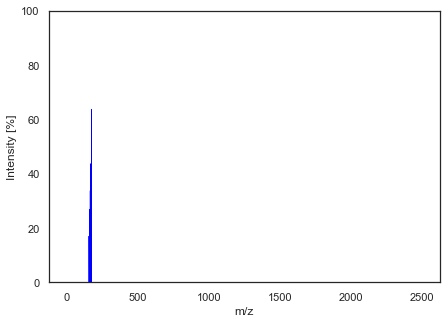

Matching spectra using cos_sim


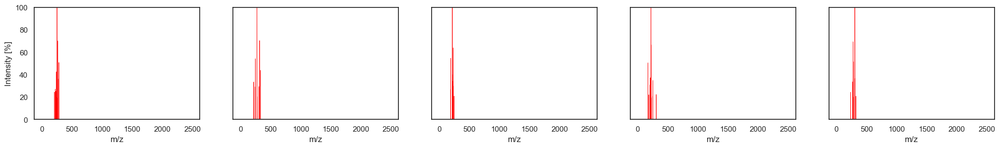

Matching spectra using eu_dist


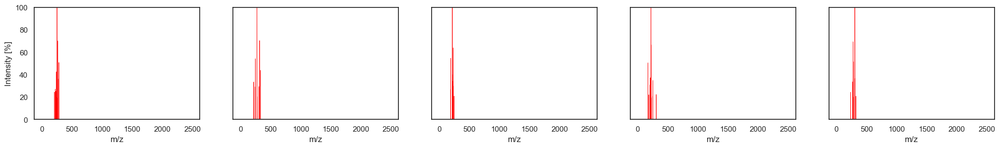

Matching spectra using per_diff


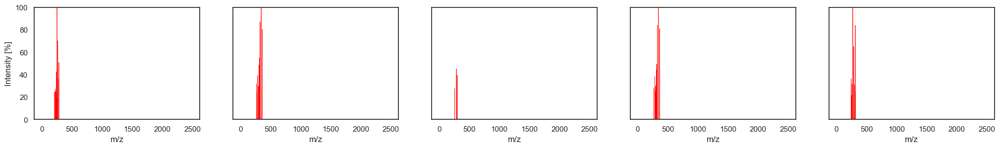

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999311
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.999004
9094,XKWWCTISHMFHJB-UHFFFAOYSA-N,50.037279:0.019005 50.135658:0.016915 50.567640:0.019391 50.962087:0.041944 50.972267:0.037764 51.320966:0.045708 51.424229:0.021603 51.707505:0.035487 51.853582:0.039038 51.988906:0.020702 52.205...,35.0,1,0.998502
118739,RRKTZKIUPZVBMF-UHFFFAOYSA-N,108.0808:9.803922 124.0736:10.588235 158.0621:8.235294 198.0496:16.862745 213.0763:43.921569 216.1008:28.627451 228.0957:11.372549 229.0736:53.333333 244.0965:100.000000 251.0895:10.588235 254.115...,40.0,1,0.998466
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.998459


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.037117
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.044627
9094,XKWWCTISHMFHJB-UHFFFAOYSA-N,50.037279:0.019005 50.135658:0.016915 50.567640:0.019391 50.962087:0.041944 50.972267:0.037764 51.320966:0.045708 51.424229:0.021603 51.707505:0.035487 51.853582:0.039038 51.988906:0.020702 52.205...,35.0,1,0.054744
118739,RRKTZKIUPZVBMF-UHFFFAOYSA-N,108.0808:9.803922 124.0736:10.588235 158.0621:8.235294 198.0496:16.862745 213.0763:43.921569 216.1008:28.627451 228.0957:11.372549 229.0736:53.333333 244.0965:100.000000 251.0895:10.588235 254.115...,40.0,1,0.055381
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.055510


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.054798
61506,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.946766 195.117:3.262306 197.1327:2.233616 199.1111:4.167459 209.1319:4.829855 221.1323:5.364393 223.1113:3.763801 223.1484:2.677445 225.1266:4.167675 227.1421:3.487352 235.1479:3.618881...,115.0,1,0.068715
61504,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.425156 195.1168:2.821017 197.1326:2.200943 199.1117:3.980421 209.132:4.191628 221.1323:5.009768 223.1117:4.538311 223.1486:2.299705 225.1273:3.825436 227.1435:3.457755 235.1479:3.346935...,115.0,1,0.071934
27779,WRFQRUBJBPLPAM-UHFFFAOYSA-N,94.632523:0.000000 94.638710:0.059757 94.644897:0.082166 94.651093:0.052288 94.657280:0.000000 94.663475:0.000000 94.669662:0.000000 94.675850:0.000000 94.682045:0.000000 94.688232:0.000000 94.694...,NaN,1,0.075227
119727,HNMWDXUKPJZOQD-XPBDJYBLSA-N,225.0546:4.191361 239.0339:3.827732 243.0652:10.705187 245.0444:36.423127 253.0495:21.654770 255.0652:3.426560 256.0366:4.002392 257.0444:4.288179 257.0808:4.192620 259.0601:31.576215 260.0679:4.5...,35.0,1,0.076498


Intermediate spectrum


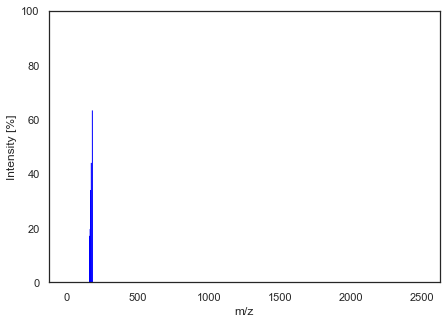

Matching spectra using cos_sim


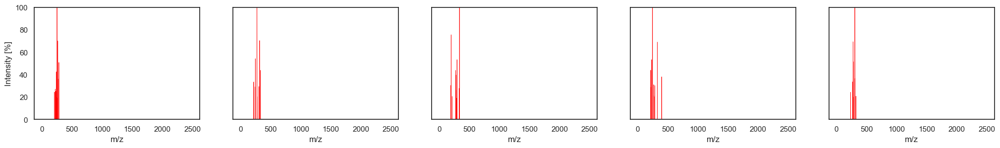

Matching spectra using eu_dist


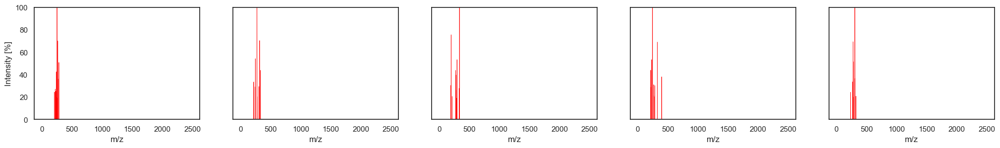

Matching spectra using per_diff


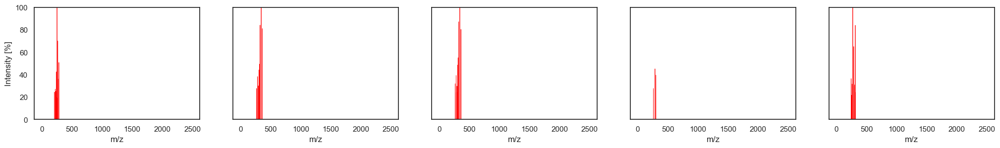

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.999164
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.998999
9094,XKWWCTISHMFHJB-UHFFFAOYSA-N,50.037279:0.019005 50.135658:0.016915 50.567640:0.019391 50.962087:0.041944 50.972267:0.037764 51.320966:0.045708 51.424229:0.021603 51.707505:0.035487 51.853582:0.039038 51.988906:0.020702 52.205...,35.0,1,0.998610
118739,RRKTZKIUPZVBMF-UHFFFAOYSA-N,108.0808:9.803922 124.0736:10.588235 158.0621:8.235294 198.0496:16.862745 213.0763:43.921569 216.1008:28.627451 228.0957:11.372549 229.0736:53.333333 244.0965:100.000000 251.0895:10.588235 254.115...,40.0,1,0.998506
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.998444


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.040893
7573,INVGWHRKADIJHF-UHFFFAOYSA-N,26.000:0.198590 34.000:0.204220 40.000:0.117050 41.000:0.117700 42.000:0.275360 47.000:0.115100 52.000:0.315200 63.000:0.146290 75.000:0.238110 76.000:0.166430 77.000:0.124410 94.000:0.140760 98.0...,40.0,1,0.044741
9094,XKWWCTISHMFHJB-UHFFFAOYSA-N,50.037279:0.019005 50.135658:0.016915 50.567640:0.019391 50.962087:0.041944 50.972267:0.037764 51.320966:0.045708 51.424229:0.021603 51.707505:0.035487 51.853582:0.039038 51.988906:0.020702 52.205...,35.0,1,0.052724
118739,RRKTZKIUPZVBMF-UHFFFAOYSA-N,108.0808:9.803922 124.0736:10.588235 158.0621:8.235294 198.0496:16.862745 213.0763:43.921569 216.1008:28.627451 228.0957:11.372549 229.0736:53.333333 244.0965:100.000000 251.0895:10.588235 254.115...,40.0,1,0.054658
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.055779


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
36115,HPLALXILNGTIHC-WJKVYVNYSA-N,50.163807:0.042822 50.351639:0.061732 50.863468:0.073463 51.415887:0.162711 51.940191:0.019919 52.969234:0.059199 52.991626:0.138650 53.538674:0.043230 53.780111:0.089877 55.018150:0.061108 55.054...,45.0,1,0.062431
61506,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.946766 195.117:3.262306 197.1327:2.233616 199.1111:4.167459 209.1319:4.829855 221.1323:5.364393 223.1113:3.763801 223.1484:2.677445 225.1266:4.167675 227.1421:3.487352 235.1479:3.618881...,115.0,1,0.070983
36444,QUCGBWQRLWOVBR-BBJJSLPGSA-N,51.288486:0.039861 51.967414:0.055145 52.860913:0.049718 53.095577:0.066839 55.018273:0.485666 55.054687:0.820126 55.216416:0.073399 55.934944:0.045836 56.001395:0.058708 56.054588:0.031168 56.437...,45.0,1,0.072648
61502,GNFTWPCIRXSCQF-UJXAPRPESA-N,161.0958:3.930359 187.1118:3.694361 213.128:3.969635 223.1119:5.199057 237.1278:9.035288 239.1439:20.115663 247.1484:9.195103 249.1278:11.530023 249.1637:4.968477 255.1387:3.417055 261.1644:5.3954...,105.0,1,0.076468
61504,GNFTWPCIRXSCQF-UJXAPRPESA-N,173.0962:2.425156 195.1168:2.821017 197.1326:2.200943 199.1117:3.980421 209.132:4.191628 221.1323:5.009768 223.1117:4.538311 223.1486:2.299705 225.1273:3.825436 227.1435:3.457755 235.1479:3.346935...,115.0,1,0.076521


Intermediate spectrum


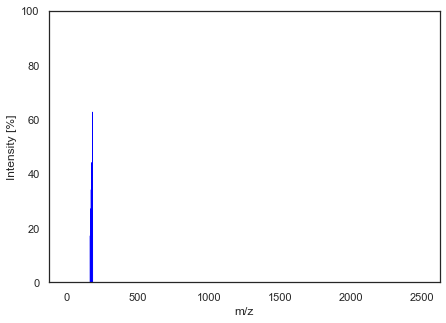

Matching spectra using cos_sim


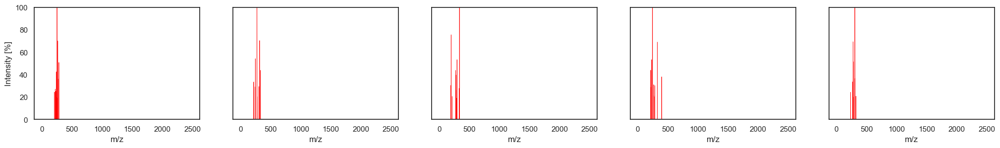

Matching spectra using eu_dist


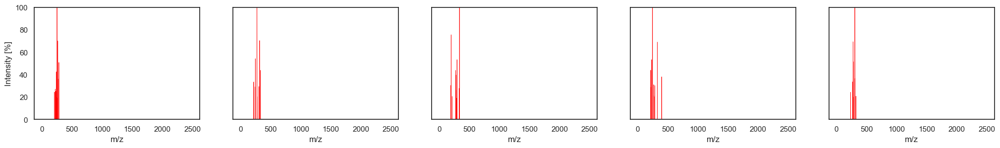

Matching spectra using per_diff


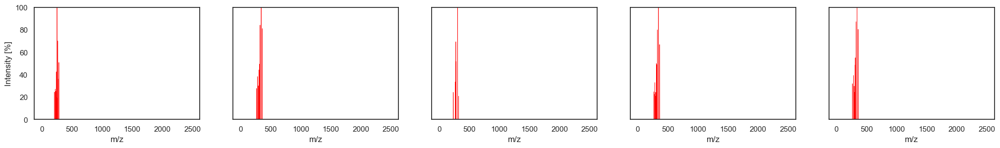

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.999006
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.998939
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.998910
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.998749
15254,TWSUSRQZTZUYSD-UHFFFAOYSA-N,91.050995:1.558939 105.068230:1.914486 120.078934:1.832437 129.067825:1.677455 141.070938:2.151518 143.045914:0.756678 145.064713:1.166925 160.049393:1.449540 167.043625:1.549822 173.056564:2.5982...,NaN,1,0.998686


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.044588
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.046063
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.046686
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.050026
15254,TWSUSRQZTZUYSD-UHFFFAOYSA-N,91.050995:1.558939 105.068230:1.914486 120.078934:1.832437 129.067825:1.677455 141.070938:2.151518 143.045914:0.756678 145.064713:1.166925 160.049393:1.449540 167.043625:1.549822 173.056564:2.5982...,NaN,1,0.051264


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.096589
37782,UTSVPXMQSFGQTM-DCXZOGHSSA-N,141.07:2.941678 169.0651:4.192435 189.0183:3.080651 197.0595:8.257269 200.0463:2.814746 225.0545:13.283040 226.0621:4.100121 228.0419:7.692848 253.0496:27.793089 254.0577:4.550821 281.0444:100.000000,90.0,1,0.110634
66308,NGBFQHCMQULJNZ-UHFFFAOYSA-N,150.9959:1.749646 155.9991:3.151936 181.0752:2.251383 183.0921:1.440885 194.0697:1.620996 195.0797:11.539946 196.086:10.806638 197.0942:1.325100 198.1021:4.206870 210.0684:2.765985 226.0447:1.9683...,30.0,0,0.112706
51113,NVKNRXOMCYTFJF-WFLOGZPDSA-N,50.003119:0.027412 50.518237:0.023876 50.566943:0.022077 50.870236:0.017970 50.975139:0.028764 51.025893:0.022246 51.866605:0.021004 52.358744:0.018463 52.972862:0.020265 53.488624:0.022378 53.527...,65.0,0,0.113118
13671,IXRKDGGGFFCRIR-UHFFFAOYSA-N,135.0437:1.327327 162.0551:1.037037 176.0611:1.476476 188.0715:5.415415 192.0659:1.277277 197.0836:2.897898 198.0616:2.250250 201.0438:1.403403 202.1121:1.300300 204.0655:13.165165 212.1058:1.6736...,20.0,1,0.113159


Intermediate spectrum


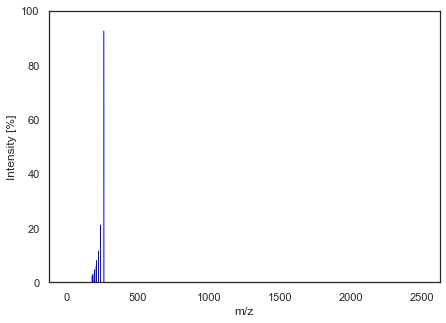

Matching spectra using cos_sim


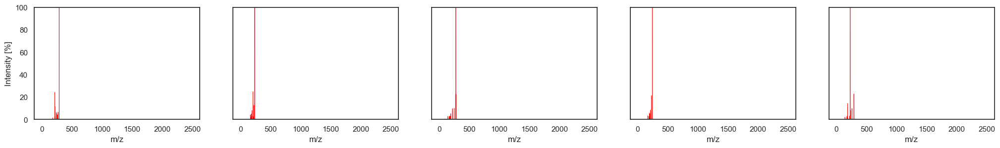

Matching spectra using eu_dist


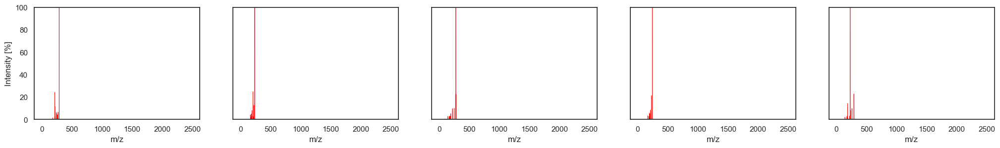

Matching spectra using per_diff


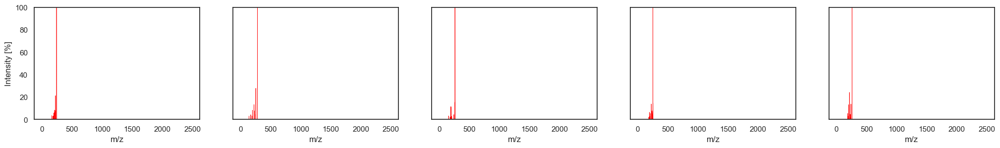

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.999025
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.998867
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.998828
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.998682
15254,TWSUSRQZTZUYSD-UHFFFAOYSA-N,91.050995:1.558939 105.068230:1.914486 120.078934:1.832437 129.067825:1.677455 141.070938:2.151518 143.045914:0.756678 145.064713:1.166925 160.049393:1.449540 167.043625:1.549822 173.056564:2.5982...,NaN,1,0.998642


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.044158
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.047604
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.048411
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.051333
15254,TWSUSRQZTZUYSD-UHFFFAOYSA-N,91.050995:1.558939 105.068230:1.914486 120.078934:1.832437 129.067825:1.677455 141.070938:2.151518 143.045914:0.756678 145.064713:1.166925 160.049393:1.449540 167.043625:1.549822 173.056564:2.5982...,NaN,1,0.052119


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.100069
37782,UTSVPXMQSFGQTM-DCXZOGHSSA-N,141.07:2.941678 169.0651:4.192435 189.0183:3.080651 197.0595:8.257269 200.0463:2.814746 225.0545:13.283040 226.0621:4.100121 228.0419:7.692848 253.0496:27.793089 254.0577:4.550821 281.0444:100.000000,90.0,1,0.111926
113369,RWKJTIHNYSIIHW-WYVZXCPWSA-N,153.013:0.502513 165.120:0.188442 170.800:0.188442 171.164:3.831658 185.130:12.562814 193.120:0.376884 197.146:2.324121 209.200:2.826633 211.040:0.439698 211.200:0.188442 223.040:0.188442 223.440:...,10.0,0,0.113440
9598,RHMXXJGYXNZAPX-UHFFFAOYSA-N,100.030449:0.000877 101.040176:0.023366 101.134148:0.000916 101.243538:0.000609 102.044281:0.004945 102.441193:0.000800 102.752411:0.000884 103.036972:0.024068 103.118988:0.001378 103.383957:0.000...,NaN,0,0.113446
51113,NVKNRXOMCYTFJF-WFLOGZPDSA-N,50.003119:0.027412 50.518237:0.023876 50.566943:0.022077 50.870236:0.017970 50.975139:0.028764 51.025893:0.022246 51.866605:0.021004 52.358744:0.018463 52.972862:0.020265 53.488624:0.022378 53.527...,65.0,0,0.113994


Intermediate spectrum


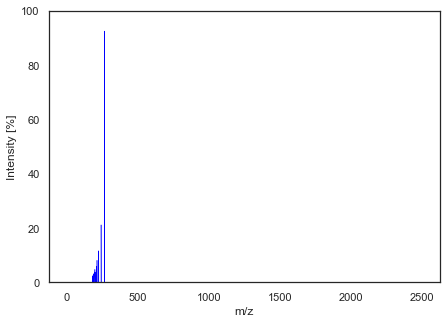

Matching spectra using cos_sim


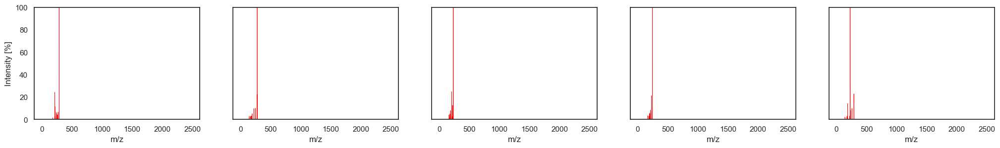

Matching spectra using eu_dist


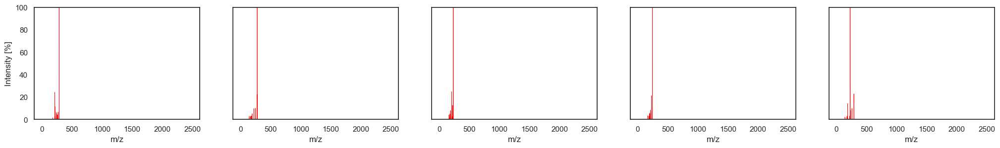

Matching spectra using per_diff


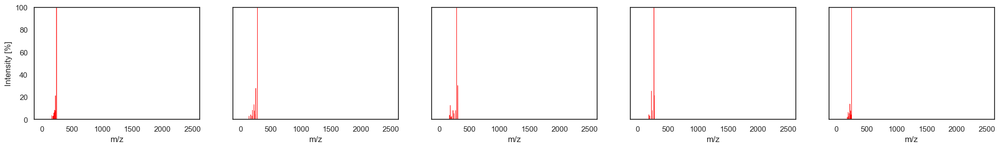

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.999041
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.998818
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.998704
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.998603
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.998598


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.043786
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.048616
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.050920
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.052853
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.052962


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
95012,ZRJBHWIHUMBLCN-HNWKQCISSA-N,108.04443:0.500000 110.05917:1.800000 118.06898:0.500000 120.07374:0.500000 127.05623:1.000000 128.0625:0.500000 134.05037:0.800000 134.05804:2.200000 134.09335:1.300000 134.09917:0.700000 139.053...,10.0,1,0.105278
9598,RHMXXJGYXNZAPX-UHFFFAOYSA-N,100.030449:0.000877 101.040176:0.023366 101.134148:0.000916 101.243538:0.000609 102.044281:0.004945 102.441193:0.000800 102.752411:0.000884 103.036972:0.024068 103.118988:0.001378 103.383957:0.000...,NaN,0,0.113334
113369,RWKJTIHNYSIIHW-WYVZXCPWSA-N,153.013:0.502513 165.120:0.188442 170.800:0.188442 171.164:3.831658 185.130:12.562814 193.120:0.376884 197.146:2.324121 209.200:2.826633 211.040:0.439698 211.200:0.188442 223.040:0.188442 223.440:...,10.0,0,0.113460
89064,CIEYTVIYYGTCCI-UHFFFAOYSA-N,50.086820:0.020602 50.407828:0.026492 51.735925:0.022206 53.007545:0.023556 54.218795:0.027670 54.270473:0.013378 54.566836:0.018220 54.611016:0.021918 54.657377:0.022876 54.921512:0.024218 55.234...,45.0,0,0.114171
37782,UTSVPXMQSFGQTM-DCXZOGHSSA-N,141.07:2.941678 169.0651:4.192435 189.0183:3.080651 197.0595:8.257269 200.0463:2.814746 225.0545:13.283040 226.0621:4.100121 228.0419:7.692848 253.0496:27.793089 254.0577:4.550821 281.0444:100.000000,90.0,1,0.114653


Intermediate spectrum


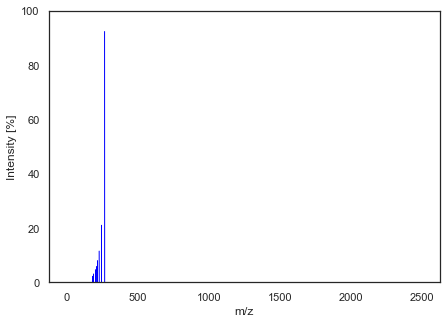

Matching spectra using cos_sim


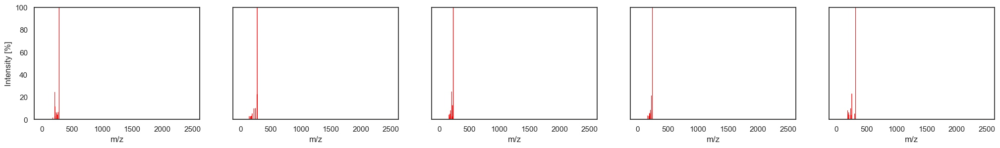

Matching spectra using eu_dist


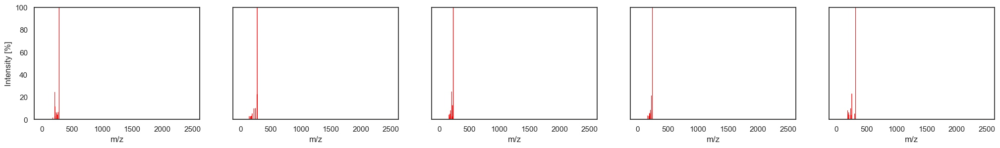

Matching spectra using per_diff


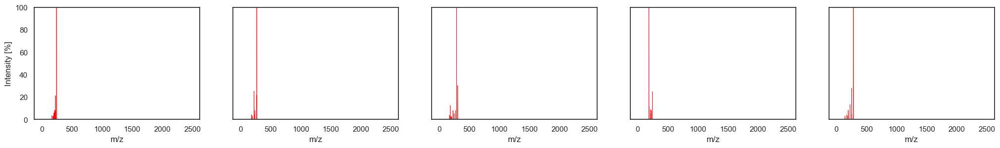

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.999068
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.998734
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.998611
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.998511
13671,IXRKDGGGFFCRIR-UHFFFAOYSA-N,135.0437:1.327327 162.0551:1.037037 176.0611:1.476476 188.0715:5.415415 192.0659:1.277277 197.0836:2.897898 198.0616:2.250250 201.0438:1.403403 202.1121:1.300300 204.0655:13.165165 212.1058:1.6736...,20.0,1,0.998477


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.043158
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.050319
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.052698
9154,QZZMDINWSWWNKM-UHFFFAOYSA-N,51.833260:0.526847 91.970306:0.711258 96.018494:0.645222 129.070145:1.115019 137.059708:1.947773 149.059921:0.007611 151.038849:1.078370 151.075317:0.871844 161.096558:0.290763 163.075485:4.124931...,NaN,1,0.054562
13671,IXRKDGGGFFCRIR-UHFFFAOYSA-N,135.0437:1.327327 162.0551:1.037037 176.0611:1.476476 188.0715:5.415415 192.0659:1.277277 197.0836:2.897898 198.0616:2.250250 201.0438:1.403403 202.1121:1.300300 204.0655:13.165165 212.1058:1.6736...,20.0,1,0.055183


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
9598,RHMXXJGYXNZAPX-UHFFFAOYSA-N,100.030449:0.000877 101.040176:0.023366 101.134148:0.000916 101.243538:0.000609 102.044281:0.004945 102.441193:0.000800 102.752411:0.000884 103.036972:0.024068 103.118988:0.001378 103.383957:0.000...,NaN,0,0.114076
16183,DYFXVIVUWANJGN-UHFFFAOYSA-N,70.271950:0.030215 70.574455:0.036810 72.655945:0.022546 72.844261:0.026073 76.287872:0.021779 76.578499:0.031748 76.745300:0.050000 77.678055:0.016718 79.525421:0.034969 81.535439:0.034662 82.062...,NaN,1,0.114271
113369,RWKJTIHNYSIIHW-WYVZXCPWSA-N,153.013:0.502513 165.120:0.188442 170.800:0.188442 171.164:3.831658 185.130:12.562814 193.120:0.376884 197.146:2.324121 209.200:2.826633 211.040:0.439698 211.200:0.188442 223.040:0.188442 223.440:...,10.0,0,0.114617
50537,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,153.02576:1.257862 179.05618:1.069182 195.04102:11.509434 196.04622:1.006289 196.05757:1.006289 197.04405:1.257862 208.05231:1.006289 211.03328:1.132075 223.03613:27.044025 223.04495:10.188679 224...,6.0,0,0.115033
89064,CIEYTVIYYGTCCI-UHFFFAOYSA-N,50.086820:0.020602 50.407828:0.026492 51.735925:0.022206 53.007545:0.023556 54.218795:0.027670 54.270473:0.013378 54.566836:0.018220 54.611016:0.021918 54.657377:0.022876 54.921512:0.024218 55.234...,45.0,0,0.115255


Intermediate spectrum


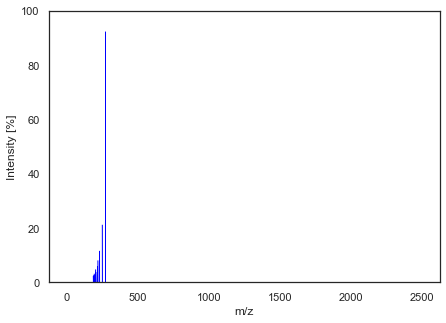

Matching spectra using cos_sim


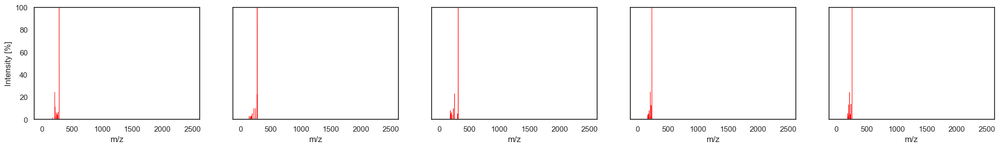

Matching spectra using eu_dist


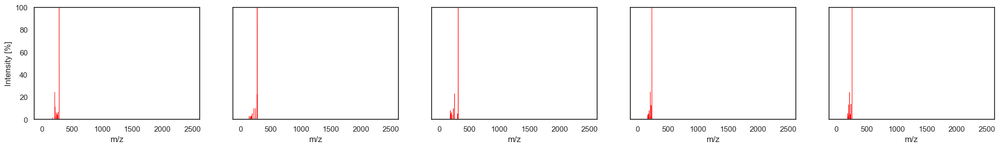

Matching spectra using per_diff


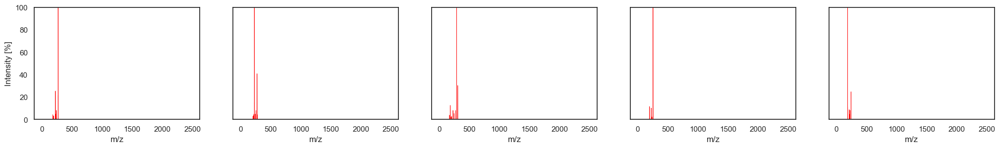

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.999058
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998612
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.998585
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.998584
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.998552


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.043393
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.052686
17729,SVGOJJZXRJJDLY-UHFFFAOYSA-N,144.2149:1.160160 159.0384:1.120120 163.0044:1.001001 180.8991:2.893894 181.0513:1.364364 185.0455:3.403403 187.0386:7.952953 188.0460:4.807808 188.7553:1.244244 189.0159:2.420420 190.0293:2.33733...,10.0,0,0.053204
31982,LKPQNZRGGNOPPU-UHFFFAOYSA-N,50.134119:0.011082 50.542373:0.010845 50.543698:0.015243 50.746320:0.011869 50.985777:0.008165 51.711604:0.009384 51.898374:0.010637 52.478060:0.009787 52.998151:0.010758 53.039281:0.112228 53.493...,65.0,1,0.053215
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.053808


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0000,0,0.108908
16183,DYFXVIVUWANJGN-UHFFFAOYSA-N,70.271950:0.030215 70.574455:0.036810 72.655945:0.022546 72.844261:0.026073 76.287872:0.021779 76.578499:0.031748 76.745300:0.050000 77.678055:0.016718 79.525421:0.034969 81.535439:0.034662 82.062...,NaN,1,0.115154
50537,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,153.02576:1.257862 179.05618:1.069182 195.04102:11.509434 196.04622:1.006289 196.05757:1.006289 197.04405:1.257862 208.05231:1.006289 211.03328:1.132075 223.03613:27.044025 223.04495:10.188679 224...,6.0000,0,0.115313
117406,BQAJKXKYTQTBDK-PCHDOLKHSA-N,108.0197:1.701702 132.0234:0.500501 133.0282:0.700701 142.4566:0.400400 165.0708:0.500501 183.0427:0.500501 185.0620:2.202202 186.0710:1.301301 197.0598:0.400400 207.0492:0.500501 208.0559:0.40040...,22.9261,0,0.115389
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0000,1,0.116330


Intermediate spectrum


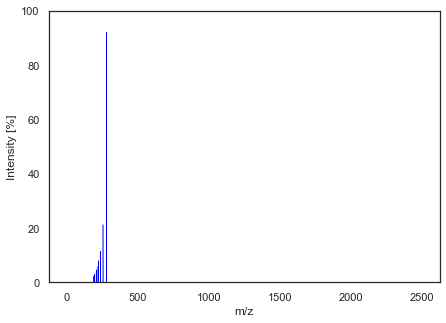

Matching spectra using cos_sim


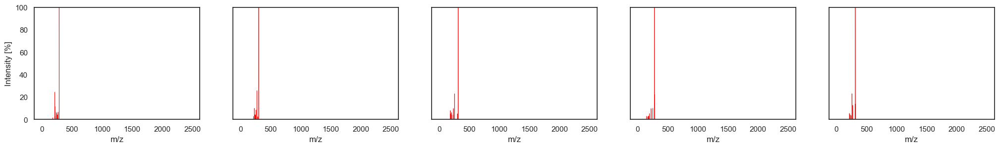

Matching spectra using eu_dist


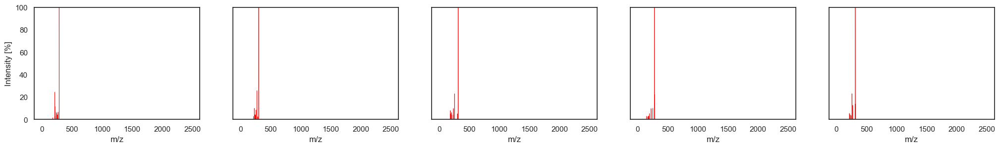

Matching spectra using per_diff


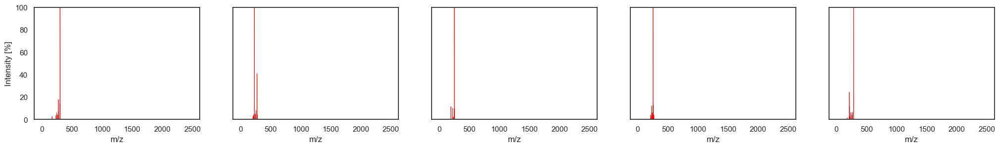

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.998996
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998717
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998706
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.998616
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.998585


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.044800
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.050654
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.050870
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.052611
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.053192


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0000,0,0.103522
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0000,1,0.115939
117406,BQAJKXKYTQTBDK-PCHDOLKHSA-N,108.0197:1.701702 132.0234:0.500501 133.0282:0.700701 142.4566:0.400400 165.0708:0.500501 183.0427:0.500501 185.0620:2.202202 186.0710:1.301301 197.0598:0.400400 207.0492:0.500501 208.0559:0.40040...,22.9261,0,0.116393
50537,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,153.02576:1.257862 179.05618:1.069182 195.04102:11.509434 196.04622:1.006289 196.05757:1.006289 197.04405:1.257862 208.05231:1.006289 211.03328:1.132075 223.03613:27.044025 223.04495:10.188679 224...,6.0000,0,0.116489
9947,YQHZABGPIPECSQ-UHFFFAOYSA-N,100.146011:0.005930 100.221077:0.004138 100.313454:0.007044 100.365608:0.004696 100.596603:0.013015 100.674774:0.003669 100.789551:0.002972 100.939346:0.025939 101.089119:0.077941 101.413612:0.004...,NaN,1,0.117449


Intermediate spectrum


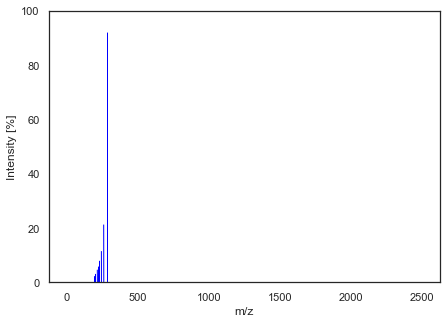

Matching spectra using cos_sim


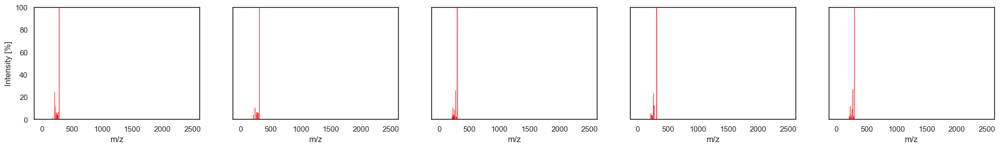

Matching spectra using eu_dist


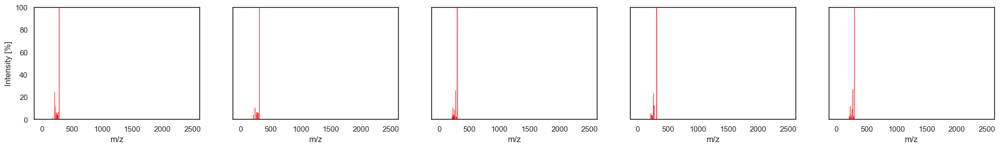

Matching spectra using per_diff


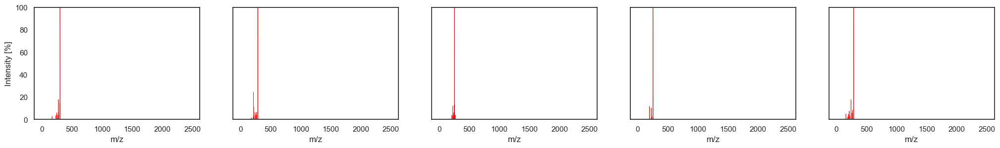

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.998883
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998848
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998751
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.998630
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.998624


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.047262
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.047996
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.049989
15431,WYMMNGQSPNWCIK-UHFFFAOYSA-N,97.897202:0.482759 102.974197:0.390805 107.040100:0.264368 121.172096:0.241379 139.003204:0.310345 145.066605:0.643678 147.050903:0.333333 154.532806:0.264368 160.083893:0.505747 161.136902:0.2528...,NaN,1,0.052340
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.052453


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.099210
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.117173
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.117544
50537,ZQSIJRDFPHDXIC-UHFFFAOYSA-N,153.02576:1.257862 179.05618:1.069182 195.04102:11.509434 196.04622:1.006289 196.05757:1.006289 197.04405:1.257862 208.05231:1.006289 211.03328:1.132075 223.03613:27.044025 223.04495:10.188679 224...,6.0,0,0.117631
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.118471


Intermediate spectrum


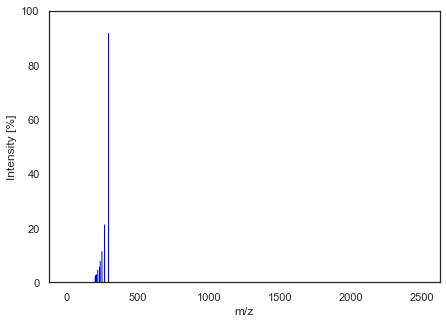

Matching spectra using cos_sim


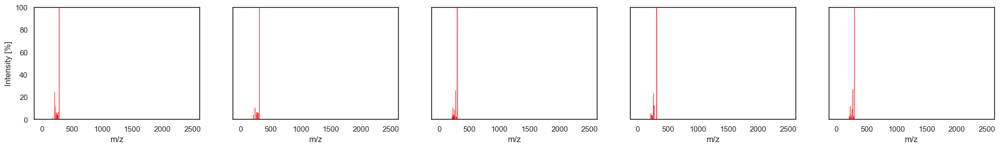

Matching spectra using eu_dist


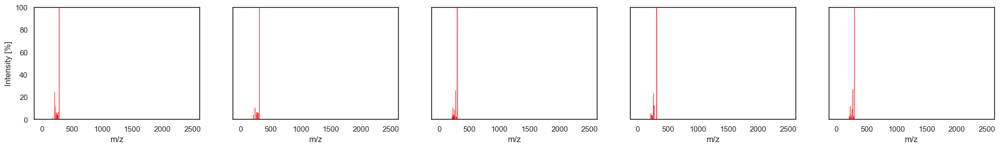

Matching spectra using per_diff


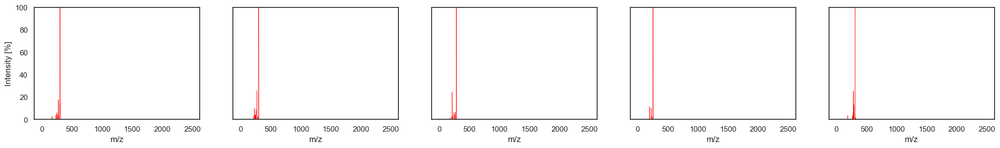

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998930
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998743
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.998742
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.998716
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.998612


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.046253
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.050132
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.050155
117967,FSCWZHGZWWDELK-UHFFFAOYSA-N,61.0285:0.122644 81.0335:0.131068 164.0259:0.776847 178.0418:0.924100 179.0496:1.520862 196.9921:0.195478 197.9871:0.123844 199.9662:0.123161 204.0212:1.136240 206.0366:0.426920 207.0446:0.725702 ...,15.0,1,0.050671
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.052693


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.095935
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.113799
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.114970
93536,GVKKJJOMQCNPGB-JTQLQIEISA-N,50.338525:0.006566 50.733571:0.008374 50.805438:0.007107 51.568932:0.005287 51.810954:0.005000 52.858751:0.006057 52.962290:0.007739 53.178183:0.003875 53.282871:0.004853 53.287105:0.005762 54.194...,35.0,1,0.116491
74222,LJUJJGHPDOTAAY-VRSLGHTJSA-N,50.397008:0.007031 50.827880:0.016126 51.018310:0.006688 51.422497:0.007714 52.064489:0.006953 52.106595:0.007262 52.128914:0.007294 52.271263:0.016460 52.955577:0.055618 53.262335:0.071603 54.243...,45.0,1,0.121248


Intermediate spectrum


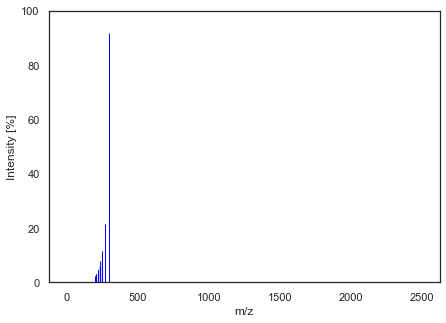

Matching spectra using cos_sim


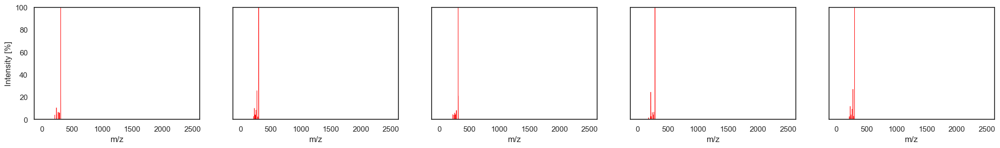

Matching spectra using eu_dist


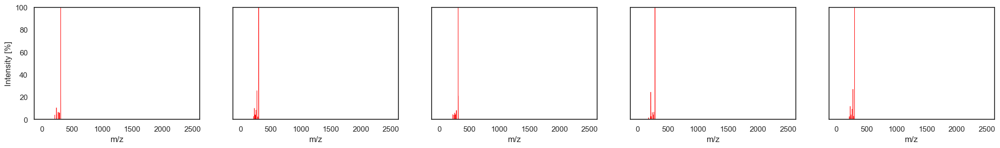

Matching spectra using per_diff


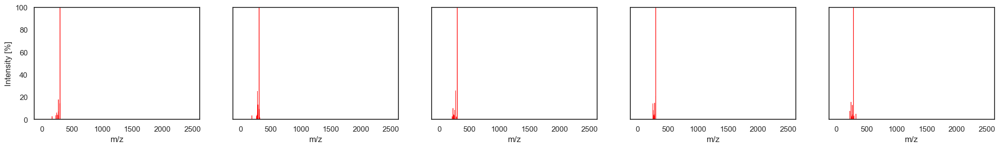

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998960
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.998832
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998684
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.998561
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.998548


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.045605
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.048324
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.051308
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.053640
15241,GESAVORGYOGKOW-UHFFFAOYSA-N,200.045898:0.855162 201.054199:2.136389 202.061890:1.256126 213.053925:1.577522 214.061630:2.579578 215.033249:0.988212 215.068893:0.269990 228.040985:1.908688 229.048492:11.701081 230.056854:2.46...,NaN,1,0.053889


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.094566
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.109143
93536,GVKKJJOMQCNPGB-JTQLQIEISA-N,50.338525:0.006566 50.733571:0.008374 50.805438:0.007107 51.568932:0.005287 51.810954:0.005000 52.858751:0.006057 52.962290:0.007739 53.178183:0.003875 53.282871:0.004853 53.287105:0.005762 54.194...,35.0,1,0.115682
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.117827
658,QMWJARHMJRTJMQ-UHFFFAOYSA-N,95.015869:1.294395 141.090073:0.981955 153.123505:1.154116 169.863358:1.555825 173.091537:1.543072 177.955673:0.771536 179.147461:1.224256 189.128403:0.573870 191.109985:1.052095 203.121582:1.6961...,NaN,0,0.121677


Intermediate spectrum


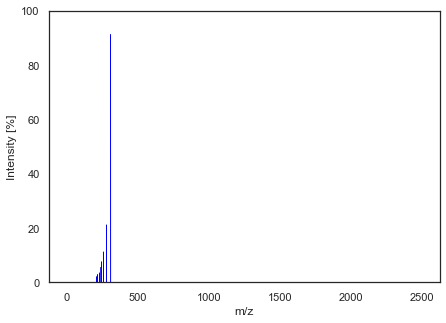

Matching spectra using cos_sim


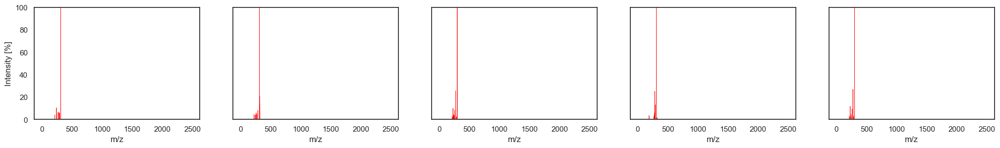

Matching spectra using eu_dist


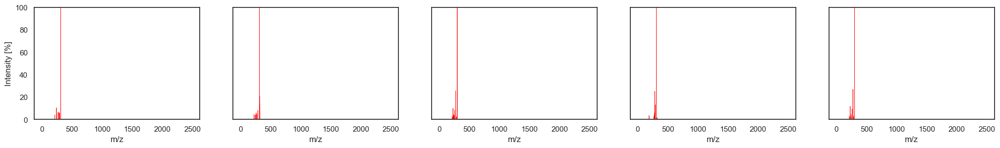

Matching spectra using per_diff


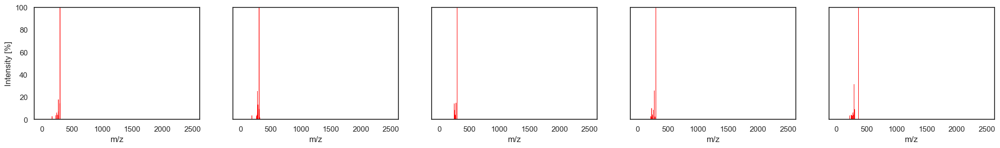

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998937
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.998871
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.998634
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998569
68334,RZEKVGVHFLEQIL-UHFFFAOYSA-N,87.9989:1.111264 108.0055:0.466799 115.0294:0.103948 129.0455:0.180899 130.0534:1.030107 139.0301:1.518154 159.0364:3.788572 179.0427:4.291886 198.041:0.464676 199.0491:0.183694 220.1006:0.217469 ...,35.0,0,0.998433


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.046115
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.047517
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.052259
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.053497
68334,RZEKVGVHFLEQIL-UHFFFAOYSA-N,87.9989:1.111264 108.0055:0.466799 115.0294:0.103948 129.0455:0.180899 130.0534:1.030107 139.0301:1.518154 159.0364:3.788572 179.0427:4.291886 198.041:0.464676 199.0491:0.183694 220.1006:0.217469 ...,35.0,0,0.055985


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.095081
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.104755
93536,GVKKJJOMQCNPGB-JTQLQIEISA-N,50.338525:0.006566 50.733571:0.008374 50.805438:0.007107 51.568932:0.005287 51.810954:0.005000 52.858751:0.006057 52.962290:0.007739 53.178183:0.003875 53.282871:0.004853 53.287105:0.005762 54.194...,35.0,1,0.115128
658,QMWJARHMJRTJMQ-UHFFFAOYSA-N,95.015869:1.294395 141.090073:0.981955 153.123505:1.154116 169.863358:1.555825 173.091537:1.543072 177.955673:0.771536 179.147461:1.224256 189.128403:0.573870 191.109985:1.052095 203.121582:1.6961...,NaN,0,0.118817
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.122005


Intermediate spectrum


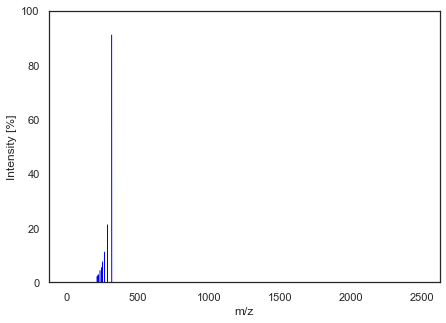

Matching spectra using cos_sim


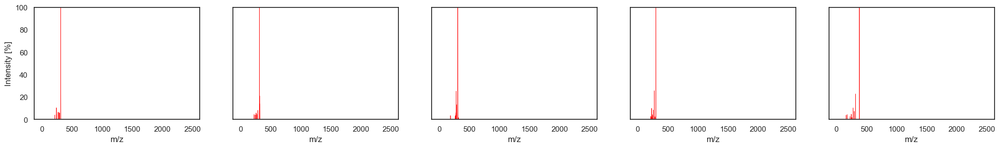

Matching spectra using eu_dist


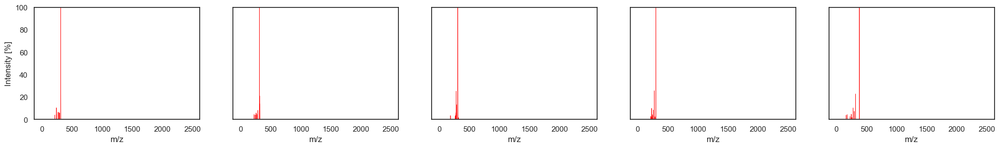

Matching spectra using per_diff


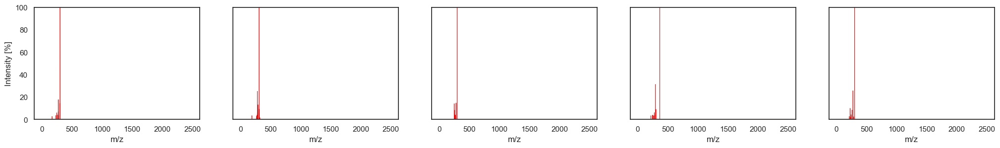

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998858
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.998854
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.998652
37519,PDICCECAPKBDBB-UHFFFAOYSA-N,100.153152:0.009520 100.272163:0.011718 100.451675:0.007262 100.562729:0.021702 100.683220:0.012797 100.785889:0.011896 100.908783:0.007155 101.042480:0.081653 101.197388:0.012146 101.356918:0.005...,NaN,0,0.998517
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.998400


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.047782
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.047862
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.051918
37519,PDICCECAPKBDBB-UHFFFAOYSA-N,100.153152:0.009520 100.272163:0.011718 100.451675:0.007262 100.562729:0.021702 100.683220:0.012797 100.785889:0.011896 100.908783:0.007155 101.042480:0.081653 101.197388:0.012146 101.356918:0.005...,NaN,0,0.054458
16134,LQGUBLBATBMXHT-UHFFFAOYSA-N,53.560802:0.169547 54.018124:0.028650 55.389366:0.026106 56.755188:0.709900 57.361462:0.888906 58.151878:0.031826 59.152962:0.079545 59.490299:0.705391 59.705833:0.031778 60.375889:0.030372 62.271...,NaN,1,0.056562


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.099792
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.103384
93536,GVKKJJOMQCNPGB-JTQLQIEISA-N,50.338525:0.006566 50.733571:0.008374 50.805438:0.007107 51.568932:0.005287 51.810954:0.005000 52.858751:0.006057 52.962290:0.007739 53.178183:0.003875 53.282871:0.004853 53.287105:0.005762 54.194...,35.0,1,0.114588
57490,VGGGPCQERPFHOB-RDBSUJKOSA-N,49.329105:0.937082 52.832161:1.494868 72.977104:1.048639 77.871620:0.825524 84.045212:1.494868 84.204025:1.070950 84.849968:0.870147 85.183960:0.959393 86.295242:0.914770 96.032883:0.914770 102.15...,NaN,1,0.120528
658,QMWJARHMJRTJMQ-UHFFFAOYSA-N,95.015869:1.294395 141.090073:0.981955 153.123505:1.154116 169.863358:1.555825 173.091537:1.543072 177.955673:0.771536 179.147461:1.224256 189.128403:0.573870 191.109985:1.052095 203.121582:1.6961...,NaN,0,0.120873


Intermediate spectrum


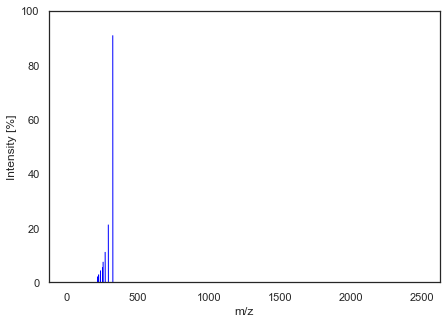

Matching spectra using cos_sim


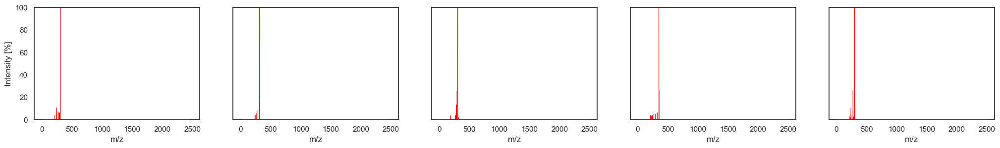

Matching spectra using eu_dist


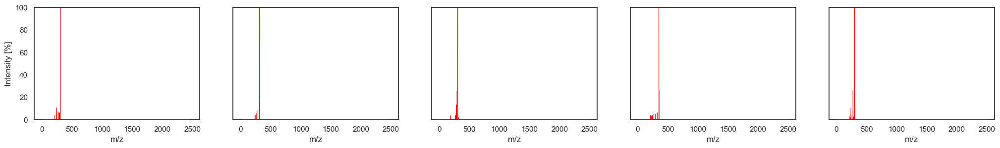

Matching spectra using per_diff


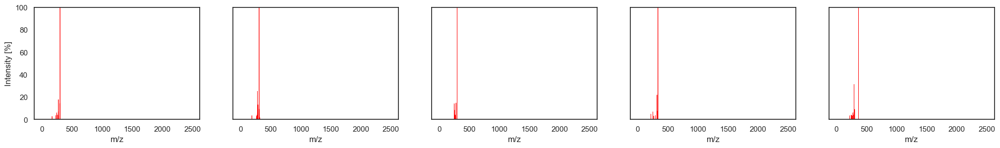

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.998802
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.998749
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.998619
37519,PDICCECAPKBDBB-UHFFFAOYSA-N,100.153152:0.009520 100.272163:0.011718 100.451675:0.007262 100.562729:0.021702 100.683220:0.012797 100.785889:0.011896 100.908783:0.007155 101.042480:0.081653 101.197388:0.012146 101.356918:0.005...,NaN,0,0.998579
20093,IJOCZMKYIFYFQK-UHFFFAOYSA-N,133.068726:1.926978 135.043777:1.926978 193.163193:1.340996 195.125595:2.524228 201.092056:1.735407 203.126968:2.321388 229.160538:1.667794 233.160477:1.633987 233.191391:1.926978 238.187469:2.219...,NaN,0,0.998443


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
58874,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0654:0.877153 131.0733:1.387432 134.0407:1.288113 166.0423:1.383885 191.0383:0.871579 209.0646:0.572100 224.0878:0.771246 225.096:4.328504 226.0996:0.779860 236.0763:1.302301 244.0338:4.110103...,40.0,1,0.048943
6125,OVWIVSWXKVYPAG-UHFFFAOYSA-N,100.068298:0.035951 100.137390:0.025950 100.225471:0.028913 100.375671:0.018022 100.566513:0.029452 100.774742:0.018535 101.039436:0.469264 101.375031:0.056681 101.547798:0.029452 101.873894:0.032...,NaN,0,0.050029
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.052558
37519,PDICCECAPKBDBB-UHFFFAOYSA-N,100.153152:0.009520 100.272163:0.011718 100.451675:0.007262 100.562729:0.021702 100.683220:0.012797 100.785889:0.011896 100.908783:0.007155 101.042480:0.081653 101.197388:0.012146 101.356918:0.005...,NaN,0,0.053318
20093,IJOCZMKYIFYFQK-UHFFFAOYSA-N,133.068726:1.926978 135.043777:1.926978 193.163193:1.340996 195.125595:2.524228 201.092056:1.735407 203.126968:2.321388 229.160538:1.667794 233.160477:1.633987 233.191391:1.926978 238.187469:2.219...,NaN,0,0.055805


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
10313,FDVOVSCQDWKKHH-UHFFFAOYSA-N,187.643875:3.441723 265.126923:2.850507 273.049072:3.885135 279.082855:5.996622 281.121399:25.190034 291.099854:13.091216 307.097504:4.391892 308.104828:9.142736 309.113953:100.000000 320.160889:1...,NaN,0,0.103256
1064,TUSDEZXZIZRFGC-ZHQJDPFESA-N,51.857906:0.067112 53.930790:0.048466 53.977340:0.061240 55.625060:0.053398 55.980290:0.068235 57.236255:0.043489 58.299711:0.061942 59.012520:0.057599 59.208439:0.037838 59.889838:0.056916 60.184...,45.0,0,0.106861
93536,GVKKJJOMQCNPGB-JTQLQIEISA-N,50.338525:0.006566 50.733571:0.008374 50.805438:0.007107 51.568932:0.005287 51.810954:0.005000 52.858751:0.006057 52.962290:0.007739 53.178183:0.003875 53.282871:0.004853 53.287105:0.005762 54.194...,35.0,1,0.114236
68124,UREBDLICKHMUKA-CXSFZGCWSA-N,147.0801:0.731117 173.0963:0.314167 177.0905:0.360919 185.0967:0.619658 187.1112:0.162222 197.0962:0.278234 211.1118:0.481220 225.1265:0.374793 235.1113:0.343579 237.1271:2.668881 249.1262:0.15807...,35.0,1,0.117194
57490,VGGGPCQERPFHOB-RDBSUJKOSA-N,49.329105:0.937082 52.832161:1.494868 72.977104:1.048639 77.871620:0.825524 84.045212:1.494868 84.204025:1.070950 84.849968:0.870147 85.183960:0.959393 86.295242:0.914770 96.032883:0.914770 102.15...,NaN,1,0.119640


Intermediate spectrum


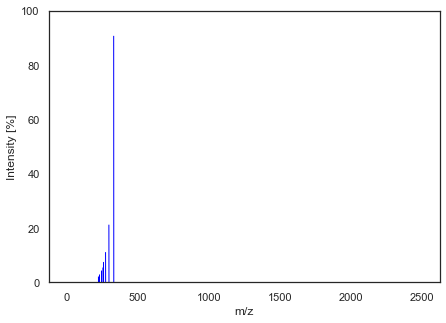

Matching spectra using cos_sim


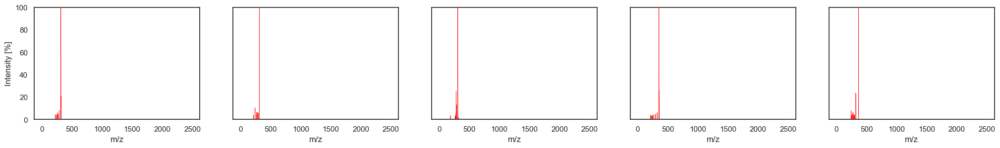

Matching spectra using eu_dist


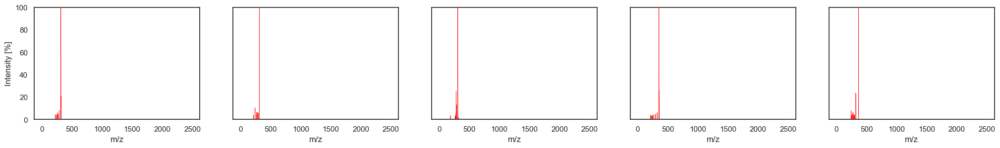

Matching spectra using per_diff


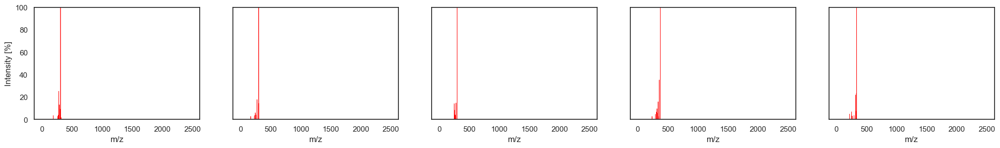

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.999395
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.998961
42567,VOYCJQSSBDMXNQ-YZGKFDMESA-N,111.0417:2.145145 125.0604:3.757758 139.1083:2.086086 153.0550:3.683684 165.1273:2.174174 167.1061:7.873874 181.1229:4.637638 191.1063:1.558559 209.1170:18.872873 223.1330:36.462462 237.1118:11.93...,10.0,1,0.998475
88942,AUZMDLDJTGPIEA-UHFFFAOYSA-N,91.054300:1.022780 105.070100:2.541473 117.070200:3.185212 119.085800:1.205352 131.085800:2.396174 143.085800:1.442885 191.085300:2.617914 192.093100:4.280011 205.101000:9.232820 206.108500:13.018...,30.0,1,0.998422
27218,CLQMBPJKHLGMQK-UHFFFAOYSA-N,76.018738:0.066272 78.034554:0.088605 79.042221:0.017721 80.049683:0.015943 83.704010:0.013204 86.096901:6.424816 87.400352:0.012226 87.417015:0.019866 87.463577:0.016142 90.362534:0.017036 96.044...,NaN,1,0.998360


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.034784
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.045587
42567,VOYCJQSSBDMXNQ-YZGKFDMESA-N,111.0417:2.145145 125.0604:3.757758 139.1083:2.086086 153.0550:3.683684 165.1273:2.174174 167.1061:7.873874 181.1229:4.637638 191.1063:1.558559 209.1170:18.872873 223.1330:36.462462 237.1118:11.93...,10.0,1,0.055223
88942,AUZMDLDJTGPIEA-UHFFFAOYSA-N,91.054300:1.022780 105.070100:2.541473 117.070200:3.185212 119.085800:1.205352 131.085800:2.396174 143.085800:1.442885 191.085300:2.617914 192.093100:4.280011 205.101000:9.232820 206.108500:13.018...,30.0,1,0.056182
27218,CLQMBPJKHLGMQK-UHFFFAOYSA-N,76.018738:0.066272 78.034554:0.088605 79.042221:0.017721 80.049683:0.015943 83.704010:0.013204 86.096901:6.424816 87.400352:0.012226 87.417015:0.019866 87.463577:0.016142 90.362534:0.017036 96.044...,NaN,1,0.057282


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
59893,YOSHYTLCDANDAN-UHFFFAOYSA-N,129.045:0.568318 140.0495:0.613480 151.0542:0.687437 152.0621:2.325405 153.0696:2.957375 163.0545:0.627120 165.0698:2.461498 166.0756:0.772912 167.0729:1.475808 167.1544:1.468533 169.0647:0.647125...,50.0,1,0.079715
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.082062
84287,MMHTXEATDNFMMY-WBIUFABUSA-N,69.0335:4.076836 169.0648:3.406467 191.1067:4.634751 197.0597:5.771107 198.0675:6.104803 201.091:16.721177 203.1067:3.967863 211.0754:9.130669 213.091:8.466162 215.0703:3.961051 225.0546:4.412439 ...,35.0,1,0.092897
88942,AUZMDLDJTGPIEA-UHFFFAOYSA-N,91.054300:1.022780 105.070100:2.541473 117.070200:3.185212 119.085800:1.205352 131.085800:2.396174 143.085800:1.442885 191.085300:2.617914 192.093100:4.280011 205.101000:9.232820 206.108500:13.018...,30.0,1,0.093126
13324,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.030030:0.016536 50.712758:0.011448 50.844292:0.027996 51.380007:0.028886 51.605632:0.011854 51.728791:0.016368 52.387222:0.031775 53.092887:0.025260 53.628035:0.029656 54.676418:0.030910 55.197...,45.0,1,0.095142


Intermediate spectrum


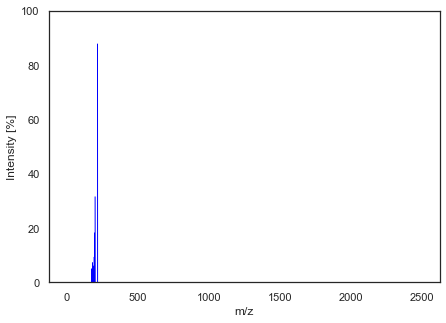

Matching spectra using cos_sim


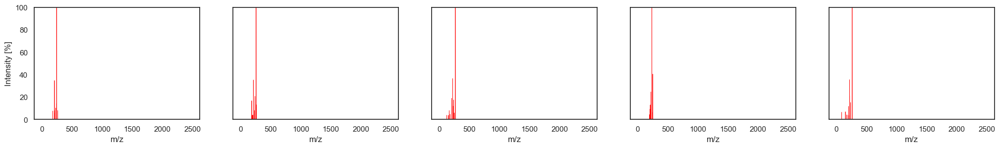

Matching spectra using eu_dist


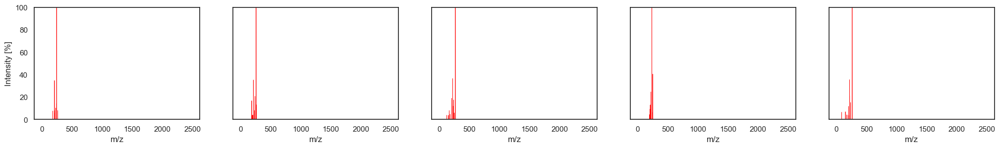

Matching spectra using per_diff


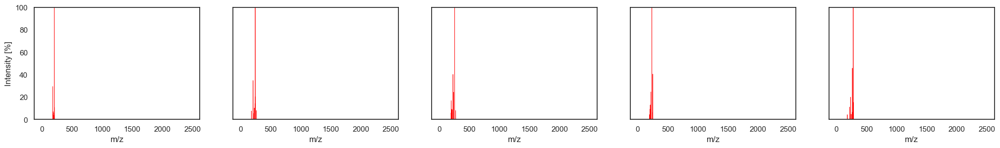

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.999461
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.999021
82316,ZPEIMTDSQAKGNT-UHFFFAOYSA-N,152.0616:2.620564 154.0637:2.056415 166.0631:1.401274 167.0721:3.657871 177.0569:2.766151 178.0653:3.257507 179.0712:2.420382 184.034:2.311192 198.0377:12.738854 201.0346:3.949045 204.0805:2.89354...,50.0,1,0.998385
84287,MMHTXEATDNFMMY-WBIUFABUSA-N,69.0335:4.076836 169.0648:3.406467 191.1067:4.634751 197.0597:5.771107 198.0675:6.104803 201.091:16.721177 203.1067:3.967863 211.0754:9.130669 213.091:8.466162 215.0703:3.961051 225.0546:4.412439 ...,35.0,1,0.998296
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998286


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.032834
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.044245
82316,ZPEIMTDSQAKGNT-UHFFFAOYSA-N,152.0616:2.620564 154.0637:2.056415 166.0631:1.401274 167.0721:3.657871 177.0569:2.766151 178.0653:3.257507 179.0712:2.420382 184.034:2.311192 198.0377:12.738854 201.0346:3.949045 204.0805:2.89354...,50.0,1,0.056837
84287,MMHTXEATDNFMMY-WBIUFABUSA-N,69.0335:4.076836 169.0648:3.406467 191.1067:4.634751 197.0597:5.771107 198.0675:6.104803 201.091:16.721177 203.1067:3.967863 211.0754:9.130669 213.091:8.466162 215.0703:3.961051 225.0546:4.412439 ...,35.0,1,0.058381
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.058557


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.081391
84287,MMHTXEATDNFMMY-WBIUFABUSA-N,69.0335:4.076836 169.0648:3.406467 191.1067:4.634751 197.0597:5.771107 198.0675:6.104803 201.091:16.721177 203.1067:3.967863 211.0754:9.130669 213.091:8.466162 215.0703:3.961051 225.0546:4.412439 ...,35.0,1,0.094098
13324,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.030030:0.016536 50.712758:0.011448 50.844292:0.027996 51.380007:0.028886 51.605632:0.011854 51.728791:0.016368 52.387222:0.031775 53.092887:0.025260 53.628035:0.029656 54.676418:0.030910 55.197...,45.0,1,0.094559
59893,YOSHYTLCDANDAN-UHFFFAOYSA-N,129.045:0.568318 140.0495:0.613480 151.0542:0.687437 152.0621:2.325405 153.0696:2.957375 163.0545:0.627120 165.0698:2.461498 166.0756:0.772912 167.0729:1.475808 167.1544:1.468533 169.0647:0.647125...,50.0,1,0.102550
9825,WJXSYUJKJSOJOG-UHFFFAOYSA-N,155.0489:1.980981 171.0452:1.721722 182.0373:1.907908 183.0449:3.161161 198.0330:3.091091 199.0391:5.006006 200.0480:4.620621 210.0313:4.733734 211.0405:7.459459 226.0269:14.818819 227.0352:15.502...,40.0,0,0.102988


Intermediate spectrum


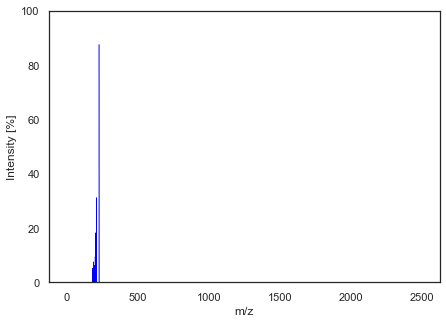

Matching spectra using cos_sim


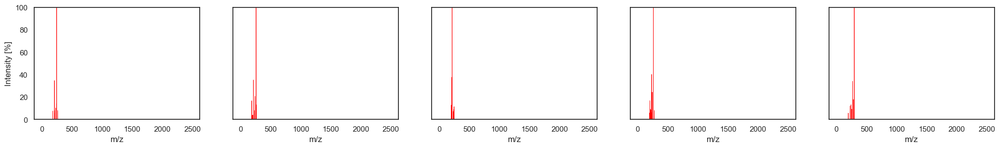

Matching spectra using eu_dist


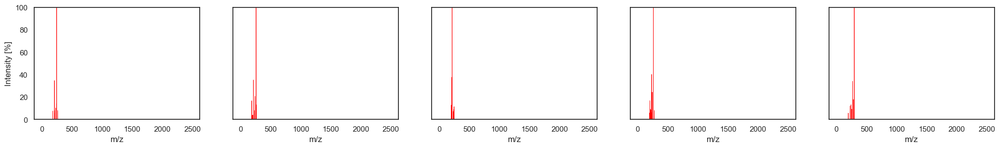

Matching spectra using per_diff


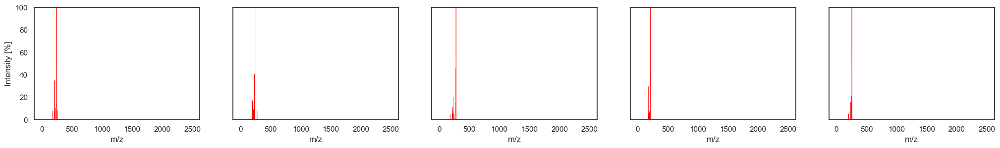

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.999385
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.998939
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998661
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998491
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.998412


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.035079
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.046060
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.051750
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.054931
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.056352


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.086480
9825,WJXSYUJKJSOJOG-UHFFFAOYSA-N,155.0489:1.980981 171.0452:1.721722 182.0373:1.907908 183.0449:3.161161 198.0330:3.091091 199.0391:5.006006 200.0480:4.620621 210.0313:4.733734 211.0405:7.459459 226.0269:14.818819 227.0352:15.502...,40.0,0,0.096960
13324,AKJIPZYHXYQVJT-UHFFFAOYSA-N,50.030030:0.016536 50.712758:0.011448 50.844292:0.027996 51.380007:0.028886 51.605632:0.011854 51.728791:0.016368 52.387222:0.031775 53.092887:0.025260 53.628035:0.029656 54.676418:0.030910 55.197...,45.0,1,0.098901
12609,OKBWVJGQTFYYQA-UHFFFAOYSA-N,50.564915:0.007936 52.332476:0.007719 52.690234:0.007853 52.966686:0.010493 53.921478:0.006935 54.873451:0.007461 54.923243:0.010467 54.968735:0.012277 56.036259:0.006699 56.199877:0.006847 56.462...,35.0,0,0.100718
84287,MMHTXEATDNFMMY-WBIUFABUSA-N,69.0335:4.076836 169.0648:3.406467 191.1067:4.634751 197.0597:5.771107 198.0675:6.104803 201.091:16.721177 203.1067:3.967863 211.0754:9.130669 213.091:8.466162 215.0703:3.961051 225.0546:4.412439 ...,35.0,1,0.102541


Intermediate spectrum


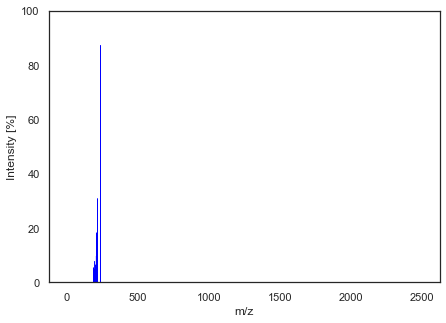

Matching spectra using cos_sim


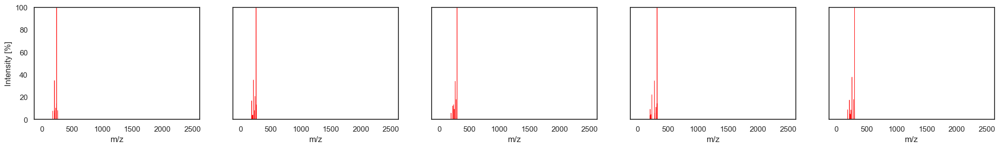

Matching spectra using eu_dist


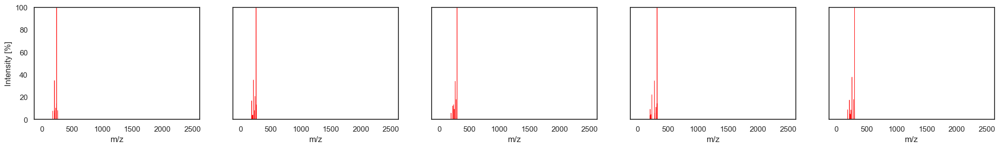

Matching spectra using per_diff


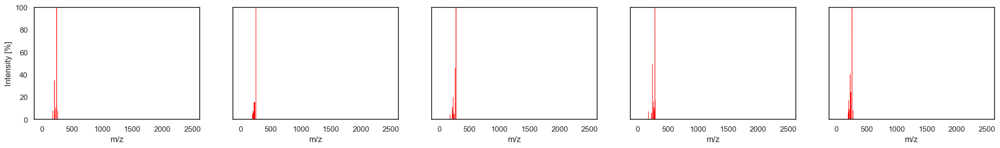

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.999192
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998891
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.998744
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998635
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.998517


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.040197
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.047094
28088,UMVSOHBRAQTGQI-XGARDCMYSA-N,85.027771:0.042916 91.054245:0.133607 93.069984:0.079557 95.048775:0.102432 97.028595:0.064982 105.069740:0.078140 107.048897:0.579775 107.085411:0.114174 108.052200:0.049597 109.028160:3.180259 1...,NaN,1,0.050129
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.052250
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.054469


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.089268
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.091684
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.094492
12609,OKBWVJGQTFYYQA-UHFFFAOYSA-N,50.564915:0.007936 52.332476:0.007719 52.690234:0.007853 52.966686:0.010493 53.921478:0.006935 54.873451:0.007461 54.923243:0.010467 54.968735:0.012277 56.036259:0.006699 56.199877:0.006847 56.462...,35.0,0,0.095775
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.096743


Intermediate spectrum


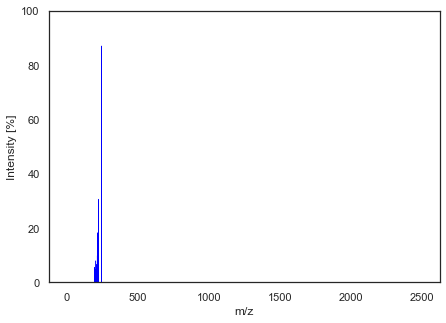

Matching spectra using cos_sim


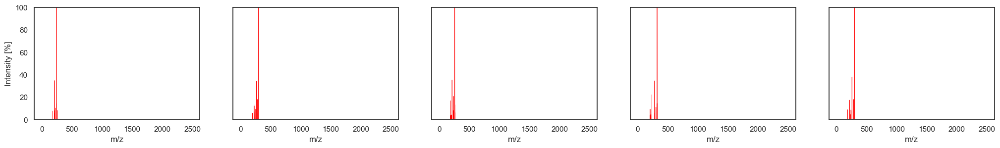

Matching spectra using eu_dist


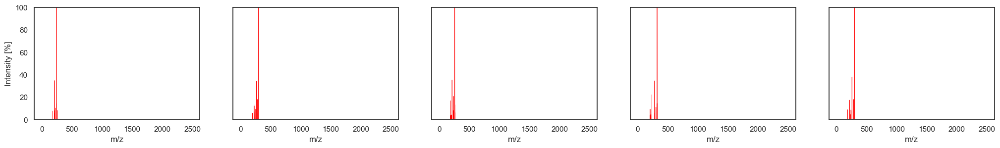

Matching spectra using per_diff


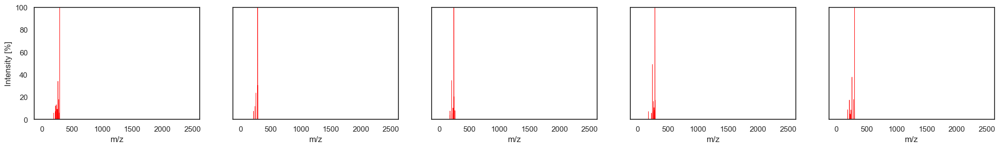

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998977
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.998912
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998688
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998581
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.998525


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.045248
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.046659
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.051220
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.053281
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.054311


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.081525
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.083075
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.092858
12609,OKBWVJGQTFYYQA-UHFFFAOYSA-N,50.564915:0.007936 52.332476:0.007719 52.690234:0.007853 52.966686:0.010493 53.921478:0.006935 54.873451:0.007461 54.923243:0.010467 54.968735:0.012277 56.036259:0.006699 56.199877:0.006847 56.462...,35.0,0,0.096798
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.097194


Intermediate spectrum


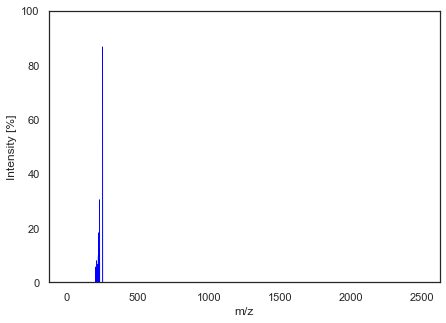

Matching spectra using cos_sim


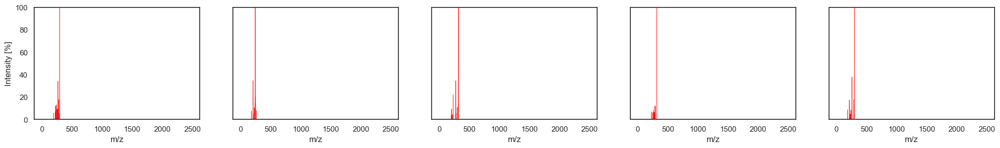

Matching spectra using eu_dist


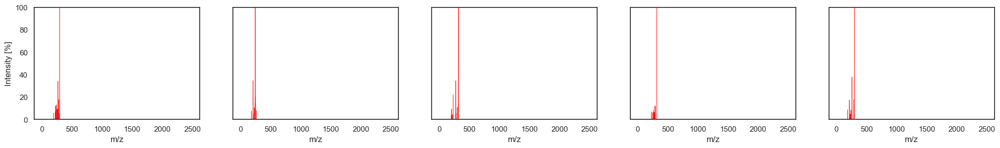

Matching spectra using per_diff


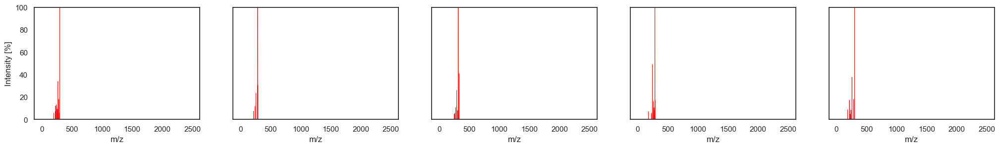

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998965
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998804
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998648
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.998508
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.998434


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.045499
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.048909
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.052003
96965,YEZNLOUZAIOMLT-UHFFFAOYSA-N,45.321503:0.348314 45.844219:0.390791 45.861740:0.365305 46.027676:0.356809 46.346893:0.331323 46.991371:0.373800 47.040501:0.348314 47.316647:0.365305 47.636177:0.467250 48.079525:0.331323 48.119...,NaN,1,0.054629
9821,WJXSYUJKJSOJOG-UHFFFAOYSA-N,88.032936:0.593949 91.054802:0.227797 94.043320:0.374537 95.014427:0.503109 95.048233:0.216617 100.677452:0.271120 105.041664:0.377332 107.085617:1.241003 109.099289:0.247362 115.054703:0.893019 1...,NaN,1,0.055970


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.077829
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.078644
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.078695
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.089343
44538,BPYKTIZUTYGOLE-IFADSCNNSA-N,50.225065:0.008512 50.496694:0.020562 51.206970:0.017278 51.211681:0.017896 51.414588:0.011415 51.661295:0.019851 51.720174:0.007788 51.902628:0.023479 51.968279:0.010807 52.131399:0.019589 52.828...,45.0,1,0.092976


Intermediate spectrum


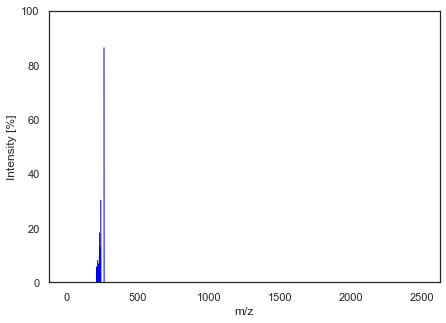

Matching spectra using cos_sim


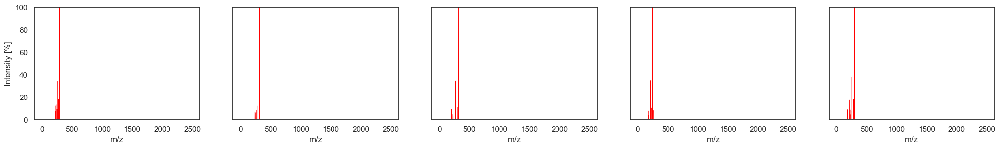

Matching spectra using eu_dist


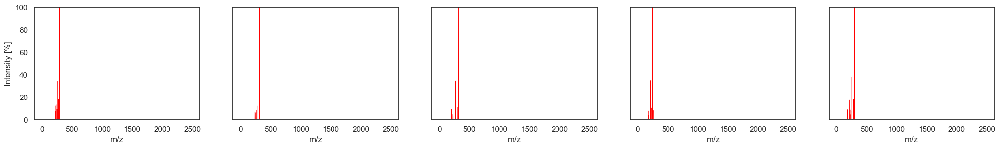

Matching spectra using per_diff


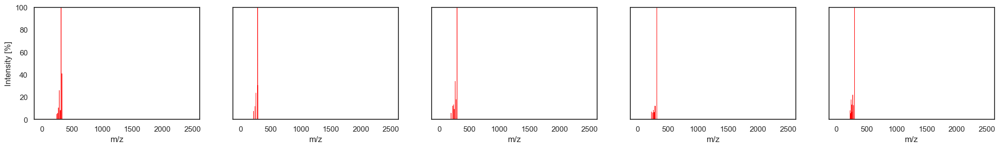

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998925
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998840
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998504
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.998486
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.998381


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.046364
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.048160
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.054695
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.055030
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.056903


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.066641
105026,RKWHWFONKJEUEF-UHFFFAOYSA-O,125.02349:5.200000 137.02695:2.800000 147.04141:3.100000 176.0096:2.100000 183.04886:3.200000 185.05653:2.500000 185.06422:3.700000 188.04382:2.400000 189.05653:2.600000 195.03735:2.600000 200.041...,30.0,0,0.078531
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.079591
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.081424
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.091266


Intermediate spectrum


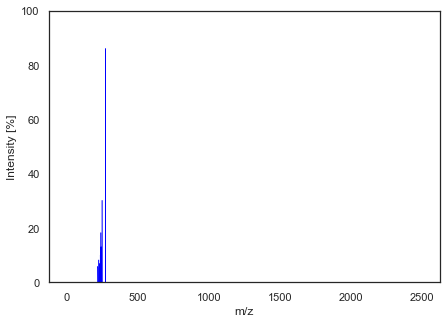

Matching spectra using cos_sim


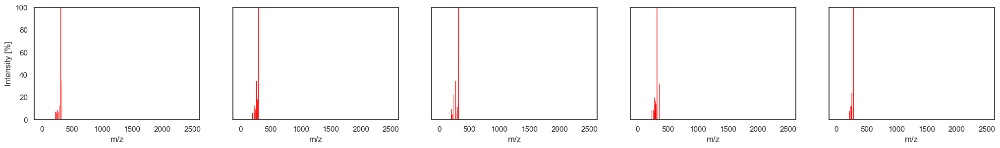

Matching spectra using eu_dist


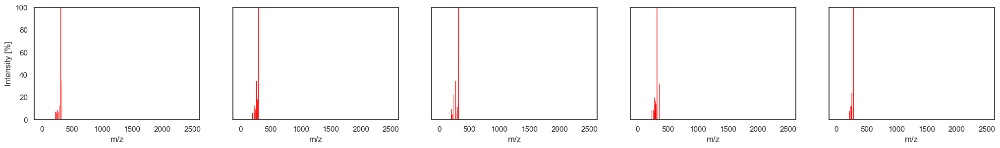

Matching spectra using per_diff


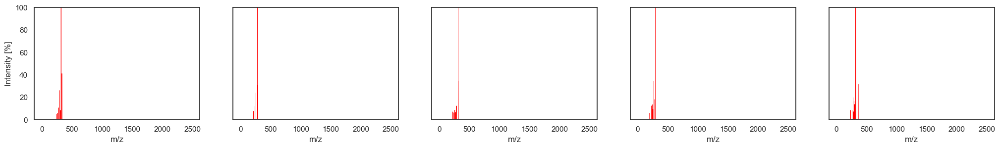

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998973
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.998554
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.998523
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.998313
66617,HRGUSFBJBOKSML-UHFFFAOYSA-N,153.018300:1.721750 178.025900:1.646951 242.056600:8.309555 243.060200:1.070726 258.051700:9.535418 259.055400:1.512591 269.043400:1.415630 270.051700:33.322714 271.054900:5.061362 273.038800:9.38...,40.0,1,0.998180


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.045316
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.053774
15435,WYMMNGQSPNWCIK-UHFFFAOYSA-N,185.04:1.621046 197.03:5.698209 211.03:3.832421 223.05:2.842058 225.05:6.928144 226.98:12.114219 237.06:5.064835 241.03:13.136221 251.0:4.610694 252.1:9.193512 265.01:9.167707 267.12:34.070866 279...,35.0,0,0.054345
81897,OGJPXUAPXNRGGI-UHFFFAOYSA-N,45.108253:0.127811 45.814121:0.145083 46.159641:0.124357 47.040043:0.158900 47.431259:0.186535 48.243435:0.141628 48.692379:0.138174 48.991432:0.124357 49.003971:0.138174 49.302586:0.131265 49.821...,NaN,1,0.058092
66617,HRGUSFBJBOKSML-UHFFFAOYSA-N,153.018300:1.721750 178.025900:1.646951 242.056600:8.309555 243.060200:1.070726 258.051700:9.535418 259.055400:1.512591 269.043400:1.415630 270.051700:33.322714 271.054900:5.061362 273.038800:9.38...,40.0,1,0.060331


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.069232
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.076775
68125,UREBDLICKHMUKA-CXSFZGCWSA-N,107.0852:1.222675 135.0798:0.785120 147.0805:3.954126 149.0956:0.942318 171.081:0.865788 173.0959:1.062106 177.0909:2.269893 185.0962:2.157792 235.111:0.969769 237.1275:8.660201 239.1427:1.508521 ...,15.0,1,0.088720
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.090039
16617,RCLFRVZNHRFQGE-UHFFFAOYSA-N,100.9345:4.986987 110.6977:1.432432 141.0379:2.303303 148.9548:1.093093 160.8451:2.689690 172.9547:1.239239 173.9548:1.227227 174.9501:3.448448 184.0026:4.198198 185.3234:1.183183 191.0513:4.43543...,40.0,0,0.093147


Intermediate spectrum


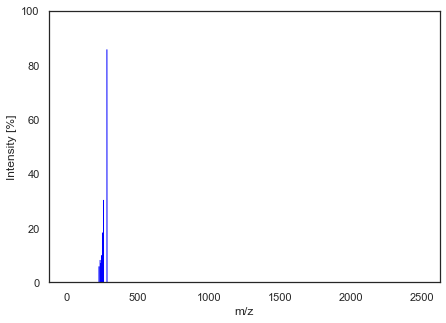

Matching spectra using cos_sim


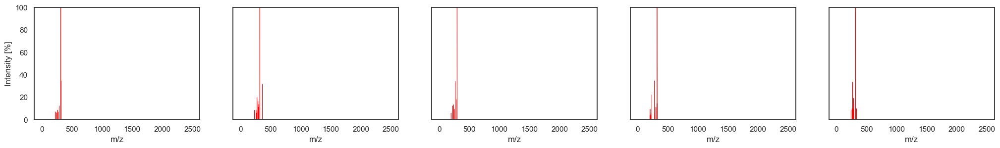

Matching spectra using eu_dist


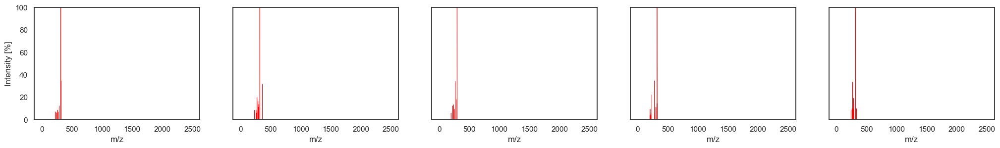

Matching spectra using per_diff


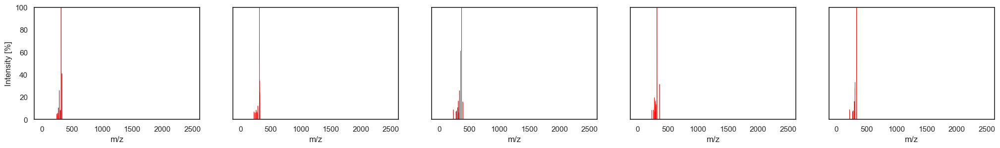

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998857
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.998412
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.998202
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.998154
119430,BTWUONYKONENGB-PIZIKKFZSA-N,59.050621:0.286478 77.655220:0.037983 83.047249:0.153384 83.085533:0.522688 83.134888:0.024031 90.975502:0.076612 95.090782:0.080347 115.053848:0.629400 115.109650:0.021695 137.387863:0.032375 153...,NaN,1,0.998114


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.047819
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.056355
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.059962
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.060763
119430,BTWUONYKONENGB-PIZIKKFZSA-N,59.050621:0.286478 77.655220:0.037983 83.047249:0.153384 83.085533:0.522688 83.134888:0.024031 90.975502:0.076612 95.090782:0.080347 115.053848:0.629400 115.109650:0.021695 137.387863:0.032375 153...,NaN,1,0.061415


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.078006
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.080445
103104,PLAPMLGJVGLZOV-UHFFFAOYSA-N,121.03223:0.700000 129.03484:0.600000 133.02469:1.300000 143.04944:1.000000 145.02763:1.000000 148.01517:0.600000 148.02248:0.600000 149.0278:2.100000 151.00305:1.000000 162.02643:0.500000 163.044...,10.0,0,0.085579
68125,UREBDLICKHMUKA-CXSFZGCWSA-N,107.0852:1.222675 135.0798:0.785120 147.0805:3.954126 149.0956:0.942318 171.081:0.865788 173.0959:1.062106 177.0909:2.269893 185.0962:2.157792 235.111:0.969769 237.1275:8.660201 239.1427:1.508521 ...,15.0,1,0.091509
50006,RZRPTBIGEANTGU-IRIMSJTPSA-N,50.549354:0.017887 50.933197:0.019961 51.321278:0.016201 52.146298:0.022169 53.119402:0.033088 53.262098:0.016506 55.653101:0.029578 56.382439:0.025574 57.033182:0.077715 57.739723:0.015437 59.012...,35.0,0,0.094333


Intermediate spectrum


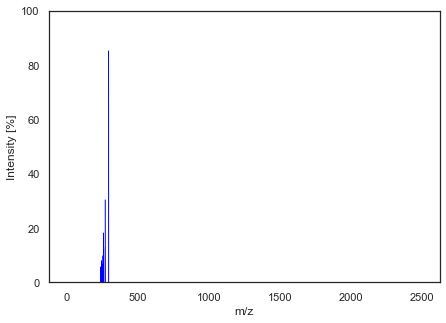

Matching spectra using cos_sim


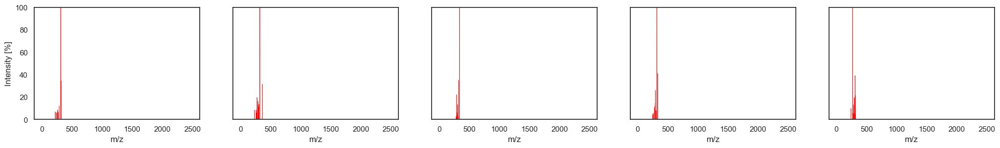

Matching spectra using eu_dist


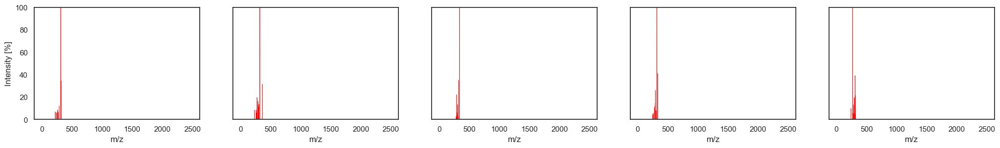

Matching spectra using per_diff


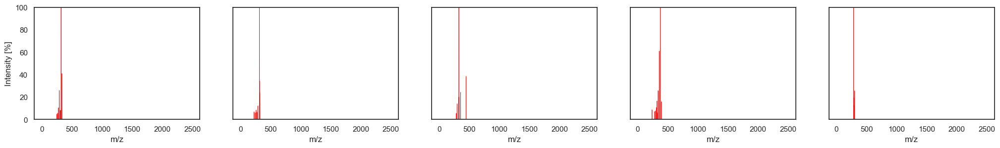

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.998536
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.998383
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.998260
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.998229
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.998060


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
58880,SAADBVWGJQAEFS-UHFFFAOYSA-N,130.0644:0.935783 131.0722:1.947116 134.0393:1.670423 150.0095:0.716033 162.0342:0.742820 166.041:1.816709 191.0363:0.859111 209.0628:0.646900 211.078:0.608724 224.0858:0.966741 225.0942:6.790924 ...,40.0,1,0.054117
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.056872
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.058997
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.059517
8126,UWTOESDPWKUNBD-UHFFFAOYSA-N,34.9681:2.179179 34.9712:1.189189 75.0067:1.129129 153.9801:1.186186 182.0237:1.443443 182.0391:1.135135 188.0087:1.114114 196.9989:1.565566 202.9886:2.235235 203.9951:1.605606 214.9903:1.087087 2...,40.0,0,0.062287


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
103104,PLAPMLGJVGLZOV-UHFFFAOYSA-N,121.03223:0.700000 129.03484:0.600000 133.02469:1.300000 143.04944:1.000000 145.02763:1.000000 148.01517:0.600000 148.02248:0.600000 149.0278:2.100000 151.00305:1.000000 162.02643:0.500000 163.044...,10.0,0,0.083773
86240,JEZNLIICYHTXFL-UHFFFAOYSA-N,103.052528:0.118901 105.034416:0.155590 105.068634:0.230682 106.040131:0.298460 115.052162:0.295913 125.985817:1.414391 126.044693:0.114661 127.053169:0.255097 128.059311:0.218700 134.035751:2.739...,NaN,1,0.088331
68337,RZEKVGVHFLEQIL-UHFFFAOYSA-N,184.0357:0.748532 185.0436:1.046967 207.1028:1.844423 208.1044:0.513699 233.1066:1.183953 261.0779:0.611546 262.0903:0.782779 263.0965:0.924658 267.0739:0.557730 275.0785:1.345401 281.089:2.221135...,30.0,1,0.090083
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.090255
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.092150


Intermediate spectrum


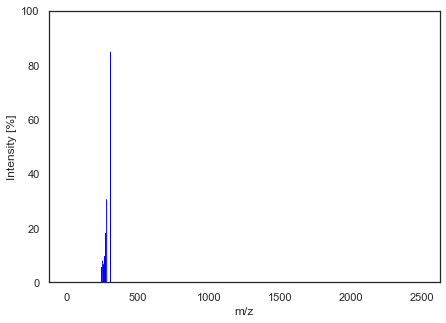

Matching spectra using cos_sim


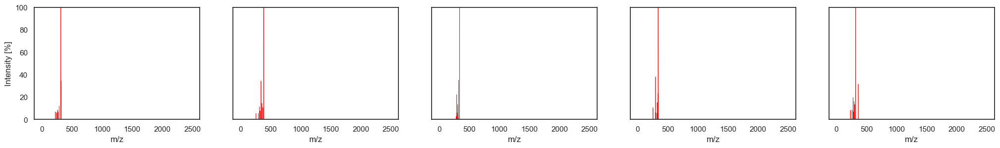

Matching spectra using eu_dist


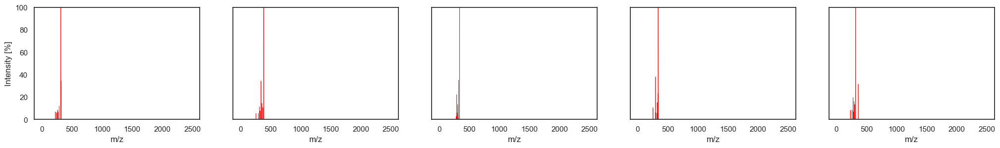

Matching spectra using per_diff


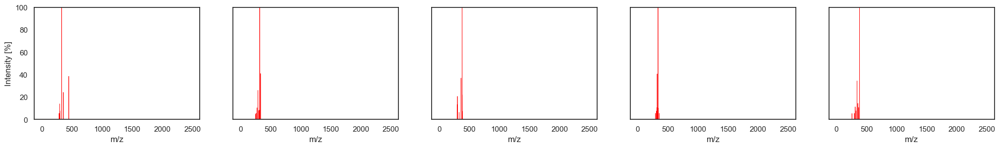

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.998565
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.998293
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.998166
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.998099
24247,VRHZMFGDDGFRLP-UHFFFAOYSA-N,174.97:4.147900 197.97:1.997015 223.97:1.665870 241.09:3.039136 253.16:1.147154 257.04:7.292278 275.09:3.320067 283.11:3.441967 289.17:3.877608 293.12:4.988522 299.1:2.402506 301.97:10.764729 317....,35.0,1,0.998002


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.053576
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.058439
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.060567
101747,NXDWTJAHANXBEB-UHFFFAOYSA-N,59.048935:0.475044 60.079601:0.264495 71.083862:0.188472 80.948753:0.968119 83.084091:0.275890 84.959877:0.198323 86.059494:0.241735 88.076546:0.114006 144.080688:0.200012 145.090729:0.188514 149....,NaN,1,0.061664
24247,VRHZMFGDDGFRLP-UHFFFAOYSA-N,174.97:4.147900 197.97:1.997015 223.97:1.665870 241.09:3.039136 253.16:1.147154 257.04:7.292278 275.09:3.320067 283.11:3.441967 289.17:3.877608 293.12:4.988522 299.1:2.402506 301.97:10.764729 317....,35.0,1,0.063210


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
121641,BUUGGTNVRUBNGN-UHFFFAOYSA-O,57.830292:0.777604 59.855385:0.747824 65.172836:0.654025 66.987793:0.732878 68.184143:1.552553 115.054436:0.809577 128.063675:1.019897 155.060928:2.979836 155.471222:0.816547 183.055481:0.922414 1...,NaN,1,0.080879
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.081307
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.084888
93286,LKMNXYDUQXAUCZ-UHFFFAOYSA-N,50.124111:0.002093 50.299410:0.000430 50.307276:0.001593 50.322948:0.000367 50.378764:0.000557 50.472247:0.000513 50.493794:0.000384 50.521131:0.000594 50.527334:0.000368 50.538743:0.001024 50.554...,35.0,1,0.089893
68337,RZEKVGVHFLEQIL-UHFFFAOYSA-N,184.0357:0.748532 185.0436:1.046967 207.1028:1.844423 208.1044:0.513699 233.1066:1.183953 261.0779:0.611546 262.0903:0.782779 263.0965:0.924658 267.0739:0.557730 275.0785:1.345401 281.089:2.221135...,30.0,1,0.090516


Intermediate spectrum


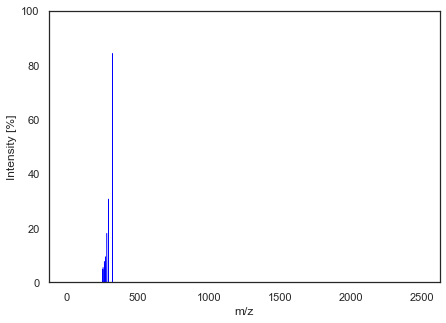

Matching spectra using cos_sim


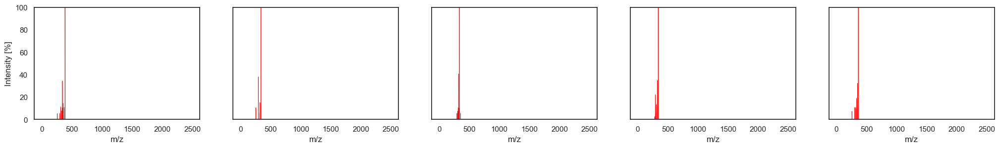

Matching spectra using eu_dist


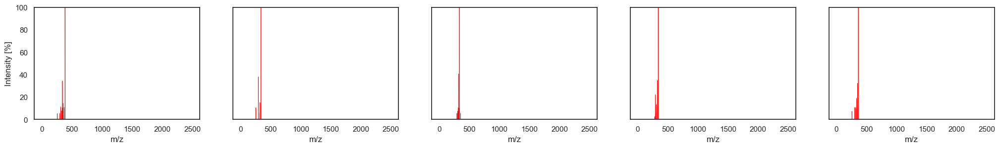

Matching spectra using per_diff


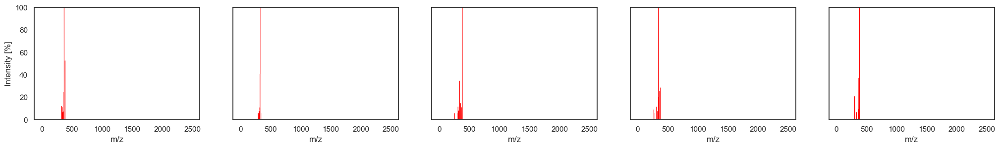

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.998472
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.998165
77331,YEFOAORQXAOVJQ-UHFFFAOYSA-N,115.70368:0.500000 199.08908:0.500000 255.10023:0.600000 271.10019:1.400000 272.10495:1.600000 274.07156:0.700000 282.09222:0.500000 283.09937:1.100000 284.1026:0.700000 285.07681:0.500000 285.109...,10.0,1,0.998122
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.998104
18229,DQNIDSLDXGTEPL-UHFFFAOYSA-N,109.0288:1.905906 133.0308:1.507508 256.0652:1.055055 259.1321:4.947948 283.0970:1.118118 285.1120:7.909910 297.1133:7.323323 299.1253:4.996997 338.0765:8.066066 347.1650:2.038038 363.1482:1.18718...,20.0,0,0.997976


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.055273
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.060577
77331,YEFOAORQXAOVJQ-UHFFFAOYSA-N,115.70368:0.500000 199.08908:0.500000 255.10023:0.600000 271.10019:1.400000 272.10495:1.600000 274.07156:0.700000 282.09222:0.500000 283.09937:1.100000 284.1026:0.700000 285.07681:0.500000 285.109...,10.0,1,0.061286
37341,JJOLHRYZQSDLSA-UHFFFAOYSA-N,50.217680:0.008904 50.502584:0.009021 51.187730:0.007431 52.563271:0.009096 52.724419:0.008076 53.603961:0.009661 54.256996:0.009315 54.347353:0.009971 54.451610:0.008899 54.853660:0.008408 54.970...,35.0,0,0.061573
18229,DQNIDSLDXGTEPL-UHFFFAOYSA-N,109.0288:1.905906 133.0308:1.507508 256.0652:1.055055 259.1321:4.947948 283.0970:1.118118 285.1120:7.909910 297.1133:7.323323 299.1253:4.996997 338.0765:8.066066 347.1650:2.038038 363.1482:1.18718...,20.0,0,0.063621


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
121641,BUUGGTNVRUBNGN-UHFFFAOYSA-O,57.830292:0.777604 59.855385:0.747824 65.172836:0.654025 66.987793:0.732878 68.184143:1.552553 115.054436:0.809577 128.063675:1.019897 155.060928:2.979836 155.471222:0.816547 183.055481:0.922414 1...,NaN,1,0.073136
36414,PBKZJIMGHNPKBJ-UHFFFAOYSA-N,50.377781:0.005192 50.471752:0.005625 50.637140:0.004520 51.359575:0.006236 51.380547:0.005167 51.707650:0.007105 52.097967:0.005779 52.237743:0.005633 52.749041:0.005686 52.783621:0.014583 53.154...,35.0,1,0.080758
77331,YEFOAORQXAOVJQ-UHFFFAOYSA-N,115.70368:0.500000 199.08908:0.500000 255.10023:0.600000 271.10019:1.400000 272.10495:1.600000 274.07156:0.700000 282.09222:0.500000 283.09937:1.100000 284.1026:0.700000 285.07681:0.500000 285.109...,10.0,1,0.084926
8754,JGGWNGRBXJWAOC-UHFFFAOYSA-N,175.0:1.432356 201.04:4.902426 257.07:5.272633 271.08:3.719246 282.15:1.264436 297.05:5.489417 309.13:0.988243 312.16:11.268303 322.17:3.618911 325.16:7.716542 327.19:4.117754 337.2:3.953344 340.0...,35.0,0,0.088103
24247,VRHZMFGDDGFRLP-UHFFFAOYSA-N,174.97:4.147900 197.97:1.997015 223.97:1.665870 241.09:3.039136 253.16:1.147154 257.04:7.292278 275.09:3.320067 283.11:3.441967 289.17:3.877608 293.12:4.988522 299.1:2.402506 301.97:10.764729 317....,35.0,1,0.091288


Intermediate spectrum


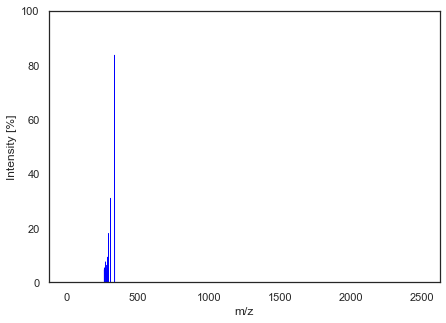

Matching spectra using cos_sim


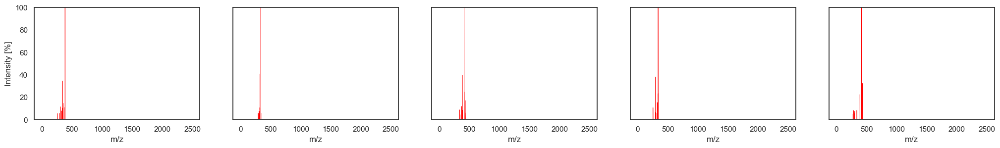

Matching spectra using eu_dist


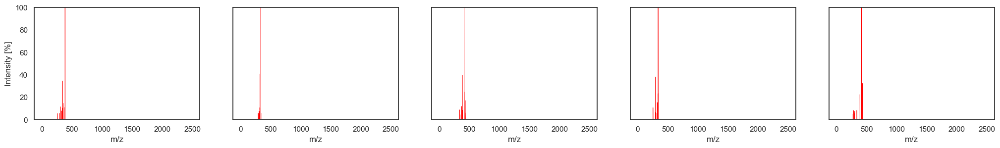

Matching spectra using per_diff


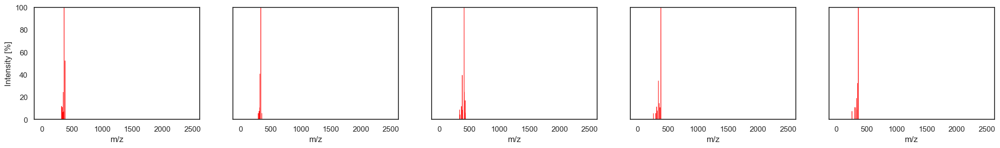

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.998789
45385,ZRJBHWIHUMBLCN-UHFFFAOYSA-N,51.026585:0.025536 53.039814:0.081486 53.071415:0.011965 53.313461:0.011161 54.030811:0.016557 55.018684:0.198280 55.053684:0.143022 55.075577:0.024865 55.093845:0.016347 55.370338:0.011558 56.049...,NaN,1,0.998203
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.998200
121185,BOJKFRKNLSCGHY-HXGSDTCMSA-N,57.070530:2.488552 63.899502:1.047031 65.948532:6.916057 65.952515:8.412877 66.717484:1.032483 69.034256:2.544765 69.070694:2.303113 83.086212:3.961453 93.070488:2.010955 93.976357:1.134742 95.086...,NaN,1,0.998020
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.997720


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.049220
45385,ZRJBHWIHUMBLCN-UHFFFAOYSA-N,51.026585:0.025536 53.039814:0.081486 53.071415:0.011965 53.313461:0.011161 54.030811:0.016557 55.018684:0.198280 55.053684:0.143022 55.075577:0.024865 55.093845:0.016347 55.370338:0.011558 56.049...,NaN,1,0.059951
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.059990
121185,BOJKFRKNLSCGHY-HXGSDTCMSA-N,57.070530:2.488552 63.899502:1.047031 65.948532:6.916057 65.952515:8.412877 66.717484:1.032483 69.034256:2.544765 69.070694:2.303113 83.086212:3.961453 93.070488:2.010955 93.976357:1.134742 95.086...,NaN,1,0.062920
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.067529


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
86499,OGJKMZVUJJYWKO-UHFFFAOYSA-N,59.048557:0.449695 60.032799:0.733239 60.044117:8.419230 69.032921:1.833076 72.044807:1.231391 73.048286:0.305687 75.044022:2.362680 80.945015:0.516221 85.093933:0.408897 89.058647:1.547254 91.052...,NaN,1,0.071248
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.076118
12911,AJAGLPDYKVWJQE-SQGFOMTPSA-N,50.924802:0.062376 52.067075:0.029262 52.806057:0.048454 53.222748:0.063072 53.395400:0.039261 54.724988:0.056875 54.944487:0.070886 55.300190:0.044979 55.398062:0.045389 55.596125:0.053735 55.762...,45.0,0,0.087440
121185,BOJKFRKNLSCGHY-HXGSDTCMSA-N,57.070530:2.488552 63.899502:1.047031 65.948532:6.916057 65.952515:8.412877 66.717484:1.032483 69.034256:2.544765 69.070694:2.303113 83.086212:3.961453 93.070488:2.010955 93.976357:1.134742 95.086...,NaN,1,0.087934
86782,XPOQHMRABVBWPR-UHFFFAOYSA-N,151.9892:8.052434 161.0219:9.222846 200.0254:14.653558 202.005:4.588015 202.0162:6.320225 208.0376:8.473783 214.0442:5.664794 216.0218:15.449438 217.023:5.383895 218.0167:6.320225 221.9907:11.0018...,20.0,0,0.091080


Intermediate spectrum


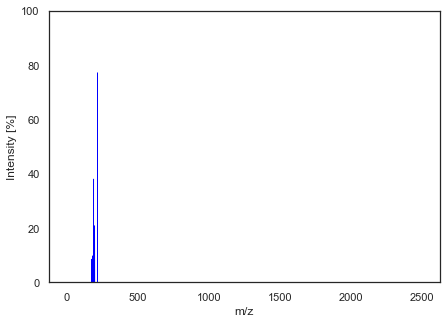

Matching spectra using cos_sim


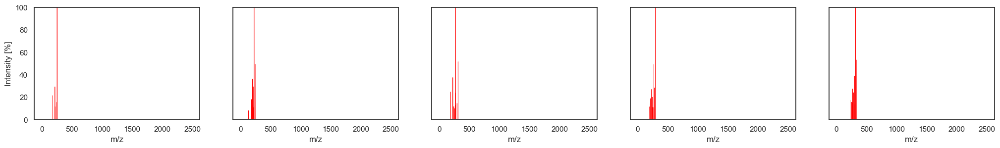

Matching spectra using eu_dist


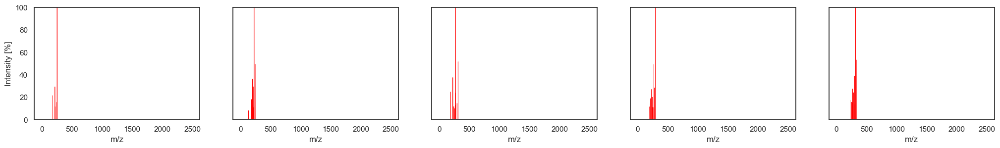

Matching spectra using per_diff


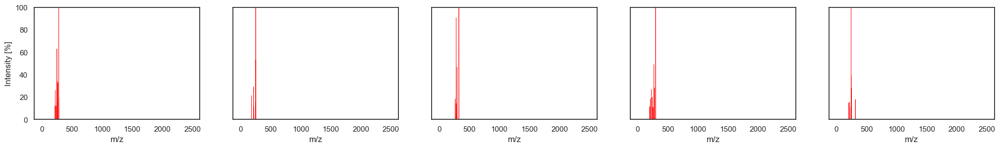

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.998730
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.998216
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998065
45385,ZRJBHWIHUMBLCN-UHFFFAOYSA-N,51.026585:0.025536 53.039814:0.081486 53.071415:0.011965 53.313461:0.011161 54.030811:0.016557 55.018684:0.198280 55.053684:0.143022 55.075577:0.024865 55.093845:0.016347 55.370338:0.011558 56.049...,NaN,1,0.997937
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.997895


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.050407
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.059724
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.062216
45385,ZRJBHWIHUMBLCN-UHFFFAOYSA-N,51.026585:0.025536 53.039814:0.081486 53.071415:0.011965 53.313461:0.011161 54.030811:0.016557 55.018684:0.198280 55.053684:0.143022 55.075577:0.024865 55.093845:0.016347 55.370338:0.011558 56.049...,NaN,1,0.064228
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.064884


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
86499,OGJKMZVUJJYWKO-UHFFFAOYSA-N,59.048557:0.449695 60.032799:0.733239 60.044117:8.419230 69.032921:1.833076 72.044807:1.231391 73.048286:0.305687 75.044022:2.362680 80.945015:0.516221 85.093933:0.408897 89.058647:1.547254 91.052...,NaN,1,0.075235
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.078452
121185,BOJKFRKNLSCGHY-HXGSDTCMSA-N,57.070530:2.488552 63.899502:1.047031 65.948532:6.916057 65.952515:8.412877 66.717484:1.032483 69.034256:2.544765 69.070694:2.303113 83.086212:3.961453 93.070488:2.010955 93.976357:1.134742 95.086...,NaN,1,0.088911
31651,CQLRUIIRRZYHHS-UHFFFAOYSA-N,107.0141:0.500000 151.00255:4.100000 153.01701:0.700000 163.00449:0.900000 165.01967:0.600000 177.05418:0.700000 189.00955:0.600000 199.04028:1.200000 204.04472:1.400000 205.05042:1.100000 206.021...,30.0,0,0.090891
103372,RVOWLPGDGHUGHV-UHFFFAOYSA-N,70.001122:0.159566 70.995903:0.096124 71.012611:0.066902 73.388939:0.092664 78.045517:0.057675 78.403664:0.100354 80.433792:0.065749 83.245140:0.050369 83.571510:0.098816 84.019058:0.102276 84.300...,NaN,1,0.093219


Intermediate spectrum


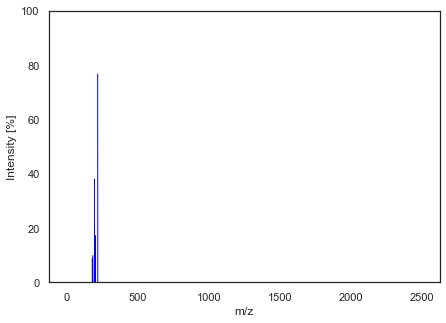

Matching spectra using cos_sim


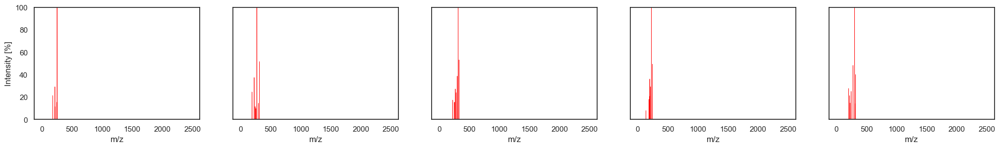

Matching spectra using eu_dist


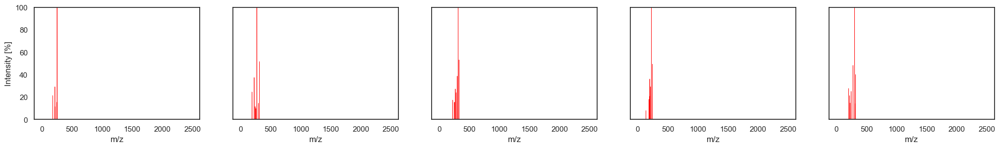

Matching spectra using per_diff


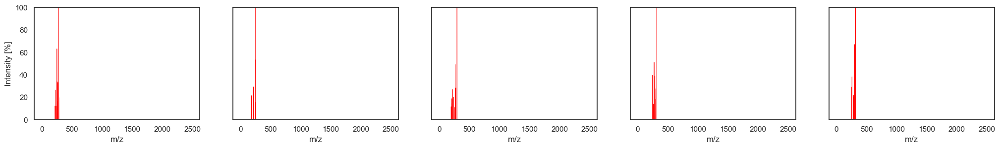

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.998564
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998417
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.998134
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.998115
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.998026


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.053593
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.056271
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.061084
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.061400
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.062829


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
31651,CQLRUIIRRZYHHS-UHFFFAOYSA-N,107.0141:0.500000 151.00255:4.100000 153.01701:0.700000 163.00449:0.900000 165.01967:0.600000 177.05418:0.700000 189.00955:0.600000 199.04028:1.200000 204.04472:1.400000 205.05042:1.100000 206.021...,30.0,0,0.081647
86499,OGJKMZVUJJYWKO-UHFFFAOYSA-N,59.048557:0.449695 60.032799:0.733239 60.044117:8.419230 69.032921:1.833076 72.044807:1.231391 73.048286:0.305687 75.044022:2.362680 80.945015:0.516221 85.093933:0.408897 89.058647:1.547254 91.052...,NaN,1,0.083930
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.085398
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.085596
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.086728


Intermediate spectrum


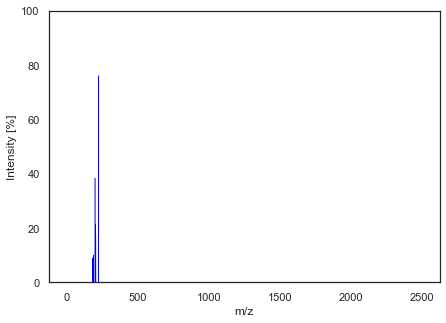

Matching spectra using cos_sim


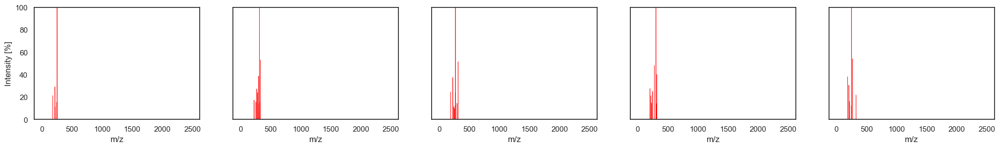

Matching spectra using eu_dist


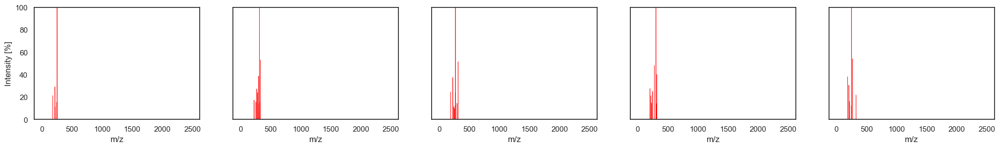

Matching spectra using per_diff


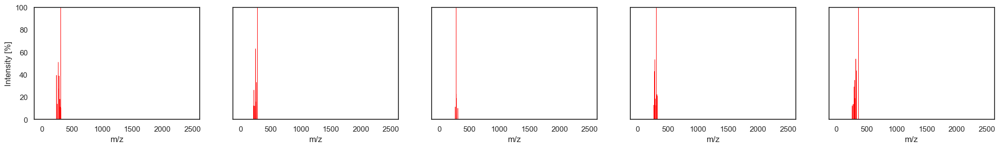

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998659
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.998262
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.998222
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.998059
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.997923


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.051791
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.058961
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.059629
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.062313
82628,HESZUPIXRNZIOI-UHFFFAOYSA-N,192.0681:24.482045 193.071:2.732143 226.0288:0.654860 227.0371:37.377183 228.0399:4.004131 229.0342:8.039043 244.0636:11.476688 245.0661:1.733717 246.0605:3.251960 253.0528:9.743964 255.0499:2.817...,30.0,1,0.064451


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.073074
31651,CQLRUIIRRZYHHS-UHFFFAOYSA-N,107.0141:0.500000 151.00255:4.100000 153.01701:0.700000 163.00449:0.900000 165.01967:0.600000 177.05418:0.700000 189.00955:0.600000 199.04028:1.200000 204.04472:1.400000 205.05042:1.100000 206.021...,30.0,0,0.077181
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.077567
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.078391
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.086941


Intermediate spectrum


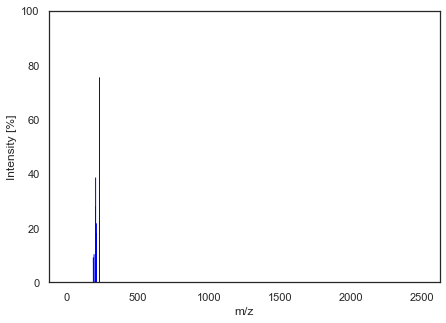

Matching spectra using cos_sim


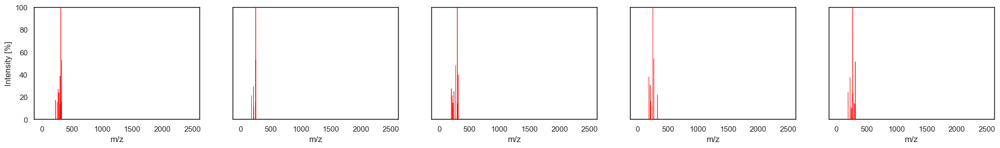

Matching spectra using eu_dist


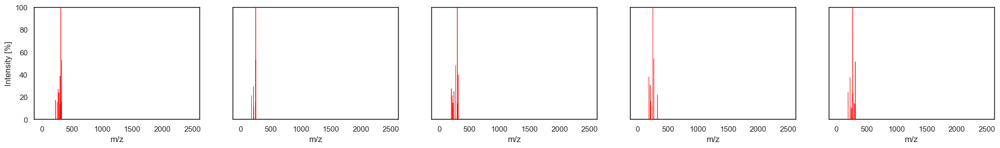

Matching spectra using per_diff


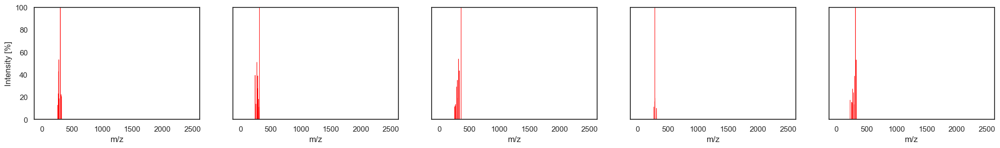

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998774
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.998208
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.997967
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.997867
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.997816


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.049523
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.059873
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.063767
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.065309
97901,HUWXDEQWWKGHRV-UHFFFAOYSA-N,127.0168:0.682485 154.0634:3.189182 155.07:0.924863 181.0749:9.127440 182.0829:21.335630 183.0855:2.691670 188.0233:0.676107 189.0311:0.727134 190.0405:5.255772 191.045:0.759025 192.0384:1.473402 ...,NaN,1,0.066099


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.067375
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.072775
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.075236
31651,CQLRUIIRRZYHHS-UHFFFAOYSA-N,107.0141:0.500000 151.00255:4.100000 153.01701:0.700000 163.00449:0.900000 165.01967:0.600000 177.05418:0.700000 189.00955:0.600000 199.04028:1.200000 204.04472:1.400000 205.05042:1.100000 206.021...,30.0,0,0.078585
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.082454


Intermediate spectrum


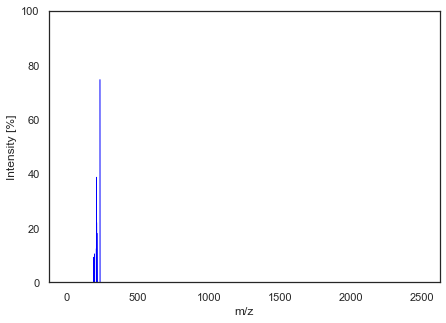

Matching spectra using cos_sim


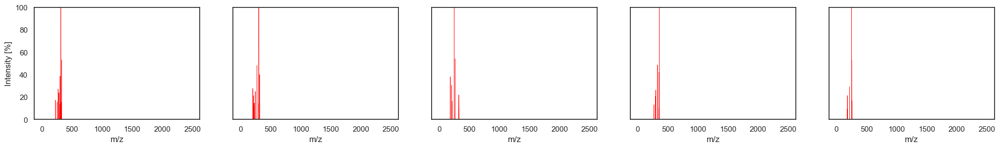

Matching spectra using eu_dist


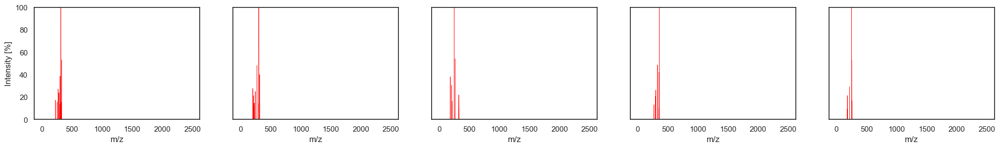

Matching spectra using per_diff


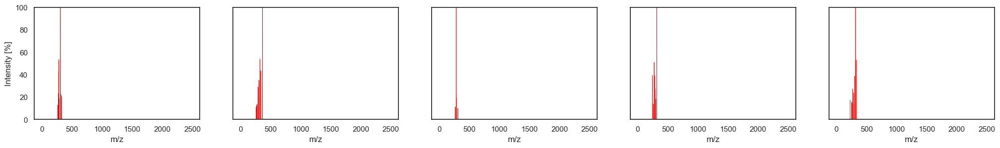

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998740
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.998149
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.998046
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.997909
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.997758


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.050205
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.060842
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.062508
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.064671
36859,JNELTBHOLOQEJH-LPULDKDHSA-N,50.497874:0.019753 51.248127:0.014304 51.772335:0.018999 53.038980:0.045521 53.197573:0.012124 53.855291:0.020904 54.125099:0.013203 54.265045:0.020566 54.581138:0.016447 55.018168:0.374211 55.054...,35.0,1,0.066961


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.069099
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.071482
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.075651
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.079272
31651,CQLRUIIRRZYHHS-UHFFFAOYSA-N,107.0141:0.500000 151.00255:4.100000 153.01701:0.700000 163.00449:0.900000 165.01967:0.600000 177.05418:0.700000 189.00955:0.600000 199.04028:1.200000 204.04472:1.400000 205.05042:1.100000 206.021...,30.0,0,0.080440


Intermediate spectrum


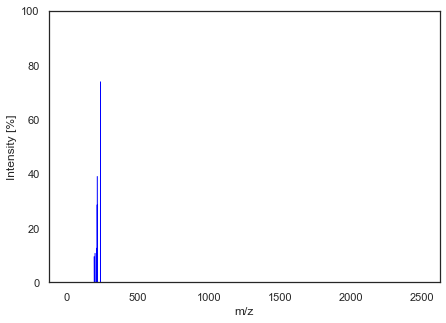

Matching spectra using cos_sim


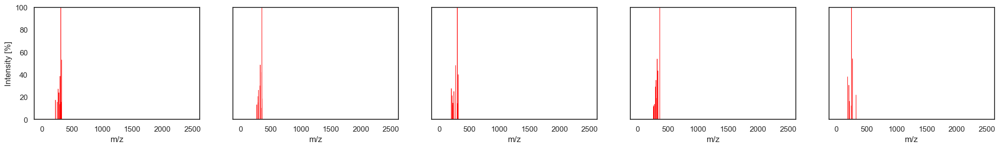

Matching spectra using eu_dist


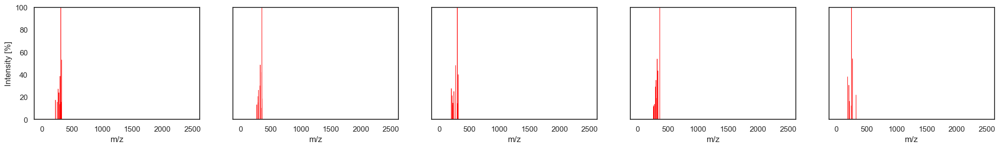

Matching spectra using per_diff


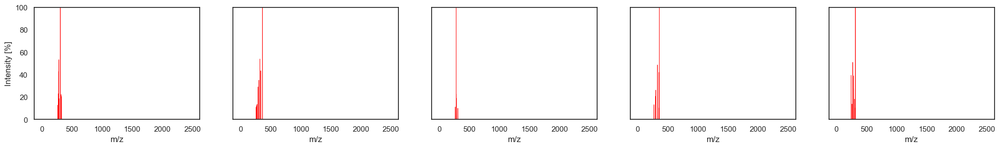

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998567
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.998289
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.998145
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.997780
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.997749


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.053534
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.058502
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.060913
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.066637
77235,CCQDWIRWKWIUKK-UHFFFAOYSA-O,81.03384:1.800000 85.02776:1.100000 91.06053:0.600000 120.05508:0.700000 126.02567:2.200000 134.03772:1.700000 135.03793:0.600000 138.03888:1.000000 140.04523:0.700000 147.04799:0.700000 148.05907...,50.0,1,0.067096


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.072152
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.073277
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.073515
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.076141
17911,OWNRDLYPIYHOQK-UHFFFAOYSA-N,133.97:4.497440 269.05:18.759764 271.03:24.240372 284.1:15.496517 297.06:19.284570 300.06:48.469218 312.18:100.000000 315.1:22.484075 315.12:30.255111 325.05:50.239532 340.28:6.867897 344.17:11.27...,35.0,1,0.079108


Intermediate spectrum


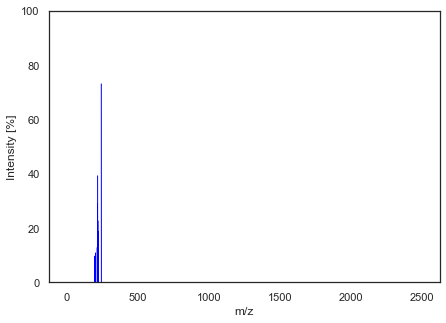

Matching spectra using cos_sim


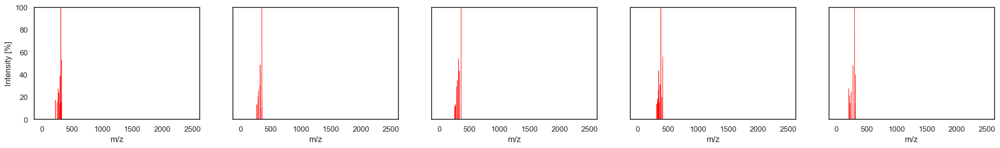

Matching spectra using eu_dist


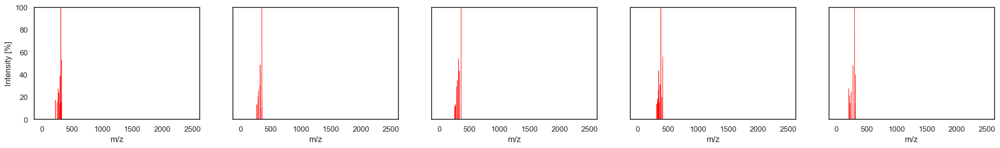

Matching spectra using per_diff


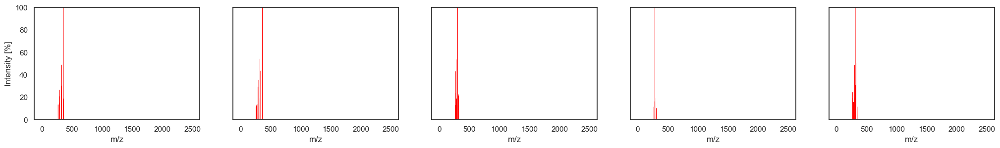

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.998300
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.998274
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.998249
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.998169
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.998076


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.058311
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.058752
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.059184
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.060507
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.062025


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.069918
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.075939
17911,OWNRDLYPIYHOQK-UHFFFAOYSA-N,133.97:4.497440 269.05:18.759764 271.03:24.240372 284.1:15.496517 297.06:19.284570 300.06:48.469218 312.18:100.000000 315.1:22.484075 315.12:30.255111 325.05:50.239532 340.28:6.867897 344.17:11.27...,35.0,1,0.077113
73908,FKMASXTUONWHBB-UHFFFAOYSA-N,50.953633:0.049287 51.940369:0.020293 52.653613:0.007022 53.002513:0.009052 53.038961:0.034664 53.150941:0.010192 53.327411:0.036831 53.335300:0.007400 53.379487:0.014995 54.219350:0.034305 54.285...,45.0,1,0.078755
94464,NBFGYDJKTHENDP-UHFFFAOYSA-N,256.07031:8.600000 268.05148:11.200000 281.03235:16.000000 281.05542:9.700000 282.05432:100.000000 283.05783:34.600000 283.06757:11.500000 284.05383:42.000000 284.07166:22.700000 285.03473:8.90000...,10.0,1,0.078765


Intermediate spectrum


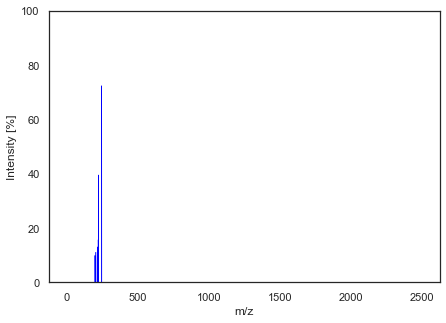

Matching spectra using cos_sim


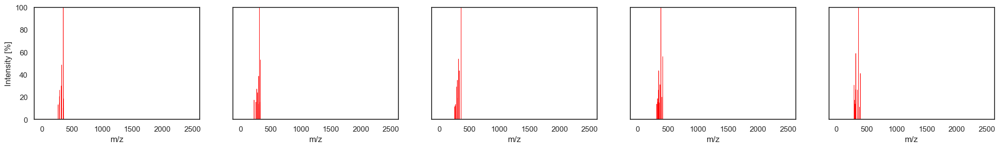

Matching spectra using eu_dist


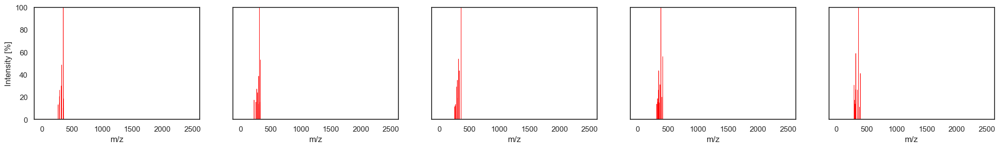

Matching spectra using per_diff


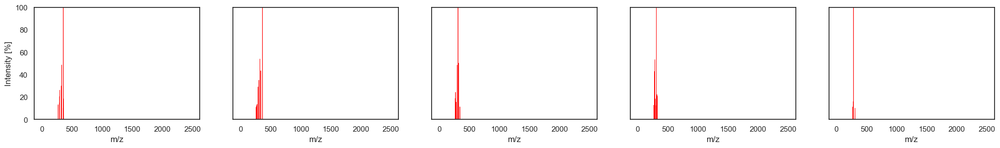

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_8
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.998423
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.998330
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.998249
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.998200
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.997927


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_8
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.056158
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.057797
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.059178
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.060003
65165,PVHUJELLJLJGLN-UHFFFAOYSA-N,140.069:1.286934 150.0163:0.516787 166.085:1.646001 168.0799:1.233242 171.1031:0.750013 176.0333:0.760080 180.0794:0.637595 181.0872:0.808738 182.0949:1.496669 183.1026:2.573869 184.1075:0.540278 ...,30.0,1,0.064394


,id,spectrum,collision_energy,ionization_mode_id,per_diff_8
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.068498
94837,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.0667:0.900000 72.04399:3.900000 107.04957:1.400000 136.07744:3.700000 137.05418:0.800000 137.0616:1.300000 148.07538:0.800000 151.07549:0.800000 175.07568:0.600000 181.08678:4.000000 188.07808:...,30.0,1,0.072157
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.074599
17911,OWNRDLYPIYHOQK-UHFFFAOYSA-N,133.97:4.497440 269.05:18.759764 271.03:24.240372 284.1:15.496517 297.06:19.284570 300.06:48.469218 312.18:100.000000 315.1:22.484075 315.12:30.255111 325.05:50.239532 340.28:6.867897 344.17:11.27...,35.0,1,0.076197
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.079215


Intermediate spectrum


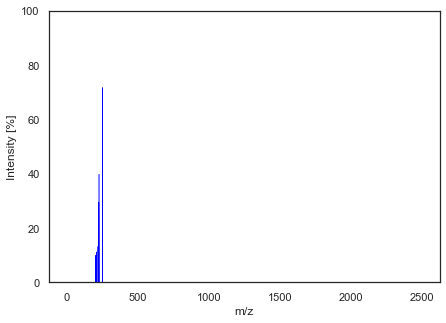

Matching spectra using cos_sim


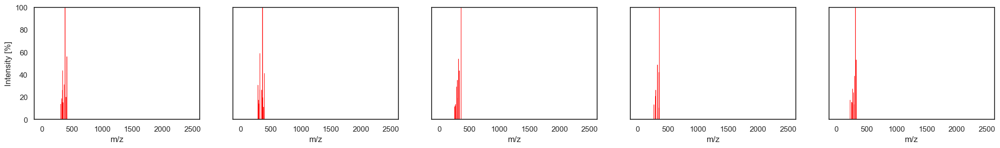

Matching spectra using eu_dist


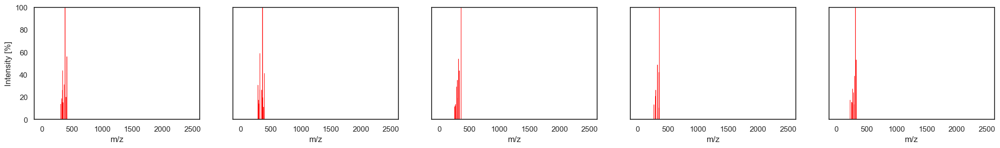

Matching spectra using per_diff


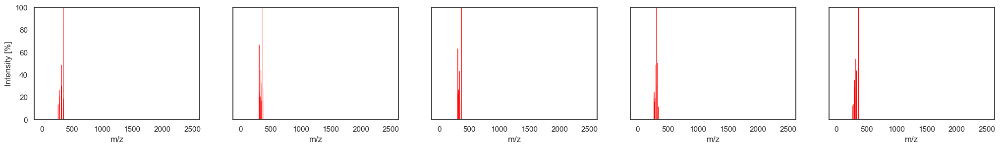

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_9
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.998617
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.998502
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.998254
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.998176
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.998021


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_9
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.052589
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.054731
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.059093
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.060403
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.062917


,id,spectrum,collision_energy,ionization_mode_id,per_diff_9
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.067084
94837,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.0667:0.900000 72.04399:3.900000 107.04957:1.400000 136.07744:3.700000 137.05418:0.800000 137.0616:1.300000 148.07538:0.800000 151.07549:0.800000 175.07568:0.600000 181.08678:4.000000 188.07808:...,30.0,1,0.068409
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.070943
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.076762
17911,OWNRDLYPIYHOQK-UHFFFAOYSA-N,133.97:4.497440 269.05:18.759764 271.03:24.240372 284.1:15.496517 297.06:19.284570 300.06:48.469218 312.18:100.000000 315.1:22.484075 315.12:30.255111 325.05:50.239532 340.28:6.867897 344.17:11.27...,35.0,1,0.078399


Intermediate spectrum


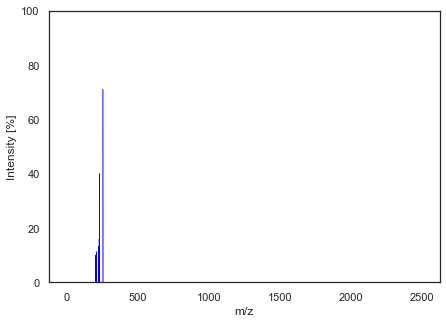

Matching spectra using cos_sim


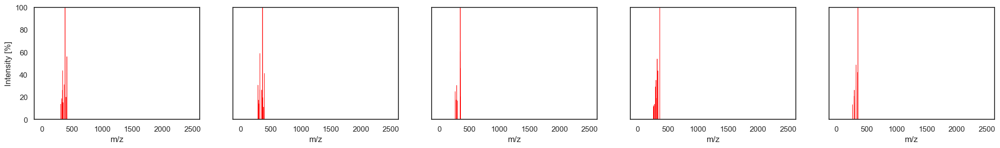

Matching spectra using eu_dist


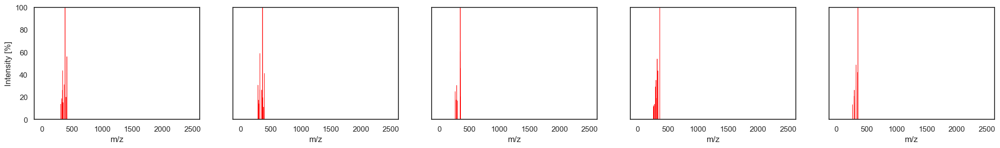

Matching spectra using per_diff


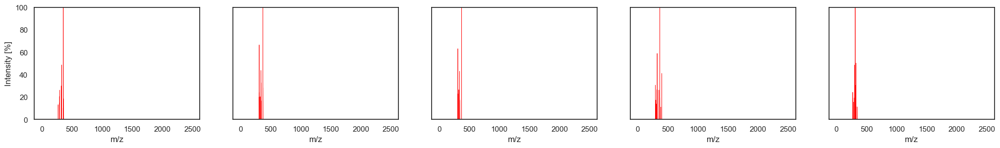

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_10
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.998836
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.998619
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.998373
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.998074
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.998051


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_10
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.048253
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.052553
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.057050
67658,RTDRYYULUYRTAN-UHFFFAOYSA-N,246.0631:5.161290 260.0837:10.967742 262.09:4.301075 263.1014:12.258065 275.0671:13.548387 276.075:9.677419 289.0885:13.548387 291.1002:29.032258 293.1184:4.946237 303.0663:35.053763 307.0922:18.7...,20.0,1,0.062072
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.062438


,id,spectrum,collision_energy,ionization_mode_id,per_diff_10
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.061745
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.067880
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.071176
94837,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.0667:0.900000 72.04399:3.900000 107.04957:1.400000 136.07744:3.700000 137.05418:0.800000 137.0616:1.300000 148.07538:0.800000 151.07549:0.800000 175.07568:0.600000 181.08678:4.000000 188.07808:...,30.0,1,0.074814
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.075702


Intermediate spectrum


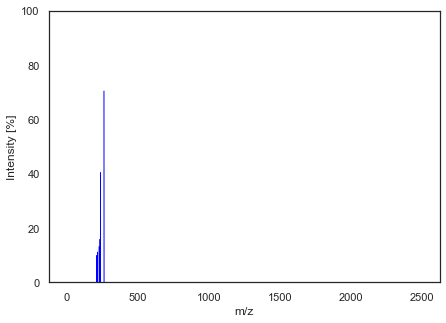

Matching spectra using cos_sim


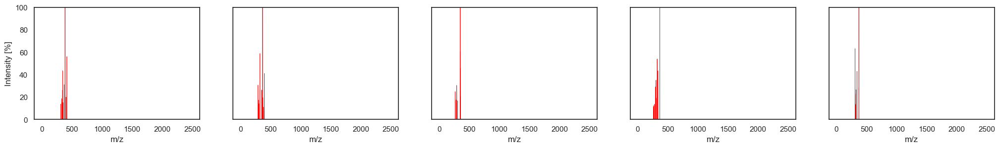

Matching spectra using eu_dist


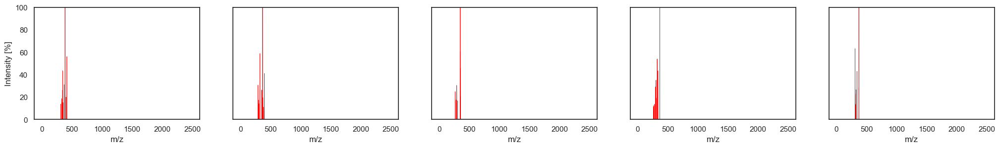

Matching spectra using per_diff


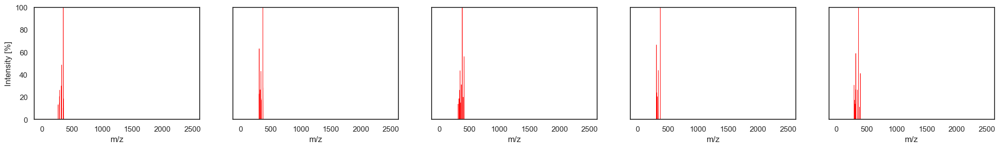

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_11
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.998946
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.998621
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.998362
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.998158
31713,ACRIYYKEWCXQOS-XAYOXWHSSA-N,73.027481:1.671354 75.078926:0.063671 79.222122:0.199350 79.811623:0.136437 80.342384:0.252408 83.159332:0.239523 85.027374:1.298426 89.625908:0.196318 93.905693:0.188738 98.030754:0.224363 103.03...,NaN,1,0.998077


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_11
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.045900
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.052517
43985,VCNDHJFYRZQMHX-KPKJPENVSA-N,49.999167:0.010444 50.622000:0.014113 50.652607:0.017930 51.238505:0.028582 51.488954:0.035976 51.935329:0.044510 51.982994:0.048873 52.106195:0.029012 52.319306:0.019930 52.400262:0.038992 52.526...,35.0,1,0.057230
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.060688
31713,ACRIYYKEWCXQOS-XAYOXWHSSA-N,73.027481:1.671354 75.078926:0.063671 79.222122:0.199350 79.811623:0.136437 80.342384:0.252408 83.159332:0.239523 85.027374:1.298426 89.625908:0.196318 93.905693:0.188738 98.030754:0.224363 103.03...,NaN,1,0.062016


,id,spectrum,collision_energy,ionization_mode_id,per_diff_11
8797,YEFOAORQXAOVJQ-RZFZLAGVSA-N,115.0601:1.032032 148.9976:1.699700 149.0548:1.263263 152.3501:1.807808 177.0851:1.005005 201.0911:1.755756 222.1115:1.049049 233.0985:1.435435 242.0952:1.126126 264.1373:1.011011 270.0797:1.10910...,20.0,1,0.060365
93314,RWCVSDKDFSVZNF-KRYGIPSASA-N,50.098576:0.047838 50.299094:0.062634 50.736878:0.060604 50.985482:0.054394 52.492673:0.073978 52.883799:0.058412 52.948724:0.061403 53.137232:0.057824 53.267978:0.056480 53.485116:0.056938 54.226...,45.0,0,0.064433
94845,SOFSXTKPGSIDCI-UHFFFAOYSA-N,70.06741:2.000000 72.04134:1.100000 72.04695:3.000000 74.05634:1.000000 107.04792:3.700000 107.05585:1.100000 136.07892:3.400000 137.06041:2.400000 151.07401:0.900000 181.08832:3.900000 190.08644:...,30.0,1,0.069051
99408,XJTXBUKLGQCZHC-XFQAVAEZSA-N,71.238846:0.169942 79.021309:0.894045 82.882973:0.384218 95.560379:0.437417 121.846306:0.404906 122.231148:0.534949 126.357445:0.277819 134.296143:0.297030 142.230011:0.193587 148.310165:0.205409 ...,NaN,1,0.076156
30846,DDUHZTYCFQRHIY-RBHXEPJQSA-N,178.91:1.518452 237.08:3.465766 247.15:8.160807 253.01:3.779081 269.09:2.508041 271.13:4.558844 274.16:12.344183 279.13:5.305690 282.23:7.934918 286.15:8.899518 295.04:17.104038 310.24:5.381956 31...,35.0,1,0.078993


Intermediate spectrum


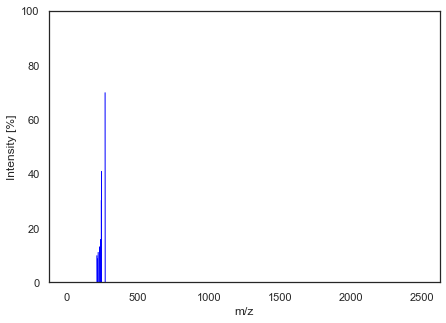

Matching spectra using cos_sim


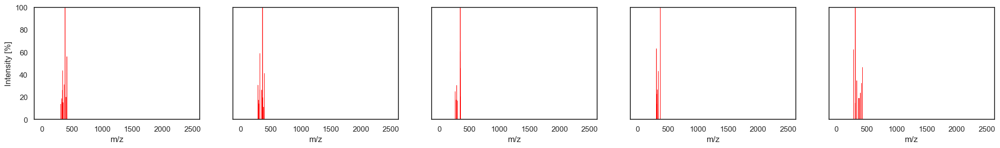

Matching spectra using eu_dist


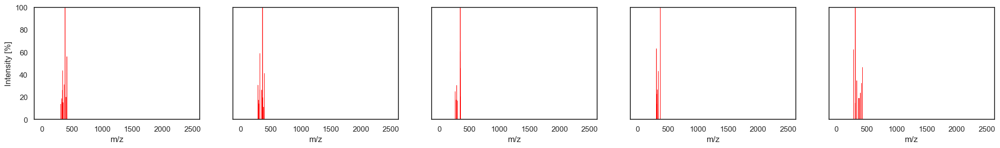

Matching spectra using per_diff


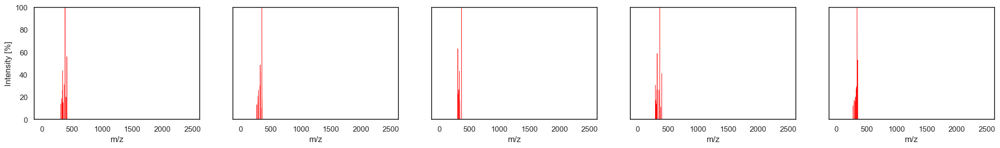

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_0
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.994040
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.993301
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.992632
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.992490
58790,DBEPLOCGEIEOCV-WSBQPABSSA-N,57.0695:1.358438 69.0332:1.398676 72.0441:1.563617 81.0695:0.747557 95.0857:1.684663 98.0603:0.537389 121.1014:0.594919 175.1471:1.164898 189.1634:0.542710 220.1694:0.630834 255.1744:0.698673 272....,NaN,1,0.992352


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_0
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.109182
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.115747
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.121391
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.122555
58790,DBEPLOCGEIEOCV-WSBQPABSSA-N,57.0695:1.358438 69.0332:1.398676 72.0441:1.563617 81.0695:0.747557 95.0857:1.684663 98.0603:0.537389 121.1014:0.594919 175.1471:1.164898 189.1634:0.542710 220.1694:0.630834 255.1744:0.698673 272....,NaN,1,0.123673


,id,spectrum,collision_energy,ionization_mode_id,per_diff_0
9161,QZZMDINWSWWNKM-UHFFFAOYSA-N,100.182007:0.000645 100.344673:0.000404 100.470970:0.000291 100.562584:0.000504 100.678017:0.000400 100.837578:0.003801 101.015846:0.000574 101.354004:0.000439 101.449173:0.000430 101.515404:0.000...,NaN,0,0.222630
108918,FGHPDPYCRTXYNZ-OZCXRYMJSA-N,74.3645:1.838551 75.35423:1.938366 93.22564:1.569818 93.42065:1.670331 103.65163:1.590060 108.23948:1.490943 114.70055:1.823893 117.5423:1.783408 120.96636:11.170907 126.23511:1.950232 145.99841:2...,0.0,1,0.225160
60212,DIWRORZWFLOCLC-UHFFFAOYSA-N,51.02131:0.054349 93.0563:0.706531 99.00635:0.054349 100.01711:0.135224 102.0342:0.263332 111.00072:0.363618 117.03932:0.027174 118.04961:0.108697 126.00137:0.054349 126.00768:0.081523 128.02425:1...,35.0,1,0.227744
44235,GMQFOKBGMKVUQZ-UHFFFAOYSA-N,133.0283:1.055055 151.9756:1.551552 169.0158:3.275275 179.9692:1.315315 194.9936:5.637638 213.0192:1.222222 257.0087:1.504505 269.0097:1.125125 272.032:1.637638 285.0037:2.685686 300.0273:8.374374...,20.0,0,0.229055
94140,SNIHFZNFPCCTSV-UHFFFAOYSA-N,71.8524:0.2 101.1735:0.16 129.473:0.2 146.0841:2.64 147.0922:2.64 159.0914:0.24 175.0867:25.36 176.0943:0.43 178.0734:2.37 185.0949:1.74 220.4814:0.25 223.9227:0.18 275.3685:0.17 283.7831:0.19 302...,NaN,1,0.229162


Intermediate spectrum


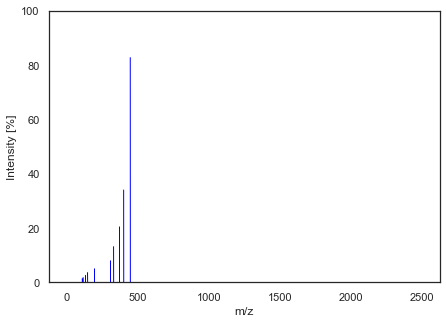

Matching spectra using cos_sim


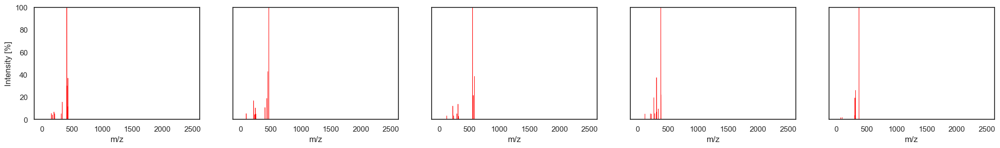

Matching spectra using eu_dist


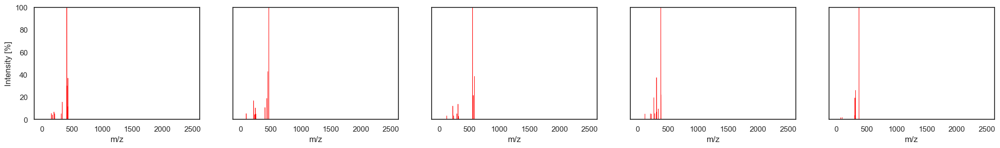

Matching spectra using per_diff


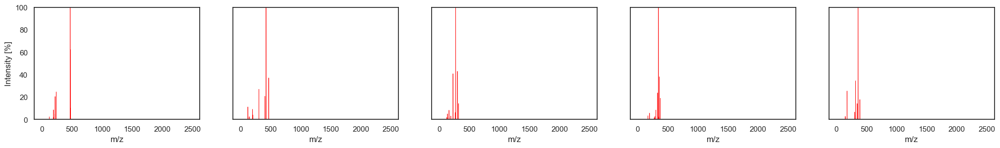

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_1
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.994182
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.993166
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.992737
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.992165
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.991715


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_1
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.107875
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.116910
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.120524
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.125183
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.128723


,id,spectrum,collision_energy,ionization_mode_id,per_diff_1
9161,QZZMDINWSWWNKM-UHFFFAOYSA-N,100.182007:0.000645 100.344673:0.000404 100.470970:0.000291 100.562584:0.000504 100.678017:0.000400 100.837578:0.003801 101.015846:0.000574 101.354004:0.000439 101.449173:0.000430 101.515404:0.000...,NaN,0,0.218020
94140,SNIHFZNFPCCTSV-UHFFFAOYSA-N,71.8524:0.2 101.1735:0.16 129.473:0.2 146.0841:2.64 147.0922:2.64 159.0914:0.24 175.0867:25.36 176.0943:0.43 178.0734:2.37 185.0949:1.74 220.4814:0.25 223.9227:0.18 275.3685:0.17 283.7831:0.19 302...,NaN,1,0.218317
108918,FGHPDPYCRTXYNZ-OZCXRYMJSA-N,74.3645:1.838551 75.35423:1.938366 93.22564:1.569818 93.42065:1.670331 103.65163:1.590060 108.23948:1.490943 114.70055:1.823893 117.5423:1.783408 120.96636:11.170907 126.23511:1.950232 145.99841:2...,0.0,1,0.219513
58399,DCOPUUMXTXDBNB-UHFFFAOYSA-N,74.000:0.502513 80.200:0.193274 130.600:0.154619 133.600:0.386548 141.000:0.193274 143.200:0.231929 145.300:0.154619 149.300:2.976421 162.200:0.463858 163.900:0.231929 165.800:0.154619 170.100:12....,10.0,1,0.221235
67132,UIFFUZWRFRDZJC-UHFFFAOYSA-N,136.034912:1.406759 164.032791:3.679876 191.084702:1.955739 219.080170:0.797735 237.091583:27.603362 238.096054:4.529079 239.098724:0.720535 247.074310:1.269514 265.089203:13.621547 266.092621:2.2...,NaN,1,0.226468


Intermediate spectrum


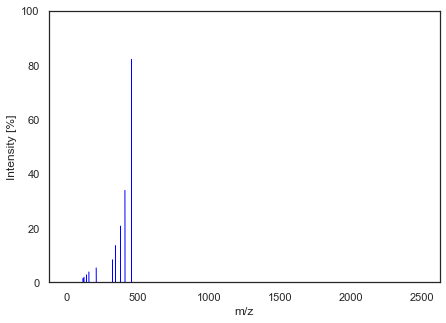

Matching spectra using cos_sim


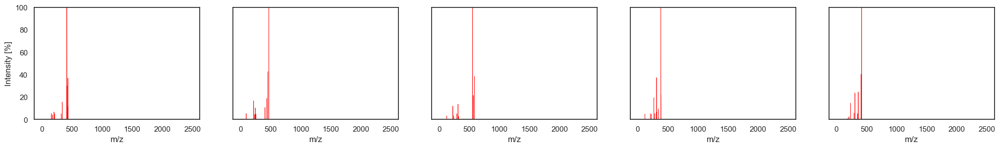

Matching spectra using eu_dist


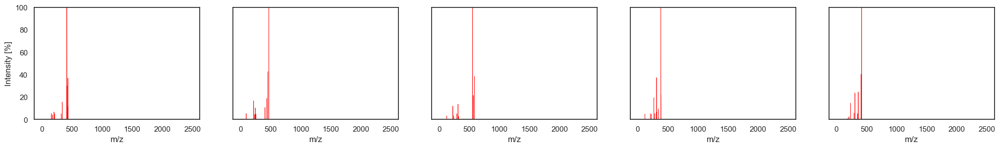

Matching spectra using per_diff


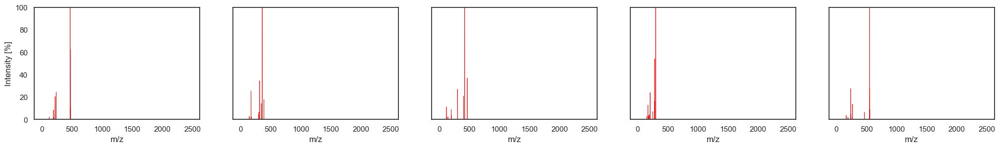

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_2
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.993930
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.992649
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.992565
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.991325
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.991232


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_2
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.110180
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.121249
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.121941
43183,GAIVGINVGXHEIA-ZAAJWPAISA-N,70.050934:0.016371 70.072578:0.011331 70.189728:0.006639 70.230156:0.005248 70.256454:0.006048 70.490211:0.006569 70.544296:0.006013 70.633270:0.006743 70.724617:0.008203 70.905754:0.003789 70.971...,NaN,1,0.131721
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.132425


,id,spectrum,collision_energy,ionization_mode_id,per_diff_2
94140,SNIHFZNFPCCTSV-UHFFFAOYSA-N,71.8524:0.2 101.1735:0.16 129.473:0.2 146.0841:2.64 147.0922:2.64 159.0914:0.24 175.0867:25.36 176.0943:0.43 178.0734:2.37 185.0949:1.74 220.4814:0.25 223.9227:0.18 275.3685:0.17 283.7831:0.19 302...,NaN,1,0.213197
67132,UIFFUZWRFRDZJC-UHFFFAOYSA-N,136.034912:1.406759 164.032791:3.679876 191.084702:1.955739 219.080170:0.797735 237.091583:27.603362 238.096054:4.529079 239.098724:0.720535 247.074310:1.269514 265.089203:13.621547 266.092621:2.2...,NaN,1,0.221675
9161,QZZMDINWSWWNKM-UHFFFAOYSA-N,100.182007:0.000645 100.344673:0.000404 100.470970:0.000291 100.562584:0.000504 100.678017:0.000400 100.837578:0.003801 101.015846:0.000574 101.354004:0.000439 101.449173:0.000430 101.515404:0.000...,NaN,0,0.223359
99487,AIFXMSDWXBFQTF-SNXGECCISA-N,50.276259:0.076165 50.425345:0.040760 50.540678:0.150771 50.829804:0.106358 50.830680:0.039121 50.873493:0.025761 52.673170:0.158988 52.739464:0.078154 53.033162:0.061219 53.035325:0.091763 53.060...,45.0,1,0.223363
108918,FGHPDPYCRTXYNZ-OZCXRYMJSA-N,74.3645:1.838551 75.35423:1.938366 93.22564:1.569818 93.42065:1.670331 103.65163:1.590060 108.23948:1.490943 114.70055:1.823893 117.5423:1.783408 120.96636:11.170907 126.23511:1.950232 145.99841:2...,0.0,1,0.224828


Intermediate spectrum


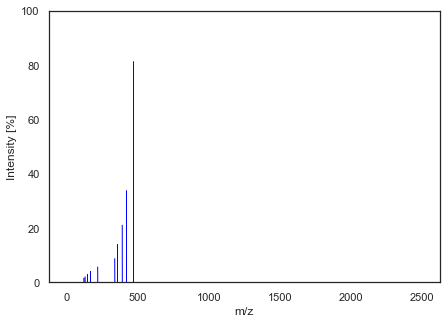

Matching spectra using cos_sim


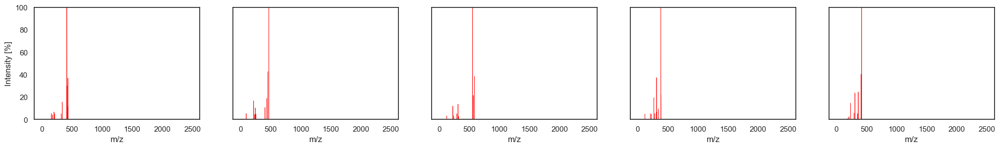

Matching spectra using eu_dist


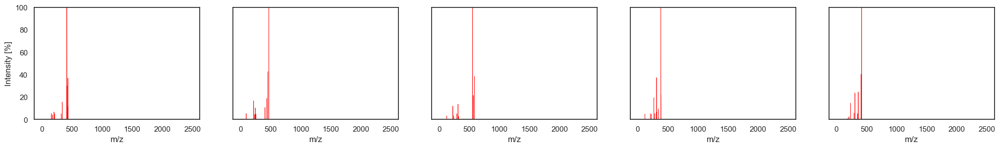

Matching spectra using per_diff


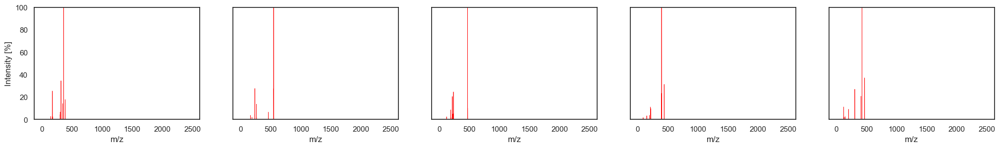

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_3
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.993714
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.992303
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.992205
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.991101
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.990871


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_3
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.112130
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.124075
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.124858
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.133411
61096,ACWBQPMHZXGDFX-QFIPXVFZSA-N,153.07:0.179835 178.0776:0.110543 180.0808:0.521599 190.0652:0.945738 206.084:0.370315 207.0916:2.478741 235.0977:14.465729 291.1492:5.778766 306.1714:23.572101 352.1769:5.160146 362.2227:24.51078...,35.0,1,0.135123


,id,spectrum,collision_energy,ionization_mode_id,per_diff_3
94140,SNIHFZNFPCCTSV-UHFFFAOYSA-N,71.8524:0.2 101.1735:0.16 129.473:0.2 146.0841:2.64 147.0922:2.64 159.0914:0.24 175.0867:25.36 176.0943:0.43 178.0734:2.37 185.0949:1.74 220.4814:0.25 223.9227:0.18 275.3685:0.17 283.7831:0.19 302...,NaN,1,0.214516
99487,AIFXMSDWXBFQTF-SNXGECCISA-N,50.276259:0.076165 50.425345:0.040760 50.540678:0.150771 50.829804:0.106358 50.830680:0.039121 50.873493:0.025761 52.673170:0.158988 52.739464:0.078154 53.033162:0.061219 53.035325:0.091763 53.060...,45.0,1,0.219597
42088,VJVGTGQETNCOEX-LQDZTQBFSA-N,141.09:1.679236 170.97:2.779582 171.01:3.782644 238.05:0.819280 263.26:1.553283 279.95:0.920341 327.08:2.457948 351.12:1.646702 355.09:2.420374 357.08:2.284332 366.7:1.169286 370.94:9.273428 385.1...,35.0,1,0.222788
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.222929
67132,UIFFUZWRFRDZJC-UHFFFAOYSA-N,136.034912:1.406759 164.032791:3.679876 191.084702:1.955739 219.080170:0.797735 237.091583:27.603362 238.096054:4.529079 239.098724:0.720535 247.074310:1.269514 265.089203:13.621547 266.092621:2.2...,NaN,1,0.225769


Intermediate spectrum


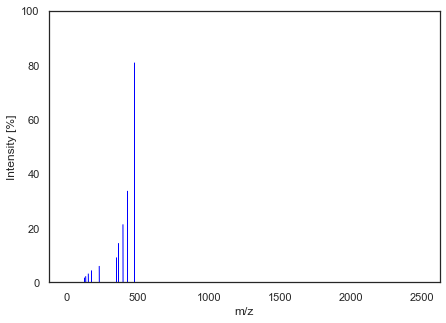

Matching spectra using cos_sim


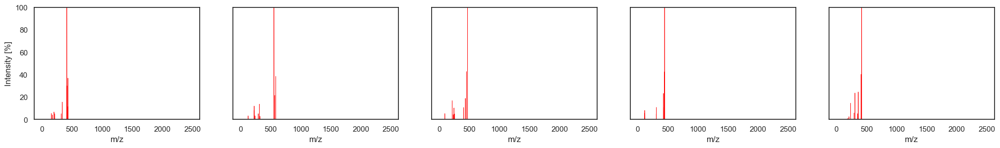

Matching spectra using eu_dist


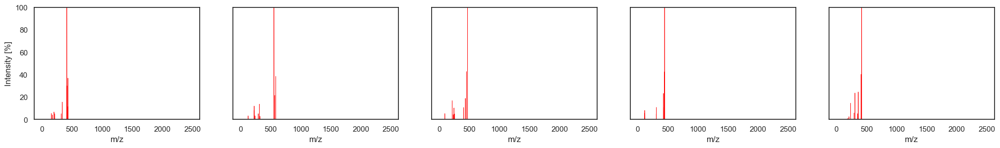

Matching spectra using per_diff


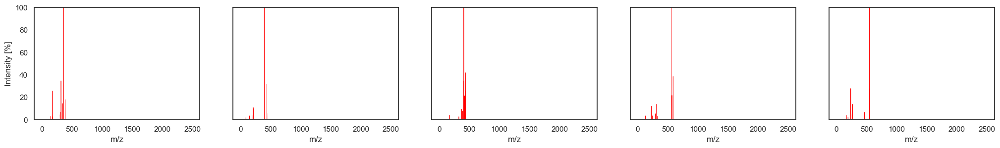

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_4
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.993277
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.991868
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.991563
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.991205
104977,XFZJEEAOWLFHDH-UHFFFAOYSA-N,82.33514:0.600000 125.02406:4.100000 143.11382:0.600000 161.0166:1.300000 179.0289:1.000000 201.05956:0.800000 245.03983:3.200000 287.05066:7.600000 287.06238:6.800000 288.58078:0.600000 289.07111...,10.0,0,0.990523


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_4
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.115956
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.127534
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.129896
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.132632
104977,XFZJEEAOWLFHDH-UHFFFAOYSA-N,82.33514:0.600000 125.02406:4.100000 143.11382:0.600000 161.0166:1.300000 179.0289:1.000000 201.05956:0.800000 245.03983:3.200000 287.05066:7.600000 287.06238:6.800000 288.58078:0.600000 289.07111...,10.0,0,0.137674


,id,spectrum,collision_energy,ionization_mode_id,per_diff_4
40976,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.142259:0.016031 50.383662:0.011717 50.732009:0.011573 50.771627:0.010454 50.941835:0.011203 51.056627:0.011342 51.759422:0.012947 51.840245:0.012847 52.059128:0.012697 52.943538:0.010560 53.029...,35.0,0,0.218364
94140,SNIHFZNFPCCTSV-UHFFFAOYSA-N,71.8524:0.2 101.1735:0.16 129.473:0.2 146.0841:2.64 147.0922:2.64 159.0914:0.24 175.0867:25.36 176.0943:0.43 178.0734:2.37 185.0949:1.74 220.4814:0.25 223.9227:0.18 275.3685:0.17 283.7831:0.19 302...,NaN,1,0.218969
33396,UGIFUOHGTIYUFC-AOVQYZRUSA-N,89.0258:1.021021 123.0431:2.386386 151.0753:1.679680 152.0078:1.275275 167.0352:38.804805 167.1051:1.584585 179.0507:1.007007 195.0639:2.936937 235.0618:3.413413 291.0878:23.850851 315.1233:10.787...,10.0,0,0.219937
42088,VJVGTGQETNCOEX-LQDZTQBFSA-N,141.09:1.679236 170.97:2.779582 171.01:3.782644 238.05:0.819280 263.26:1.553283 279.95:0.920341 327.08:2.457948 351.12:1.646702 355.09:2.420374 357.08:2.284332 366.7:1.169286 370.94:9.273428 385.1...,35.0,1,0.219976
99487,AIFXMSDWXBFQTF-SNXGECCISA-N,50.276259:0.076165 50.425345:0.040760 50.540678:0.150771 50.829804:0.106358 50.830680:0.039121 50.873493:0.025761 52.673170:0.158988 52.739464:0.078154 53.033162:0.061219 53.035325:0.091763 53.060...,45.0,1,0.220382


Intermediate spectrum


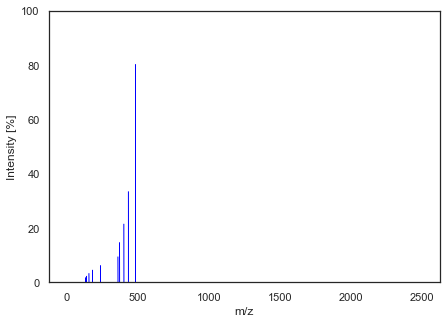

Matching spectra using cos_sim


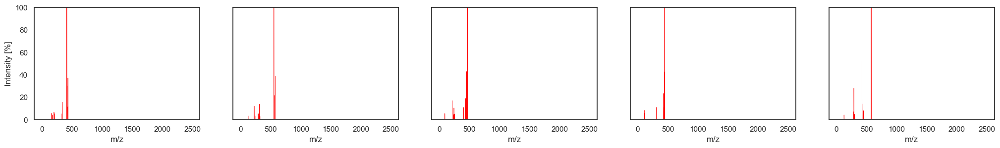

Matching spectra using eu_dist


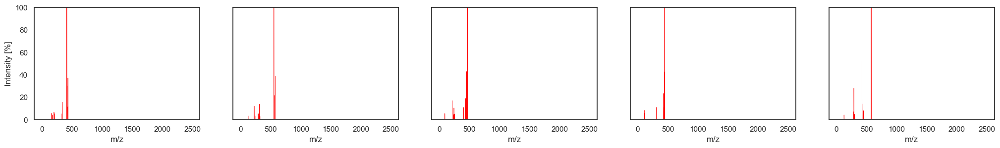

Matching spectra using per_diff


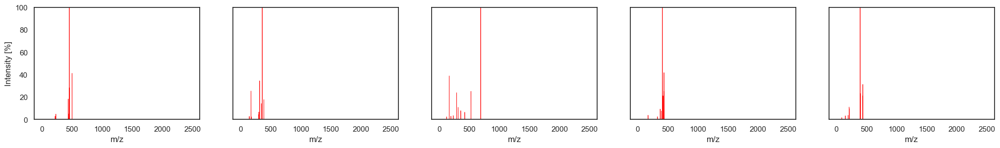

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_5
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.992535
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.991218
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.991075
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.990649
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.990432


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_5
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.122186
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.132530
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.133608
84399,RLTDMRMWVUCOAI-BOVQQMIFSA-N,69.0675:1.116116 79.0525:1.431431 81.0689:1.695696 93.0668:1.745746 95.084:5.224224 95.0892:2.515516 97.0633:1.112112 107.0832:3.554555 109.1:2.839840 119.0812:1.195195 119.0868:1.020020 121.0983:...,20.0,1,0.136755
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.138334


,id,spectrum,collision_energy,ionization_mode_id,per_diff_5
40976,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.142259:0.016031 50.383662:0.011717 50.732009:0.011573 50.771627:0.010454 50.941835:0.011203 51.056627:0.011342 51.759422:0.012947 51.840245:0.012847 52.059128:0.012697 52.943538:0.010560 53.029...,35.0,0,0.213488
96842,QNZCBYKSOIHPEH-UHFFFAOYSA-N,44.976006:0.104408 45.124287:0.094222 46.524097:0.119687 47.008640:0.089129 47.386028:0.114594 47.806198:0.114594 48.729874:0.127327 48.803539:0.142606 49.780277:0.168072 50.048851:0.137513 50.424...,NaN,1,0.214273
33396,UGIFUOHGTIYUFC-AOVQYZRUSA-N,89.0258:1.021021 123.0431:2.386386 151.0753:1.679680 152.0078:1.275275 167.0352:38.804805 167.1051:1.584585 179.0507:1.007007 195.0639:2.936937 235.0618:3.413413 291.0878:23.850851 315.1233:10.787...,10.0,0,0.214693
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.218128
42088,VJVGTGQETNCOEX-LQDZTQBFSA-N,141.09:1.679236 170.97:2.779582 171.01:3.782644 238.05:0.819280 263.26:1.553283 279.95:0.920341 327.08:2.457948 351.12:1.646702 355.09:2.420374 357.08:2.284332 366.7:1.169286 370.94:9.273428 385.1...,35.0,1,0.218270


Intermediate spectrum


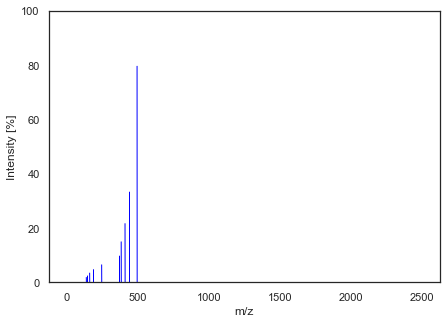

Matching spectra using cos_sim


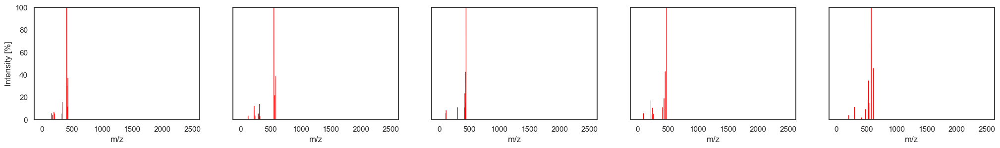

Matching spectra using eu_dist


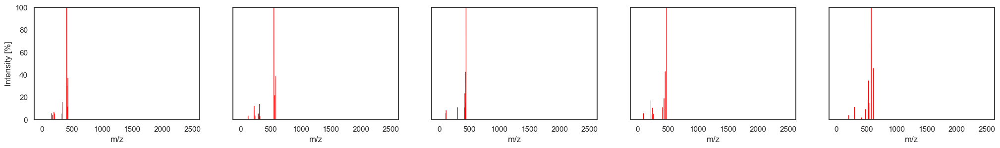

Matching spectra using per_diff


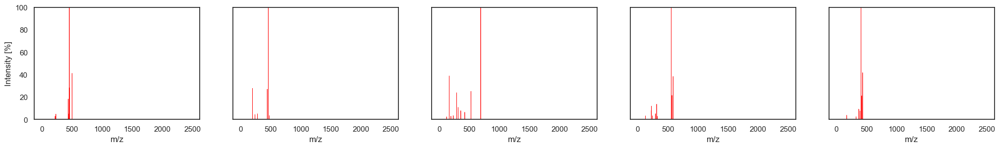

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_6
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.991434
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.990950
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.990657
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.990347
104977,XFZJEEAOWLFHDH-UHFFFAOYSA-N,82.33514:0.600000 125.02406:4.100000 143.11382:0.600000 161.0166:1.300000 179.0289:1.000000 201.05956:0.800000 245.03983:3.200000 287.05066:7.600000 287.06238:6.800000 288.58078:0.600000 289.07111...,10.0,0,0.989985


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_6
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.130891
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.134536
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.136696
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.138946
104977,XFZJEEAOWLFHDH-UHFFFAOYSA-N,82.33514:0.600000 125.02406:4.100000 143.11382:0.600000 161.0166:1.300000 179.0289:1.000000 201.05956:0.800000 245.03983:3.200000 287.05066:7.600000 287.06238:6.800000 288.58078:0.600000 289.07111...,10.0,0,0.141527


,id,spectrum,collision_energy,ionization_mode_id,per_diff_6
96842,QNZCBYKSOIHPEH-UHFFFAOYSA-N,44.976006:0.104408 45.124287:0.094222 46.524097:0.119687 47.008640:0.089129 47.386028:0.114594 47.806198:0.114594 48.729874:0.127327 48.803539:0.142606 49.780277:0.168072 50.048851:0.137513 50.424...,NaN,1,0.211553
33396,UGIFUOHGTIYUFC-AOVQYZRUSA-N,89.0258:1.021021 123.0431:2.386386 151.0753:1.679680 152.0078:1.275275 167.0352:38.804805 167.1051:1.584585 179.0507:1.007007 195.0639:2.936937 235.0618:3.413413 291.0878:23.850851 315.1233:10.787...,10.0,0,0.213278
40976,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.142259:0.016031 50.383662:0.011717 50.732009:0.011573 50.771627:0.010454 50.941835:0.011203 51.056627:0.011342 51.759422:0.012947 51.840245:0.012847 52.059128:0.012697 52.943538:0.010560 53.029...,35.0,0,0.213686
13091,HDDNZVWBRRAOGK-QVANJIRPSA-N,232.79:2.2840181589126587 253.12:2.740329146385193 289.12:3.563496470451355 312.25:1.5598628520965576 337.0:6.171160340309143 368.26:13.025024585658684 396.26:7.847477818979678 409.08:41.256951332...,35.0,1,0.215691
85296,YSNRSVKJRYQIIA-UHFFFAOYSA-N,88.639725:0.173252 91.765411:0.089420 99.044357:0.676242 111.090080:0.567261 114.358147:0.570055 119.665924:0.156486 123.081772:0.346504 126.819504:0.271056 127.087303:3.241491 130.086655:0.603588...,NaN,0,0.219793


Intermediate spectrum


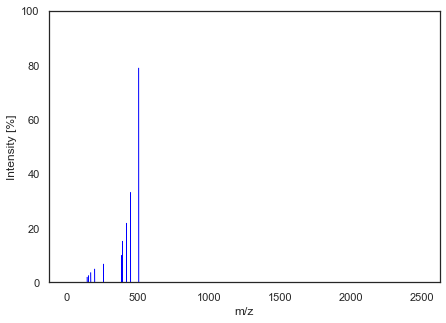

Matching spectra using cos_sim


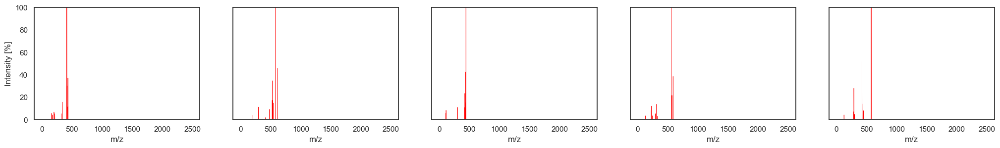

Matching spectra using eu_dist


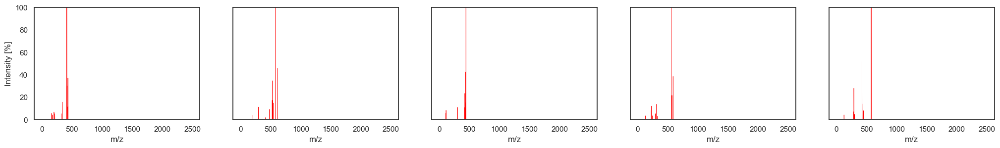

Matching spectra using per_diff


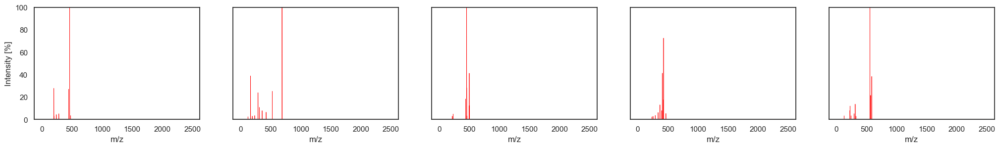

Match by scores


,id,spectrum,collision_energy,ionization_mode_id,cos_sim_7
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.991261
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.990036
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.989964
40976,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.142259:0.016031 50.383662:0.011717 50.732009:0.011573 50.771627:0.010454 50.941835:0.011203 51.056627:0.011342 51.759422:0.012947 51.840245:0.012847 52.059128:0.012697 52.943538:0.010560 53.029...,35.0,0,0.989754
72671,AUYYCJSJGJYCDS-LBPRGKRZSA-N,203.200:0.483871 225.200:2.419355 231.800:0.322581 233.000:0.483871 254.100:2.419355 286.900:1.935484 324.500:0.322581 335.100:0.645161 336.300:1.290323 363.000:0.806452 380.300:0.645161 381.600:1...,40.0,1,0.989714


,id,spectrum,collision_energy,ionization_mode_id,eu_dist_7
20675,QPTBIDGWTVNLQQ-UHFFFAOYSA-N,204.9:3.619949 299.06:11.065813 413.11:1.594549 482.17:9.003087 525.22:17.032692 533.19:34.583319 542.16:14.665445 577.12:100.000000 611.23:45.687383,35.0,0,0.132206
89767,GHCZAUBVMUEKKP-GYPHWSFCSA-N,75.553253:0.030943 76.039009:0.773563 76.551796:0.241352 76.607460:0.383687 76.769356:0.315614 78.624939:0.290860 79.485695:0.266106 80.052055:0.445572 80.295906:0.408441 80.809738:0.315614 81.500...,NaN,1,0.141170
46503,CLEXYFLHGFJONT-GDMKTYFQSA-N,50.042075:0.019173 50.299484:0.017731 51.039108:0.018787 52.604929:0.019389 53.933087:0.013585 54.919751:0.023687 54.922146:0.017633 55.054474:0.074024 55.988121:0.022211 57.070096:0.067654 57.918...,35.0,1,0.141679
40976,JJWKFIISZGZPHY-PTNCSMPOSA-N,50.142259:0.016031 50.383662:0.011717 50.732009:0.011573 50.771627:0.010454 50.941835:0.011203 51.056627:0.011342 51.759422:0.012947 51.840245:0.012847 52.059128:0.012697 52.943538:0.010560 53.029...,35.0,0,0.143147
72671,AUYYCJSJGJYCDS-LBPRGKRZSA-N,203.200:0.483871 225.200:2.419355 231.800:0.322581 233.000:0.483871 254.100:2.419355 286.900:1.935484 324.500:0.322581 335.100:0.645161 336.300:1.290323 363.000:0.806452 380.300:0.645161 381.600:1...,40.0,1,0.143432


,id,spectrum,collision_energy,ionization_mode_id,per_diff_7
13091,HDDNZVWBRRAOGK-QVANJIRPSA-N,232.79:2.2840181589126587 253.12:2.740329146385193 289.12:3.563496470451355 312.25:1.5598628520965576 337.0:6.171160340309143 368.26:13.025024585658684 396.26:7.847477818979678 409.08:41.256951332...,35.0,1,0.205704
96842,QNZCBYKSOIHPEH-UHFFFAOYSA-N,44.976006:0.104408 45.124287:0.094222 46.524097:0.119687 47.008640:0.089129 47.386028:0.114594 47.806198:0.114594 48.729874:0.127327 48.803539:0.142606 49.780277:0.168072 50.048851:0.137513 50.424...,NaN,1,0.208534
59734,CBVCZFGXHXORBI-PXQQMZJSSA-N,56.04714:0.068121 70.0599:0.045414 83.05562:0.045414 85.07316:0.045414 87.77634:0.022707 92.04631:0.068121 94.06342:0.169762 95.06511:0.045414 97.07475:2.485335 97.55237:0.045414 98.08118:0.379531...,35.0,1,0.209570
33396,UGIFUOHGTIYUFC-AOVQYZRUSA-N,89.0258:1.021021 123.0431:2.386386 151.0753:1.679680 152.0078:1.275275 167.0352:38.804805 167.1051:1.584585 179.0507:1.007007 195.0639:2.936937 235.0618:3.413413 291.0878:23.850851 315.1233:10.787...,10.0,0,0.215279
16674,JICKJYGLSKDGIC-UHFFFAOYSA-N,135.989365:0.972847 223.212311:4.263231 225.228348:1.997579 226.231781:0.566413 239.244659:1.029056 240.239380:4.306468 241.224411:4.561570 242.227661:1.080941 254.253998:0.760982 266.255219:9.153...,NaN,0,0.216742


Intermediate spectrum


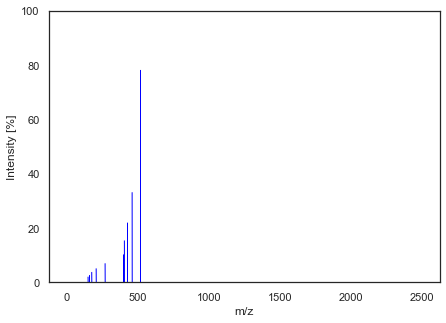

Matching spectra using cos_sim


KeyboardInterrupt: 

In [92]:
for ls in range(lerp_spectra.shape[0]):
    print('Page:', ls+1)
    visualize_matching_spectra(df_all, lerp_spectra[ls], data=data)